# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **1**, **3** and **5**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $2$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[102513.07919145  99311.49114414 103289.36311277 107907.47516136
  98836.78217111  98836.8632545  108210.8396583  103909.25524514
  97681.39567448 102748.19189447  97710.96299701  97699.67501518
 101216.39487923  90882.35636359  91741.80142467  97229.42162275
  95064.94010846 101582.64927056  95564.10889559  93186.14722757
 107598.51912228  98878.1631456  100338.00021993  93128.21875062
  97316.44990982 100555.8056843   94410.89003523 101895.05002056
  97043.27335419  98553.01252306  97038.09499273 109697.46842654
  99932.57873647  94851.98731243 104195.7937909   94081.93986744
 101049.13135016  90671.93084

Omni_P_RQi ================== 0.10069328216496305
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99311.49114413881, 'S': 10000, 'W': 10000, 'P': 0.10069328216496305, 'dP': 0}, 'j': {'R': 97920.02237289104, 'S': 10000, 'W': 10000, 'P': 0.10212415967307292}, 'k': {'R': 97920.02237289104, 'S': 10000, 'W': 10000, 'P': 0.10212415967307292}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.10069328216496301
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99311.49114413881, 'S': 10000, 'W': 10000, 'P': 0.10069328216496301, 'dP': 0}, 'j': {'R': 97920.02237289104, 'S': 10000, 'W': 10000, 'P': 0.10212415967307288}, 'k': {'R': 97920.02237289104, 'S': 10000, 'W': 10000, 'P': 0.10212415967307288}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10069328216496323
Initial Q HDX: 20000.00000000003
config_init_state  <cl

Omni_P_RQi ================== 0.09267198574562249
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 107907.47516136356, 'S': 10000, 'W': 10000, 'P': 0.09267198574562249, 'dP': 0}, 'j': {'R': 96070.40996773634, 'S': 10000, 'W': 10000, 'P': 0.1040903229554067}, 'k': {'R': 96070.40996773634, 'S': 10000, 'W': 10000, 'P': 0.1040903229554067}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09267198574562245
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 107907.47516136356, 'S': 10000, 'W': 10000, 'P': 0.09267198574562245, 'dP': 0}, 'j': {'R': 96070.40996773634, 'S': 10000, 'W': 10000, 'P': 0.10409032295540664}, 'k': {'R': 96070.40996773634, 'S': 10000, 'W': 10000, 'P': 0.10409032295540664}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.09267198574562266
Initial Q HDX: 20000.00000000003
config_init_state  <cl

Omni_P_RQi ================== 0.10117690783060336
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98836.7821711118, 'S': 10000, 'W': 10000, 'P': 0.10117690783060336, 'dP': 0}, 'j': {'R': 99197.31364865872, 'S': 10000, 'W': 10000, 'P': 0.1008091815411295}, 'k': {'R': 99197.31364865872, 'S': 10000, 'W': 10000, 'P': 0.1008091815411295}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.1011769078306034
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98836.7821711118, 'S': 10000, 'W': 10000, 'P': 0.1011769078306034, 'dP': 0}, 'j': {'R': 99197.31364865872, 'S': 10000, 'W': 10000, 'P': 0.10080918154112956}, 'k': {'R': 99197.31364865872, 'S': 10000, 'W': 10000, 'P': 0.10080918154112956}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10117690783060349
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts

Omni_P_RQi ================== 0.09241218376621953
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 108210.83965830287, 'S': 10000, 'W': 10000, 'P': 0.09241218376621953, 'dP': 0}, 'j': {'R': 109883.48942634628, 'S': 10000, 'W': 10000, 'P': 0.09100548273635678}, 'k': {'R': 109883.48942634628, 'S': 10000, 'W': 10000, 'P': 0.09100548273635678}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09241218376621987
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 108210.83965830287, 'S': 10000, 'W': 10000, 'P': 0.09241218376621987, 'dP': 0}, 'j': {'R': 109883.48942634628, 'S': 10000, 'W': 10000, 'P': 0.09100548273635713}, 'k': {'R': 109883.48942634628, 'S': 10000, 'W': 10000, 'P': 0.09100548273635713}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.09241218376621957
Initial Q HDX: 20000.000000000007
config_init_state  <class 'mod

Omni_P_RQi ================== 0.10237363963680719
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97681.39567448404, 'S': 10000, 'W': 10000, 'P': 0.10237363963680719, 'dP': 0}, 'j': {'R': 101295.2650144279, 'S': 10000, 'W': 10000, 'P': 0.09872129757077654}, 'k': {'R': 101295.2650144279, 'S': 10000, 'W': 10000, 'P': 0.09872129757077654}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.10237363963680712
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97681.39567448404, 'S': 10000, 'W': 10000, 'P': 0.10237363963680712, 'dP': 0}, 'j': {'R': 101295.2650144279, 'S': 10000, 'W': 10000, 'P': 0.09872129757077648}, 'k': {'R': 101295.2650144279, 'S': 10000, 'W': 10000, 'P': 0.09872129757077648}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10237363963680751
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.par

Omni_P_RQi ================== 0.10234266138903762
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97710.9629970121, 'S': 10000, 'W': 10000, 'P': 0.10234266138903762, 'dP': 0}, 'j': {'R': 90857.42374036137, 'S': 10000, 'W': 10000, 'P': 0.11006255282536388}, 'k': {'R': 90857.42374036137, 'S': 10000, 'W': 10000, 'P': 0.11006255282536388}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10234266138903785
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97710.9629970121, 'S': 10000, 'W': 10000, 'P': 0.10234266138903785, 'dP': 0}, 'j': {'R': 90857.42374036137, 'S': 10000, 'W': 10000, 'P': 0.11006255282536412}, 'k': {'R': 90857.42374036137, 'S': 10000, 'W': 10000, 'P': 0.11006255282536412}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.1023426613890376
Initial Q HDX: 19999.99999999998
config_init_state  <class

Omni_P_RQi ================== 0.10235448581017467
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97699.67501518092, 'S': 10000, 'W': 10000, 'P': 0.10235448581017467, 'dP': 0}, 'j': {'R': 99867.60109139713, 'S': 10000, 'W': 10000, 'P': 0.10013257443570897}, 'k': {'R': 99867.60109139713, 'S': 10000, 'W': 10000, 'P': 0.10013257443570897}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09879822346895262
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101216.39487923081, 'S': 10000, 'W': 10000, 'P': 0.09879822346895262, 'dP': 0}, 'j': {'R': 100301.41643333314, 'S': 10000, 'W': 10000, 'P': 0.09969948935513438}, 'k': {'R': 100301.41643333314, 'S': 10000, 'W': 10000, 'P': 0.09969948935513438}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09879822346895258
Initial Q HDX: 19999.999999999985
config_init_state  

Omni_P_RQi ================== 0.11003235831599574
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 90882.356363585, 'S': 10000, 'W': 10000, 'P': 0.11003235831599574, 'dP': 0}, 'j': {'R': 113098.08141478559, 'S': 10000, 'W': 10000, 'P': 0.08841882969990572}, 'k': {'R': 113098.08141478559, 'S': 10000, 'W': 10000, 'P': 0.08841882969990572}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.1100323583159958
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 90882.356363585, 'S': 10000, 'W': 10000, 'P': 0.1100323583159958, 'dP': 0}, 'j': {'R': 113098.08141478559, 'S': 10000, 'W': 10000, 'P': 0.08841882969990576}, 'k': {'R': 113098.08141478559, 'S': 10000, 'W': 10000, 'P': 0.08841882969990576}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.11003235831599589
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.p

Omni_P_RQi ================== 0.10284952674922163
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97229.42162274636, 'S': 10000, 'W': 10000, 'P': 0.10284952674922163, 'dP': 0}, 'j': {'R': 101518.20504923044, 'S': 10000, 'W': 10000, 'P': 0.09850449971165841}, 'k': {'R': 101518.20504923044, 'S': 10000, 'W': 10000, 'P': 0.09850449971165841}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10284952674922201
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97229.42162274636, 'S': 10000, 'W': 10000, 'P': 0.10284952674922201, 'dP': 0}, 'j': {'R': 101518.20504923044, 'S': 10000, 'W': 10000, 'P': 0.09850449971165878}, 'k': {'R': 101518.20504923044, 'S': 10000, 'W': 10000, 'P': 0.09850449971165878}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10284952674922168
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model

Omni_P_RQi ================== 0.09844200827412714
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101582.6492705578, 'S': 10000, 'W': 10000, 'P': 0.09844200827412714, 'dP': 0}, 'j': {'R': 94327.49870920325, 'S': 10000, 'W': 10000, 'P': 0.10601362420123557}, 'k': {'R': 94327.49870920325, 'S': 10000, 'W': 10000, 'P': 0.10601362420123557}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09844200827412708
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101582.6492705578, 'S': 10000, 'W': 10000, 'P': 0.09844200827412708, 'dP': 0}, 'j': {'R': 94327.49870920325, 'S': 10000, 'W': 10000, 'P': 0.10601362420123549}, 'k': {'R': 94327.49870920325, 'S': 10000, 'W': 10000, 'P': 0.10601362420123549}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09844200827412744
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.par

Omni_P_RQi ================== 0.10731208766019151
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 93186.14722756544, 'S': 10000, 'W': 10000, 'P': 0.10731208766019151, 'dP': 0}, 'j': {'R': 103828.79819198631, 'S': 10000, 'W': 10000, 'P': 0.09631239284412552}, 'k': {'R': 103828.79819198631, 'S': 10000, 'W': 10000, 'P': 0.09631239284412552}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.10731208766019125
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 93186.14722756544, 'S': 10000, 'W': 10000, 'P': 0.10731208766019125, 'dP': 0}, 'j': {'R': 103828.79819198631, 'S': 10000, 'W': 10000, 'P': 0.09631239284412528}, 'k': {'R': 103828.79819198631, 'S': 10000, 'W': 10000, 'P': 0.09631239284412528}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10731208766019142
Initial Q HDX: 20000.000000000015
config_init_state 

Omni_P_RQi ================== 0.10113456482069816
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98878.16314559751, 'S': 10000, 'W': 10000, 'P': 0.10113456482069816, 'dP': 0}, 'j': {'R': 95557.5986771451, 'S': 10000, 'W': 10000, 'P': 0.10464892523917871}, 'k': {'R': 95557.5986771451, 'S': 10000, 'W': 10000, 'P': 0.10464892523917871}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10113456482069855
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98878.16314559751, 'S': 10000, 'W': 10000, 'P': 0.10113456482069855, 'dP': 0}, 'j': {'R': 95557.5986771451, 'S': 10000, 'W': 10000, 'P': 0.1046489252391791}, 'k': {'R': 95557.5986771451, 'S': 10000, 'W': 10000, 'P': 0.1046489252391791}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10113456482069821
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.ass

Omni_P_RQi ================== 0.10737883891861452
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 93128.21875061702, 'S': 10000, 'W': 10000, 'P': 0.10737883891861452, 'dP': 0}, 'j': {'R': 93234.83159859585, 'S': 10000, 'W': 10000, 'P': 0.10725605257757127}, 'k': {'R': 93234.83159859585, 'S': 10000, 'W': 10000, 'P': 0.10725605257757127}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10737883891861492
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 93128.21875061702, 'S': 10000, 'W': 10000, 'P': 0.10737883891861492, 'dP': 0}, 'j': {'R': 93234.83159859585, 'S': 10000, 'W': 10000, 'P': 0.10725605257757168}, 'k': {'R': 93234.83159859585, 'S': 10000, 'W': 10000, 'P': 0.10725605257757168}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10737883891861456
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.par

Omni_P_RQi ================== 0.09944726644024711
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100555.80568429717, 'S': 10000, 'W': 10000, 'P': 0.09944726644024711, 'dP': 0}, 'j': {'R': 111566.92199067681, 'S': 10000, 'W': 10000, 'P': 0.08963230159594861}, 'k': {'R': 111566.92199067681, 'S': 10000, 'W': 10000, 'P': 0.08963230159594861}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.09944726644024687
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100555.80568429717, 'S': 10000, 'W': 10000, 'P': 0.09944726644024687, 'dP': 0}, 'j': {'R': 111566.92199067681, 'S': 10000, 'W': 10000, 'P': 0.0896323015959484}, 'k': {'R': 111566.92199067681, 'S': 10000, 'W': 10000, 'P': 0.0896323015959484}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.09944726644024703
Initial Q HDX: 20000.000000000015
config_init_state 

Omni_P_RQi ================== 0.09814019422908056
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101895.05002056363, 'S': 10000, 'W': 10000, 'P': 0.09814019422908056, 'dP': 0}, 'j': {'R': 97209.94026980558, 'S': 10000, 'W': 10000, 'P': 0.10287013830319262}, 'k': {'R': 97209.94026980558, 'S': 10000, 'W': 10000, 'P': 0.10287013830319262}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.09814019422908078
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101895.05002056363, 'S': 10000, 'W': 10000, 'P': 0.09814019422908078, 'dP': 0}, 'j': {'R': 97209.94026980558, 'S': 10000, 'W': 10000, 'P': 0.10287013830319285}, 'k': {'R': 97209.94026980558, 'S': 10000, 'W': 10000, 'P': 0.10287013830319285}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.09814019422908053
Initial Q HDX: 19999.99999999998
config_init_state  <

config_param a value =============  1.06
Omni_P_RQi ================== 0.10304681256476146
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97043.27335418882, 'S': 10000, 'W': 10000, 'P': 0.10304681256476146, 'dP': 0}, 'j': {'R': 100499.1876465191, 'S': 10000, 'W': 10000, 'P': 0.09950329185915928}, 'k': {'R': 100499.1876465191, 'S': 10000, 'W': 10000, 'P': 0.09950329185915928}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10304681256476154
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97043.27335418882, 'S': 10000, 'W': 10000, 'P': 0.10304681256476154, 'dP': 0}, 'j': {'R': 100499.1876465191, 'S': 10000, 'W': 10000, 'P': 0.09950329185915936}, 'k': {'R': 100499.1876465191, 'S': 10000, 'W': 10000, 'P': 0.09950329185915936}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.10146823261906605
Initial Q HDX: 

Omni_P_RQi ================== 0.10305231157670228
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97038.09499272605, 'S': 10000, 'W': 10000, 'P': 0.10305231157670228, 'dP': 0}, 'j': {'R': 92544.11105846116, 'S': 10000, 'W': 10000, 'P': 0.10805657848593873}, 'k': {'R': 92544.11105846116, 'S': 10000, 'W': 10000, 'P': 0.10805657848593873}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10305231157670193
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97038.09499272605, 'S': 10000, 'W': 10000, 'P': 0.10305231157670193, 'dP': 0}, 'j': {'R': 92544.11105846116, 'S': 10000, 'W': 10000, 'P': 0.10805657848593837}, 'k': {'R': 92544.11105846116, 'S': 10000, 'W': 10000, 'P': 0.10805657848593837}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.10305231157670189
Initial Q HDX: 20000.0
config_init_state  <class 'mode

Omni_P_RQi ================== 0.10006746675046431
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99932.57873647123, 'S': 10000, 'W': 10000, 'P': 0.10006746675046431, 'dP': 0}, 'j': {'R': 94830.22166713368, 'S': 10000, 'W': 10000, 'P': 0.10545161472996743}, 'k': {'R': 94830.22166713368, 'S': 10000, 'W': 10000, 'P': 0.10545161472996743}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10006746675046446
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99932.57873647123, 'S': 10000, 'W': 10000, 'P': 0.10006746675046446, 'dP': 0}, 'j': {'R': 94830.22166713368, 'S': 10000, 'W': 10000, 'P': 0.1054516147299676}, 'k': {'R': 94830.22166713368, 'S': 10000, 'W': 10000, 'P': 0.1054516147299676}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.1000674667504644
Initial Q HDX: 20000
config_init_state  <class 'model.part

Omni_P_RQi ================== 0.09597316394621357
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 104195.79379090095, 'S': 10000, 'W': 10000, 'P': 0.09597316394621357, 'dP': 0}, 'j': {'R': 95509.6860968243, 'S': 10000, 'W': 10000, 'P': 0.10470142253281364}, 'k': {'R': 95509.6860968243, 'S': 10000, 'W': 10000, 'P': 0.10470142253281364}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09597316394621351
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 104195.79379090095, 'S': 10000, 'W': 10000, 'P': 0.09597316394621351, 'dP': 0}, 'j': {'R': 95509.6860968243, 'S': 10000, 'W': 10000, 'P': 0.1047014225328136}, 'k': {'R': 95509.6860968243, 'S': 10000, 'W': 10000, 'P': 0.1047014225328136}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.09597316394621373
Initial Q HDX: 20000.00000000003
config_init_state  <class 

Omni_P_RQi ================== 0.10629032537051668
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 94081.93986744397, 'S': 10000, 'W': 10000, 'P': 0.10629032537051668, 'dP': 0}, 'j': {'R': 108052.64221303716, 'S': 10000, 'W': 10000, 'P': 0.09254748236775137}, 'k': {'R': 108052.64221303716, 'S': 10000, 'W': 10000, 'P': 0.09254748236775137}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10629032537051677
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 94081.93986744397, 'S': 10000, 'W': 10000, 'P': 0.10629032537051677, 'dP': 0}, 'j': {'R': 108052.64221303716, 'S': 10000, 'W': 10000, 'P': 0.09254748236775145}, 'k': {'R': 108052.64221303716, 'S': 10000, 'W': 10000, 'P': 0.09254748236775145}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.0989617611392191
Initial Q HDX: 19999.999999999996
config_init_state  

Omni_P_RQi ================== 0.1102877142592585
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 90671.93084165812, 'S': 10000, 'W': 10000, 'P': 0.1102877142592585, 'dP': 0}, 'j': {'R': 98403.57758753373, 'S': 10000, 'W': 10000, 'P': 0.10162232151676251}, 'k': {'R': 98403.57758753373, 'S': 10000, 'W': 10000, 'P': 0.10162232151676251}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.11028771425925812
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 90671.93084165812, 'S': 10000, 'W': 10000, 'P': 0.11028771425925812, 'dP': 0}, 'j': {'R': 98403.57758753373, 'S': 10000, 'W': 10000, 'P': 0.10162232151676218}, 'k': {'R': 98403.57758753373, 'S': 10000, 'W': 10000, 'P': 0.10162232151676218}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.11028771425925808
Initial Q HDX: 20000.0
config_init_state  <class 'model.

Omni_P_RQi ================== 0.09902113060277905
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100988.54597121067, 'S': 10000, 'W': 10000, 'P': 0.09902113060277905, 'dP': 0}, 'j': {'R': 94034.84289419878, 'S': 10000, 'W': 10000, 'P': 0.1063435604529194}, 'k': {'R': 94034.84289419878, 'S': 10000, 'W': 10000, 'P': 0.1063435604529194}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09902113060277898
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100988.54597121067, 'S': 10000, 'W': 10000, 'P': 0.09902113060277898, 'dP': 0}, 'j': {'R': 94034.84289419878, 'S': 10000, 'W': 10000, 'P': 0.10634356045291932}, 'k': {'R': 94034.84289419878, 'S': 10000, 'W': 10000, 'P': 0.10634356045291932}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09902113060277935
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.par

Omni_P_RQi ================== 0.0991473492583837
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100859.98339642384, 'S': 10000, 'W': 10000, 'P': 0.0991473492583837, 'dP': 0}, 'j': {'R': 106749.66679158108, 'S': 10000, 'W': 10000, 'P': 0.09367710739110874}, 'k': {'R': 106749.66679158108, 'S': 10000, 'W': 10000, 'P': 0.09367710739110874}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.09914734925838346
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100859.98339642384, 'S': 10000, 'W': 10000, 'P': 0.09914734925838346, 'dP': 0}, 'j': {'R': 106749.66679158108, 'S': 10000, 'W': 10000, 'P': 0.0936771073911085}, 'k': {'R': 106749.66679158108, 'S': 10000, 'W': 10000, 'P': 0.0936771073911085}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.09914734925838362
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.10057955344999196
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99423.78601802007, 'S': 10000, 'W': 10000, 'P': 0.10057955344999196, 'dP': 0}, 'j': {'R': 92281.73090248562, 'S': 10000, 'W': 10000, 'P': 0.10836381049860283}, 'k': {'R': 92281.73090248562, 'S': 10000, 'W': 10000, 'P': 0.10836381049860283}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.10151595456865901
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98506.68343207694, 'S': 10000, 'W': 10000, 'P': 0.10151595456865901, 'dP': 0}, 'j': {'R': 100926.86210036145, 'S': 10000, 'W': 10000, 'P': 0.09908164974014569}, 'k': {'R': 100926.86210036145, 'S': 10000, 'W': 10000, 'P': 0.09908164974014569}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.10151595456865896
Initial Q HDX: 19999.999999999985
config_init_state  <

Omni_P_RQi ================== 0.10366244836675678
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96466.9478442192, 'S': 10000, 'W': 10000, 'P': 0.10366244836675678, 'dP': 0}, 'j': {'R': 103983.98850868776, 'S': 10000, 'W': 10000, 'P': 0.09616865195707032}, 'k': {'R': 103983.98850868776, 'S': 10000, 'W': 10000, 'P': 0.09616865195707032}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.103662448366757
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96466.9478442192, 'S': 10000, 'W': 10000, 'P': 0.103662448366757, 'dP': 0}, 'j': {'R': 103983.98850868776, 'S': 10000, 'W': 10000, 'P': 0.09616865195707053}, 'k': {'R': 103983.98850868776, 'S': 10000, 'W': 10000, 'P': 0.09616865195707053}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.10366244836675675
Initial Q HDX: 19999.99999999998
config_init_state  <clas

Omni_P_RQi ================== 0.10232845113831956
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97724.53202172287, 'S': 10000, 'W': 10000, 'P': 0.10232845113831956, 'dP': 0}, 'j': {'R': 94006.24844659505, 'S': 10000, 'W': 10000, 'P': 0.10637590761513063}, 'k': {'R': 94006.24844659505, 'S': 10000, 'W': 10000, 'P': 0.10637590761513063}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09485477759206822
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 105424.31550475956, 'S': 10000, 'W': 10000, 'P': 0.09485477759206822, 'dP': 0}, 'j': {'R': 93614.80685036816, 'S': 10000, 'W': 10000, 'P': 0.10682070856572698}, 'k': {'R': 93614.80685036816, 'S': 10000, 'W': 10000, 'P': 0.10682070856572698}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09485477759206817
Initial Q HDX: 19999.999999999985
config_init_state  <c

Omni_P_RQi ================== 0.09829763767407462
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101731.84459586903, 'S': 10000, 'W': 10000, 'P': 0.09829763767407462, 'dP': 0}, 'j': {'R': 102642.38695563708, 'S': 10000, 'W': 10000, 'P': 0.09742563765905099}, 'k': {'R': 102642.38695563708, 'S': 10000, 'W': 10000, 'P': 0.09742563765905099}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.09829763767407466
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101731.84459586903, 'S': 10000, 'W': 10000, 'P': 0.09829763767407466, 'dP': 0}, 'j': {'R': 102642.38695563708, 'S': 10000, 'W': 10000, 'P': 0.09742563765905103}, 'k': {'R': 102642.38695563708, 'S': 10000, 'W': 10000, 'P': 0.09742563765905103}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.09829763767407475
Initial Q HDX: 20000.000000000022
config_init_state  <class 

Omni_P_RQi ================== 0.09839363346941252
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101632.5919411106, 'S': 10000, 'W': 10000, 'P': 0.09839363346941252, 'dP': 0}, 'j': {'R': 101259.5488517099, 'S': 10000, 'W': 10000, 'P': 0.09875611844414356}, 'k': {'R': 101259.5488517099, 'S': 10000, 'W': 10000, 'P': 0.09875611844414356}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.0983936334694126
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101632.5919411106, 'S': 10000, 'W': 10000, 'P': 0.0983936334694126, 'dP': 0}, 'j': {'R': 101259.5488517099, 'S': 10000, 'W': 10000, 'P': 0.09875611844414364}, 'k': {'R': 101259.5488517099, 'S': 10000, 'W': 10000, 'P': 0.09875611844414364}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.10194284187646555
Initial Q HDX: 19999.999999999996
config_init_state  <clas

Omni_P_RQi ================== 0.10344035441966042
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96674.06938137251, 'S': 10000, 'W': 10000, 'P': 0.10344035441966042, 'dP': 0}, 'j': {'R': 96659.08226946872, 'S': 10000, 'W': 10000, 'P': 0.10345639297631393}, 'k': {'R': 96659.08226946872, 'S': 10000, 'W': 10000, 'P': 0.10345639297631393}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09698976530226798
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103103.6622146168, 'S': 10000, 'W': 10000, 'P': 0.09698976530226798, 'dP': 0}, 'j': {'R': 101167.30410958314, 'S': 10000, 'W': 10000, 'P': 0.09884616465778434}, 'k': {'R': 101167.30410958314, 'S': 10000, 'W': 10000, 'P': 0.09884616465778434}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09698976530226794
Initial Q HDX: 19999.999999999985
config_init_state  <

Omni_P_RQi ================== 0.09497867427092196
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 105286.79281704333, 'S': 10000, 'W': 10000, 'P': 0.09497867427092196, 'dP': 0}, 'j': {'R': 101475.22332587771, 'S': 10000, 'W': 10000, 'P': 0.09854622312962039}, 'k': {'R': 101475.22332587771, 'S': 10000, 'W': 10000, 'P': 0.09854622312962039}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09497867427092192
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 105286.79281704333, 'S': 10000, 'W': 10000, 'P': 0.09497867427092192, 'dP': 0}, 'j': {'R': 101475.22332587771, 'S': 10000, 'W': 10000, 'P': 0.09854622312962034}, 'k': {'R': 101475.22332587771, 'S': 10000, 'W': 10000, 'P': 0.09854622312962034}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.09497867427092196
Initial Q HDX: 20000.00000000001
config_init_state  <class 

Omni_P_RQi ================== 0.10428263654357253
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 95893.24101737393, 'S': 10000, 'W': 10000, 'P': 0.10428263654357253, 'dP': 0}, 'j': {'R': 109771.47281760647, 'S': 10000, 'W': 10000, 'P': 0.09109834953764132}, 'k': {'R': 109771.47281760647, 'S': 10000, 'W': 10000, 'P': 0.09109834953764132}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.10428263654357246
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 95893.24101737393, 'S': 10000, 'W': 10000, 'P': 0.10428263654357246, 'dP': 0}, 'j': {'R': 109771.47281760647, 'S': 10000, 'W': 10000, 'P': 0.09109834953764126}, 'k': {'R': 109771.47281760647, 'S': 10000, 'W': 10000, 'P': 0.09109834953764126}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10428263654357285
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model

Omni_P_RQi ================== 0.09835834117823286
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101669.05907735114, 'S': 10000, 'W': 10000, 'P': 0.09835834117823286, 'dP': 0}, 'j': {'R': 94220.91542352289, 'S': 10000, 'W': 10000, 'P': 0.10613354747244844}, 'k': {'R': 94220.91542352289, 'S': 10000, 'W': 10000, 'P': 0.10613354747244844}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.09835834117823263
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101669.05907735114, 'S': 10000, 'W': 10000, 'P': 0.09835834117823263, 'dP': 0}, 'j': {'R': 94220.91542352289, 'S': 10000, 'W': 10000, 'P': 0.10613354747244817}, 'k': {'R': 94220.91542352289, 'S': 10000, 'W': 10000, 'P': 0.10613354747244817}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.09835834117823278
Initial Q HDX: 20000.000000000015
config_init_state  <

Omni_P_RQi ================== 0.09524222412616849
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 104995.44809823945, 'S': 10000, 'W': 10000, 'P': 0.09524222412616849, 'dP': 0}, 'j': {'R': 103335.12804696502, 'S': 10000, 'W': 10000, 'P': 0.09677251278437561}, 'k': {'R': 103335.12804696502, 'S': 10000, 'W': 10000, 'P': 0.09677251278437561}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.10242327113139256
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97634.06196206727, 'S': 10000, 'W': 10000, 'P': 0.10242327113139256, 'dP': 0}, 'j': {'R': 95246.33352612631, 'S': 10000, 'W': 10000, 'P': 0.10499091807305078}, 'k': {'R': 95246.33352612631, 'S': 10000, 'W': 10000, 'P': 0.10499091807305078}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.10242327113139252
Initial Q HDX: 19999.999999999985
config_init_state  

Omni_P_RQi ================== 0.10093203210177361
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99076.57452013469, 'S': 10000, 'W': 10000, 'P': 0.10093203210177361, 'dP': 0}, 'j': {'R': 104011.33182204333, 'S': 10000, 'W': 10000, 'P': 0.09614337038880873}, 'k': {'R': 104011.33182204333, 'S': 10000, 'W': 10000, 'P': 0.09614337038880873}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10093203210177366
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99076.57452013469, 'S': 10000, 'W': 10000, 'P': 0.10093203210177366, 'dP': 0}, 'j': {'R': 104011.33182204333, 'S': 10000, 'W': 10000, 'P': 0.09614337038880877}, 'k': {'R': 104011.33182204333, 'S': 10000, 'W': 10000, 'P': 0.09614337038880877}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10093203210177375
Initial Q HDX: 20000.000000000022
config_init_state  <class 'm

Omni_P_RQi ================== 0.10615955373050641
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 94197.8338132972, 'S': 10000, 'W': 10000, 'P': 0.10615955373050641, 'dP': 0}, 'j': {'R': 95982.09673400784, 'S': 10000, 'W': 10000, 'P': 0.10418609657708065}, 'k': {'R': 95982.09673400784, 'S': 10000, 'W': 10000, 'P': 0.10418609657708065}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10615955373050605
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 94197.8338132972, 'S': 10000, 'W': 10000, 'P': 0.10615955373050605, 'dP': 0}, 'j': {'R': 95982.09673400784, 'S': 10000, 'W': 10000, 'P': 0.1041860965770803}, 'k': {'R': 95982.09673400784, 'S': 10000, 'W': 10000, 'P': 0.1041860965770803}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.106159553730506
Initial Q HDX: 20000.0
config_init_state  <class 'model.part

Omni_P_RQi ================== 0.09344756807597639
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 107011.8806288213, 'S': 10000, 'W': 10000, 'P': 0.09344756807597639, 'dP': 0}, 'j': {'R': 102084.03538107584, 'S': 10000, 'W': 10000, 'P': 0.09795850999297212}, 'k': {'R': 102084.03538107584, 'S': 10000, 'W': 10000, 'P': 0.09795850999297212}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.09344756807597608
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 107011.8806288213, 'S': 10000, 'W': 10000, 'P': 0.09344756807597608, 'dP': 0}, 'j': {'R': 102084.03538107584, 'S': 10000, 'W': 10000, 'P': 0.0979585099929718}, 'k': {'R': 102084.03538107584, 'S': 10000, 'W': 10000, 'P': 0.0979585099929718}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09344756807597604
Initial Q HDX: 20000.0
config_init_state  <class 'mo

Omni_P_RQi ================== 0.09510911953336725
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 105142.38854342137, 'S': 10000, 'W': 10000, 'P': 0.09510911953336725, 'dP': 0}, 'j': {'R': 109941.74564565136, 'S': 10000, 'W': 10000, 'P': 0.09095726051349583}, 'k': {'R': 109941.74564565136, 'S': 10000, 'W': 10000, 'P': 0.09095726051349583}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09510911953336719
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 105142.38854342137, 'S': 10000, 'W': 10000, 'P': 0.09510911953336719, 'dP': 0}, 'j': {'R': 109941.74564565136, 'S': 10000, 'W': 10000, 'P': 0.09095726051349576}, 'k': {'R': 109941.74564565136, 'S': 10000, 'W': 10000, 'P': 0.09095726051349576}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09510911953336755
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.103276105843362
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96827.81819026882, 'S': 10000, 'W': 10000, 'P': 0.103276105843362, 'dP': 0}, 'j': {'R': 96303.7154584188, 'S': 10000, 'W': 10000, 'P': 0.1038381536205395}, 'k': {'R': 96303.7154584188, 'S': 10000, 'W': 10000, 'P': 0.1038381536205395}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.10327610584336175
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 96827.81819026882, 'S': 10000, 'W': 10000, 'P': 0.10327610584336175, 'dP': 0}, 'j': {'R': 96303.7154584188, 'S': 10000, 'W': 10000, 'P': 0.10383815362053923}, 'k': {'R': 96303.7154584188, 'S': 10000, 'W': 10000, 'P': 0.10383815362053923}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.10327610584336192
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model

Omni_P_RQi ================== 0.09821035757225302
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101822.25426318246, 'S': 10000, 'W': 10000, 'P': 0.09821035757225302, 'dP': 0}, 'j': {'R': 95652.53747200772, 'S': 10000, 'W': 10000, 'P': 0.10454505718603092}, 'k': {'R': 95652.53747200772, 'S': 10000, 'W': 10000, 'P': 0.10454505718603092}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.09260252011352049
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 107988.4217809742, 'S': 10000, 'W': 10000, 'P': 0.09260252011352049, 'dP': 0}, 'j': {'R': 96005.46638392861, 'S': 10000, 'W': 10000, 'P': 0.10416073559821805}, 'k': {'R': 96005.46638392861, 'S': 10000, 'W': 10000, 'P': 0.10416073559821805}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09260252011352045
Initial Q HDX: 19999.999999999985
config_init_state  <c

Omni_P_RQi ================== 0.10017917872411247
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99821.14175181459, 'S': 10000, 'W': 10000, 'P': 0.10017917872411247, 'dP': 0}, 'j': {'R': 99615.47327475176, 'S': 10000, 'W': 10000, 'P': 0.10038601104086277}, 'k': {'R': 99615.47327475176, 'S': 10000, 'W': 10000, 'P': 0.10038601104086277}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.10017917872411251
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99821.14175181459, 'S': 10000, 'W': 10000, 'P': 0.10017917872411251, 'dP': 0}, 'j': {'R': 99615.47327475176, 'S': 10000, 'W': 10000, 'P': 0.10038601104086282}, 'k': {'R': 99615.47327475176, 'S': 10000, 'W': 10000, 'P': 0.10038601104086282}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10017917872411261
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model

Omni_P_RQi ================== 0.11398600581305054
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 87730.0676400671, 'S': 10000, 'W': 10000, 'P': 0.11398600581305054, 'dP': 0}, 'j': {'R': 101392.19249038094, 'S': 10000, 'W': 10000, 'P': 0.09862692337922077}, 'k': {'R': 101392.19249038094, 'S': 10000, 'W': 10000, 'P': 0.09862692337922077}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.11398600581305049
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 87730.0676400671, 'S': 10000, 'W': 10000, 'P': 0.11398600581305049, 'dP': 0}, 'j': {'R': 101392.19249038094, 'S': 10000, 'W': 10000, 'P': 0.09862692337922073}, 'k': {'R': 101392.19249038094, 'S': 10000, 'W': 10000, 'P': 0.09862692337922073}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.11398600581305054
Initial Q HDX: 20000.00000000001
config_init_state  <class 'mod

Omni_P_RQi ================== 0.09956598091014963
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100435.91102692204, 'S': 10000, 'W': 10000, 'P': 0.09956598091014963, 'dP': 0}, 'j': {'R': 100064.98999275643, 'S': 10000, 'W': 10000, 'P': 0.09993505221680324}, 'k': {'R': 100064.98999275643, 'S': 10000, 'W': 10000, 'P': 0.09993505221680324}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09956598091014957
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100435.91102692204, 'S': 10000, 'W': 10000, 'P': 0.09956598091014957, 'dP': 0}, 'j': {'R': 100064.98999275643, 'S': 10000, 'W': 10000, 'P': 0.09993505221680317}, 'k': {'R': 100064.98999275643, 'S': 10000, 'W': 10000, 'P': 0.09993505221680317}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09956598091014994
Initial Q HDX: 20000.000000000076
config_init_state  <class 'mod

Omni_P_RQi ================== 0.09954253206886945
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100459.57031795634, 'S': 10000, 'W': 10000, 'P': 0.09954253206886945, 'dP': 0}, 'j': {'R': 98686.24782694738, 'S': 10000, 'W': 10000, 'P': 0.1013312413856858}, 'k': {'R': 98686.24782694738, 'S': 10000, 'W': 10000, 'P': 0.1013312413856858}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.09954253206886922
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100459.57031795634, 'S': 10000, 'W': 10000, 'P': 0.09954253206886922, 'dP': 0}, 'j': {'R': 98686.24782694738, 'S': 10000, 'W': 10000, 'P': 0.10133124138568556}, 'k': {'R': 98686.24782694738, 'S': 10000, 'W': 10000, 'P': 0.10133124138568556}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.09954253206886937
Initial Q HDX: 20000.000000000015
config_init_state  <cl

Omni_P_RQi ================== 0.11044157014721016
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 90545.61599106912, 'S': 10000, 'W': 10000, 'P': 0.11044157014721016, 'dP': 0}, 'j': {'R': 114559.43301380739, 'S': 10000, 'W': 10000, 'P': 0.08729093481804116}, 'k': {'R': 114559.43301380739, 'S': 10000, 'W': 10000, 'P': 0.08729093481804116}}}
config_param a value =============  1.1
Omni_P_RQi ================== 0.1011037204359741
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98908.32856475041, 'S': 10000, 'W': 10000, 'P': 0.1011037204359741, 'dP': 0}, 'j': {'R': 103175.7688697142, 'S': 10000, 'W': 10000, 'P': 0.09692198187180515}, 'k': {'R': 103175.7688697142, 'S': 10000, 'W': 10000, 'P': 0.09692198187180515}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.10110372043597406
Initial Q HDX: 19999.999999999985
config_init_state  <cl

Omni_P_RQi ================== 0.09823137860945207
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101800.46479606033, 'S': 10000, 'W': 10000, 'P': 0.09823137860945207, 'dP': 0}, 'j': {'R': 95807.3168273703, 'S': 10000, 'W': 10000, 'P': 0.10437616177080114}, 'k': {'R': 95807.3168273703, 'S': 10000, 'W': 10000, 'P': 0.10437616177080114}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.09823137860945211
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101800.46479606033, 'S': 10000, 'W': 10000, 'P': 0.09823137860945211, 'dP': 0}, 'j': {'R': 95807.3168273703, 'S': 10000, 'W': 10000, 'P': 0.10437616177080118}, 'k': {'R': 95807.3168273703, 'S': 10000, 'W': 10000, 'P': 0.10437616177080118}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.0982313786094522
Initial Q HDX: 20000.000000000022
config_init_state  <class 'model.pa

Omni_P_RQi ================== 0.10262355865021014
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97443.5123038829, 'S': 10000, 'W': 10000, 'P': 0.10262355865021014, 'dP': 0}, 'j': {'R': 102440.15248602668, 'S': 10000, 'W': 10000, 'P': 0.0976179726144399}, 'k': {'R': 102440.15248602668, 'S': 10000, 'W': 10000, 'P': 0.0976179726144399}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10262355865021053
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97443.5123038829, 'S': 10000, 'W': 10000, 'P': 0.10262355865021053, 'dP': 0}, 'j': {'R': 102440.15248602668, 'S': 10000, 'W': 10000, 'P': 0.09761797261444026}, 'k': {'R': 102440.15248602668, 'S': 10000, 'W': 10000, 'P': 0.09761797261444026}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.10262355865021018
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.par

Omni_P_RQi ================== 0.10253891442519454
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97523.95035638232, 'S': 10000, 'W': 10000, 'P': 0.10253891442519454, 'dP': 0}, 'j': {'R': 103632.18300399445, 'S': 10000, 'W': 10000, 'P': 0.09649512062883556}, 'k': {'R': 103632.18300399445, 'S': 10000, 'W': 10000, 'P': 0.09649512062883556}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.10253891442519447
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97523.95035638232, 'S': 10000, 'W': 10000, 'P': 0.10253891442519447, 'dP': 0}, 'j': {'R': 103632.18300399445, 'S': 10000, 'W': 10000, 'P': 0.09649512062883549}, 'k': {'R': 103632.18300399445, 'S': 10000, 'W': 10000, 'P': 0.09649512062883549}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10253891442519486
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model

Omni_P_RQi ================== 0.09837068963159694
Initial Q HDX: 19999.99999999998
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101656.2965803176, 'S': 10000, 'W': 10000, 'P': 0.09837068963159694, 'dP': 0}, 'j': {'R': 99636.74409579475, 'S': 10000, 'W': 10000, 'P': 0.10036458026353802}, 'k': {'R': 99636.74409579475, 'S': 10000, 'W': 10000, 'P': 0.10036458026353802}}}
config_param a value =============  0.96
Omni_P_RQi ================== 0.09837068963159709
Initial Q HDX: 20000.000000000015
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101656.2965803176, 'S': 10000, 'W': 10000, 'P': 0.09837068963159709, 'dP': 0}, 'j': {'R': 99636.74409579475, 'S': 10000, 'W': 10000, 'P': 0.10036458026353819}, 'k': {'R': 99636.74409579475, 'S': 10000, 'W': 10000, 'P': 0.10036458026353819}}}
config_param a value =============  0.98
Omni_P_RQi ================== 0.09837068963159702
Initial Q HDX: 20000
config_init_state  <class 'model.p

Omni_P_RQi ================== 0.09746787458326629
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102597.90769785429, 'S': 10000, 'W': 10000, 'P': 0.09746787458326629, 'dP': 0}, 'j': {'R': 92709.88486477257, 'S': 10000, 'W': 10000, 'P': 0.10786336337906231}, 'k': {'R': 92709.88486477257, 'S': 10000, 'W': 10000, 'P': 0.10786336337906231}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.09746787458326651
Initial Q HDX: 20000.00000000003
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102597.90769785429, 'S': 10000, 'W': 10000, 'P': 0.09746787458326651, 'dP': 0}, 'j': {'R': 92709.88486477257, 'S': 10000, 'W': 10000, 'P': 0.10786336337906255}, 'k': {'R': 92709.88486477257, 'S': 10000, 'W': 10000, 'P': 0.10786336337906255}}}
config_param a value =============  0.94
Omni_P_RQi ================== 0.09746787458326628
Initial Q HDX: 19999.99999999998
config_init_state  <

Omni_P_RQi ================== 0.09527506849660326
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 104959.25280134034, 'S': 10000, 'W': 10000, 'P': 0.09527506849660326, 'dP': 0}, 'j': {'R': 104372.2044836238, 'S': 10000, 'W': 10000, 'P': 0.09581094937559757}, 'k': {'R': 104372.2044836238, 'S': 10000, 'W': 10000, 'P': 0.09581094937559757}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.09527506849660322
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 104959.25280134034, 'S': 10000, 'W': 10000, 'P': 0.09527506849660322, 'dP': 0}, 'j': {'R': 104372.2044836238, 'S': 10000, 'W': 10000, 'P': 0.09581094937559753}, 'k': {'R': 104372.2044836238, 'S': 10000, 'W': 10000, 'P': 0.09581094937559753}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.09527506849660343
Initial Q HDX: 20000.00000000003
config_init_state  <

Omni_P_RQi ================== 0.10165076518790939
Initial Q HDX: 19999.999999999996
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98376.04253656346, 'S': 10000, 'W': 10000, 'P': 0.10165076518790939, 'dP': 0}, 'j': {'R': 93964.97662644357, 'S': 10000, 'W': 10000, 'P': 0.10642263063348438}, 'k': {'R': 93964.97662644357, 'S': 10000, 'W': 10000, 'P': 0.10642263063348438}}}
config_param a value =============  0.9
Omni_P_RQi ================== 0.10165076518790933
Initial Q HDX: 19999.999999999985
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98376.04253656346, 'S': 10000, 'W': 10000, 'P': 0.10165076518790933, 'dP': 0}, 'j': {'R': 93964.97662644357, 'S': 10000, 'W': 10000, 'P': 0.10642263063348434}, 'k': {'R': 93964.97662644357, 'S': 10000, 'W': 10000, 'P': 0.10642263063348434}}}
config_param a value =============  0.92
Omni_P_RQi ================== 0.10165076518790957
Initial Q HDX: 20000.00000000003
config_init_state  <cl

Omni_P_RQi ================== 0.10197863767899706
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98059.75278349442, 'S': 10000, 'W': 10000, 'P': 0.10197863767899706, 'dP': 0}, 'j': {'R': 100869.11927017831, 'S': 10000, 'W': 10000, 'P': 0.09913836932802954}, 'k': {'R': 100869.11927017831, 'S': 10000, 'W': 10000, 'P': 0.09913836932802954}}}
config_param a value =============  1.06
Omni_P_RQi ================== 0.1019786376789971
Initial Q HDX: 20000.00000000001
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98059.75278349442, 'S': 10000, 'W': 10000, 'P': 0.1019786376789971, 'dP': 0}, 'j': {'R': 100869.11927017831, 'S': 10000, 'W': 10000, 'P': 0.09913836932802958}, 'k': {'R': 100869.11927017831, 'S': 10000, 'W': 10000, 'P': 0.09913836932802958}}}
config_param a value =============  1.08
Omni_P_RQi ================== 0.10197863767899719
Initial Q HDX: 20000.000000000022
config_init_state  <class 'mod

Omni_P_RQi ================== 0.09853121616812921
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101490.67867929784, 'S': 10000, 'W': 10000, 'P': 0.09853121616812921, 'dP': 0}, 'j': {'R': 95679.57969596233, 'S': 10000, 'W': 10000, 'P': 0.10451550928397355}, 'k': {'R': 95679.57969596233, 'S': 10000, 'W': 10000, 'P': 0.10451550928397355}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.09853121616812889
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101490.67867929784, 'S': 10000, 'W': 10000, 'P': 0.09853121616812889, 'dP': 0}, 'j': {'R': 95679.57969596233, 'S': 10000, 'W': 10000, 'P': 0.1045155092839732}, 'k': {'R': 95679.57969596233, 'S': 10000, 'W': 10000, 'P': 0.1045155092839732}}}
config_param a value =============  1.04
Omni_P_RQi ================== 0.09853121616812884
Initial Q HDX: 20000.0
config_init_state  <class 'mode

Omni_P_RQi ================== 0.0999744519388102
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100025.55458989207, 'S': 10000, 'W': 10000, 'P': 0.0999744519388102, 'dP': 0}, 'j': {'R': 100291.28534964283, 'S': 10000, 'W': 10000, 'P': 0.09970956065761115}, 'k': {'R': 100291.28534964283, 'S': 10000, 'W': 10000, 'P': 0.09970956065761115}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09997445193881058
Initial Q HDX: 20000.000000000076
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 100025.55458989207, 'S': 10000, 'W': 10000, 'P': 0.09997445193881058, 'dP': 0}, 'j': {'R': 100291.28534964283, 'S': 10000, 'W': 10000, 'P': 0.09970956065761152}, 'k': {'R': 100291.28534964283, 'S': 10000, 'W': 10000, 'P': 0.09970956065761152}}}
config_param a value =============  1.02
Omni_P_RQi ================== 0.09997445193881024
Initial Q HDX: 20000.000000000007
config_init_state  <class 'model

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 11, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16,

addliq - Sq delta Sq 4463.123935230148
addliq - Sq delta S 4463.123935230147
POOL ADD LIQUIDITY Timestep ===  10 delta W  4273.091323217927
addliq - Sq delta Sq 4727.20878082912
addliq - Sq delta S 4727.20878082912
POOL ADD LIQUIDITY Timestep ===  10 delta W  4517.57957746892
addliq - Sq delta Sq 4959.811379123185
addliq - Sq delta S 4959.811379123185
POOL ADD LIQUIDITY Timestep ===  10 delta W  4743.3888213659075
addliq - Sq delta Sq 4687.439297106383
addliq - Sq delta S 4687.439297106383
POOL ADD LIQUIDITY Timestep ===  10 delta W  4486.149976607708
addliq - Sq delta Sq addliq - Sq delta Sqaddliq - Sq delta Sq 4771.511994791678
addliq - Sq delta S 4771.511994791678
POOL ADD LIQUIDITY Timestep ===  10 delta W  4562.976578834909
 4463.1358110797424514.472956706501

addliq - Sq delta Sq 4771.519429133898
addliq - Sq delta S 4771.519429133898
POOL ADD LIQUIDITY Timestep ===  10 delta W  4563.064863770732
addliq - Sq delta S 4514.4729567065015
POOL ADD LIQUIDITY Timestep ===  10 delta W  

addliq - Sq delta Sq154607.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3359.3595551929748 delta S  4607
POOL REMOVE LIQUIDITY share fraction of pool = 0.1869906286052386
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3032010058325372
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3032010058325372
154607.0
 154565.0
POOL REMOVE LIQUIDITY Timestep ===  4959.816687986364
154617.090154492.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W   
3306.486952426861POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sdelta W    90 4959.816687986365delta S  4492
POOL REMOVE LIQUIDITY share fraction of pool = 0.183870020744811
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2945771564106955
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2945771564106955
154492.0 delta W  3400.130218109809 delta S  4617
POOL REMOVE LIQUIDITY share fraction of pool = 0.18701817370648233
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2976788938948944
POOL REMOVE LIQUIDITY weight fraction of po

154313.0addliq - Sq delta Sq 4338.161261975794
addliq - Sq delta S 4338.161261975794
POOL ADD LIQUIDITY Timestep ===  10 delta W  4157.830593086319

addliq - Sq delta Sq154909.0POOL REMOVE LIQUIDITY Timestep ===   
90 delta W  4609.5077316933423172.785679201495
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta S 90 delta S  4313 
addliq - Sq delta SqPOOL REMOVE LIQUIDITY share fraction of pool = 0.177788164432668574609.507731693341

 POOL REMOVE LIQUIDITY share fraction of reserve = 0.29122232896056116POOL ADD LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29122232896056116 
154313.0 delta W 10 delta W  4411.04589186773
4885.227233287205 
3596.713066139847 delta S  4909
POOL REMOVE LIQUIDITY share fraction of pool = 0.19574774827522065
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31536369681006565
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31536369681006565
154909.0addliq - Sq delta S 
4885.227233287205
POOL ADD LIQUIDITY Timestep ===  10 del

154549.0
delta W  4582.807383917955
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3356.173282672861 delta S  4549
POOL REMOVE LIQUIDITY share fraction of pool = 0.18441053246114172
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29087076887527263
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29087076887527263
addliq - Sq delta Sq 154549.0
4881.956674112724
addliq - Sq delta S 4881.956674112725
POOL ADD LIQUIDITY Timestep ===  10 delta W  4672.520390163673
addliq - Sq delta Sq 4697.680510306218
addliq - Sq delta S 4697.680510306218
POOL ADD LIQUIDITY Timestep ===  10 delta W  4495.636885693673
154467.0
addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep ===  4474.2048203646755
addliq - Sq delta S 4474.2048203646755
POOL ADD LIQUIDITY Timestep ===  10 delta W  4296.680446029655
 90 delta W  3285.6762284714255 delta S  4467
POOL REMOVE LIQUIDITY share fraction of pool = 0.18232578687087925
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2996109138136307
POOL REMOVE LIQUIDITY 

POOL REMOVE LIQUIDITY share fraction of pool = 0.18408997816776052
addliq - Sq delta Sq 4395.69055923549
addliq - Sq delta S 4395.690559235489
 POOL REMOVE LIQUIDITY share fraction of reserve = 0.306514881082298290
 POOL ADD LIQUIDITY Timestep ===  delta W  3242.7652876926627 delta S  10 delta W  4221.009943883238
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30651488108229824339154549.0
POOL REMOVE LIQUIDITY Timestep ===  

addliq - Sq delta Sq 154822.0
POOL REMOVE LIQUIDITY Timestep === 154508.0
 904395.6953459849190 
addliq - Sq delta S 4395.695345984911
POOL ADD LIQUIDITY Timestep ===  10 delta W  4221.045443721275
delta W  delta W  3534.4035863742897 delta S  4822
POOL REMOVE LIQUIDITY share fraction of pool = 0.19410596409126077
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3170990434165697
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3170990434165697
154822.0
 POOL REMOVE LIQUIDITY share fraction of pool = 0.178423292162008363353.675891802282 delta S  4549
POOL RE

154869.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3573.5462667063794 delta S  4869
POOL REMOVE LIQUIDITY share fraction of pool = 0.19525093965555188
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3152289416678966
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3152289416678966
154869.0
addliq - Sq delta Sq 4535.35446056865
addliq - Sq delta S 4535.35446056865
POOL ADD LIQUIDITY Timestep ===  10 delta W  4343.455213031723
154597.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3381.1229742749597 delta S  4597
POOL REMOVE LIQUIDITY share fraction of pool = 0.18736228194249027
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3055028401638551
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3055028401638551
154597.0
addliq - Sq delta Sqaddliq - Sq delta Sq 4621.495283558704
addliq - Sq delta S 4798.600800291856
addliq - Sq delta S 4798.600800291857
POOL ADD LIQUIDITY Timestep ===  10 delta W  4593.76171584221
addliq - Sq delta Sq 4621.495283558704
POOL ADD LIQUIDITY Tim


addliq - Sq delta Sq 4842.604165789516
addliq - Sq delta S 4842.604165789516
POOL ADD LIQUIDITY Timestep ===  10 delta W  4631.004205331194
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3142738833385967
154916.0
addliq - Sq delta Sq154868.0 
4842.594436480249
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta S  90154775.0 
POOL REMOVE LIQUIDITY Timestep === 4842.594436480248
delta W   3543.805953620773POOL ADD LIQUIDITY Timestep ===   90 delta W  3452.6370556010593 delta S 10 delta W  4630.953698990675
 delta S  4775
POOL REMOVE LIQUIDITY share fraction of pool = 0.193620854520555644868
POOL REMOVE LIQUIDITY share fraction of pool = 0.19511759671757958
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32340300876341127

154474.0POOL REMOVE LIQUIDITY weight fraction of pool = 0.32340300876341127
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30120570429632026
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30120570429632026
154868.0
154915.0
POOL REMOVE LIQUIDITY Timest

 4775.664745946611
addliq - Sq delta Saddliq - Sq delta Sq  4775.664745946611
POOL ADD LIQUIDITY Timestep ===  10 delta W  4571.019805513207
4775.6630115261605
addliq - Sq delta S 4775.6630115261605
POOL ADD LIQUIDITY Timestep ===  10 delta W  4571.057198599829
addliq - Sq delta Sqaddliq - Sq delta Sq  4511.233289446362
addliq - Sq delta S 4511.2332894463625
POOL ADD LIQUIDITY Timestep ===  10 delta W  4320.746615595108
5377.0483228164285
addliq - Sq delta S 5377.0483228164285
POOL ADD LIQUIDITY Timestep ===  10 delta W  5155.146889766297
155056.0
POOL REMOVE LIQUIDITY Timestep ===  155269.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3918.833351147814 delta S  5269
POOL REMOVE LIQUIDITY share fraction of pool = 0.20850712539895566
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3290820489600321
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3290820489600321
155269.090 delta W  3731.8414116510526 delta S  5056
POOL REMOVE LIQUIDITY share fraction of pool = 0.2025390603376904

addliq - Sq delta Saddliq - Sq delta Sq 4511.244381887893
POOL ADD LIQUIDITY Timestep ===  10 delta W  4320.775022708336
 4927.793220155409
addliq - Sq delta S 4927.793220155409
POOL ADD LIQUIDITY Timestep ===  10 delta W  4703.740030836945

155214.0

POOL REMOVE LIQUIDITY share fraction of reserve = 0.3326606311701479
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3326606311701479
155063.0
addliq - Sq delta Sq 5029.5881126507265
addliq - Sq delta S 5029.5881126507265
POOL ADD LIQUIDITY Timestep ===  10 delta W  4800.748392294413
154620.0addliq - Sq delta Sq 
5165.5378157016385
addliq - Sq delta SPOOL REMOVE LIQUIDITY Timestep ===   5165.5378157016385
POOL ADD LIQUIDITY Timestep ===  10 delta W  4942.118660352148
90 addliq - Sq delta Sqdelta W 155214.0  
3391.7388924339107POOL REMOVE LIQUIDITY Timestep === 5029.567954551132 delta S  4620
POOL REMOVE LIQUIDITY share fraction of pool = 0.18782198489228752
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3137155896707228
POOL REMOVE

154751.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3478.347247685903 delta S  4751
154890.0POOL REMOVE LIQUIDITY share fraction of pool = 0.19323507457860684
POOL REMOVE LIQUIDITY share fraction of reserve = 0.321096688245985
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3578.9875706097732 delta S  4890
POOL REMOVE LIQUIDITY share fraction of pool = 0.19667976993411598
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32755110711411106
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32755110711411106
154890.0

POOL REMOVE LIQUIDITY weight fraction of pool = 0.321096688245985
154751.0
154604.0154947.0

POOL REMOVE LIQUIDITY Timestep ===  155098.0POOL REMOVE LIQUIDITY Timestep ===  90
POOL REMOVE LIQUIDITY Timestep ===   addliq - Sq delta Sq9090 154735.0delta W 
POOL REMOVE LIQUIDITY Timestep ===  delta W  3720.956197292543 delta S  5098
POOL REMOVE LIQUIDITY share fraction of pool = 0.20255540725821708
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3281837688058505
POOL

154604.0
POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3647.3455566847206 delta S  4996
POOL REMOVE LIQUIDITY share fraction of pool = 0.20010615107639718
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3243778784369433
 90 delta W  3360.1136525059346 delta S  4604
POOL REMOVE LIQUIDITY share fraction of pool = 0.18792257457648906
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30496670022893935
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30496670022893935
154604.0POOL REMOVE LIQUIDITY weight fraction of pool = 0.3243778784369433

154996.0
addliq - Sq delta Sq 4675.893095525792
addliq - Sq delta S 4675.893095525792
POOL ADD LIQUIDITY Timestep ===  10 delta W  4470.656805143342
154604.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3358.268558611968 delta S  4604
POOL REMOVE LIQUIDITY share fraction of pool = 0.18725450663971327
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30611502045502464
POOL REMOVE LIQUIDITY weight fraction

POOL ADD LIQUIDITY Timestep ===  delta W  3337.370175671159 delta S  10  delta W  4319.434852391685
154874.0
POOL REMOVE LIQUIDITY Timestep === 4480155092.0 
POOL REMOVE LIQUIDITY share fraction of pool = 0.18222052547717665

POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of reserve = 0.2907508225679837490155092.0

POOL REMOVE LIQUIDITY Timestep ===  delta W  3581.815099332711 delta S  4874
POOL REMOVE LIQUIDITY share fraction of pool = 0.19694532720276253
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32464789613410167
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32464789613410167
  90154874.0
 delta W  3724.9212408753083 delta S  5092
POOL REMOVE LIQUIDITY share fraction of pool = 0.20322956676559195
POOL REMOVE LIQUIDITY share fraction of reserve = 0.33214869033357414
POOL REMOVE LIQUIDITY weight fraction of pool = 0.33214869033357414
90155092.0POOL REMOVE LIQUIDITY weight fraction of pool = 0.29075082256798374 

addliq - Sq delta Sq 5055.424935653

POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta S90 5069.085883714731
POOL ADD LIQUIDITY Timestep ===  10 delta W  4835.053785813284
 addliq - Sq delta Sqdelta W   3507.598465020542 delta S  4813
POOL REMOVE LIQUIDITY share fraction of pool = 0.19412537035924315
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31517799259101287
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31517799259101287
4887.759100290153154813.0
addliq - Sq delta S 4887.759100290152
POOL ADD LIQUIDITY Timestep ===  10 delta W  4670.698612146952

154792.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3547.9475985834456155041.0 delta S  4792
POOL REMOVE LIQUIDITY share fraction of pool = 0.19316627453378427
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3157983860329713
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3157983860329713
154792.0
154860.0

POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3730.1339602866015  addliq - Sq delta Sq90 delta W  3545.75606

delta W  3582.532492994928 delta S  4838
POOL REMOVE LIQUIDITY share fraction of pool = 0.19430476109306768
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3168864657270396
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3168864657270396
154838.0
155095.0
154993.0POOL REMOVE LIQUIDITY Timestep ===  90
154813.0POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3605.3098739969882 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3508.2208136678737 delta S  4813
POOL REMOVE LIQUIDITY share fraction of pool = 0.19338824257181916
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31322308957446154
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31322308957446154
154813.0delta S   4993delta W  3702.805549342721 delta S  5095
POOL REMOVE LIQUIDITY share fraction of pool = 0.20239044124249772
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3139698918461795
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3139698918461795
155095.0


154658.0POOL REMOVE LIQUIDITY share fraction of pool

 delta W addliq - Sq delta Sqaddliq - Sq delta Sq   3625.43555740322244705.2296852856574533.383174971505addliq - Sq delta Sqaddliq - Sq delta Sq
addliq - Sq delta S 4705.229685285657
POOL ADD LIQUIDITY Timestep ===  10 delta W  4511.929024795164
 4903.213621886914
addliq - Sq delta S 4903.213621886914 4805.070174705119

POOL ADD LIQUIDITY Timestep ===  10 delta W  4681.253597693255
addliq - Sq delta S
addliq - Sq delta S 4805.070174705119
POOL ADD LIQUIDITY Timestep ===  10 delta W  4589.220519147483
154935.0  delta S  4935
4533.383174971505POOL REMOVE LIQUIDITY share fraction of pool = 0.19777449696524158


POOL ADD LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of reserve = 0.3213240278112112 POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3213240278112112
154935.0addliq - Sq delta Sq
10 90 delta W  3625.5988722592083 delta S   delta W  4345.551195842611
 4935
POOL REMOVE LIQUIDITY share fraction of pool = 0.197774547366739054883.910

addliq - Sq delta Sq 5209.688806394846
addliq - Sq delta S 5209.688806394846
POOL ADD LIQUIDITY Timestep ===  10 delta W  4974.453257066499
155029.0
154935.0
POOL REMOVE LIQUIDITY Timestep ===  154522.090 
delta W POOL REMOVE LIQUIDITY Timestep ===   3629.949735198307 delta S  4935
POOL REMOVE LIQUIDITY share fraction of pool = 0.19777448491788652
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31838080506252237
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31838080506252237
154935.0
90 delta W  3361.6452392527544 delta S  4522
POOL REMOVE LIQUIDITY share fraction of pool = 0.1855716654350312
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3083483509736273
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3083483509736273
154522.0
addliq - Sq delta Sq 5003.3182662354175
addliq - Sq delta S 5003.3182662354175
155132.0
POOL REMOVE LIQUIDITY Timestep ===  90POOL ADD LIQUIDITY Timestep ===  10 delta W  4776.018735931413
 delta W  3721.9109172723083 delta S  154979.0
5132
POOL R

4923
POOL REMOVE LIQUIDITY share fraction of pool = 0.19617303770686365
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3153712169918874
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3153712169918874
154923.0
154923.0addliq - Sq delta Sq 4713.238094640788
addliq - Sq delta S 4713.238094640789
POOL ADD LIQUIDITY Timestep ===  10 delta W  4507.171966102559

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3602.0637051005124 delta S  4923addliq - Sq delta Sq 4713.25099305606
POOL REMOVE LIQUIDITY share fraction of pool = 0.19694442979996613
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3144762817431839
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3144762817431839
154923.0

addliq - Sq delta S 4713.250993056061addliq - Sq delta Sq 4445.344968856449
addliq - Sq delta S 4445.344968856449
POOL ADD LIQUIDITY Timestep ===  10 delta W  4258.892716444664

POOL ADD LIQUIDITY Timestep ===  10 delta W  4507.224362148088
154805.0
154852.0POOL REMOVE LIQUIDITY Timestep === 154852.0 


POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3610.2553752823605 delta S  4899
POOL REMOVE LIQUIDITY share fraction of pool = 0.19696574316625434
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3085096533719806
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3085096533719806
154899.0
154634.0addliq - Sq delta Sqaddliq - Sq delta Sq 4784.268927309284
 5181.4383664172265
addliq - Sq delta S 5181.4383664172265
POOL ADD LIQUIDITY Timestep ===  10 delta W  POOL REMOVE LIQUIDITY Timestep === 
addliq - Sq delta S 154782.0 4946.356280653722

4784.26892730928390POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3489.2492155621912 delta S  4782
POOL REMOVE LIQUIDITY share fraction of pool = 0.1934997003141473
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3202396691342268
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3202396691342268
154782.0
POOL ADD LIQUIDITY Timestep ===  delta W  
 103396.086915942401  delta W delta S  4634154900.0
POOL REMOVE LIQUIDITY Timestep ===  4569.37892

delta S  POOL REMOVE LIQUIDITY share fraction of reserve = 0.28740319300995265
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28740319300995265
154321.0
4852
POOL REMOVE LIQUIDITY share fraction of pool = 0.19576949207667568
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3083194074238648
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3083194074238648
154852.0
addliq - Sq delta Sq 4347.334345240671
addliq - Sq delta S 4347.334345240671
POOL ADD LIQUIDITY Timestep ===  10 delta W  4168.843119133361
addliq - Sq delta Sq 4505.8220693410485
addliq - Sq delta S 4505.822069341048
POOL ADD LIQUIDITY Timestep ===  10 delta W  4318.269207015674
154719.0
POOL REMOVE LIQUIDITY Timestep === 154359.0154852.0addliq - Sq delta Sq

POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===    90 4978.969746897463
addliq - Sq delta S 4978.969746897464
POOL ADD LIQUIDITY Timestep ===  10 delta W 90 delta W  3524.826773501066 delta S  4852
 POOL REMOVE LIQUIDITY share fraction of poo

154909.0POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3474.127863484831 delta S  4764
POOL REMOVE LIQUIDITY share fraction of pool = 0.1917867292329056
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30905348824727896
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30905348824727896
154764.0

addliq - Sq delta Sq addliq - Sq delta Sq154537.0 5175.830981823412
addliq - Sq delta S 5175.830981823412
POOL ADD LIQUIDITY Timestep ===  10 delta W  4952.672066881625

POOL REMOVE LIQUIDITY Timestep ===  5074.193824980225
addliq - Sq delta S90  5074.193824980225
POOL ADD LIQUIDITY Timestep ===  10 delta W  addliq - Sq delta Sqdelta W 4852.885963206872 3322.492258480347 154578.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3357.919398778048 delta S  4578
POOL REMOVE LIQUIDITY share fraction of pool = 0.18570339500403196
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29737533417467704
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29737533417467704
154578.0
addliq - Sq delta Sq


 delta S   3355.3186756476434 delta S  4578
POOL REMOVE LIQUIDITY share fraction of pool = 0.18570349372488615
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3001456297405205
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30014562974052054995
POOL REMOVE LIQUIDITY share fraction of pool = 0.20052488390377424
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3271578640594615
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3271578640594615
154995.0

154578.0
addliq - Sq delta Sq 5007.272435493552155007.0

POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta S 5007.27243549355290
POOL ADD LIQUIDITY Timestep ===  delta W  10 3665.6416217954365 delta S  5007
POOL REMOVE LIQUIDITY share fraction of pool = 0.2004834530129936
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32590496773458455
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32590496773458455
155007.0 delta W addliq - Sq delta Sq  4791.078982852627addliq - Sq delta Sq5106.931373052174
 addliq - Sq delta Sq
 addl

155021.0
155226.0
154585.0POOL REMOVE LIQUIDITY Timestep ===  
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3369.659618915439 90 delta W  3672.0531450942785 delta S  5021
POOL REMOVE LIQUIDITY share fraction of pool = 0.201353710714299
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3333076332732312
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3333076332732312
155021.0addliq - Sq delta Sqaddliq - Sq delta Sq 5240.552653801425
addliq - Sq delta S 5240.552653801425 5189.921741694859

addliq - Sq delta SqPOOL ADD LIQUIDITY Timestep === addliq - Sq delta S 5189.921741694858
POOL ADD LIQUIDITY Timestep ===  10 delta W  4952.301861530839
delta S addliq - Sq delta Sq 5298.294203663455
addliq - Sq delta S 5298.294203663455
POOL ADD LIQUIDITY Timestep ===  10 delta W  5057.672518068324
 10 delta W  5015.913453832753
  5035.53578178363
addliq - Sq delta S
 5035.53578178363
POOL ADD LIQUIDITY Timestep ===  10 delta W  4585
4814.147350931439POOL REMOVE LIQUIDITY share fraction of pool 

delta S 154670.0 
POOL REMOVE LIQUIDITY Timestep === 4922
 POOL REMOVE LIQUIDITY share fraction of pool = 0.1981568637428705390
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3197154211440675
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3197154211440675
 154922.0
delta W  3443.7261546436935 delta S  4670
POOL REMOVE LIQUIDITY share fraction of pool = 0.18977837970670916
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29309889234086767
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29309889234086767
154670.0
154717.0addliq - Sq delta Sq 4436.709218377889
addliq - Sq delta S 4436.709218377889
POOL ADD LIQUIDITY Timestep ===  10 delta W  4250.076351037076

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3446.6964656167715 delta S  4717
POOL REMOVE LIQUIDITY share fraction of pool = 0.19095816456134357
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3026245973242116
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3026245973242116
154717.0
addliq - Sq delta Sq 4788.00

154514.0
addliq - Sq delta Sq 4608.512176317529addliq - Sq delta Sq 
4438.841743200023addliq - Sq delta S
addliq - Sq delta S 4608.512176317529addliq - Sq delta Sq
POOL ADD LIQUIDITY Timestep ===   4793.3765471469305
addliq - Sq delta S 4793.3765471469305
POOL ADD LIQUIDITY Timestep ===  10 delta W 154673.0 4438.841743200023
POOL ADD LIQUIDITY Timestep ===  10 delta W  4254.695477527775
10 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3407.252854050166 delta S  4673
POOL REMOVE LIQUIDITY share fraction of pool = 0.18986840560537768
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3072370485598889
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3072370485598889
154673.0 4580.579620435366
delta W addliq - Sq delta Sq  4578.2561847011544415.741971126206

addliq - Sq delta Sq
 addliq - Sq delta S 4578.256184701153
POOL ADD LIQUIDITY Timestep ===  10 delta W  4385.526540575206
154814.04664.233104142555

addliq - Sq delta SPOOL REMOVE LIQUIDITY Timestep ===  90 delta W  3584.25471323

154834.0addliq - Sq delta Sq
 POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta Sq5073.239726373066 4872.812118194972
addliq - Sq delta S 4872.812118194972
POOL ADD LIQUIDITY Timestep ===  10 delta W  4654.329812184446

90 delta W  3522.0290545079633addliq - Sq delta S 5073.239726373066
POOL ADD LIQUIDITY Timestep ===  10 delta W  4846.690266275912
 delta S  154698.04834

POOL REMOVE LIQUIDITY Timestep ===  POOL REMOVE LIQUIDITY share fraction of pool = 0.19439589608779453
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3050237517310997
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3050237517310997
154834.090
 delta W  3410.419872320503 delta S  4698
POOL REMOVE LIQUIDITY share fraction of pool = 0.19106500452793682
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32156048030770057
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32156048030770057
addliq - Sq delta Sq154698.0
 4898.6304585897915
addliq - Sq delta S 4898.6304585897915
POOL ADD LIQUIDITY Timestep ===  10 

POOL REMOVE LIQUIDITY Timestep ===  155214.090
 delta W POOL REMOVE LIQUIDITY Timestep ===   3443.27941246707890  delta S  4742154739.0delta W 

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3482.6822424581387 delta S  4739
POOL REMOVE LIQUIDITY share fraction of pool = 0.1917626005463479
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30825091193906307
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30825091193906307
154739.0POOL REMOVE LIQUIDITY share fraction of pool = 0.19142364420520583
addliq - Sq delta Sq
 POOL REMOVE LIQUIDITY share fraction of reserve = 0.309588443429334673803.2350379828526 
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30958844342933467
154742.0
 5073.258972156409delta S  5214
POOL REMOVE LIQUIDITY share fraction of pool = 0.20623180425961646
POOL REMOVE LIQUIDITY share fraction of reserve = 0.33424313358623053
POOL REMOVE LIQUIDITY weight fraction of pool = 0.33424313358623053
155214.0
addliq - Sq delta S 5073.258972156409
POOL ADD LIQUIDITY Time

154820.0
154641.0
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq 4433.820377341969
addliq - Sq delta S 4433.820377341969
POOL ADD LIQUIDITY Timestep ===  90 delta W  3418.1083327612864 delta S  addliq - Sq delta Sq  10 4641delta W 4433.836565151561addliq - Sq delta Sq  4245.113741556178

4944.083514452914

addliq - Sq delta S 4944.083514452913
POOL ADD LIQUIDITY Timestep ===  10 delta W  4721.502066825675
POOL REMOVE LIQUIDITY share fraction of pool = 0.18885157673902842addliq - Sq delta S 4433.836565151562
POOL ADD LIQUIDITY Timestep ===  10 delta W  4245.200999442763

POOL REMOVE LIQUIDITY share fraction of reserve = 0.3147738041047532154879.0
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3147738041047532
154641.0

addliq - Sq delta Sq 4847.319670718307
addliq - Sq delta S 4847.319670718305
POOL ADD LIQUIDITY Timestep ===  10 delta W  4629.86961793962
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq 4517.813157623168 90 delta W  3576.3996674518826 delta S  4879
PO

POOL ADD LIQUIDITY Timestep ===  10 delta W  4629.937201405289
addliq - Sq delta Sqaddliq - Sq delta Sq 4489.589736569826
addliq - Sq delta S154447.0154964.0 
4489.5897365698265
 POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===  4944.08873710348
addliq - Sq delta S 4944.088737103479
POOL ADD LIQUIDITY Timestep ===  10 delta W  4721.484714869509
 90 delta W  3623.6424260511426 delta S  4964
POOL REMOVE LIQUIDITY share fraction of pool = 0.19822082821579384
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3093175749080753
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3093175749080753
154964.090
 
POOL ADD LIQUIDITY Timestep ===  10 delta W  4301.721779346414
delta W  3255.3707737404357 delta S addliq - Sq delta Sq  4447
POOL REMOVE LIQUIDITY share fraction of pool = 0.1820017812707671
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2935143910898719
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2935143910898719
4847.316332058007
addliq - Sq delta S 4847

154645.0
POOL REMOVE LIQUIDITY Timestep ===  90 addliq - Sq delta Sq 5140.042280820954
addliq - Sq delta S 5140.042280820954delta W  
POOL ADD LIQUIDITY Timestep ===  103419.594008855548 delta W   delta S  4645
POOL REMOVE LIQUIDITY share fraction of pool = 0.1889757566420547
4908.926743520785POOL REMOVE LIQUIDITY share fraction of reserve = 0.30856907459689276

POOL REMOVE LIQUIDITY weight fraction of pool = 0.30856907459689276
154645.0
155287.0
POOL REMOVE LIQUIDITY Timestep === 154598.0 90
 delta W  POOL REMOVE LIQUIDITY Timestep === 155072.0154641.0
3867.3048235255005 delta S  5287
POOL REMOVE LIQUIDITY share fraction of pool = 0.2085273708568576
POOL REMOVE LIQUIDITY share fraction of reserve = 0.33005414641541647
POOL REMOVE LIQUIDITY weight fraction of pool = 0.33005414641541647
155287.0
addliq - Sq delta Sq
POOL REMOVE LIQUIDITY Timestep ===  154849.04667.1853075866375POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY Timestep ===   
90 delta W  3386.0438863217805 delta 

154778.0addliq - Sq delta Sq addliq - Sq delta Sq4822.814612527866 
addliq - Sq delta S4917.078751776406
 4822.814612527866
POOL ADD LIQUIDITY Timestep ===  10 delta W  4614.177607625407
POOL REMOVE LIQUIDITY Timestep === 
addliq - Sq delta S 4917.078751776406
POOL ADD LIQUIDITY Timestep ===  10 delta W  4705.079210440721
154803.0addliq - Sq delta Sq154917.0
POOL REMOVE LIQUIDITY Timestep ===  
  90POOL REMOVE LIQUIDITY Timestep === 90 90 delta W  3534.8554809162692 delta S 4692.200142472978
addliq - Sq delta S 4692.200142472978
POOL ADD LIQUIDITY Timestep ===  10  delta W  4803
POOL REMOVE LIQUIDITY share fraction of pool = 0.19349144890574424
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3091218444094974
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3091218444094974
154803.0 delta W delta W  4493.586281739278
  
3523.008862782128 addliq - Sq delta Sq 4797.41863417742
addliq - Sq delta S 4797.41863417742
POOL ADD LIQUIDITY Timestep ===  10 delta W  4584.543579581091
delta S 

 delta S  4712
POOL REMOVE LIQUIDITY share fraction of pool = 0.19014803871115077
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3143786018578157
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3143786018578157
154712.0
addliq - Sq delta Sq 4991.1411024966
addliq - Sq delta S 4991.1411024966
POOL ADD LIQUIDITY Timestep ===  10 delta W  4768.750144377087
155067.0
POOL REMOVE LIQUIDITY Timestep === 154668.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W   3437.036877214161 delta S  90 delta W  3692.7595002538465 delta S  5067
POOL REMOVE LIQUIDITY share fraction of pool = 0.20112924930850604
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3226282332368516
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3226282332368516
155067.04668addliq - Sq delta Sq 4599.92179387119
addliq - Sq delta S 4599.92179387119
POOL ADD LIQUIDITY Timestep ===  10 delta W  4407.244245105819


POOL REMOVE LIQUIDITY share fraction of pool = 0.18904759256469397
POOL REMOVE LIQUIDITY share fraction of r

154955.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3654.954569425969 delta S  4955addliq - Sq delta Sq
POOL REMOVE LIQUIDITY share fraction of pool = 0.19884953036861336 4352.823067104819
154434.0addliq - Sq delta S
POOL REMOVE LIQUIDITY share fraction of reserve = 0.33056111332484756
POOL REMOVE LIQUIDITY weight fraction of pool = 0.33056111332484756
 154492.0

154395.0154955.04352.8230671048195
POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep === 

 POOL ADD LIQUIDITY Timestep ===  90 90 delta W  3227.1247093053366 delta S  4395
POOL REMOVE LIQUIDITY share fraction of pool = 0.18091271464381978
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29399925191637977
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29399925191637977
154395.0POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3254.1196175438895 delta S  4434
POOL REMOVE LIQUIDITY share fraction of pool = 0.18190957798796303
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29778911979637335
POOL REMO


delta W  3442.2103167142577 delta S  4683
POOL REMOVE LIQUIDITY share fraction of pool = 0.18880611367683947
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3014677236776289
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3014677236776289
POOL ADD LIQUIDITY Timestep ===  154683.010 delta W  4347.2797406002455

addliq - Sq delta Sq154879.0
 4541.559373775535
addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep === addliq - Sq delta S 4824.110313360033
addliq - Sq delta S 4824.110313360033
POOL ADD LIQUIDITY Timestep ===  10 delta W  4617.396055011596
 90 delta W  3613.3024316358715 delta S  4879
POOL REMOVE LIQUIDITY share fraction of pool = 0.1959529592297604
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30584004209949434
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30584004209949434
 4541.559373775536
POOL ADD LIQUIDITY Timestep ===  10154879.0 
delta W 154907.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3614.6776969758985 delta S  4907
POOL REMOVE LIQUIDITY share

POOL REMOVE LIQUIDITY Timestep ===  90 delta W   903396.625067049267 delta S  delta W  3482.5461206308005  delta S  4740
POOL REMOVE LIQUIDITY share fraction of pool = 0.19249806595686386
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3150278285322978
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3150278285322978
154740.0
4587
POOL REMOVE LIQUIDITY share fraction of pool = 0.18638748427681587
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3041471725415393
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3041471725415393
154587.0
addliq - Sq delta Sq 5145.758412969807
addliq - Sq delta S 5145.758412969809
POOL ADD LIQUIDITY Timestep ===  10 delta W  4917.356774618863
addliq - Sq delta Sq 4898.831716599386
addliq - Sq delta S 4898.831716599386
POOL ADD LIQUIDITY Timestep ===  10 delta W  4688.697140495616
addliq - Sq delta Sq 4526.182899654799
addliq - Sq delta S 4526.1828996548
POOL ADD LIQUIDITY Timestep ===  10 delta W  4338.5681661898725
154740.0154643.0

POOL REMOVE L

154643.0154687.0
POOL REMOVE LIQUIDITY Timestep === 
 POOL REMOVE LIQUIDITY Timestep === 90  90 delta W  3386.276970888871 delta S  4643
POOL REMOVE LIQUIDITY share fraction of pool = 0.18886750347540288
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3164710945479626
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3164710945479626
154643.0154778.0
POOL REMOVE LIQUIDITY Timestep === 
 90 delta W  3473.4272940877554 delta S  4778
POOL REMOVE LIQUIDITY share fraction of pool = 0.1930080776425102
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32493329686681693
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32493329686681693
154778.0
delta W  3419.127490939037 delta S  4687
POOL REMOVE LIQUIDITY share fraction of pool = 0.1892752826159886
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30795639006364295
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30795639006364295
154687.0154545.0
addliq - Sq delta Sqaddliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep ===  90 delta W

3684.110111732641154920.0
 delta S  5018
POOL REMOVE LIQUIDITY share fraction of pool = 0.20006546528938632
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3286493845331087
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3286493845331087
155018.0
addliq - Sq delta Sqaddliq - Sq delta Sq154758.0 4885.481246722539
addliq - Sq delta S 4885.481246722538
POOL ADD LIQUIDITY Timestep ===  10 delta W  4672.036967384738

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3511.351834884073 delta S  4758
POOL REMOVE LIQUIDITY share fraction of pool = 0.19274058494446655
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31101079388288205
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31101079388288205
154758.0 4912.629960838653
addliq - Sq delta S 4912.6299608386535
POOL ADD LIQUIDITY Timestep ===  10 delta W  4690.481242031751
addliq - Sq delta Sq
 4850.183897894901
addliq - Sq delta S 4850.183897894901
POOL ADD LIQUIDITY Timestep ===  10 delta W  4633.787056724338
addliq - Sq delta Sq 48

154990.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3632.35223712506 delta S  4990
POOL REMOVE LIQUIDITY share fraction of pool = 0.19949697016754886
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3158129576105027
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3158129576105027
154990.0
addliq - Sq delta Sq 5219.642640943879
addliq - Sq delta S 5219.642640943879
POOL ADD LIQUIDITY Timestep ===  10 delta W  4984.970274722075
155091.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3718.6805089544764 delta S  5091
POOL REMOVE LIQUIDITY share fraction of pool = 0.2018664606981704
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31371906928029025
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31371906928029025
155091.0
addliq - Sq delta Sqaddliq - Sq delta Sqaddliq - Sq delta Sq 5115.221268223496
 4818.153378773174
addliq - Sq delta S 4818.153378773174
POOL ADD LIQUIDITY Timestep ===  10addliq - Sq delta Sq 4730.245575733748
addliq - Sq delta S 4730.245575733749
POOL ADD 

154424.0POOL ADD LIQUIDITY Timestep === POOL ADD LIQUIDITY Timestep === 
 10 delta W  4188.872828606075
POOL REMOVE LIQUIDITY Timestep ===  10 delta W  4380.120995620157
 addliq - Sq delta Sq 904476.226478716686
addliq - Sq delta S 4476.226478716686
POOL ADD LIQUIDITY Timestep ===  10 delta W  4291.683349127789
 delta W  3281.316361190591 delta S  154539.04424
POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY share fraction of pool = 0.1809581063627182
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2917889613189191 
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2917889613189191
154424.0
90 delta W  3359.705583516381 delta S  4539
POOL REMOVE LIQUIDITY share fraction of pool = 0.18544516185179624
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3116437239075914
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3116437239075914
154539.0
addliq - Sq delta Sq 4447.650418975071
addliq - Sq delta S 4447.650418975071
POOL ADD LIQUIDITY Timestep ===  10 delta W  4264.128275

154645.0POOL ADD LIQUIDITY Timestep === 90  delta W  3450.7410102536523 delta S  4623
POOL REMOVE LIQUIDITY share fraction of pool = 0.18730657195787787
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30573220494908154
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30573220494908154
154623.0

154458.010 
POOL REMOVE LIQUIDITY Timestep === delta W  90 delta W  3321.186345649458 delta S  4458
POOL REMOVE LIQUIDITY share fraction of pool = 0.18244834521336437
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30536331541485423
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30536331541485423
154458.0 4956.640417010635

addliq - Sq delta Sq 4597.543705698072addliq - Sq delta Sq 4515.17053596561
addliq - Sq delta S 4515.17053596561
POOL ADD LIQUIDITY Timestep ===  10 delta W  4332.983162119498

addliq - Sq delta S 4597.543705698072
POOL ADD LIQUIDITY Timestep ===  10 delta W  4412.87812572845154680.0

addliq - Sq delta Sq POOL REMOVE LIQUIDITY Timestep ===  4434.313049191722
addli

addliq - Sq delta S154680.0 


4434.310550479313
POOL ADD LIQUIDITY Timestep ===  10 delta W  4255.331524780049
POOL REMOVE LIQUIDITY Timestep ===  POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta Sq90154637.0 
delta W POOL REMOVE LIQUIDITY Timestep === 90  4984.147136240581
addliq - Sq delta S 4984.14713624058
delta W  3428.734611240906 delta S  4581
POOL ADD LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of pool = 0.18560488150792054  3434.9432012697953
 90POOL REMOVE LIQUIDITY share fraction of reserve = 0.2976749791148342 delta W  3401.9288645692595 delta S  4637
POOL REMOVE LIQUIDITY share fraction of pool = 0.1886977852943921
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2976749791148342
154581.010 
delta S  4680
POOL REMOVE LIQUIDITY share fraction of pool = 0.18977109101581097
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30974452281437403
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30974452281437403
154680.0 delta W 
POOL REMOVE LIQUIDITY shar

154958.0addliq - Sq delta Sq 4790.740727928524
addliq - Sq delta S 4790.740727928524
POOL ADD LIQUIDITY Timestep ===  10 delta W  4578.102513639503

addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep ===   90 4335.214737229655
addliq - Sq delta S 4335.214737229655
POOL ADD LIQUIDITY Timestep ===  10 delta W  4155.044562319041
delta W  3623.8585584213583 delta S  4958
POOL REMOVE LIQUIDITY share fraction of pool = 0.1984458642569484
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31256187334567126
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31256187334567126
154958.0
addliq - Sq delta Sq 4178.813525933339addliq - Sq delta Sq
 addliq - Sq delta S 4178.813525933339
POOL ADD LIQUIDITY Timestep ===  10 delta W  4012.7850522301414
4575.965247802615
addliq - Sq delta S 4575.9652478026155
POOL ADD LIQUIDITY Timestep ===  10 delta W  4378.547691677611
154724.0
154425.0
POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3276.5918269763015 delta S   44251

 90 delta W  3461.585604004769 delta S  4724
POOL REMOVE LIQUIDITY share fraction of pool = 0.19158874194854061
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32774395457652145
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32774395457652145
154724.0
154425.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3279.9164178192564 delta S  4425
POOL REMOVE LIQUIDITY share fraction of pool = 0.180634365190439
POOL REMOVE LIQUIDITY share fraction of reserve = 0.278781478144564
POOL REMOVE LIQUIDITY weight fraction of pool = 0.278781478144564
154425.0
addliq - Sq delta Sq 154464.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3287.5355042670817 delta S  4464
POOL REMOVE LIQUIDITY share fraction of pool = 0.1822265306666889
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29252169532755995
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29252169532755995
154464.0
4568.359115338247
addliq - Sq delta S 4568.359115338247
POOL ADD LIQUIDITY Timestep ===  10 delta W  4373.235982531668


POOL REMOVE LIQUIDITY Timestep ===  90 154537.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3364.778404684017 delta S  4537
POOL REMOVE LIQUIDITY share fraction of pool = 0.18537485891275113
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2999028915027461
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2999028915027461
154537.0
delta W  3193.8934491205464 delta S  4305
POOL REMOVE LIQUIDITY share fraction of pool = 0.1775352452975957
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2874598447394411
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2874598447394411
154305.0
154724.0155278.0
POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta Sq
90 delta W 154342.0154380.0
 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3216.1766693998284 delta S  4342
POOL REMOVE LIQUIDITY Timestep ===  154537.0POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of pool = 0.1784910173067195490  

POOL REMOVE LIQUIDITY share fraction of reserve = 0.3023250183806316382

addliq - Sq delta S4810.9107210912925 
4719.901426395974 90addliq - Sq delta S 
 POOL ADD LIQUIDITY Timestep === 4810.910721091293 
10154459.0 POOL ADD LIQUIDITY Timestep ===  10 delta W  4603.840273302077
delta W 
delta W   4516.78253612370553252.2084764323718POOL REMOVE LIQUIDITY Timestep ===  delta S addliq - Sq delta Sq 90 delta W  3311.17558610911 delta S  4459
POOL REMOVE LIQUIDITY share fraction of pool = 0.1821107524306756
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29176081943929205
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29176081943929205
154459.0 addliq - Sq delta Sq4708.120208292967
 4380
POOL REMOVE LIQUIDITY share fraction of pool = 0.1794718872683634
POOL REMOVE LIQUIDITY share fraction of reserve = 0.28812984301936656
POOL REMOVE LIQUIDITY weight fraction of pool = 0.28812984301936656
154380.0
 

addliq - Sq delta S 4708.120208292967
POOL ADD LIQUIDITY Timestep ===  10 delta W 4798.661337973875 4508.618800629527

addliq - Sq delta S 4798.661337973876
P

3539.8805908595136154738.0 delta S  4783
POOL REMOVE LIQUIDITY share fraction of pool = 0.19287323021900288
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31300856860716186
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31300856860716186
154783.0

addliq - Sq delta Sq 4630.558812258978
addliq - Sq delta S 4630.558812258977
POOL ADD LIQUIDITY Timestep ===  10 delta W addliq - Sq delta Sq 4431.278492500405
 4708.107439037298
addliq - Sq delta S 4708.107439037299
POOL ADD LIQUIDITY Timestep ===  10 delta W  4508.587701687902
addliq - Sq delta Sq 4891.025170155756
addliq - Sq delta S 4891.025170155756
POOL ADD LIQUIDITY Timestep ===  10 delta W  4686.493028103064
154787.0
POOL REMOVE LIQUIDITY Timestep ===  154833.0
POOL REMOVE LIQUIDITY Timestep === 154832.090  delta W  3511.1107926365303 
90delta S  4787
POOL REMOVE LIQUIDITY share fraction of pool = 0.19293927434566382
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31895091815770876
POOL REMOVE LIQUIDITY weight fraction of 

155125.0
POOL REMOVE LIQUIDITY Timestep ===  
154811.090
 POOL REMOVE LIQUIDITY Timestep ===  delta W  3781.2199716691957 90delta S   5125delta W  3441.587513921203 delta S  4696155233.0
POOL REMOVE LIQUIDITY Timestep === 
POOL REMOVE LIQUIDITY share fraction of pool = 0.18996643064531016
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3098309509980378
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3098309509980378
154696.0
 90 delta W  3848.2249815874966 delta S  5233
POOL REMOVE LIQUIDITY share fraction of pool = 0.20780647045642894
POOL REMOVE LIQUIDITY share fraction of reserve = 0.35097957370550537
POOL REMOVE LIQUIDITY weight fraction of pool = 0.35097957370550537

155233.0POOL REMOVE LIQUIDITY share fraction of pool = 0.2043511105713774
addliq - Sq delta Sq 
POOL REMOVE LIQUIDITY share fraction of reserve = 0.33646893094536784693.842845965169
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3364689309453678
addliq - Sq delta S 4693.842845965168
POOL ADD LIQUIDITY Timeste


POOL ADD LIQUIDITY Timestep ===  10 delta W  4379.378900447576
addliq - Sq delta Sq 5287.039282604583
addliq - Sq delta S 5287.039282604583
POOL ADD LIQUIDITY Timestep ===  10 delta W  5064.128032072595
addliq - Sq delta Sq 4971.884809103741
addliq - Sq delta S 4971.88480910374
POOL ADD LIQUIDITY Timestep ===  10 delta W  4761.568317540137
addliq - Sq delta Sq 5504.090775628941
addliq - Sq delta S 5504.090775628941
POOL ADD LIQUIDITY Timestep ===  10 delta W  5285.699212849653
154786.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W 155288.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3900.647211108865 delta S  5288
POOL REMOVE LIQUIDITY share fraction of pool = 0.20911898545741225
POOL REMOVE LIQUIDITY share fraction of reserve = 0.34395983757321996
POOL REMOVE LIQUIDITY weight fraction of pool = 0.34395983757321996 
3504.5804576117603155288.0
 delta S  4786
POOL REMOVE LIQUIDITY share fraction of pool = 0.1921742235641479
POOL REMOVE LIQUIDITY share fraction of reserve = 0.317957

addliq - Sq delta Sq addliq - Sq delta Sq 4428.953654681764
addliq - Sq delta S 4428.953654681764
3575.3158711545475019.30771562494655019.31288720984
addliq - Sq delta S 5019.312887209839
POOL ADD LIQUIDITY Timestep ===  10 delta W  4797.596134328527
 
POOL ADD LIQUIDITY Timestep === addliq - Sq delta S 5019.3077156249465
POOL ADD LIQUIDITY Timestep ===  10 delta W  4797.634789653372
 10 delta W  4240.5477626586735
delta S  4880
POOL REMOVE LIQUIDITY share fraction of pool = 0.19636236598239226
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3322843169299546
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3322843169299546
154880.0
addliq - Sq delta Sq 5044.268770621293
addliq - Sq delta S 5044.268770621293
POOL ADD LIQUIDITY Timestep ===  10 delta W  4828.867426970647
154725.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3455.665420022255 delta S  4725
POOL REMOVE LIQUIDITY share fraction of pool = 0.1901655819871104
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30783529

154360.0154928.0

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3201.1049695299635 delta S  4360
POOL REMOVE LIQUIDITY share fraction of pool = 0.17906953028034223
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2964700210971071
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2964700210971071
154360.0
addliq - Sq delta Sq154852.0
POOL REMOVE LIQUIDITY Timestep ===   90addliq - Sq delta Sq4573.8488458924285 
addliq - Sq delta S 4573.848845892429
POOL ADD LIQUIDITY Timestep ===  10 delta W  4378.108259298008
delta W  3538.4342098057086 delta S  4852 
4920.968377379801
addliq - Sq delta S 4920.968377379801
POOL ADD LIQUIDITY Timestep ===  10 delta W  4703.052880744639
POOL REMOVE LIQUIDITY share fraction of pool = 0.19545148697708037
POOL REMOVE LIQUIDITY share fraction of reserve = 0.32048816055326085
POOL REMOVE LIQUIDITY weight fraction of pool = 0.32048816055326085
154852.0addliq - Sq delta Sq 4847.248866565769
addliq - Sq delta S 4847.248866565768
POOL ADD LIQUIDITY Timestep 

addliq - Sq delta S  4710.15134816041110addliq - Sq delta Sqaddliq - Sq delta Sq
POOL ADD LIQUIDITY Timestep ===    4624.117661656586
addliq - Sq delta S 4624.117661656586
POOL ADD LIQUIDITY Timestep ===  10 delta W  4430.920581226038
 104920.973245813813delta W addliq - Sq delta Sq
 4467.617669405446
  delta W  4513.674463578249
154601.0
POOL REMOVE LIQUIDITY Timestep ===  addliq - Sq delta S4663.221378526636 
addliq - Sq delta S 4663.221378526636
POOL ADD LIQUIDITY Timestep ===  10 delta W  4462.425300437013
90 4920.973245813813delta W 
POOL ADD LIQUIDITY Timestep ===  10 delta W  4703.079018017915
 3380.0735005235197 delta S  4601
POOL REMOVE LIQUIDITY share fraction of pool = 0.18718488924288068
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3221045894484393
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3221045894484393
154601.0
154829.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3544.401151863346 delta S  4829
POOL REMOVE LIQUIDITY share fraction of pool = 0.19507683

 154789.0 POOL REMOVE LIQUIDITY Timestep === delta W  addliq - Sq delta Sq 3622.982445118772
 addliq - Sq delta Sq addliq - Sq delta Sq delta S  4765.937784481161
addliq - Sq delta S 4765.9377844811614957.764204883867 
delta S 
90POOL ADD LIQUIDITY Timestep ===  4579.9891798813274924 
addliq - Sq delta S 4579.989179881327
POOL ADD LIQUIDITY Timestep ===  10 delta W  4384.992456678028
10 
POOL REMOVE LIQUIDITY share fraction of pool = 0.19741785106820245
POOL REMOVE LIQUIDITY share fraction of reserve = 0.31953545337175915
POOL REMOVE LIQUIDITY weight fraction of pool = 0.31953545337175915
154924.0addliq - Sq delta Saddliq - Sq delta Sq4732   
POOL REMOVE LIQUIDITY share fraction of pool = 0.1904384982008241
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2936429331514285
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2936429331514285
154732.0delta W 4860.928533785489
delta W 4957.764204883866

 
addliq - Sq delta S 4860.928533785489
POOL ADD LIQUIDITY Timestep ===  10  3452.4930

delta W POOL REMOVE LIQUIDITY share fraction of reserve = 0.30582063170430773
 
3434.0995791444975 addliq - Sq delta S 4860.923884896009
POOL ADD LIQUIDITY Timestep ===  10 delta W  4644.320362992099
delta S addliq - Sq delta Sq 4999.55458080648
addliq - Sq delta S 4999.55458080648
POOL ADD LIQUIDITY Timestep ===  10 delta W  4783.259316371815
 3292.7459019361672POOL REMOVE LIQUIDITY weight fraction of pool = 0.30582063170430773addliq - Sq delta Sq 
 154480.0delta S 
4695
POOL REMOVE LIQUIDITY share fraction of pool = 0.18992848269227254546.507504367556154836.0

 154836.04520addliq - Sq delta S 4546.507504367556
POOL ADD LIQUIDITY Timestep ===  10

POOL REMOVE LIQUIDITY Timestep === POOL REMOVE LIQUIDITY share fraction of pool = 0.18479129534352362POOL REMOVE LIQUIDITY share fraction of reserve = 0.31547973636233057

 delta W POOL REMOVE LIQUIDITY weight fraction of pool = 0.31547973636233057
addliq - Sq delta Sq
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3052557439781905
POOL

3590.2995556667274 delta S  4883
POOL REMOVE LIQUIDITY share fraction of pool = 0.19523475231893803
POOL REMOVE LIQUIDITY share fraction of reserve = 0.29697118588558913
POOL REMOVE LIQUIDITY weight fraction of pool = 0.29697118588558913
154883.0addliq - Sq delta Sq154782.0
 4991.6711082671745
 delta S 154506.0addliq - Sq delta Sq 4695
POOL REMOVE LIQUIDITY share fraction of pool = 0.18992844522623495
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3010116536115398
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3010116536115398
154695.0

addliq - Sq delta Sq
 4817.596926660261POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta S 90 delta W  3345.2328382205674 delta S 
 addliq - Sq delta S 4817.59692666026
154506.0POOL ADD LIQUIDITY Timestep ===    addliq - Sq delta Sqaddliq - Sq delta Sq104991.671108267175  4526.784503833224
addliq - Sq delta S 4526.784503833223
POOL ADD LIQUIDITY Timestep ===  10 delta W  4339.852755374816

4706.518293736348POOL ADD LIQUIDITY Timestep ===  10 

addliq - Sq delta Sqaddliq - Sq delta Sq addliq - Sq delta Sq 4610.474011027212
addliq - Sq delta S 4610.474011027211
POOL ADD LIQUIDITY Timestep ===  10 delta W  4419.999119517043
 5214.833768987192
154588.0
POOL REMOVE LIQUIDITY Timestep ===  5010.921349049276
addliq - Sq delta S 5010.921349049277
POOL ADD LIQUIDITY Timestep ===  10 delta W  4785.779454408521
90 delta W  3398.0404722798216 delta S  4588
POOL REMOVE LIQUIDITY share fraction of pool = 0.18642475555044843
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30882085150489613
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30882085150489613
addliq - Sq delta S 5214.833768987192addliq - Sq delta Sq
POOL ADD LIQUIDITY Timestep ===   154588.04641.570459311677
154875.0154782.010


addliq - Sq delta SPOOL REMOVE LIQUIDITY Timestep ===  90 POOL REMOVE LIQUIDITY Timestep ===    delta W 4641.570459311677delta W addliq - Sq delta Sq 4825.1860804706685
addliq - Sq delta S 4825.1860804706685
POOL ADD LIQUIDITY Timestep ===  10 del

154947.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3638.4272785749267 delta S  4947
POOL REMOVE LIQUIDITY share fraction of pool = 0.19775241327190757
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3140838138242539
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3140838138242539
154947.0
addliq - Sq delta Sq 154899.0
POOL REMOVE LIQUIDITY Timestep === 5172.233303325083 90 155157.0delta W  3621.2357014442723 

delta S addliq - Sq delta S154695.0 5172.2333033250825
POOL ADD LIQUIDITY Timestep ===  10 delta W  4944.108034629492

154739.0POOL REMOVE LIQUIDITY Timestep ===   POOL REMOVE LIQUIDITY Timestep ===  90addliq - Sq delta Sq 4899 addliq - Sq delta Sq90 4919.702230064956
addliq - Sq delta S 4919.702230064957
POOL ADD LIQUIDITY Timestep ===  10 delta W  4706.638830002336
delta W 4825.174796439709
  
3766.260073878112delta W 
POOL REMOVE LIQUIDITY Timestep ===   addliq - Sq delta SPOOL REMOVE LIQUIDITY share fraction of pool = 0.19583374398414544 
3430.638892744992 delta S

addliq - Sq delta Sq 4770.839410077538
addliq - Sq delta S 4770.839410077539
POOL ADD LIQUIDITY Timestep ===  10 delta W  4566.999894141136
addliq - Sq delta Sq 4829.251690865906
addliq - Sq delta S 4829.251690865906
POOL ADD LIQUIDITY Timestep === 154739.0 10 delta W  4621.253470144507

POOL REMOVE LIQUIDITY Timestep === 154574.0 
POOL REMOVE LIQUIDITY Timestep === addliq - Sq delta Sq 4647.835964840418
addliq - Sq delta S 4647.835964840418
POOL ADD LIQUIDITY Timestep ===   9090154659.010 delta W  4448.401043754712
 delta W  delta W  3359.941301370192 delta S  4574
POOL REMOVE LIQUIDITY share fraction of pool = 0.18663946198895404
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3157732818953716
POOL REMOVE LIQUIDITY weight fraction of pool = 0.3157732818953716
 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  3427.2877204905503 delta S  4659
POOL REMOVE LIQUIDITY share fraction of pool = 0.18876638789119726
POOL REMOVE LIQUIDITY share fraction of reserve = 0.3073001605279247
POOL 

154703.0
154793.0POOL REMOVE LIQUIDITY Timestep === 
 90 delta W  3562.6533909358072 delta S  4806
POOL REMOVE LIQUIDITY share fraction of pool = 0.1935619813555227
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2990653861712018
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2990653861712018
154806.0
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30784078119493224
154724.0addliq - Sq delta Sq
POOL REMOVE LIQUIDITY Timestep ===   90
 5086.498364477273
addliq - Sq delta S 5086.498364477272
POOL ADD LIQUIDITY Timestep ===  10 delta W  4860.028768831963
delta W  3529.0973600591415 delta S  4793
POOL REMOVE LIQUIDITY share fraction of pool = 0.19206487028281585
POOL REMOVE LIQUIDITY share fraction of reserve = 0.30903426857056254
POOL REMOVE LIQUIDITY weight fraction of pool = 0.30903426857056254
154793.0
addliq - Sq delta Sqaddliq - Sq delta Sq 4891.224602368154 
addliq - Sq delta S 4891.224602368154
POOL ADD LIQUIDITY Timestep ===  10 delta W  4672.552734985229
4770.84646453700

In [8]:
import pickle
filename = 'experiment' + '_block1_RforQ_sigma20_sweepA_' + '20210526' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,205026.16,102513.08,10000.00,186343.73,93171.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,203052.16,103513.08,10000.00,186343.73,93171.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,0,0,1,4,1
2,8,203052.16,103513.08,10000.00,184371.73,94171.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,0,0,1,4,2
3,12,203052.16,103513.08,10000.00,182440.73,95171.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,4,3
4,16,201115.16,104513.08,10000.00,182440.73,95171.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
111095,441083,144582.28,135275.64,10000.00,129032.50,138448.75,10000,98834.64,94448.75,9334808026.88,...,20027.36,m r_i_out r_i_in h q_i ...,1002736296993.25,j,1000,99,10,11,4,96
111096,441087,144582.28,135275.64,10000.00,128110.50,139448.75,10000,98834.64,94448.75,9334808026.88,...,20027.36,m r_i_out r_i_in h q_i ...,1002736296993.25,i,1000,99,10,11,4,97
111097,441091,143525.28,136275.64,10000.00,128110.50,139448.75,10000,98834.64,94448.75,9334808026.88,...,20027.36,m r_i_out r_i_in h q_i ...,1002736296993.25,j,1000,99,10,11,4,98
111098,441095,143525.28,136275.64,10000.00,127201.50,140448.75,10000,98834.64,94448.75,9334808026.88,...,20027.36,m r_i_out r_i_in h q_i ...,1002736296993.25,i,1000,99,10,11,4,99
111099,441099,142483.28,137275.64,10000.00,127201.50,140448.75,10000,98834.64,94448.75,9334808026.88,...,20027.36,m r_i_out r_i_in h q_i ...,1002736296993.25,j,1000,99,10,11,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

111100

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

111100

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int64)

In [16]:
experiments.run.unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30007,437491,197669.28,98834.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,0,0
30004,437495,195695.28,99834.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,1
30003,437499,193761.28,100834.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,2
30002,437503,191864.28,101834.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,3
30001,437507,190004.28,102834.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,j,1000,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30117,437875,147080.28,132966.64,10000.00,125421.50,142448.75,10000,98834.64,94448.75,9334808026.88,...,19887.94,m r_i_out r_i_in h q_i ...,988793859721.66,j,1000,99,2,3,4,96
30115,437879,147080.28,132966.64,10000.00,124550.50,143448.75,10000,98834.64,94448.75,9334808026.88,...,19887.94,m r_i_out r_i_in h q_i ...,988793859721.66,j,1000,99,2,3,4,97
30114,437883,147080.28,132966.64,10000.00,123691.50,144448.75,10000,98834.64,94448.75,9334808026.88,...,19887.94,m r_i_out r_i_in h q_i ...,988793859721.66,i,1000,99,2,3,4,98
30008,437887,145986.28,133966.64,10000.00,123691.50,144448.75,10000,98834.64,94448.75,9334808026.88,...,19887.94,m r_i_out r_i_in h q_i ...,988793859721.66,j,1000,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([102513.07919145, 133393.05002056, 134393.05002056, ...,
       134601.06196207, 133601.06196207, 137275.63996678])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([102513.07919145, 101895.05002056,  97038.09499273, 101800.46479606,
        97043.27335419,  98553.01252306,  97316.44990982,  93128.21875062,
        97443.51230388, 100555.8056843 , 107664.3768275 ,  94410.89003523,
        94081.93986744,  90545.61599107, 104195.7937909 ,  90671.93084166,
       101049.13135016, 100459.57031796,  99932.57873647, 109697.46842654,
        98908.32856475, 101313.00688317,  94851.98731243, 101656.29658032,
       101216.39487923,  90882.35636359,  91741.80142467,  97387.58207516,
        96552.74514085, 102748.19189447,  97699.67501518,  98834.63996678,
        97710.96299701,  96040.57295324, 107598.51912228, 100025.55458989,
       100338.00021993,  98878.1631456 ,  95064.94010846, 104680.38172341,
        97229.42162275,  95564.10889559,  93186.14722757,  97523.95035638,
       101582.64927056, 101822.25426318,  98466.77848448,  95893.24101737,
       101669.05907735,  96674.06938137, 103103.66221462, 104763.46857136,
        92947.99206258, 1

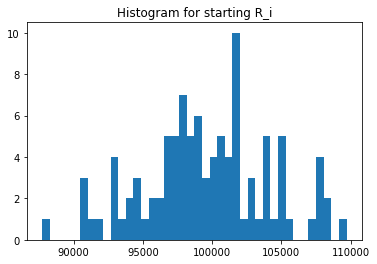

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([205026.15838291, 155824.10004113, 154668.10004113, ...,
       240879.12392413, 236914.12392413, 142483.27993355])

In [24]:
experiments.UNI_Si.unique()

array([10000., 14638., 14721., 15029., 14782., 14900., 14852., 15043.,
       14886., 14880., 14838., 14692., 14477., 14995., 14537., 15233.,
       14585., 15226., 14832., 14321., 14675., 14676., 14957., 14703.,
       14687., 14620., 14916., 15115., 14643., 15160., 14931., 14875.,
       14597., 14724., 14915., 14363., 15092., 14715., 14767., 14996.,
       14924., 14890., 14971., 14691., 14637., 14955., 14927., 14514.,
       14769., 14731., 14582., 14425., 14822., 15002., 14533., 14710.,
       14463., 14498., 14940., 14778., 14947., 14871., 14804., 14587.,
       15069., 14680., 14849., 14742., 14723., 14697., 14651., 14830.,
       14883., 15177., 14783., 14473., 14762., 14641., 14342., 14560.,
       15391., 15056., 14447., 14964., 14508., 14547., 14377., 14839.,
       14909., 14313., 14695., 14492., 14520., 14524., 15344., 14610.,
       14578., 14858., 14436., 14734., 14948., 14719., 14574., 14815.,
       15124., 14693., 15067., 14787., 14630., 14805., 14993., 14658.,
      

In [25]:
experiments.UNI_Qj.unique()

array([186343.73391167, 131226.88053961, 130325.88053961, ...,
       125620.15517507, 126436.15517507, 127263.15517507])

In [26]:
experiments.UNI_Rj.unique()

array([ 93171.86695584, 144209.94026981, 145209.94026981, ...,
       154403.57758753, 153403.57758753, 152403.57758753])

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([ 93171.86695584,  97209.94026981,  92544.11105846,  95807.31682737,
       100499.18764652,  97515.57566217, 102975.87383561,  93234.8315986 ,
       102440.15248603, 111566.92199068,  94789.53200103,  95170.9056478 ,
       108052.64221304, 114559.43301381,  95509.68609682,  98403.57758753,
        96161.77841487,  98686.24782695,  94830.22166713, 100343.18845208,
       103175.76886971, 100771.10359654, 102394.70760902,  99636.74409579,
       100301.41643333, 113098.08141479,  99043.40029631,  95856.94526681,
       101075.54340927,  99628.69380275,  99867.6010914 ,  94448.74823262,
        90857.42374036,  98889.59447385, 104031.84945424, 100291.28534964,
       107261.10799307,  95557.59867715,  99826.69981759, 102392.89224575,
       101518.20504923, 105876.74788459, 103828.79819199, 103632.18300399,
        94327.4987092 ,  95652.53747201, 102395.9380945 , 109771.47281761,
        94220.91542352,  96659.08226947, 101167.30410958,  96493.42857807,
       101944.03947016, 1

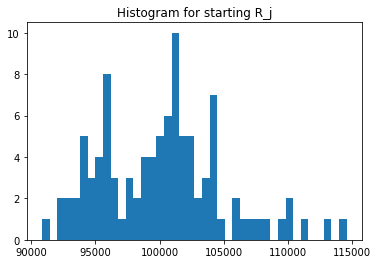

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([102513.07919145, 101895.05002056, 101800.46479606,  94410.89003523,
        98553.01252306,  97038.09499273,  97043.27335419,  93128.21875062,
        97316.44990982,  97443.51230388, 100338.00021993, 100555.8056843 ,
       107664.3768275 , 104195.7937909 , 100459.57031796,  94081.93986744,
        90545.61599107, 101049.13135016,  90671.93084166, 109697.46842654,
        99932.57873647, 101313.00688317,  98908.32856475,  94851.98731243,
       101656.29658032,  96552.74514085, 101216.39487923,  97699.67501518,
        91741.80142467, 104680.38172341,  90882.35636359,  97387.58207516,
       102748.19189447,  97681.39567448,  98834.63996678,  97710.96299701,
        96040.57295324, 107598.51912228,  93186.14722757, 100025.55458989,
        98878.1631456 ,  95064.94010846,  97229.42162275,  97523.95035638,
        95564.10889559, 101582.64927056, 101822.25426318,  95893.24101737,
        98466.77848448, 104763.46857136, 101669.05907735,  96827.81819027,
       103103.66221462, 1

In [31]:
experiments.UNI_ji.unique()

array([ 93171.86695584,  97209.94026981,  95807.31682737,  95170.9056478 ,
        97515.57566217,  92544.11105846, 100499.18764652,  93234.8315986 ,
       102975.87383561, 102440.15248603, 107261.10799307, 111566.92199068,
        94789.53200103,  95509.68609682,  98686.24782695, 108052.64221304,
       114559.43301381,  96161.77841487,  98403.57758753, 100343.18845208,
        94830.22166713, 100771.10359654, 103175.76886971, 102394.70760902,
        99636.74409579, 101075.54340927, 100301.41643333,  99867.6010914 ,
        99043.40029631, 102392.89224575, 113098.08141479,  95856.94526681,
        99628.69380275, 101295.26501443,  94448.74823262,  90857.42374036,
        98889.59447385, 104031.84945424, 103828.79819199, 100291.28534964,
        95557.59867715,  99826.69981759, 101518.20504923, 103632.18300399,
       105876.74788459,  94327.4987092 ,  95652.53747201, 109771.47281761,
       102395.9380945 ,  96493.42857807,  94220.91542352,  96303.71545842,
       101167.30410958,  

In [32]:
experiments.UNI_Sij.unique()

array([9.55133498e+09, 9.90521173e+09, 9.75322938e+09, 8.98516991e+09,
       9.61045375e+09, 8.98030424e+09, 9.75277014e+09, 8.68279379e+09,
       1.00212465e+10, 9.98212826e+09, 1.07623651e+10, 1.12187017e+10,
       1.02054559e+10, 9.95170756e+09, 9.91397805e+09, 1.01658022e+10,
       1.03728544e+10, 9.71706418e+09, 8.92244238e+09, 1.10073937e+10,
       9.47662859e+09, 1.02094235e+10, 1.02049428e+10, 9.71234151e+09,
       1.01287024e+10, 9.75912118e+09, 1.01521478e+10, 9.75703217e+09,
       9.08641996e+09, 1.07185270e+10, 1.02786201e+10, 9.33527612e+09,
       1.02366681e+10, 9.89466286e+09, 9.33480803e+09, 8.87776637e+09,
       9.49741331e+09, 1.11936729e+10, 9.67540567e+09, 1.00316914e+10,
       9.44855983e+09, 9.49001924e+09, 9.87055636e+09, 1.01066199e+10,
       1.01180171e+10, 9.58203722e+09, 9.73955699e+09, 1.05263423e+10,
       1.00825982e+10, 1.01089863e+10, 9.57935182e+09, 9.32487865e+09,
       1.04307196e+10, 1.03674788e+10, 9.34442683e+09, 9.98071364e+09,
      

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


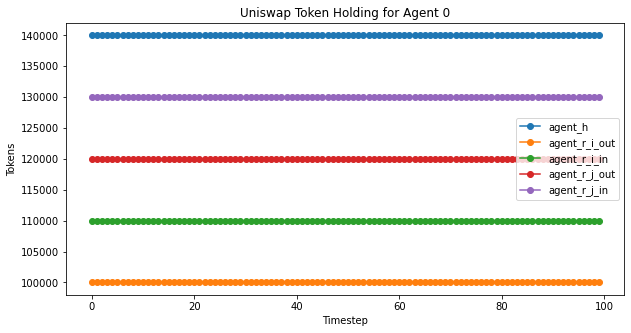

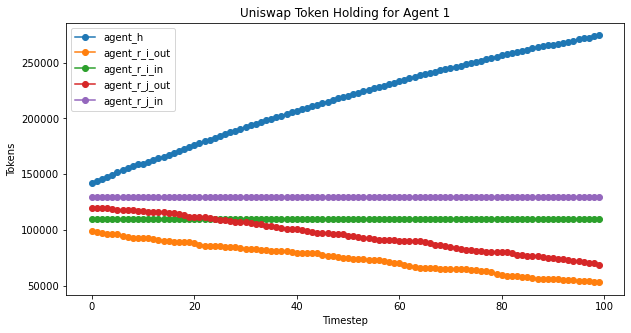

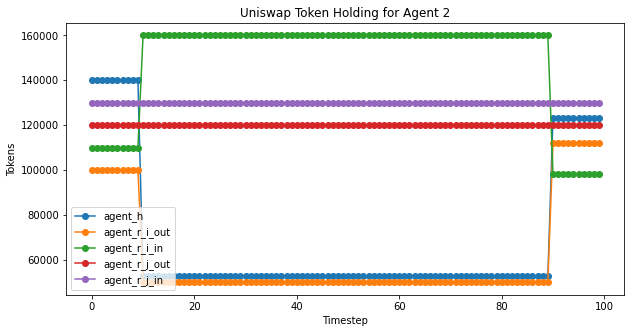

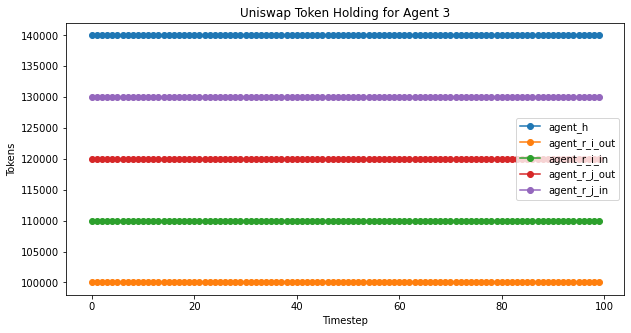

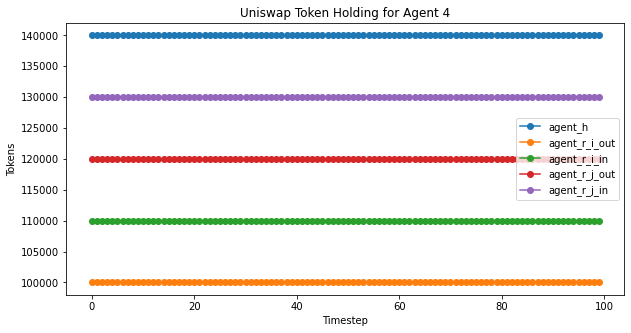

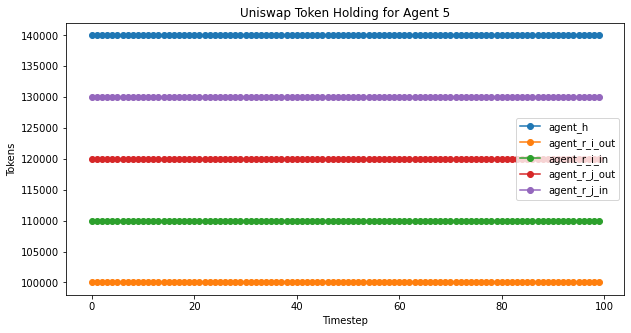

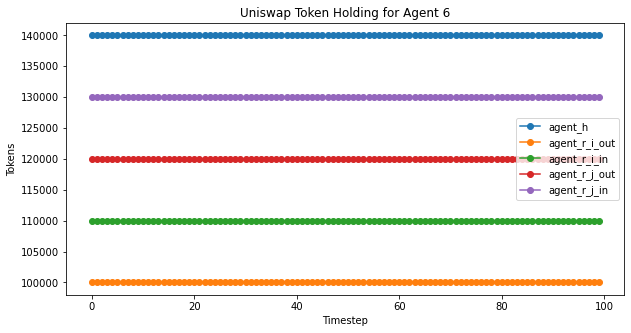

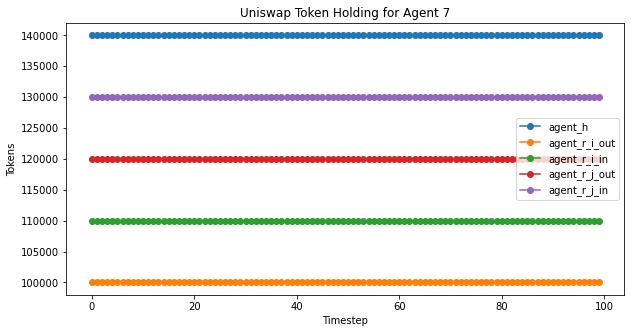

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


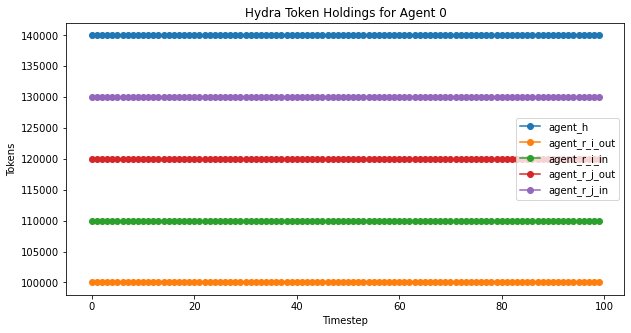

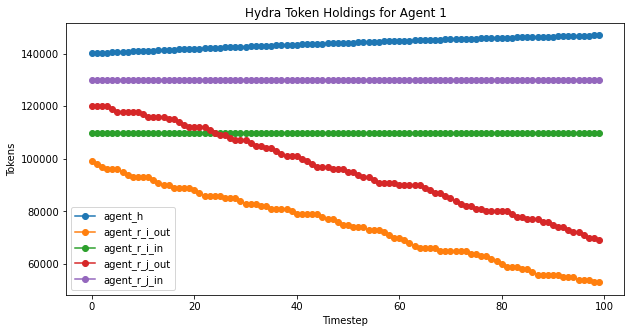

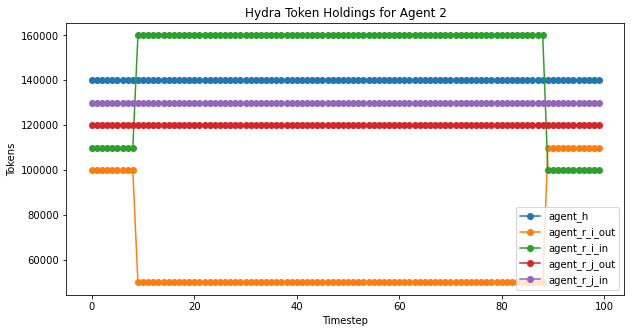

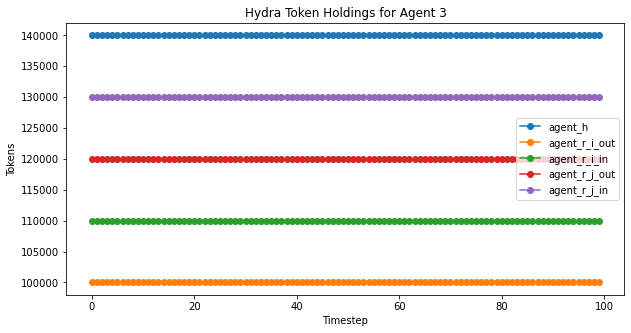

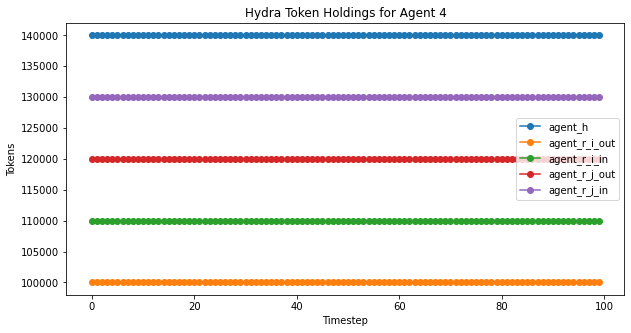

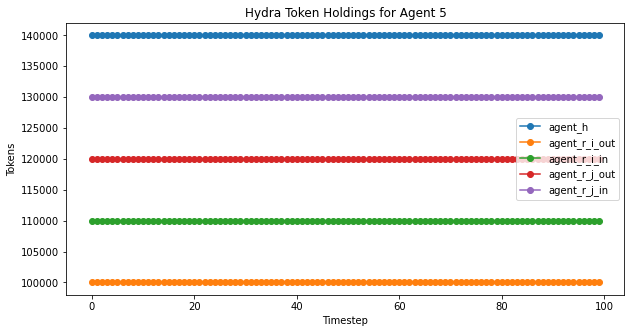

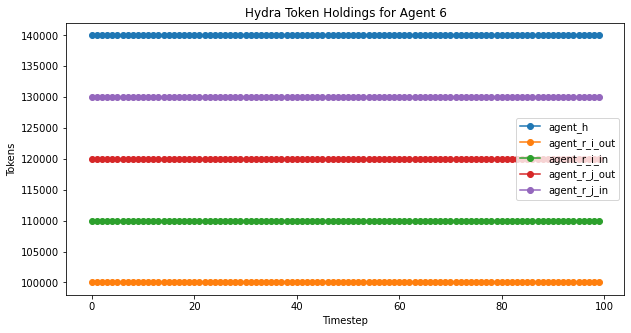

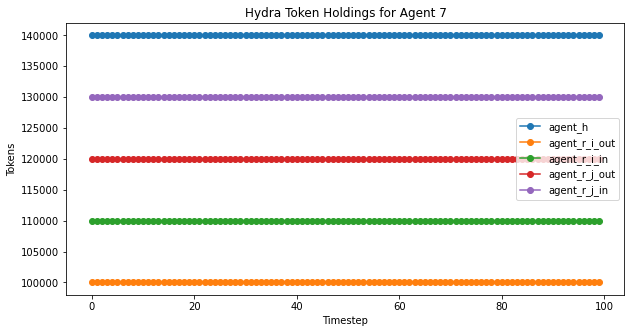

In [35]:
hydra_agent_plot(experiment2,'Hydra Token Holdings for Agent ', 100)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

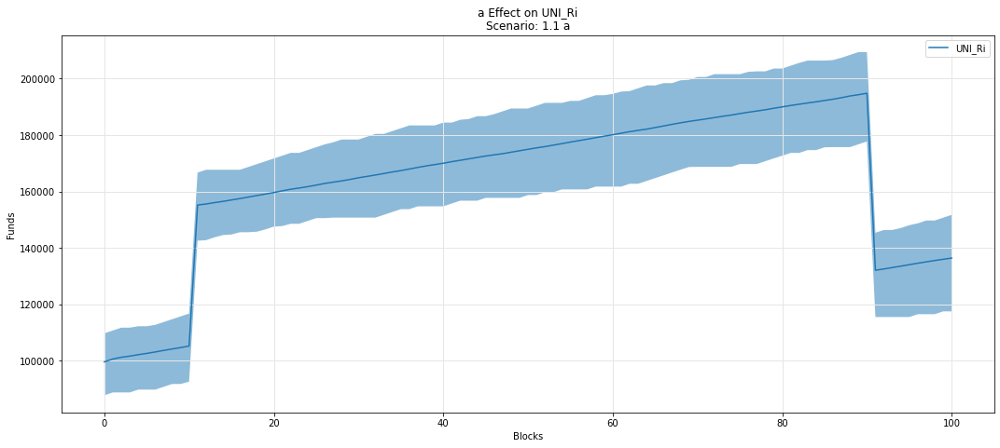

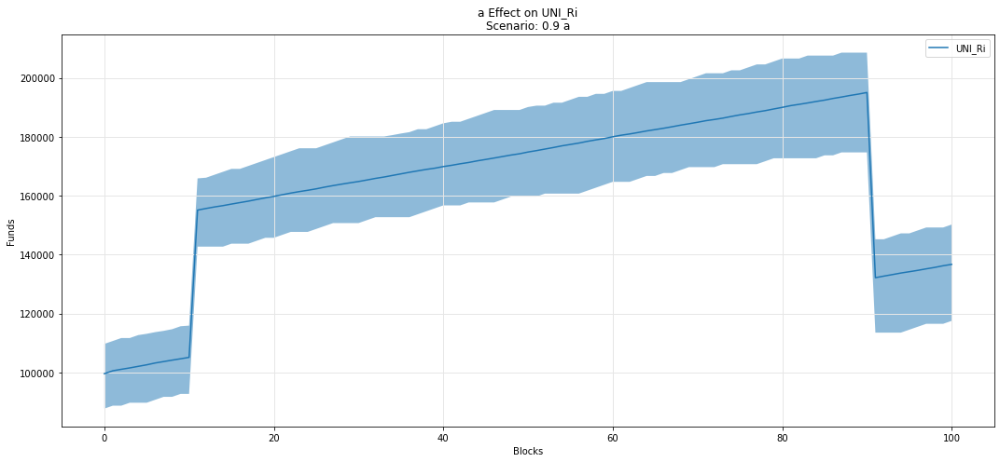

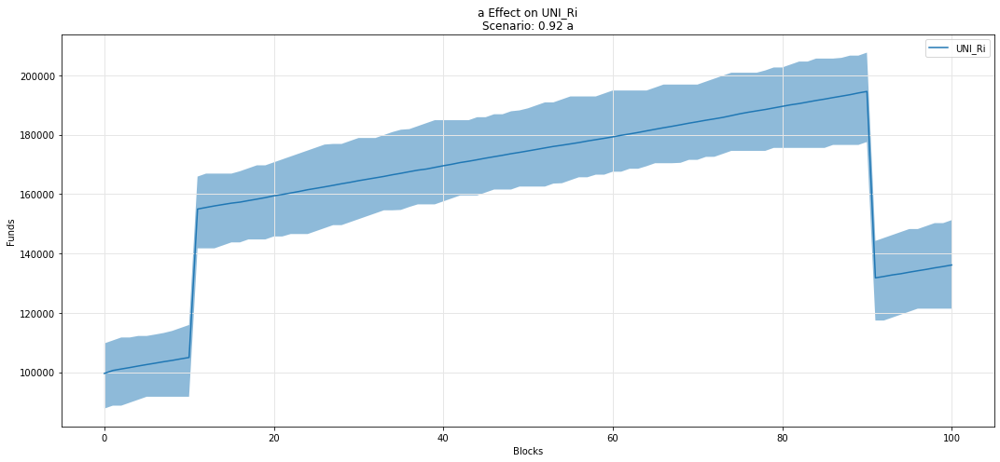

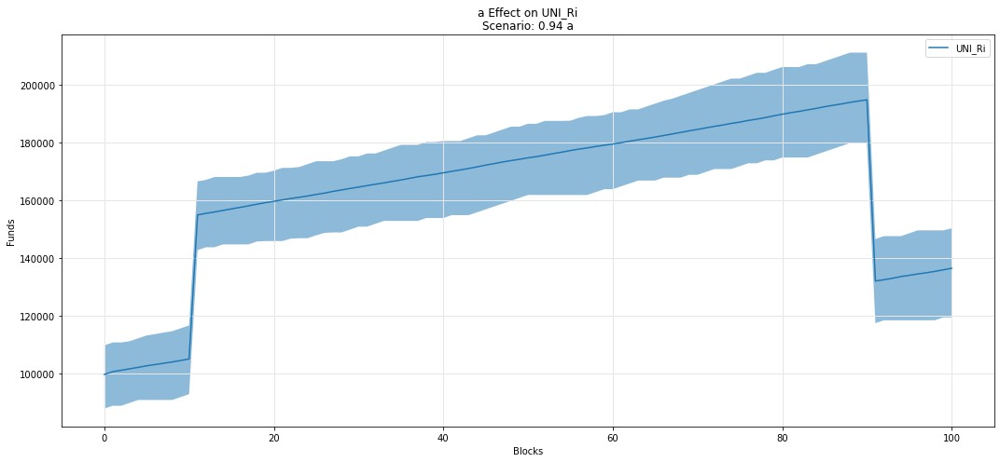

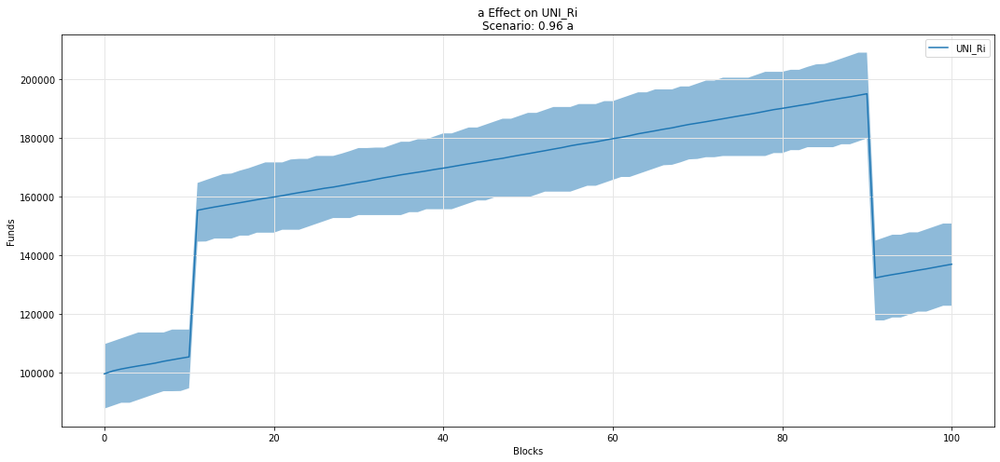

...

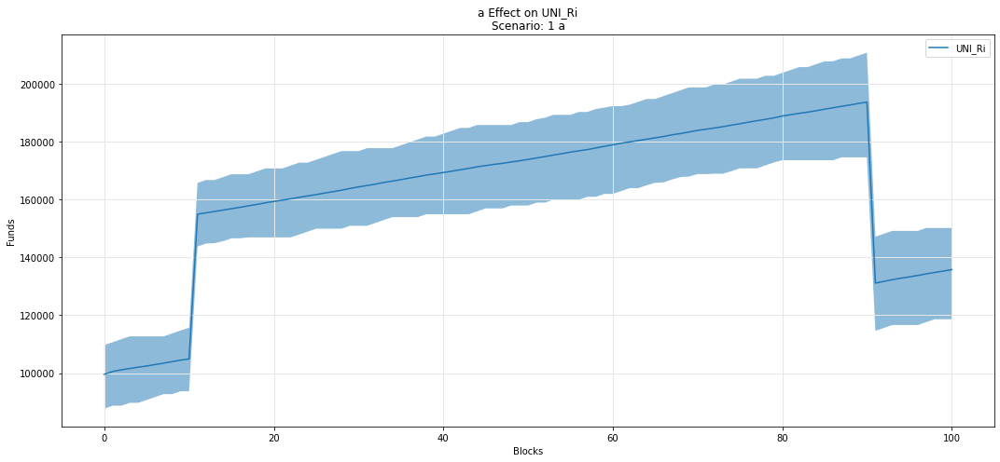

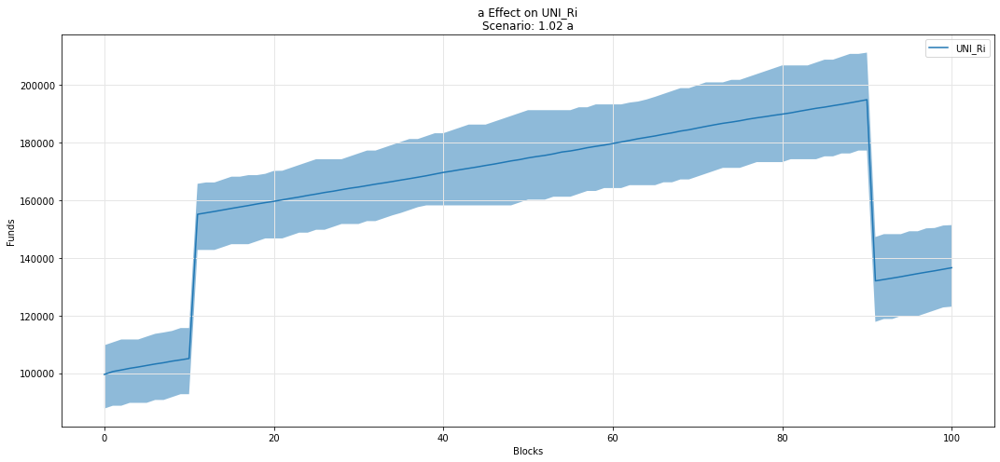

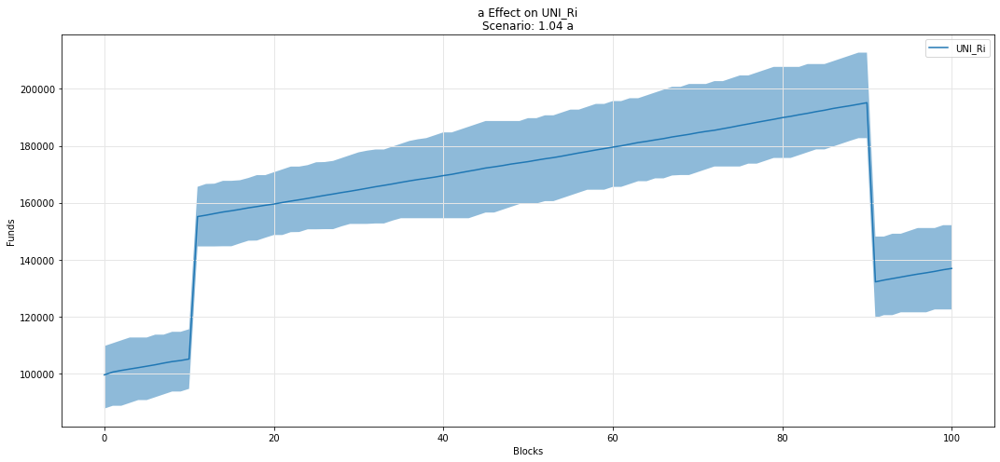

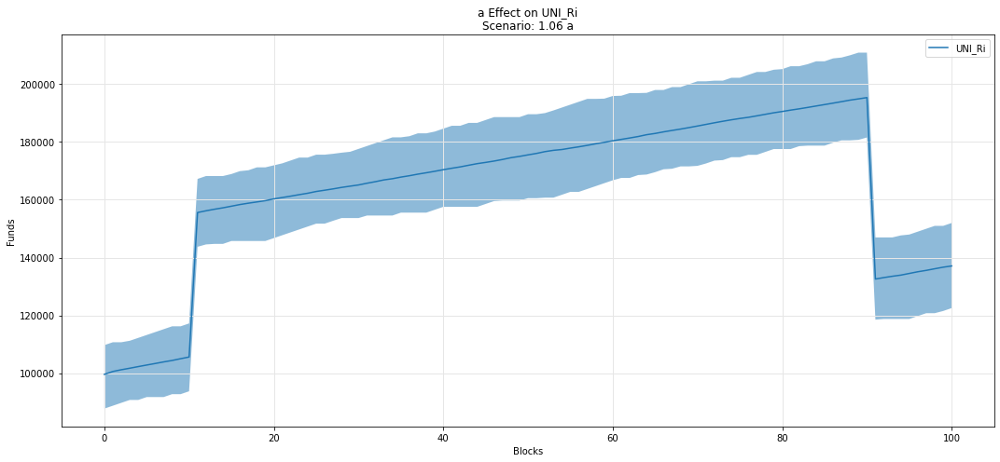

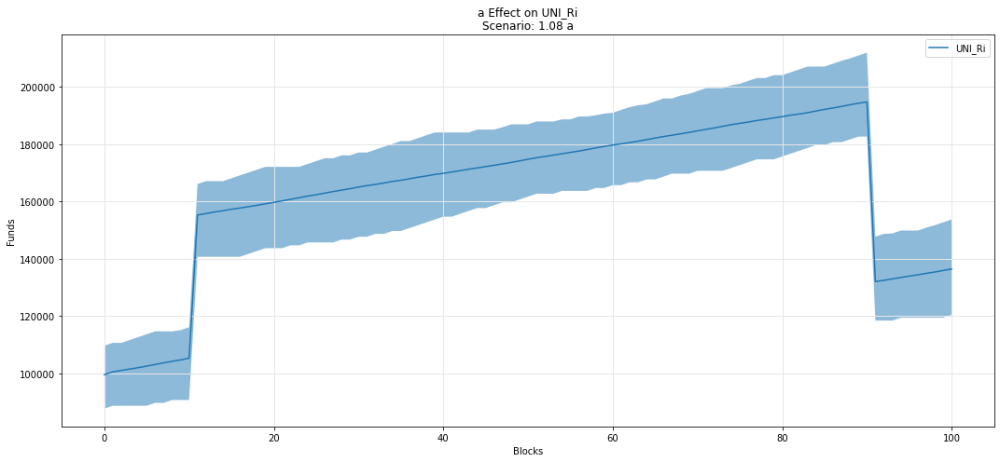

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

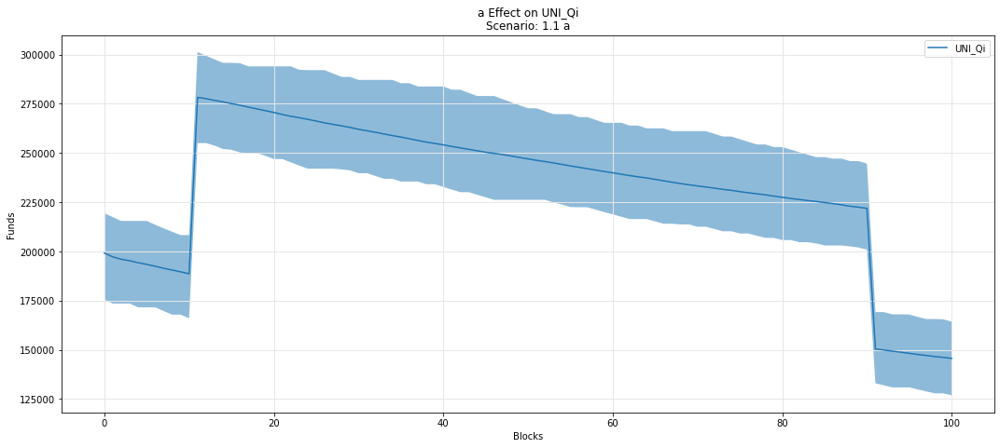

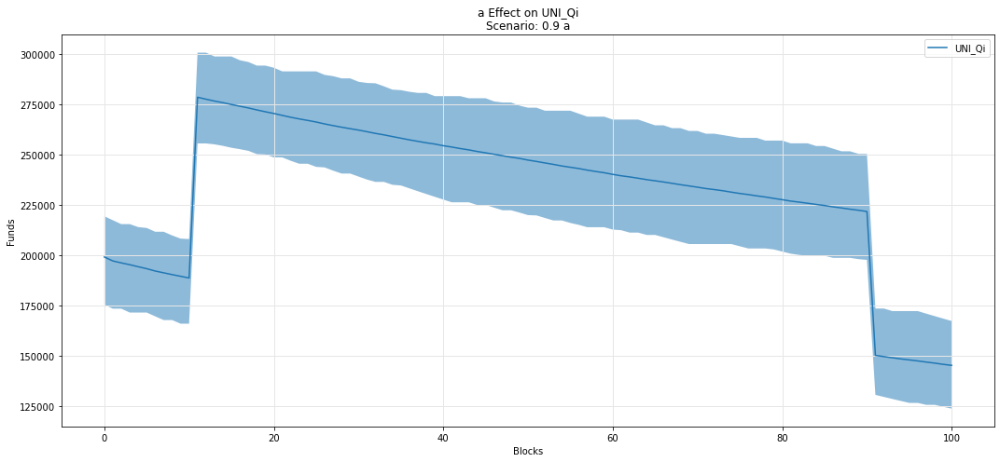

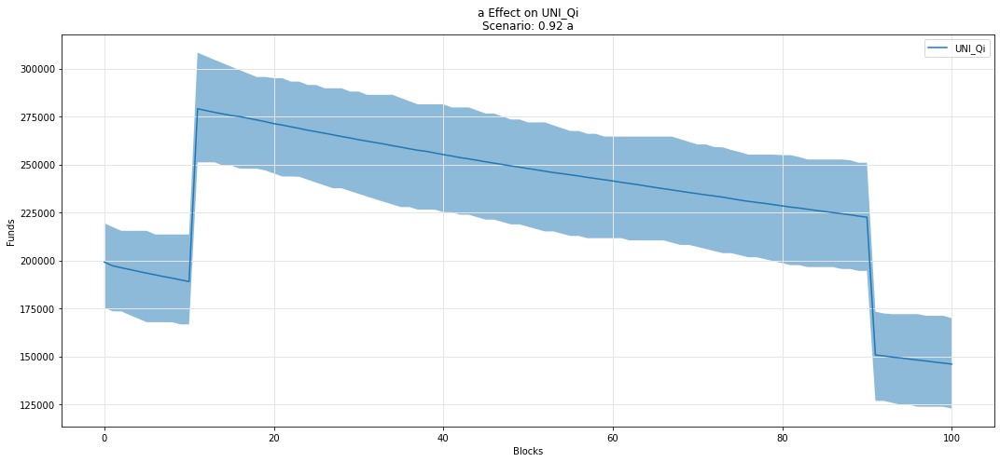

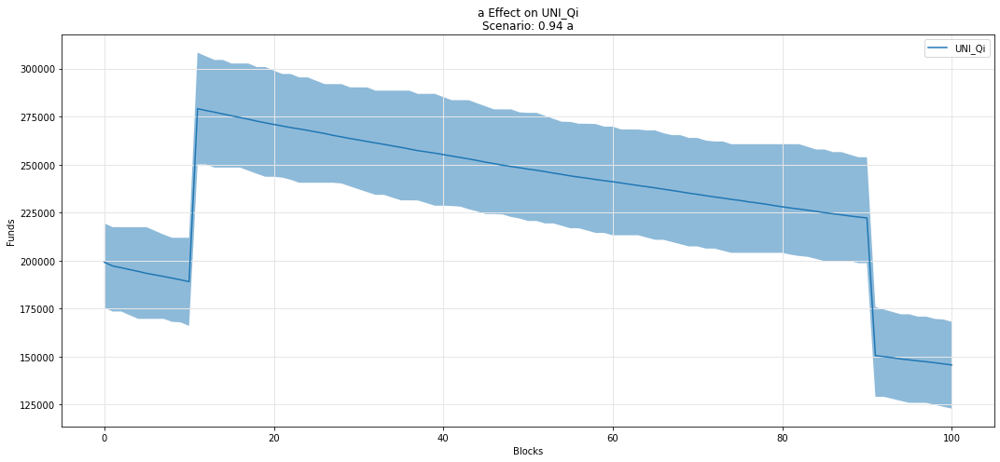

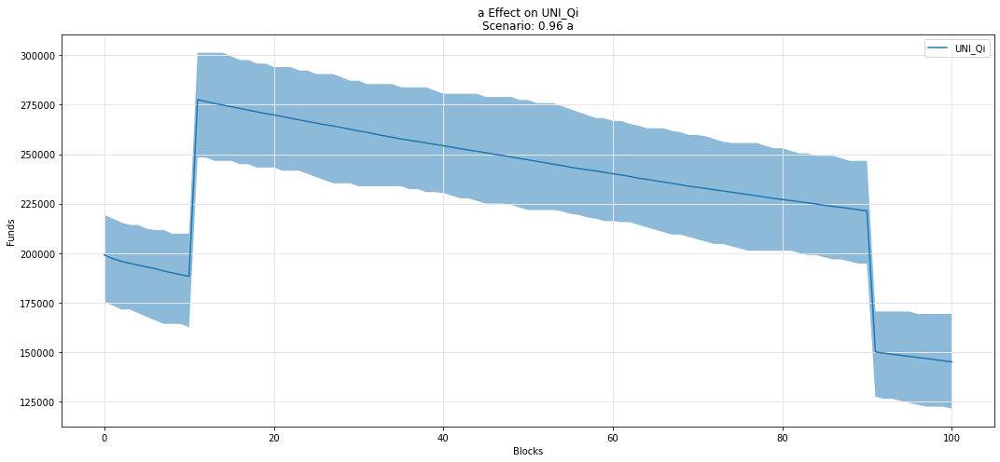

...

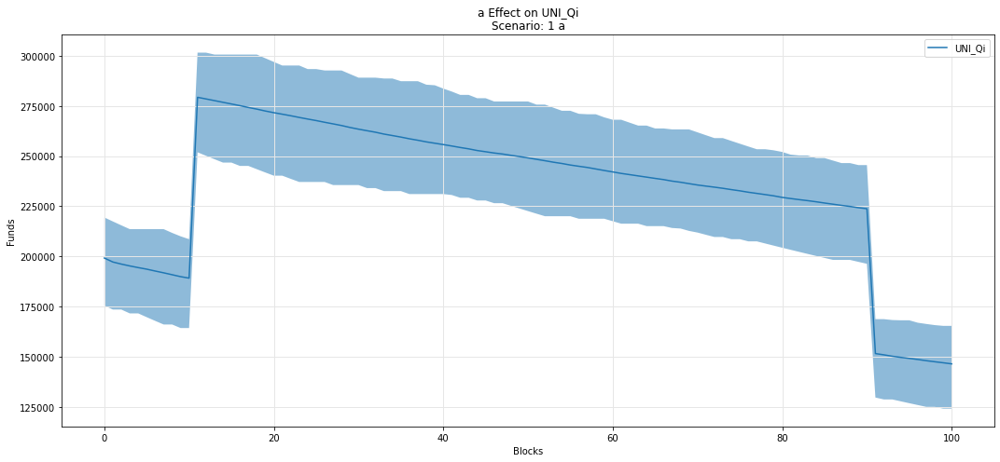

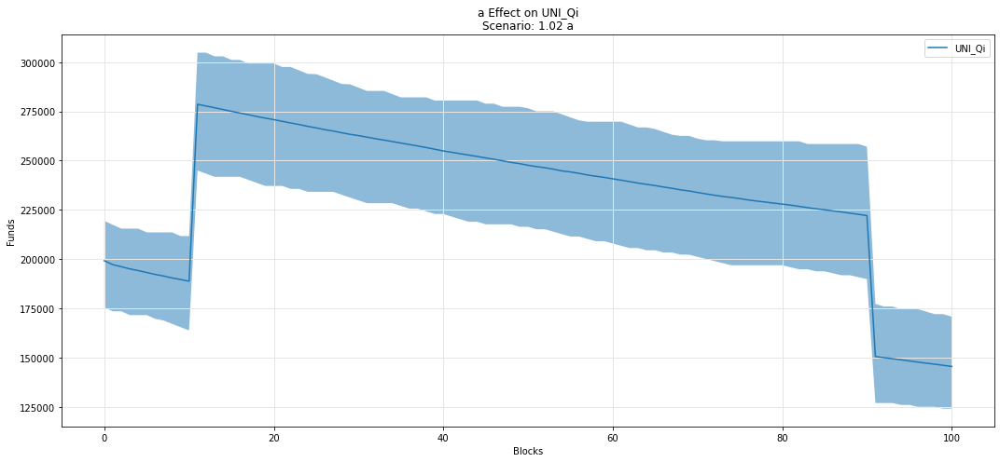

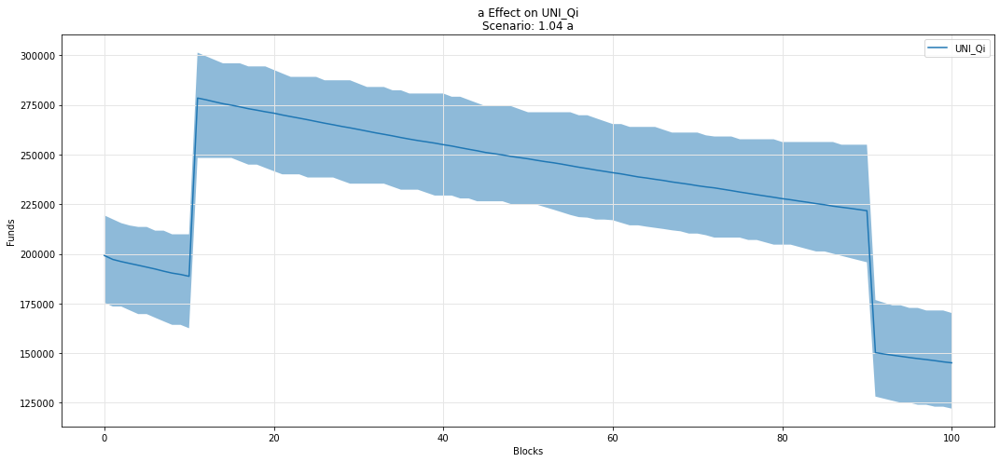

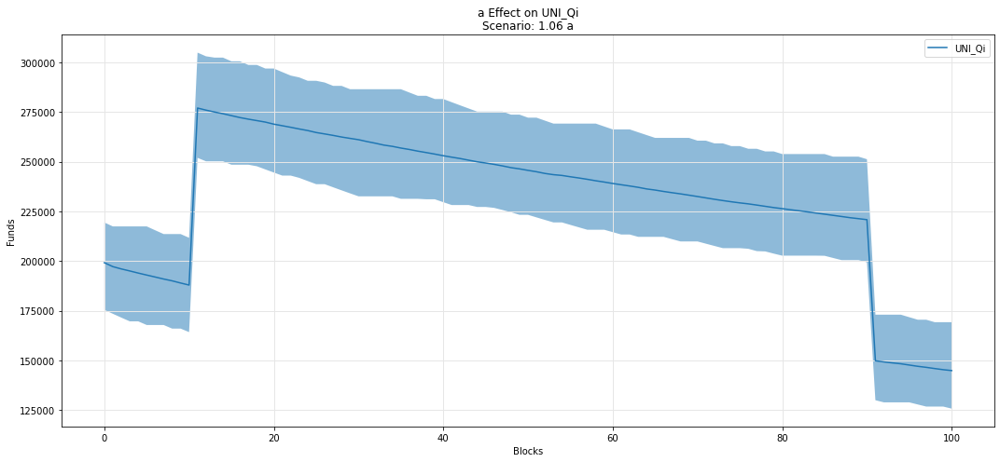

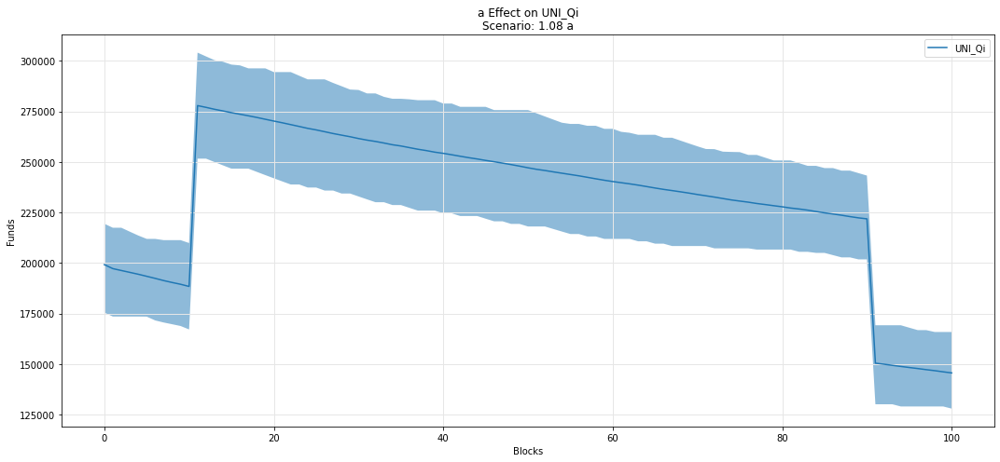

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

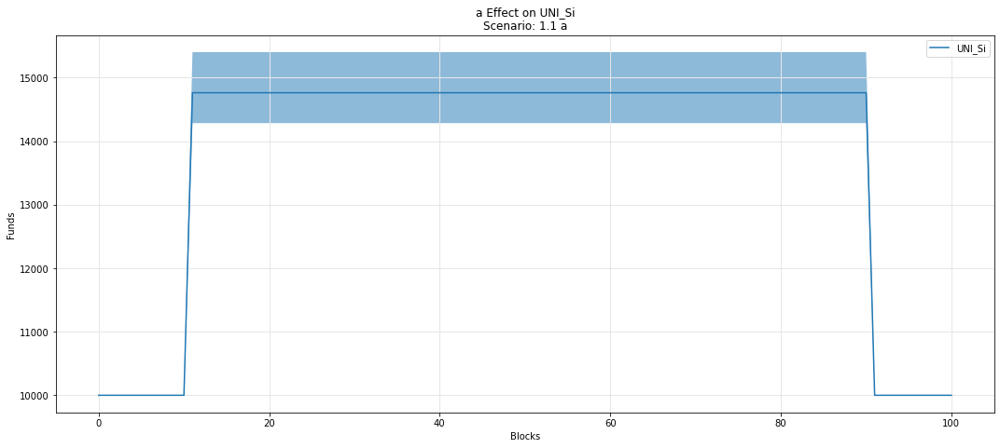

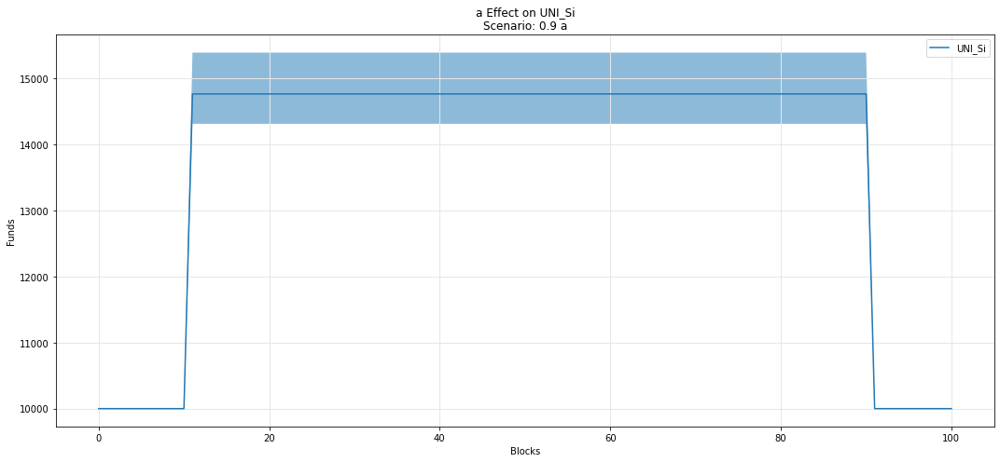

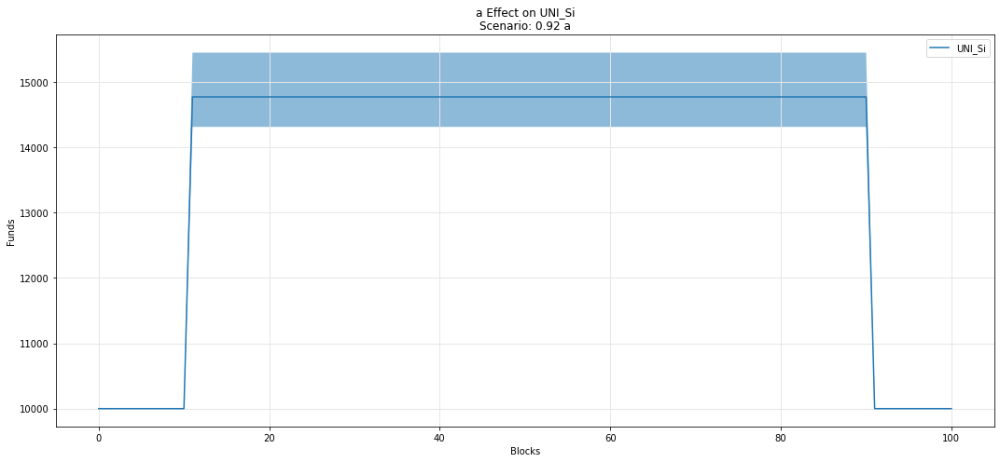

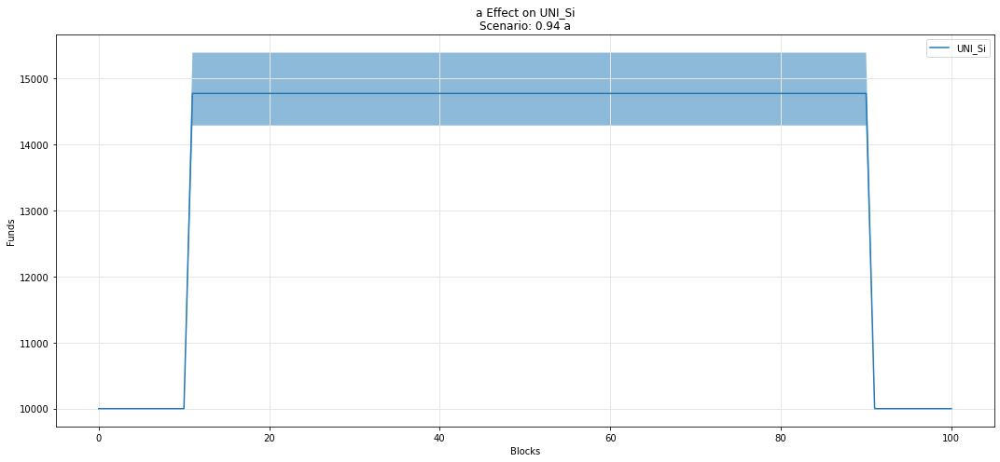

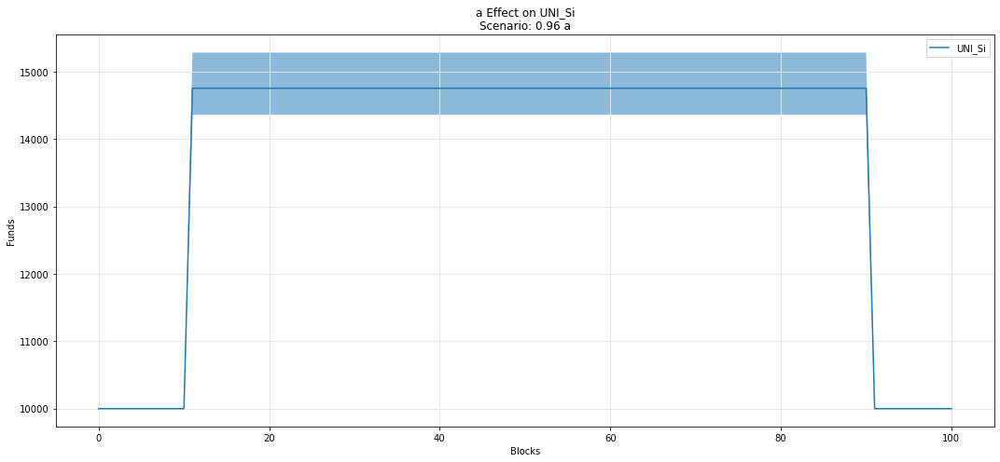

...

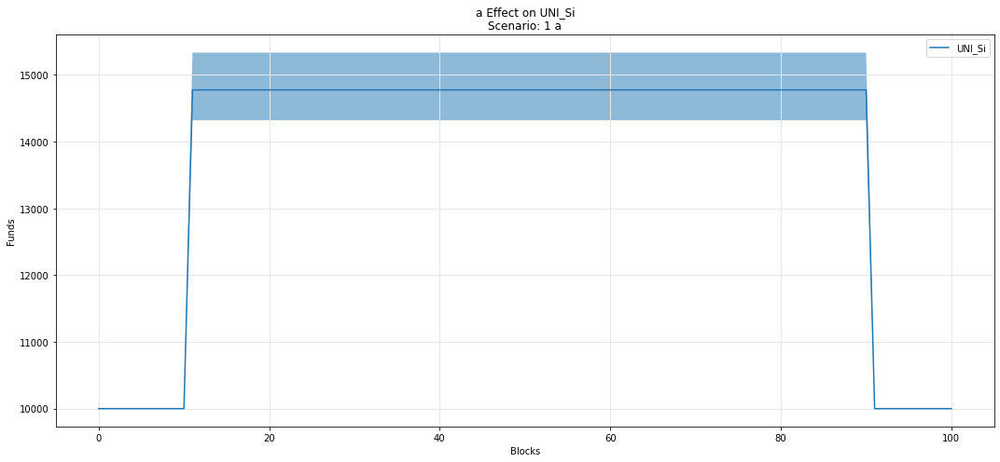

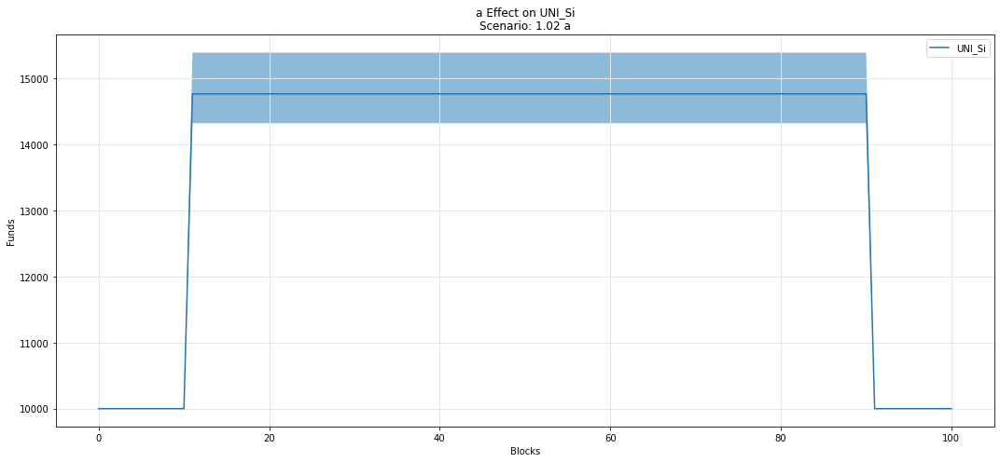

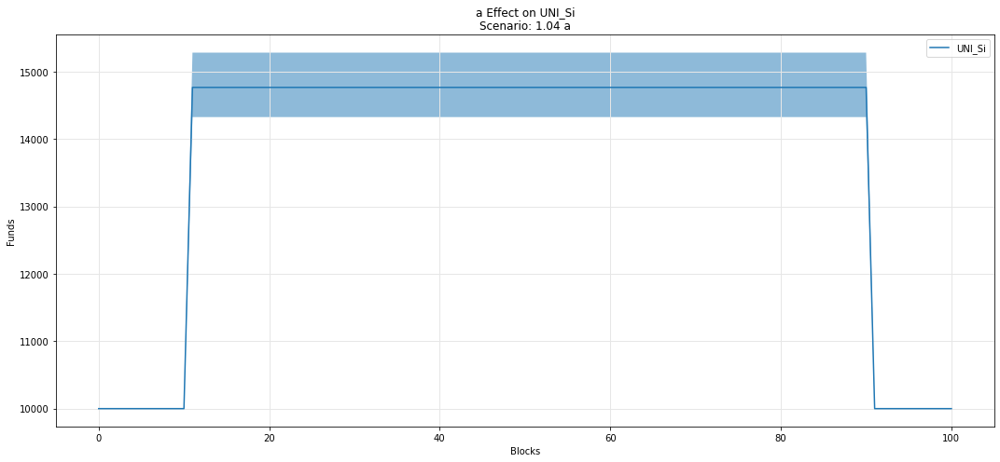

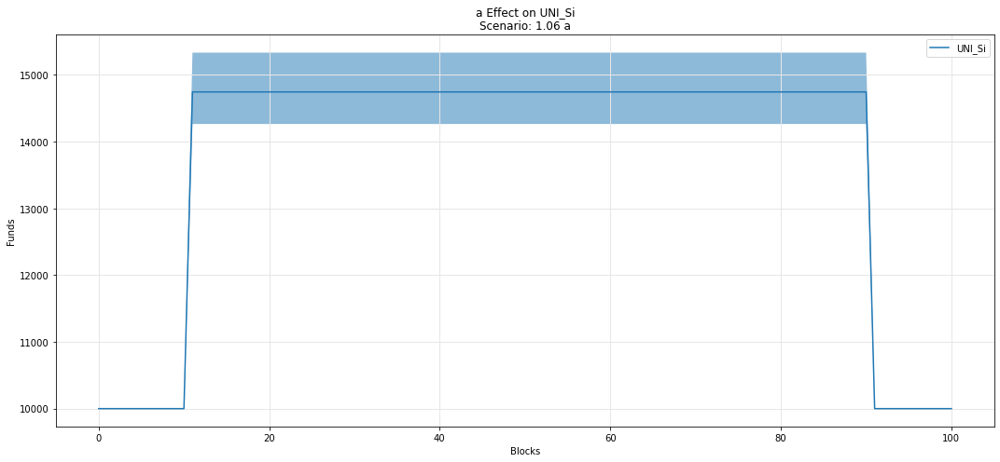

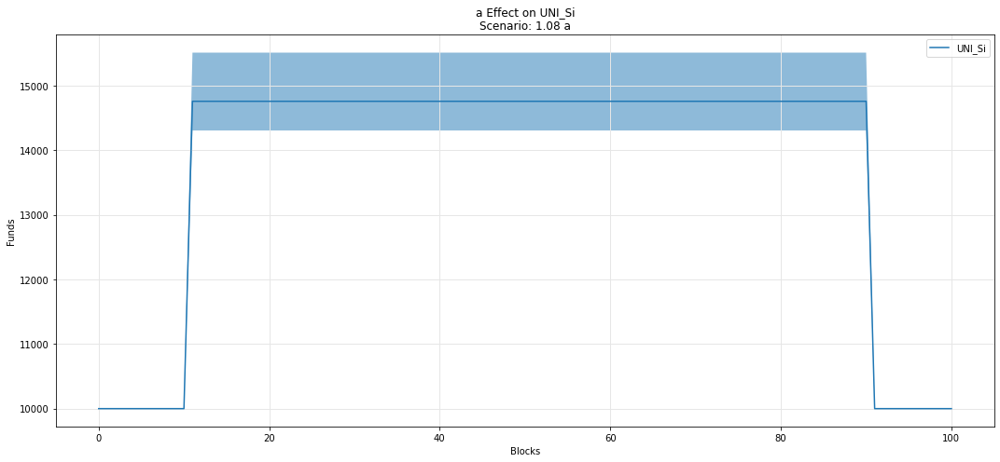

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

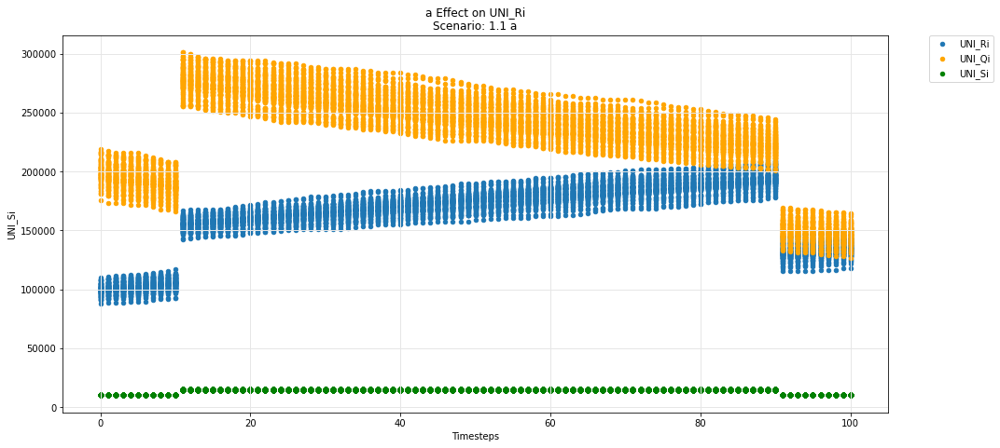

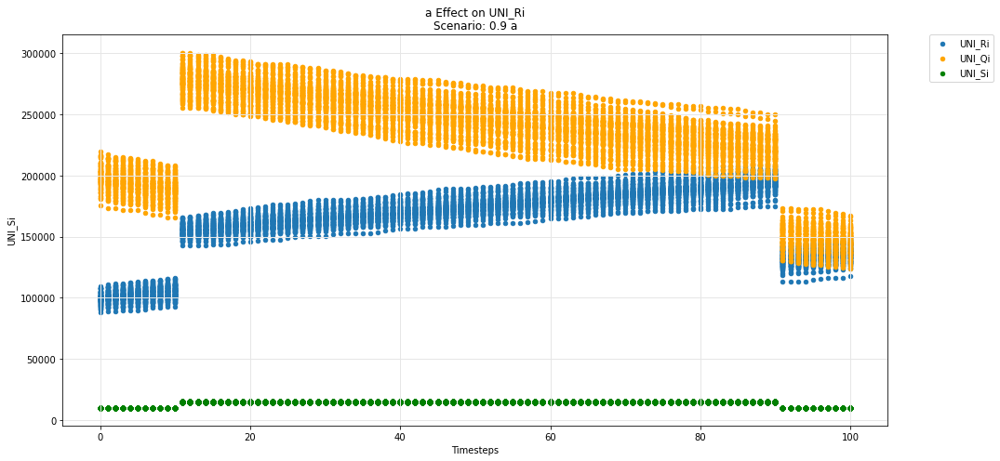

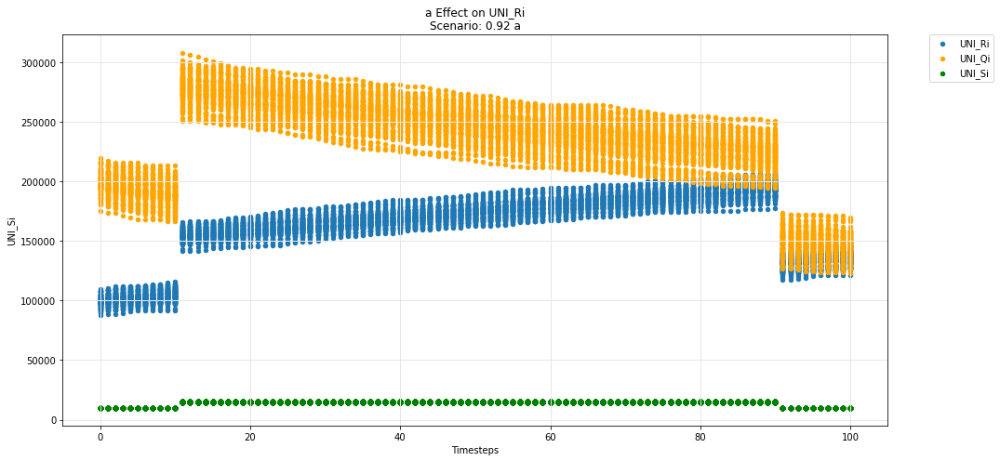

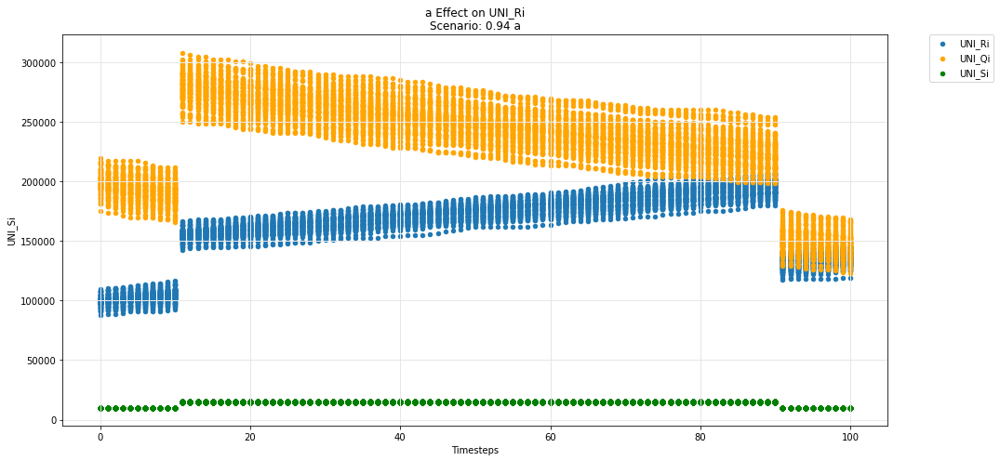

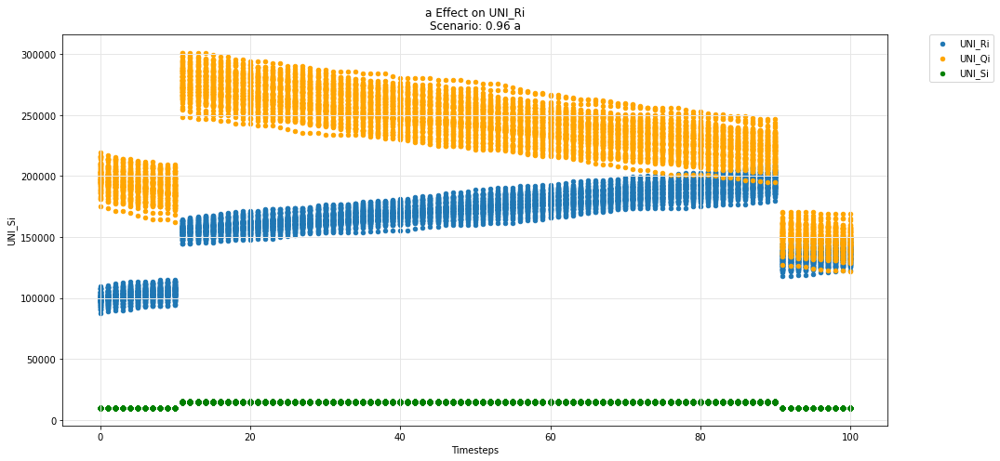

...

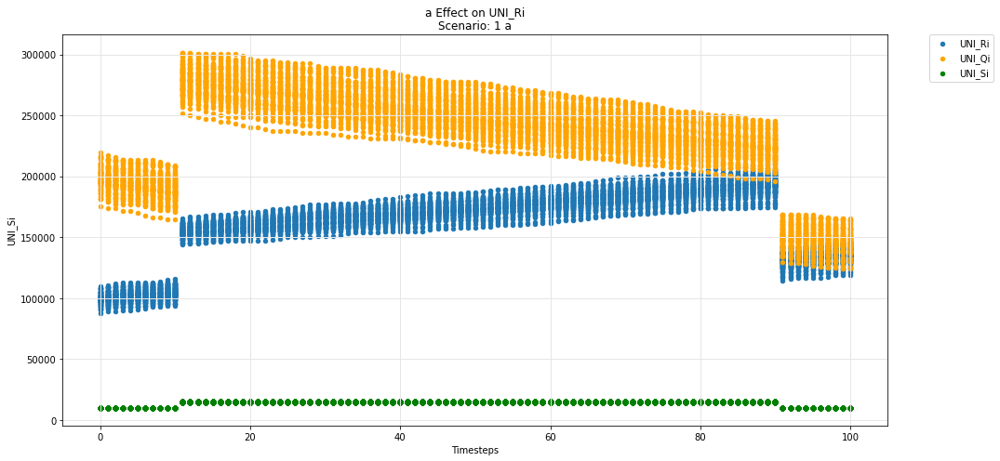

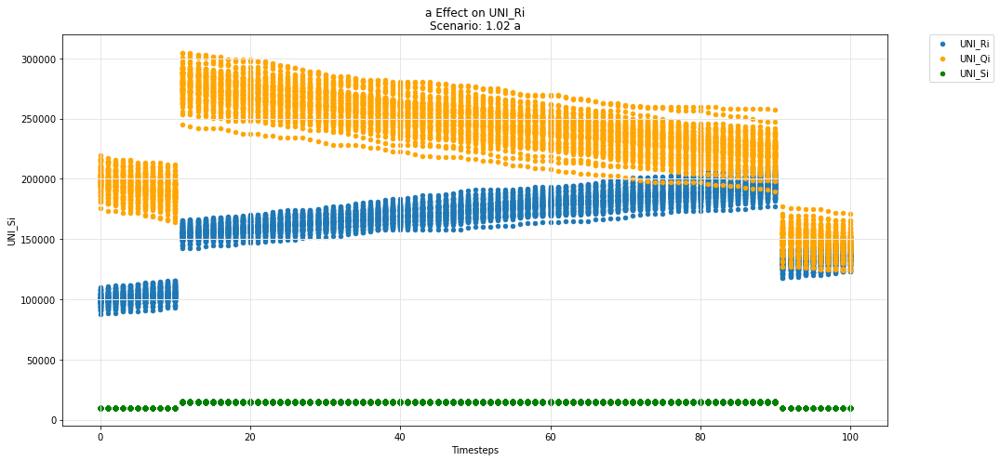

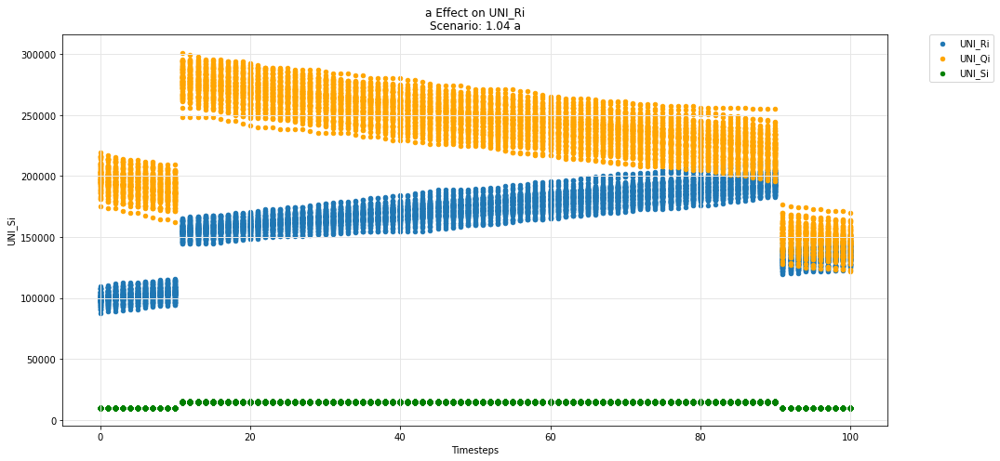

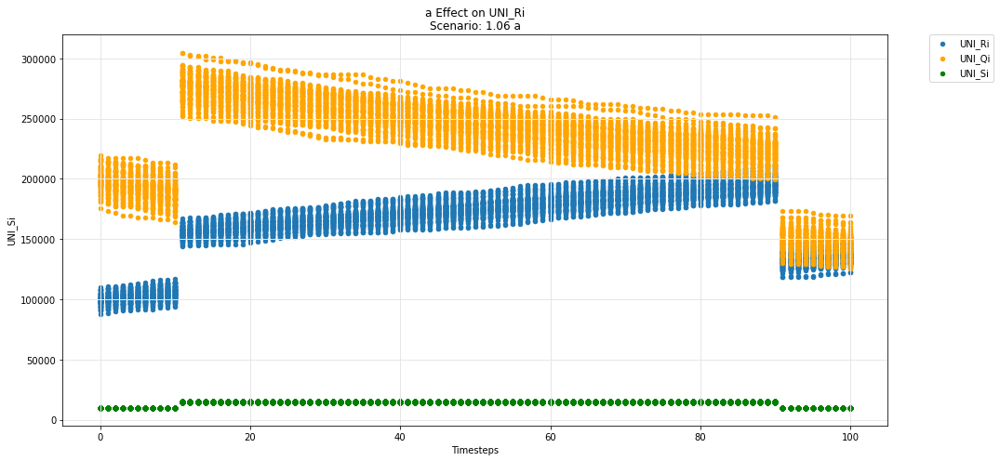

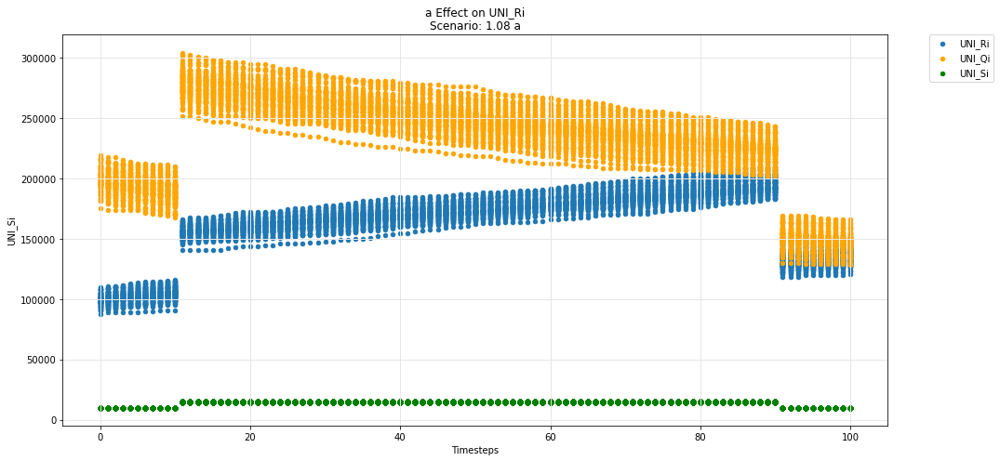

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

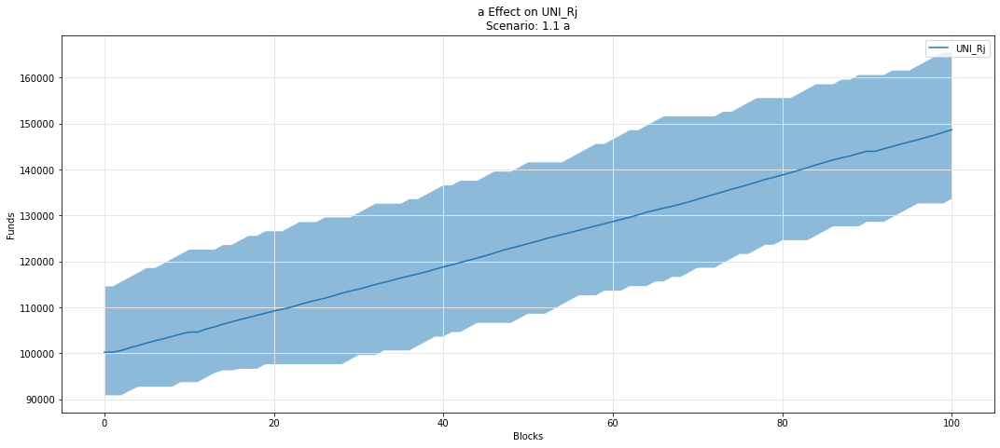

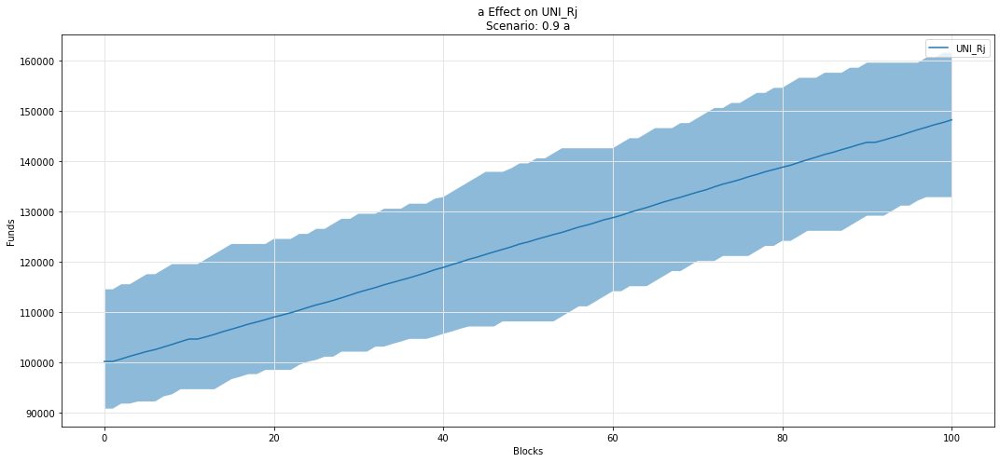

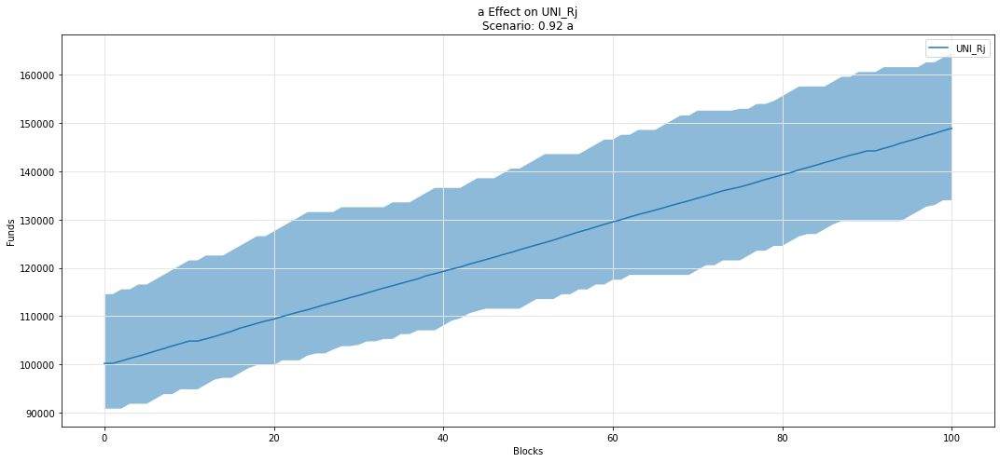

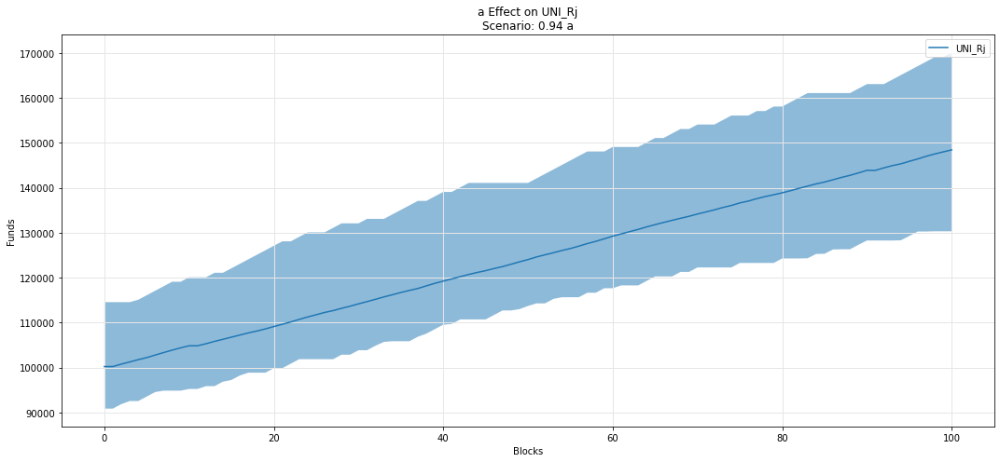

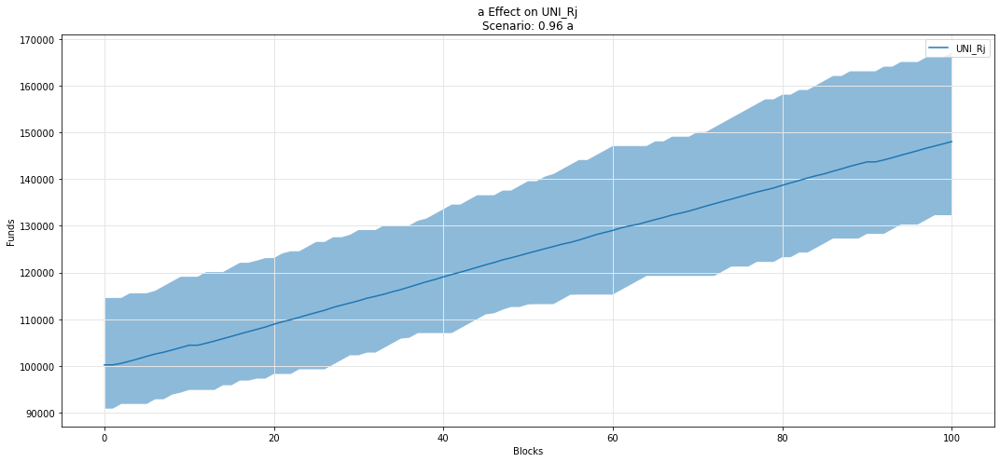

...

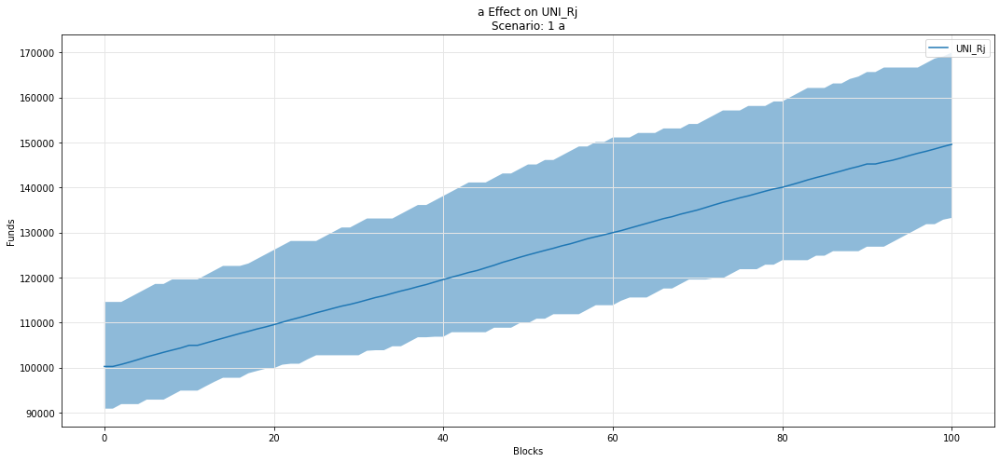

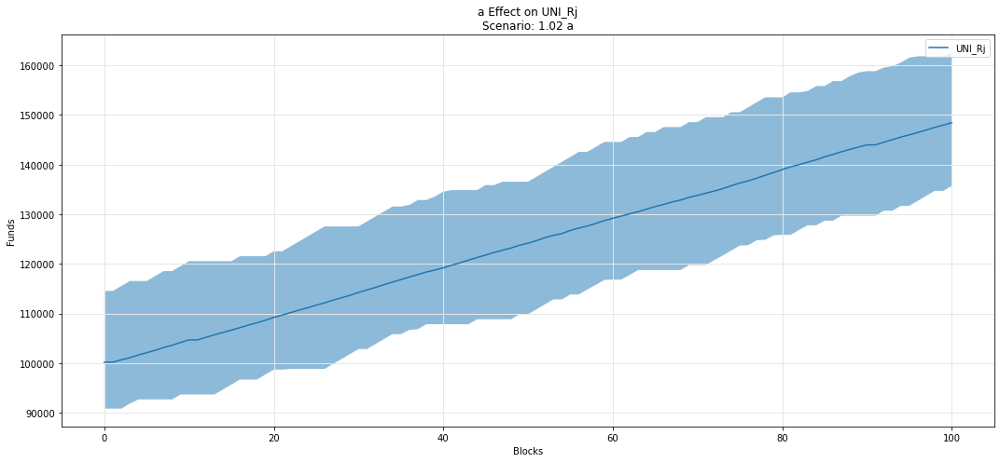

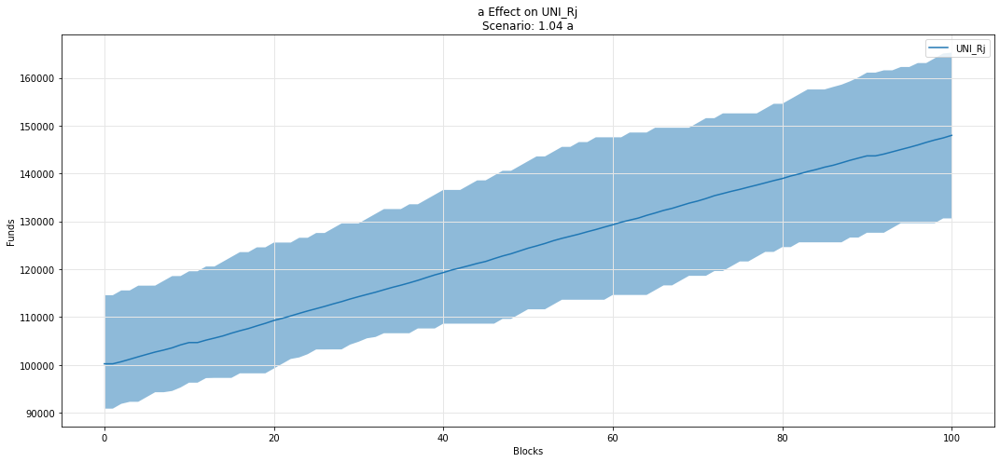

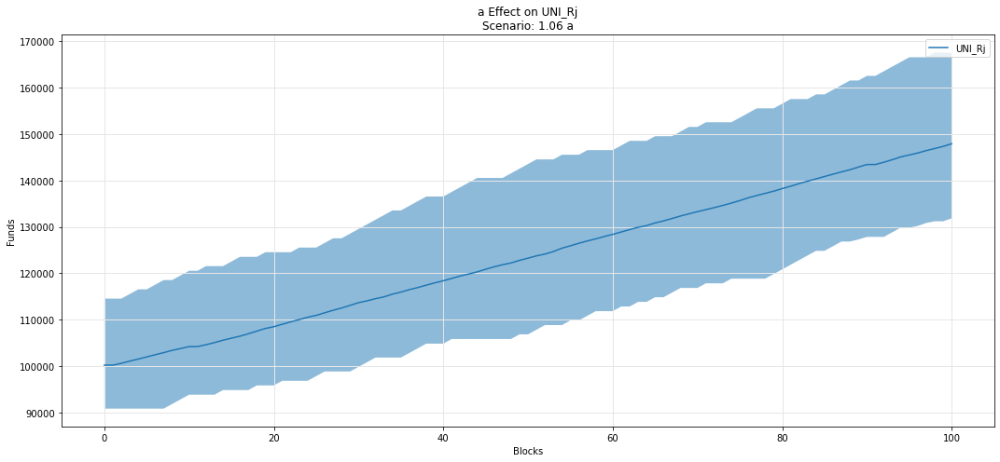

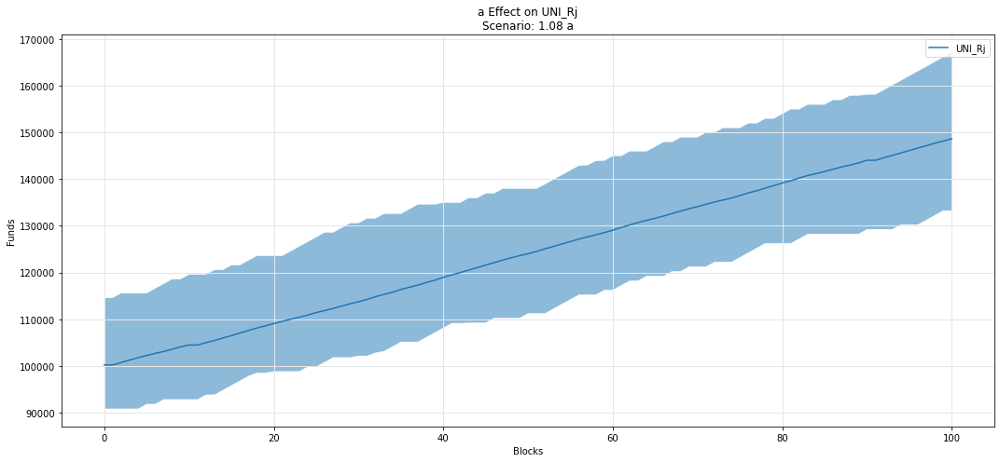

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

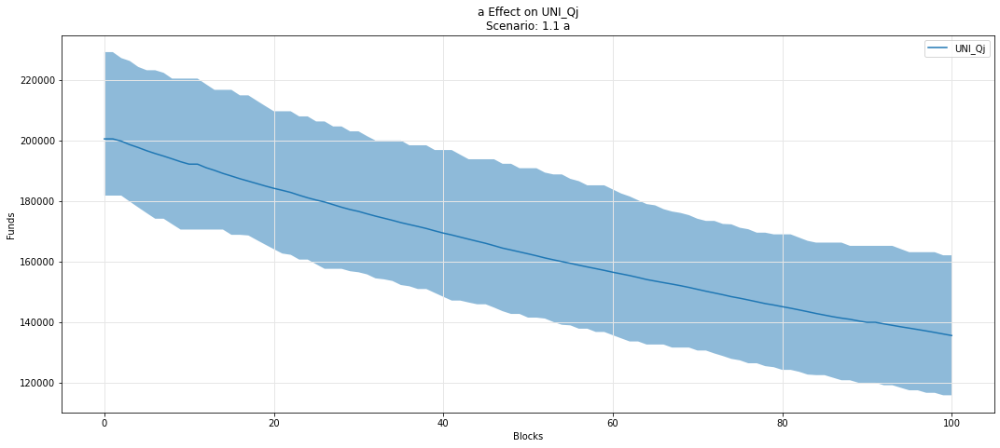

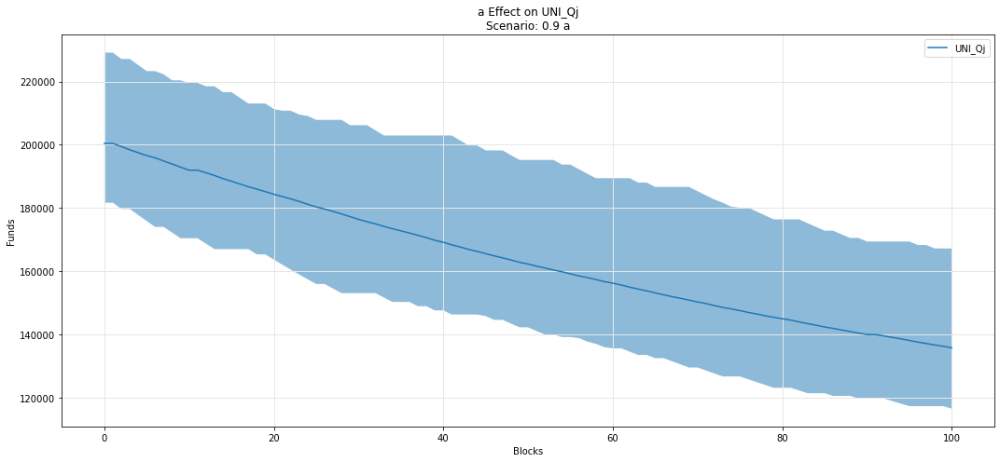

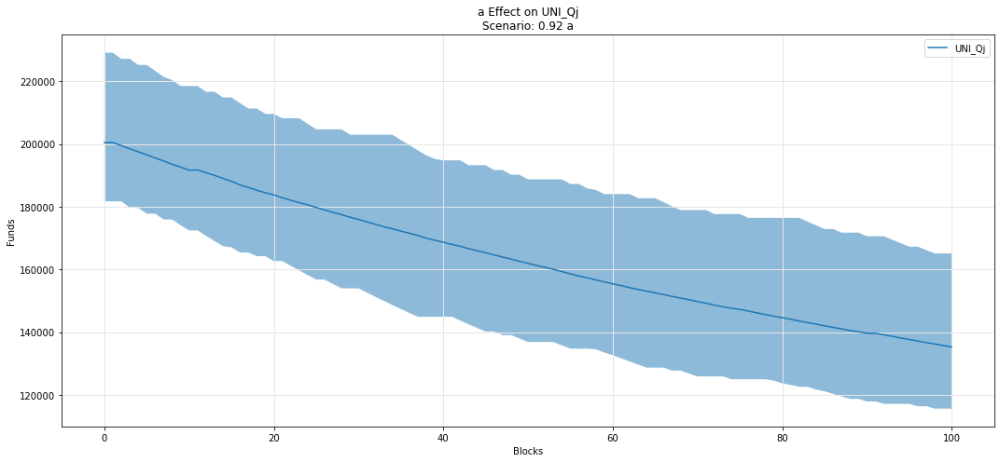

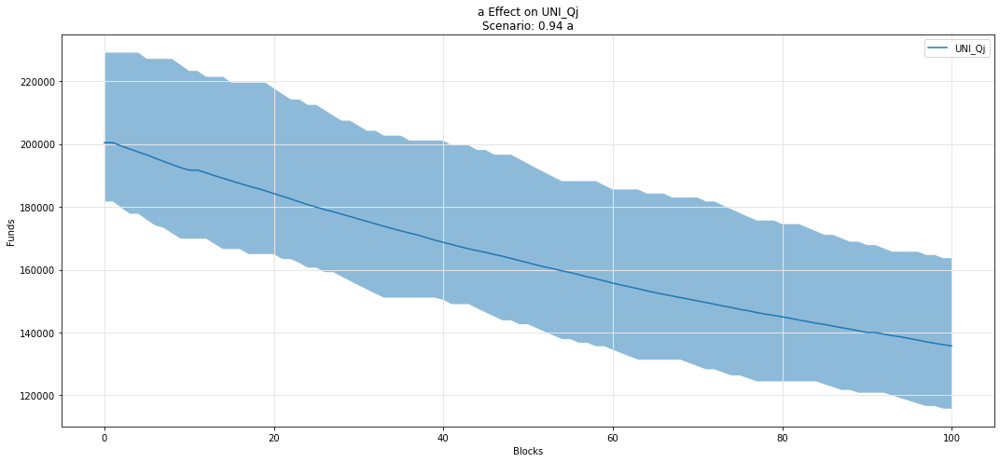

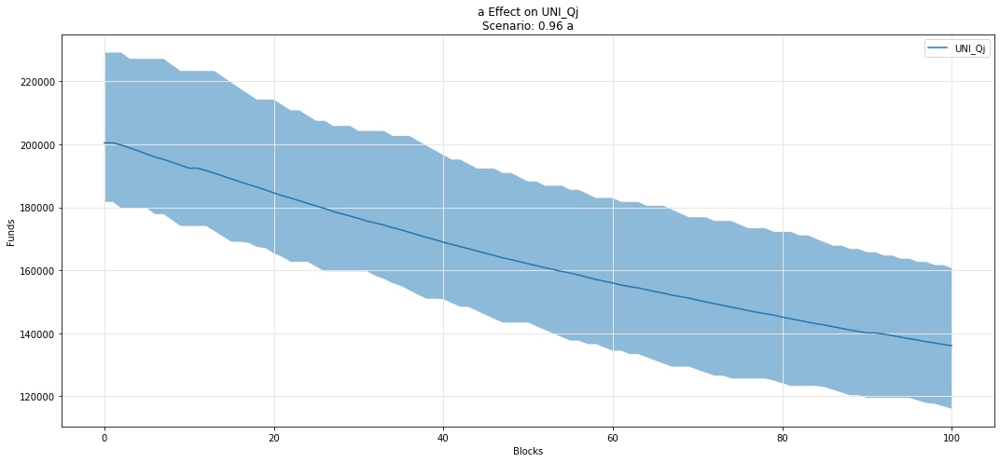

...

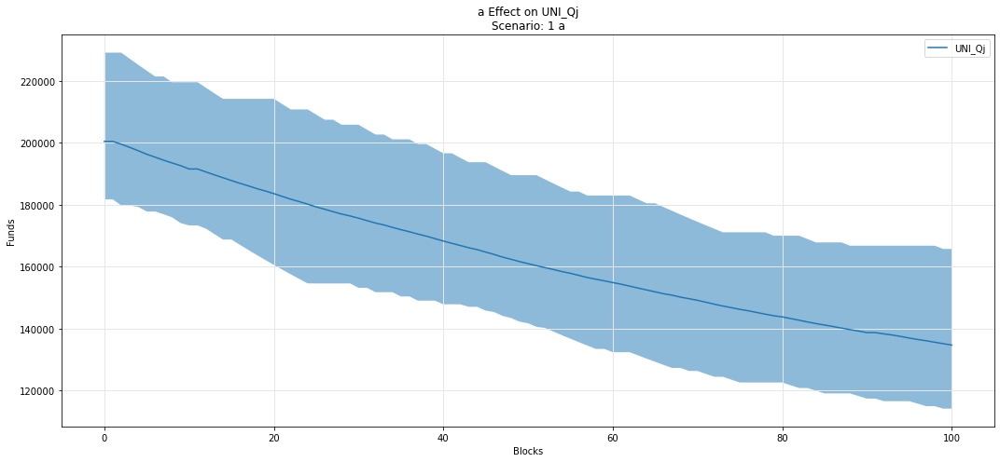

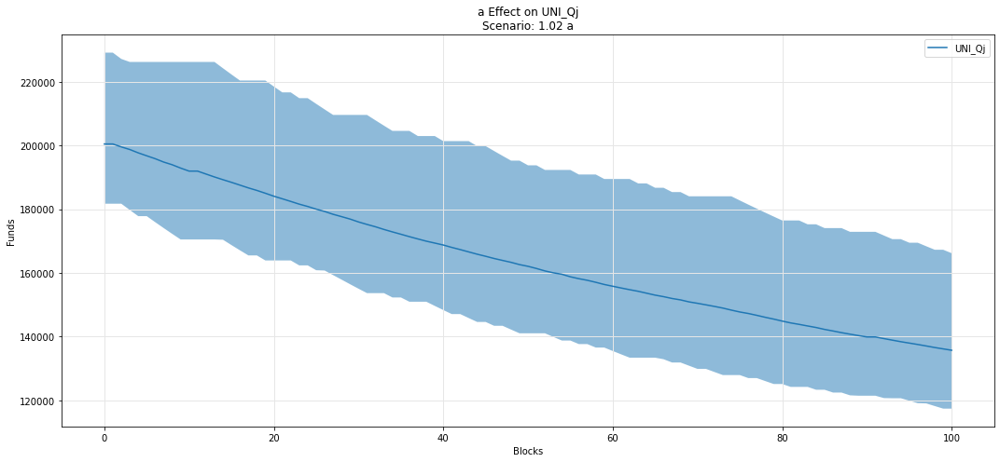

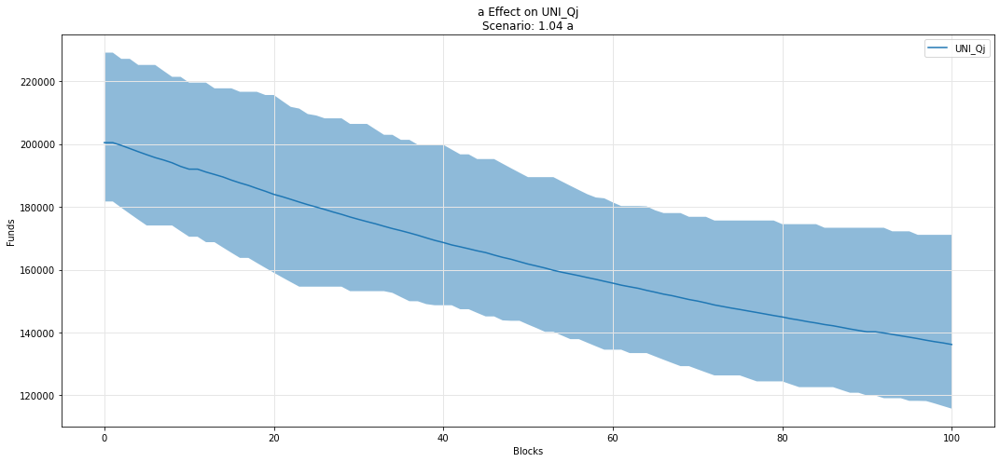

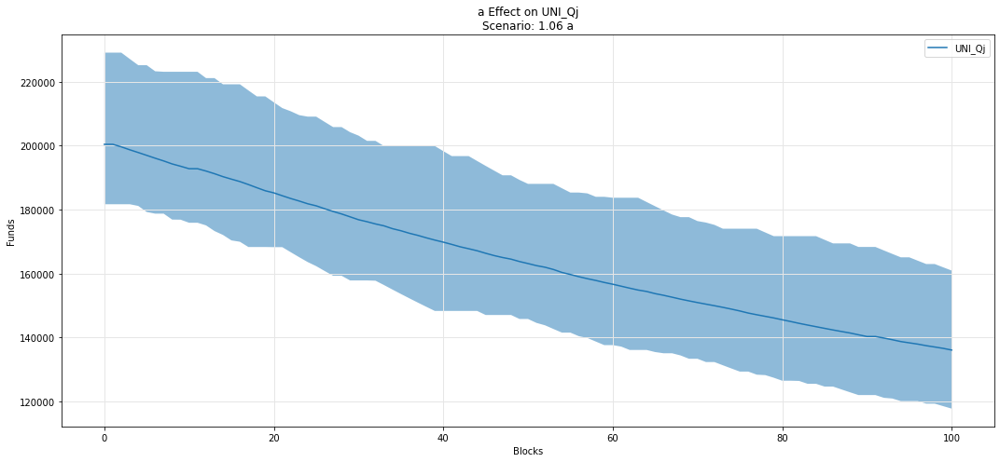

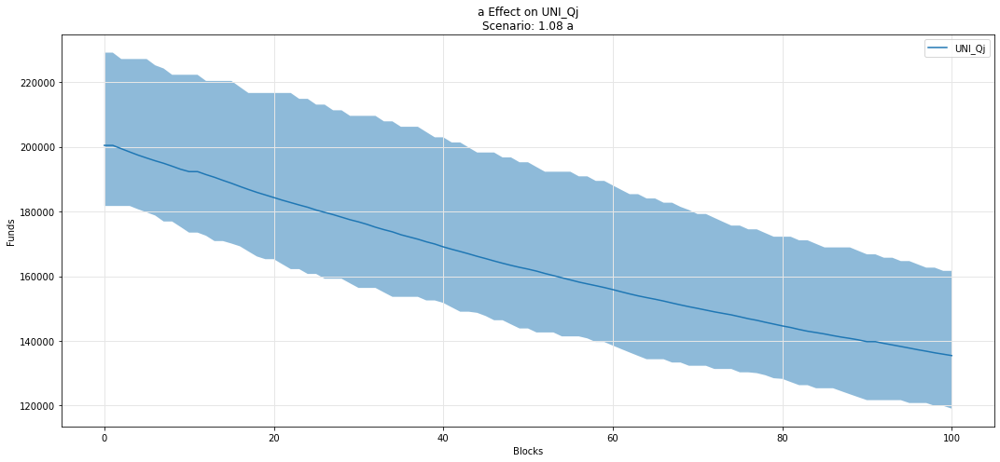

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

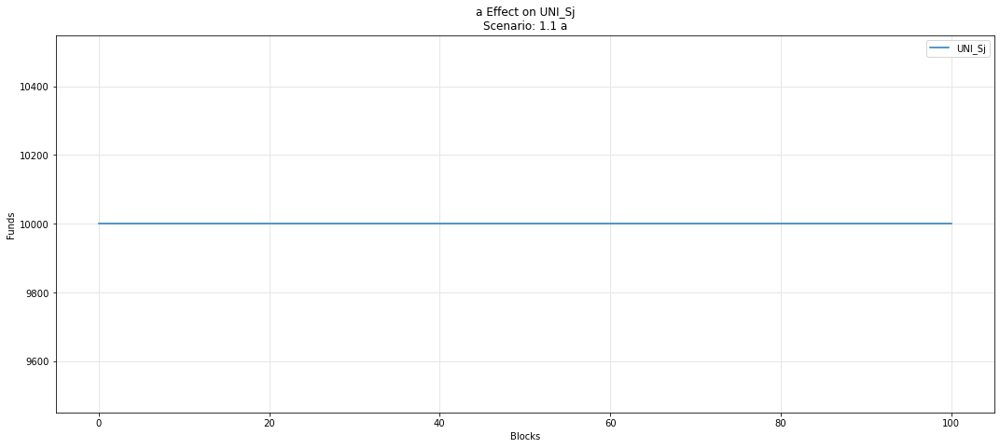

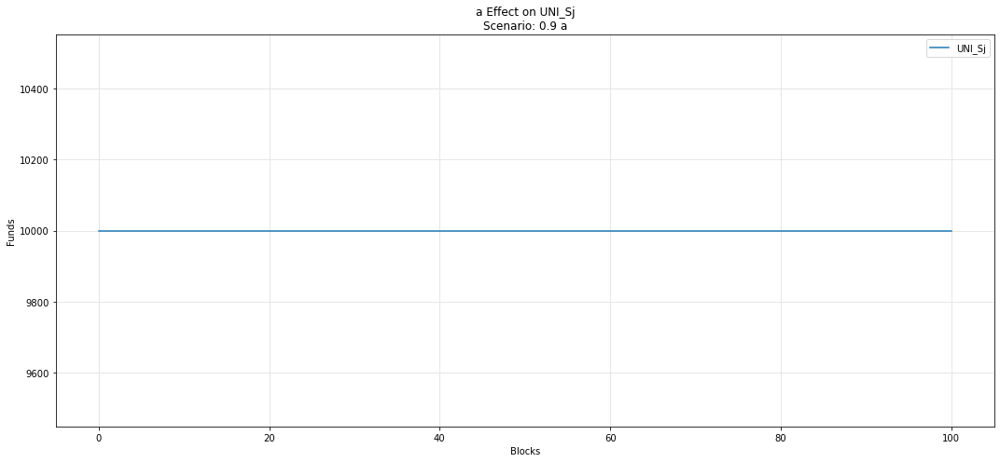

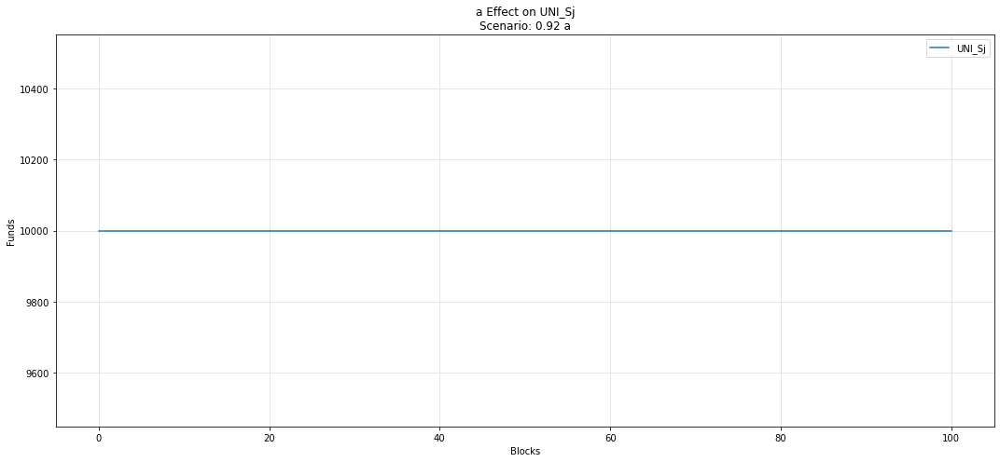

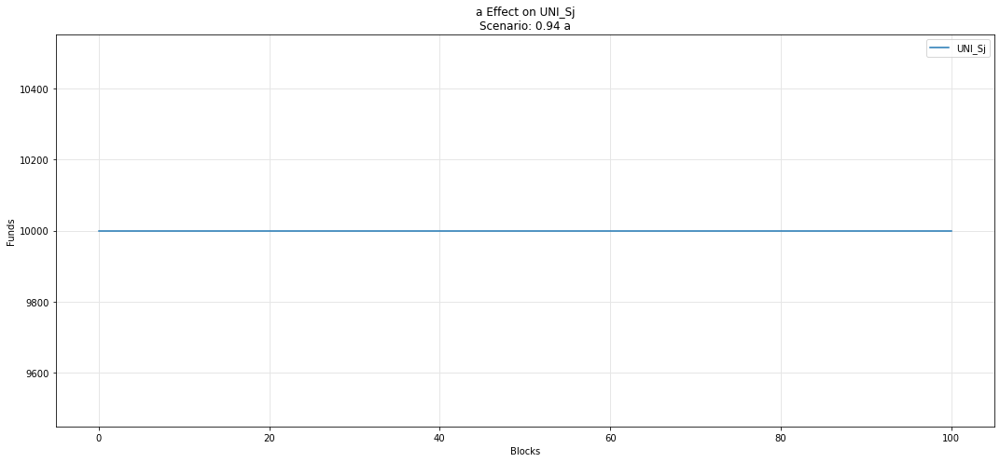

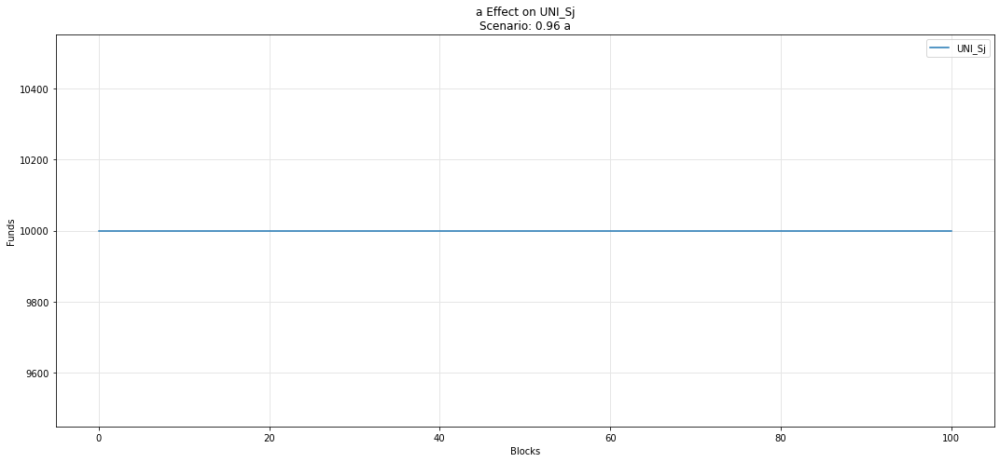

...

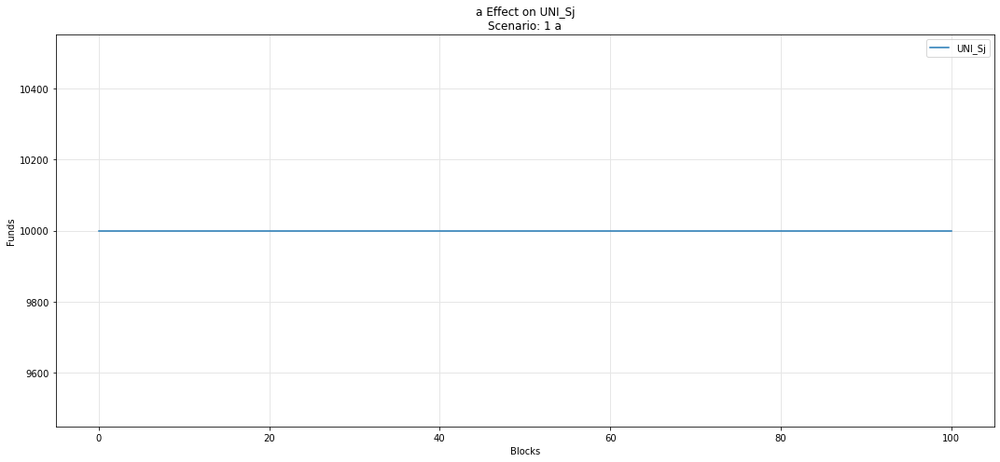

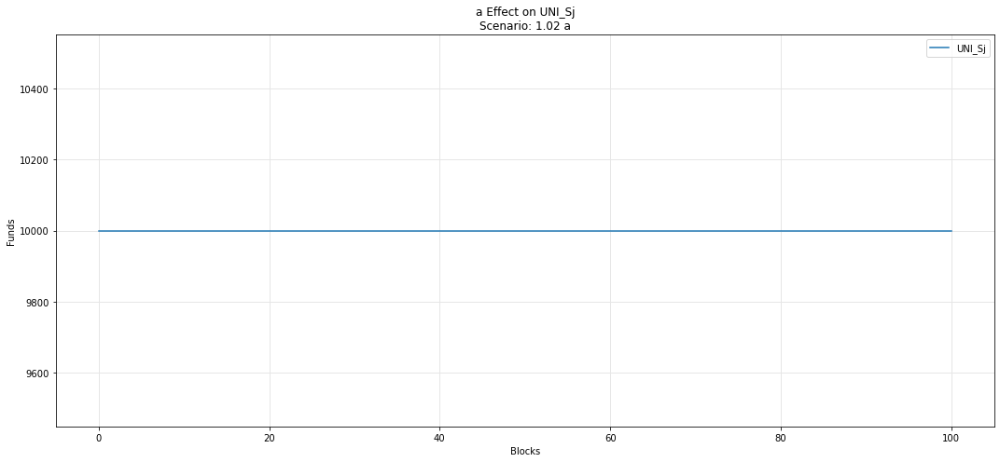

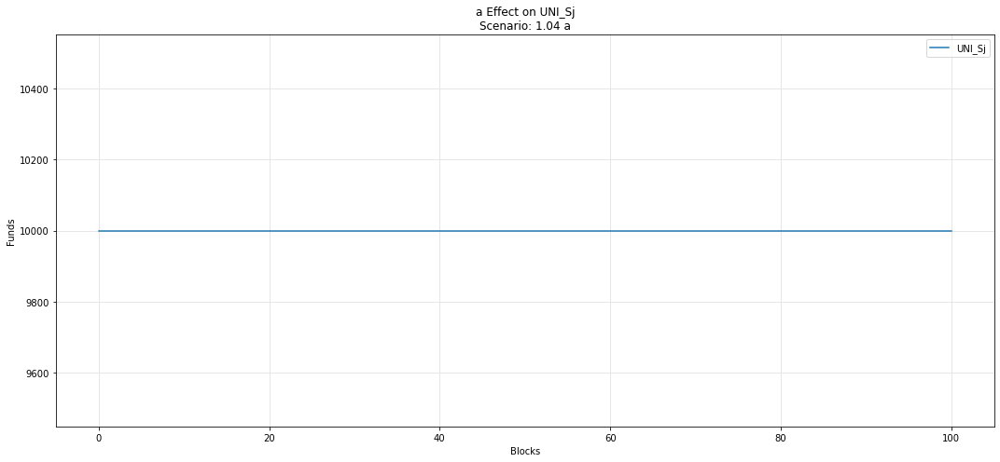

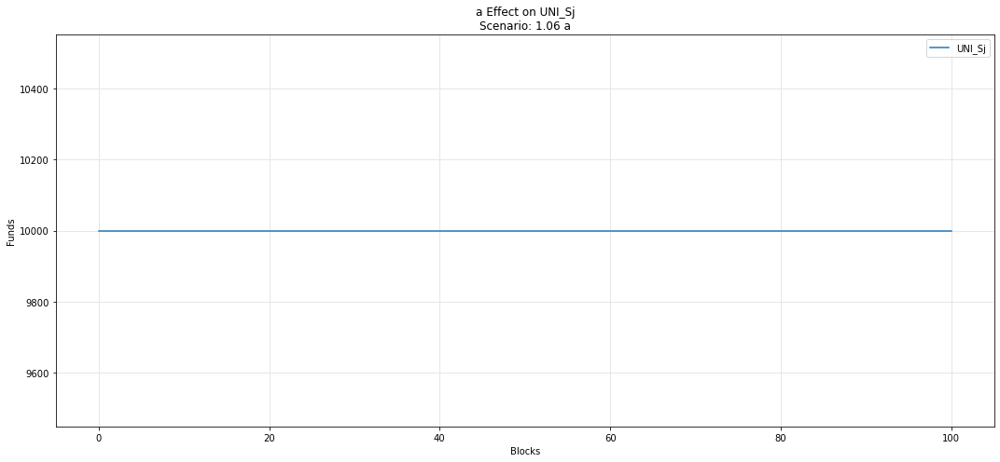

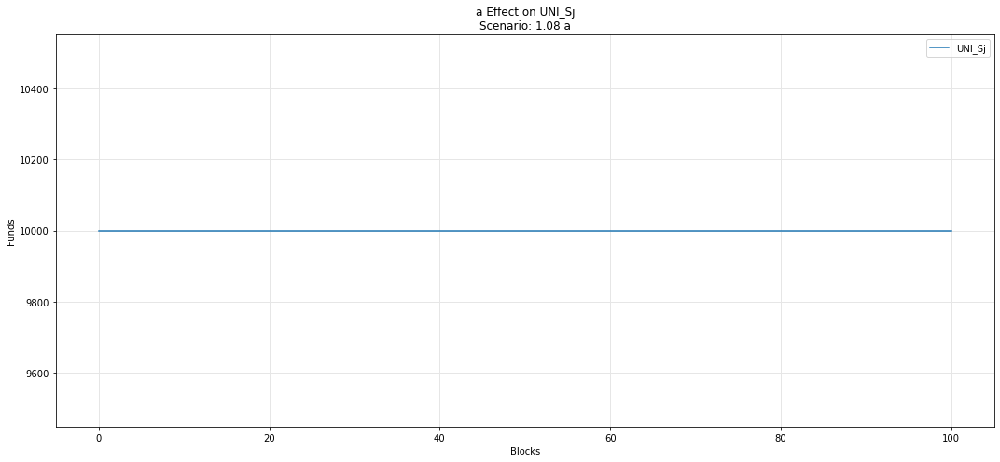

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

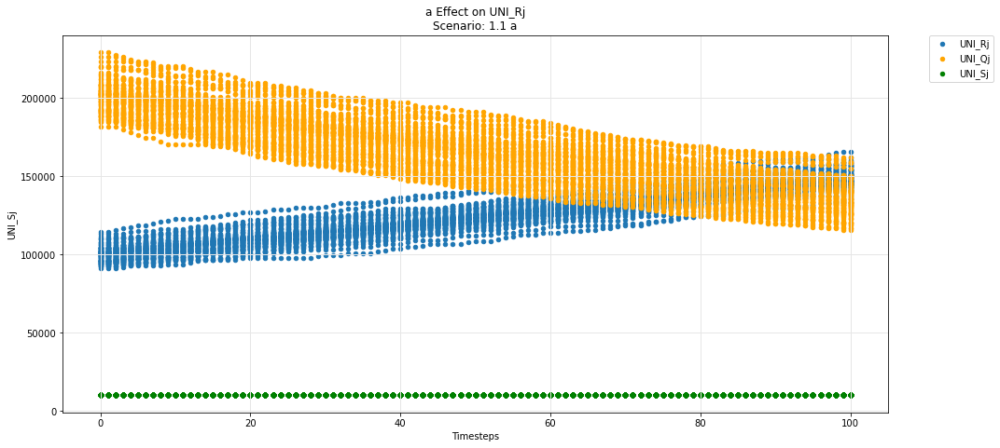

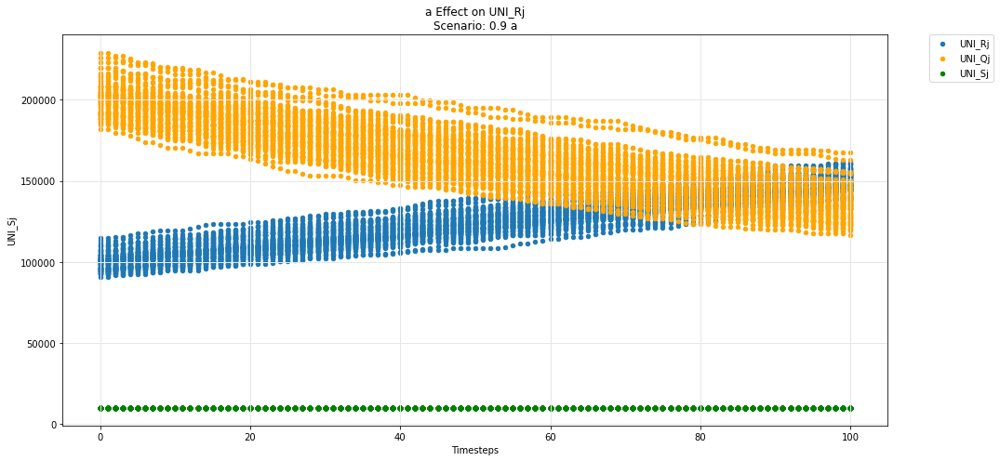

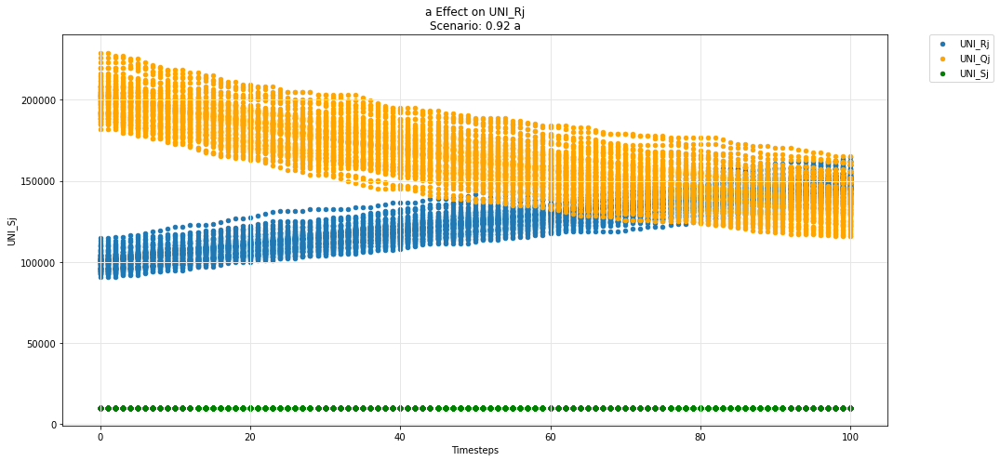

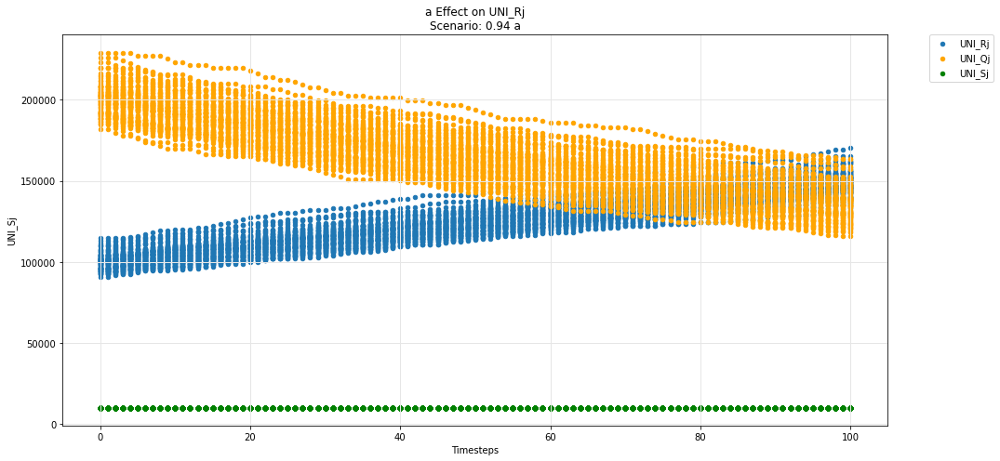

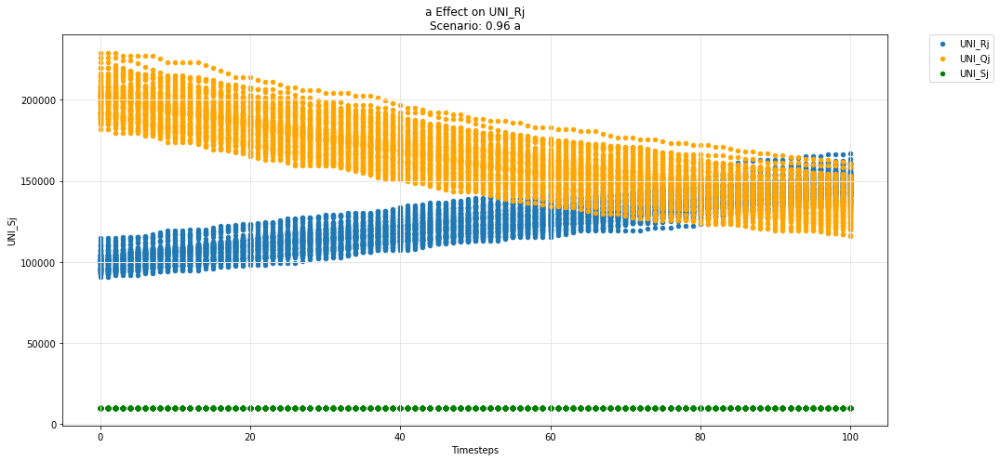

...

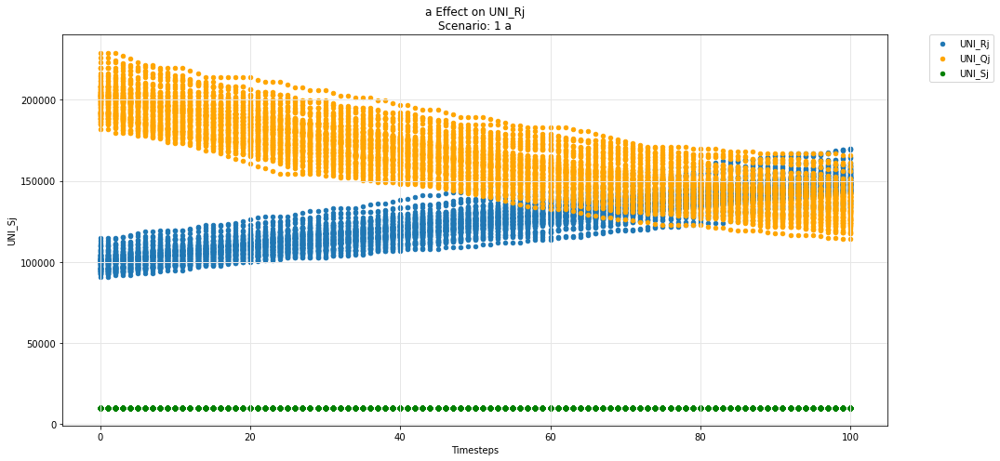

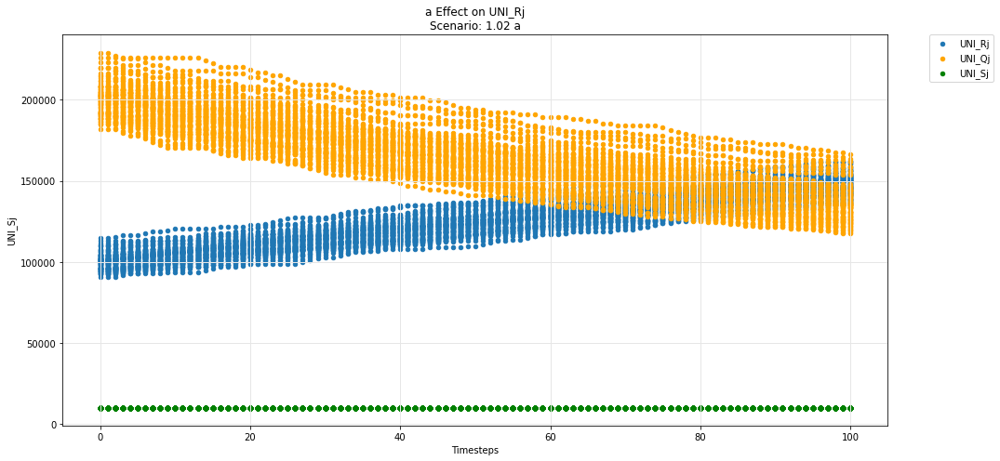

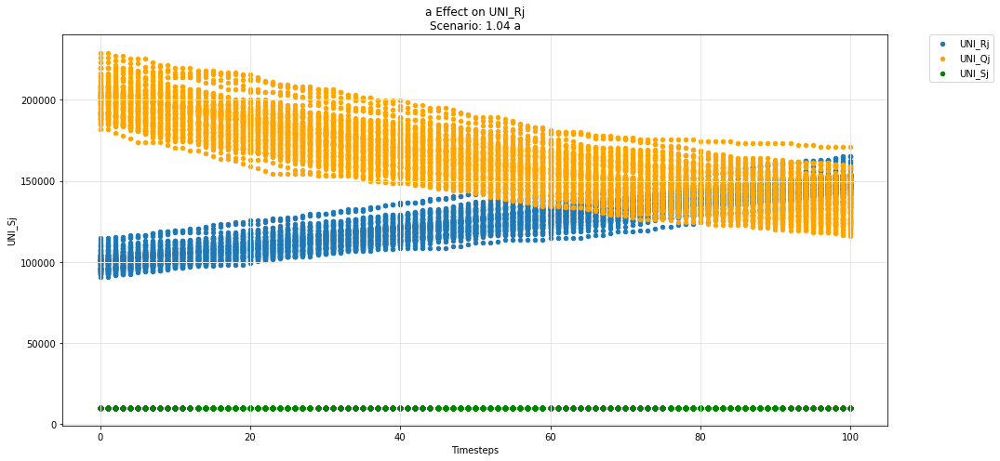

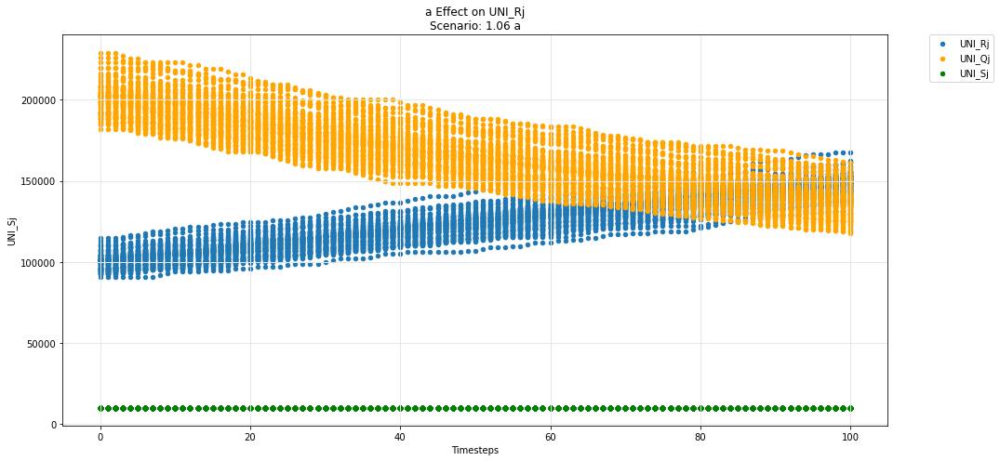

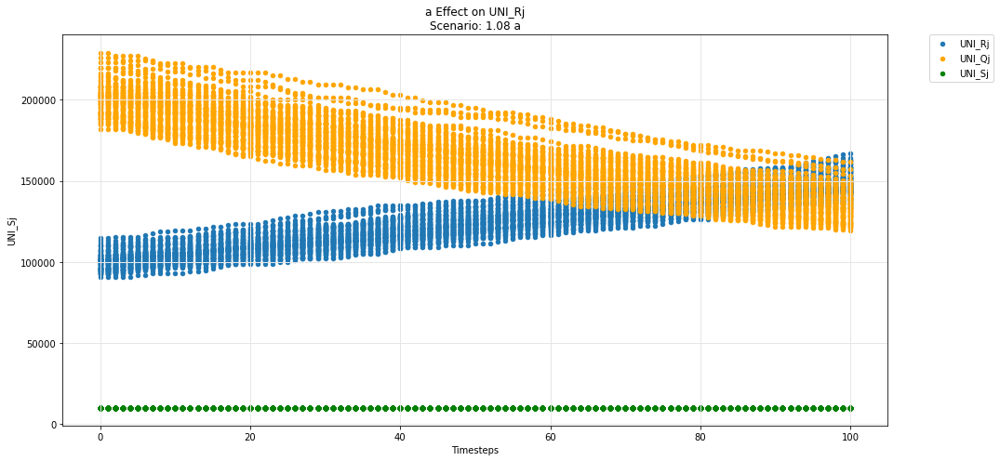

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

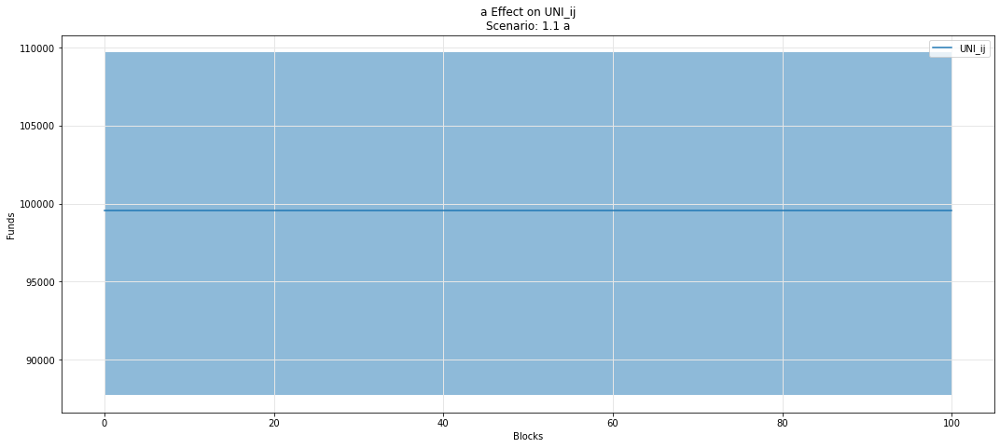

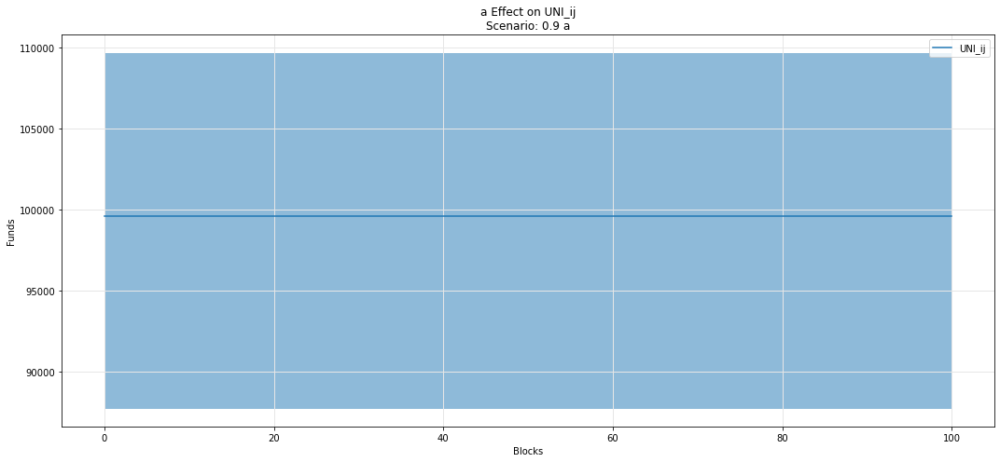

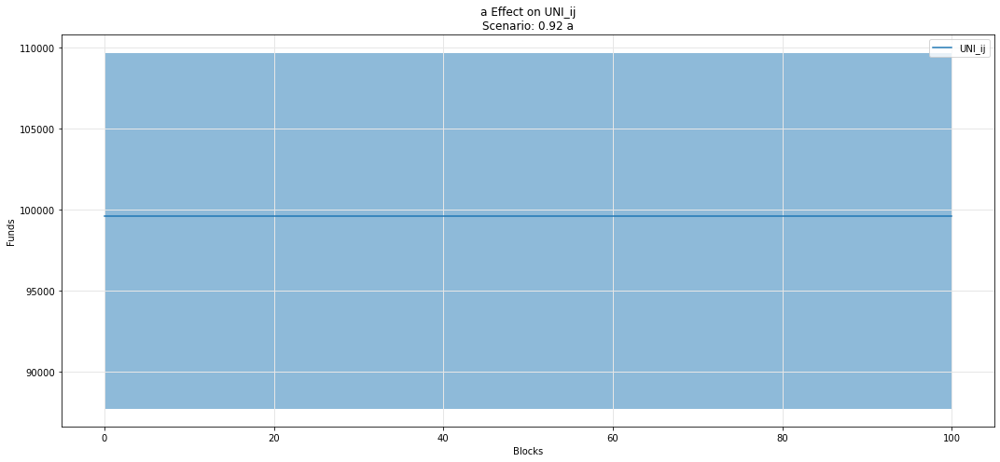

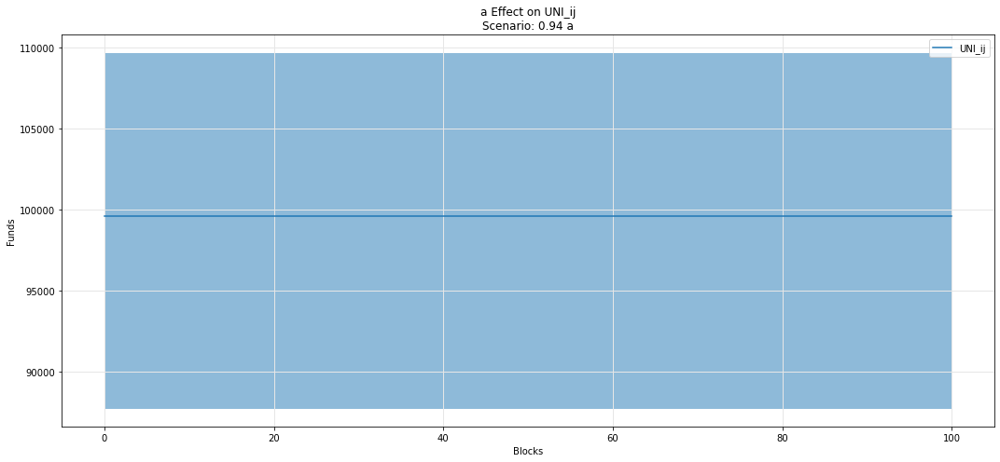

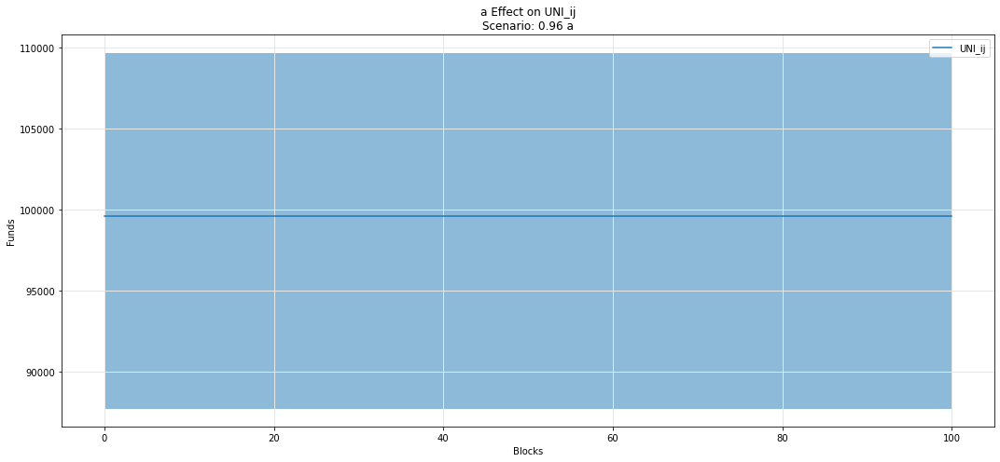

...

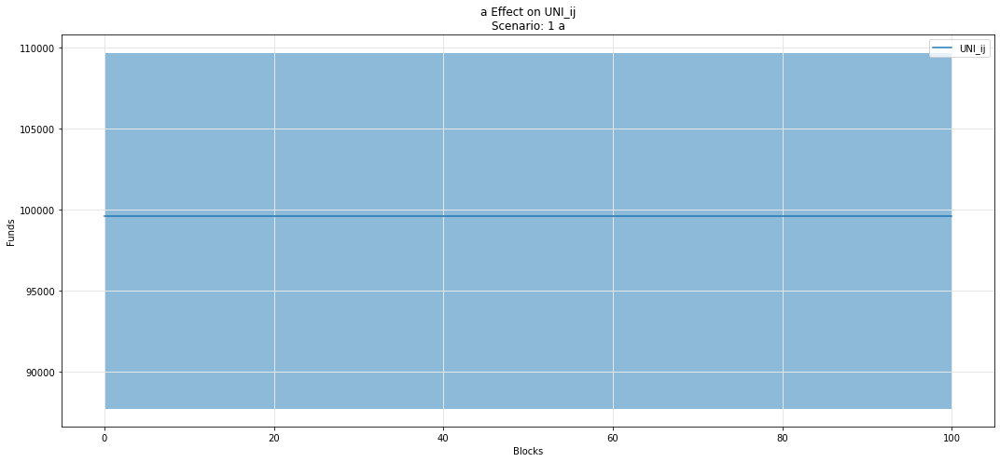

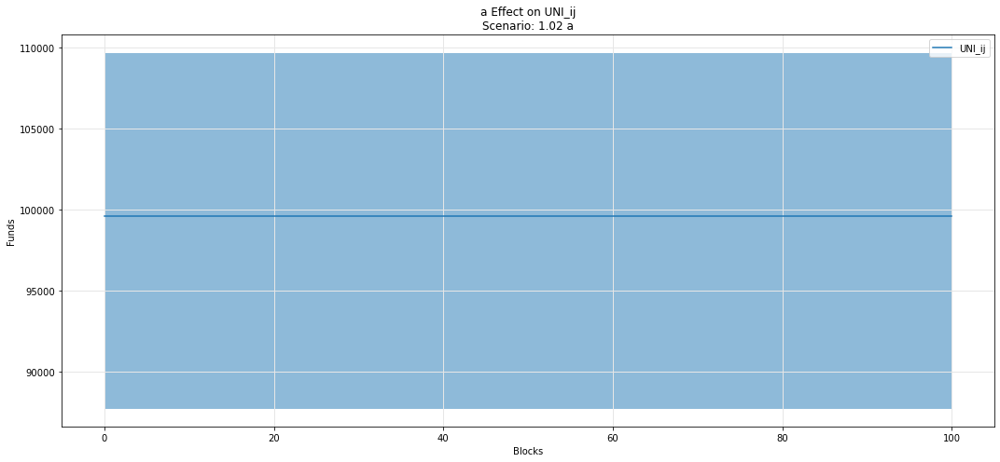

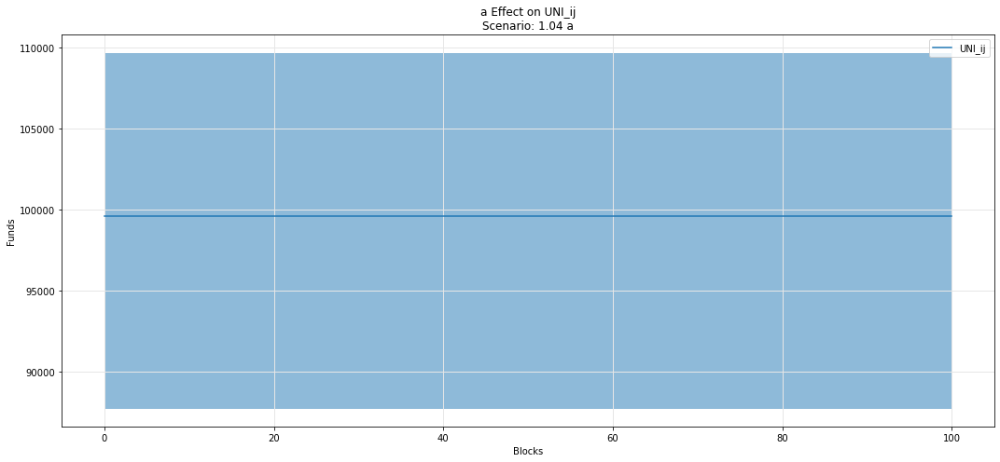

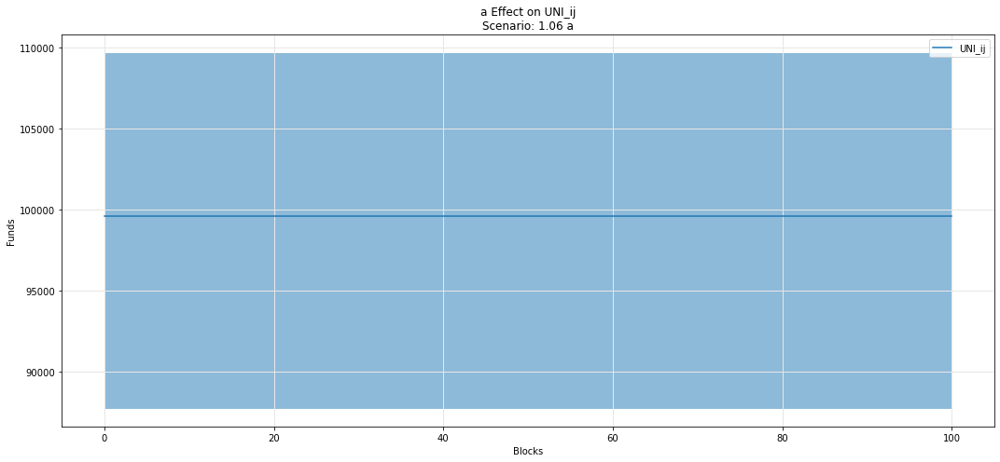

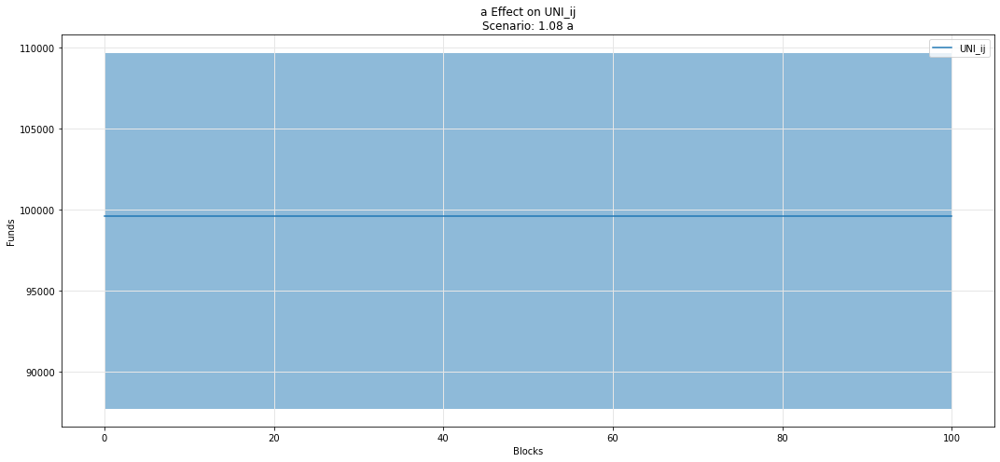

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

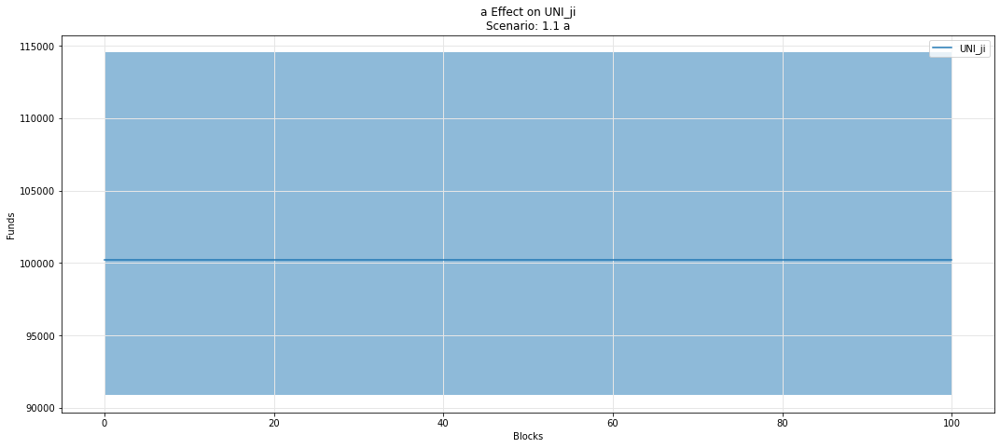

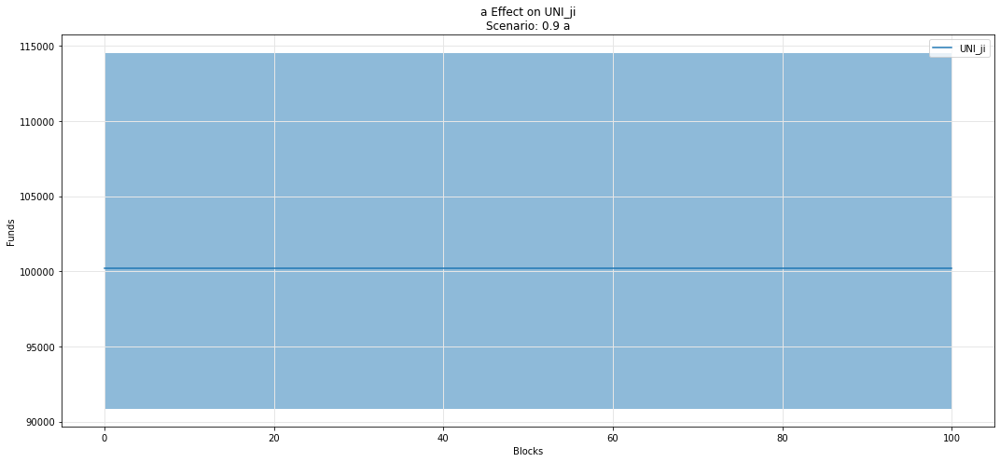

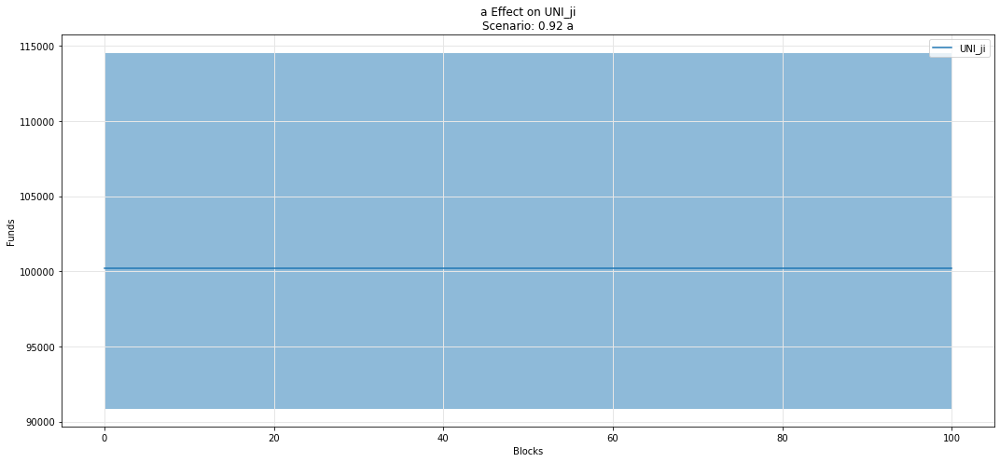

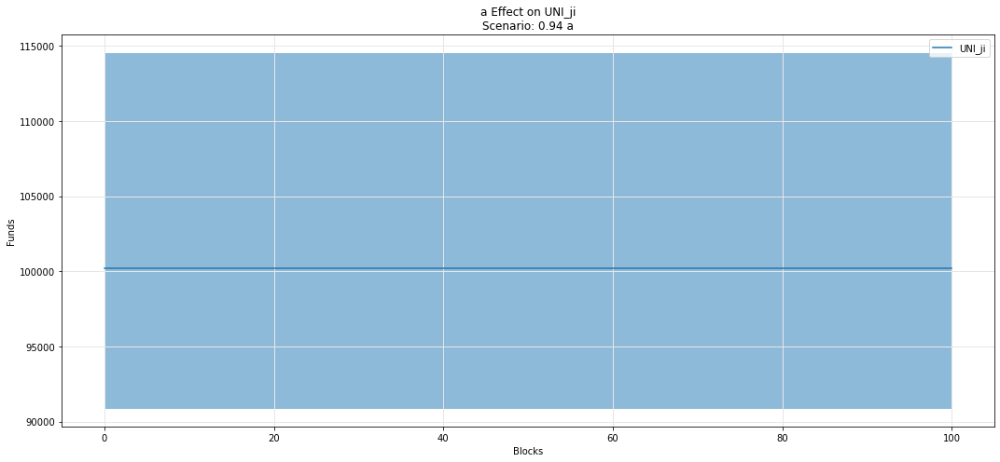

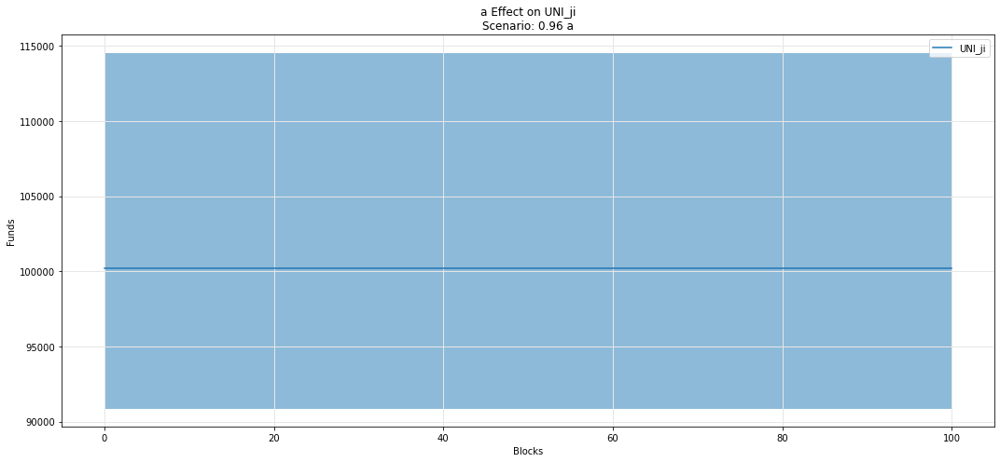

...

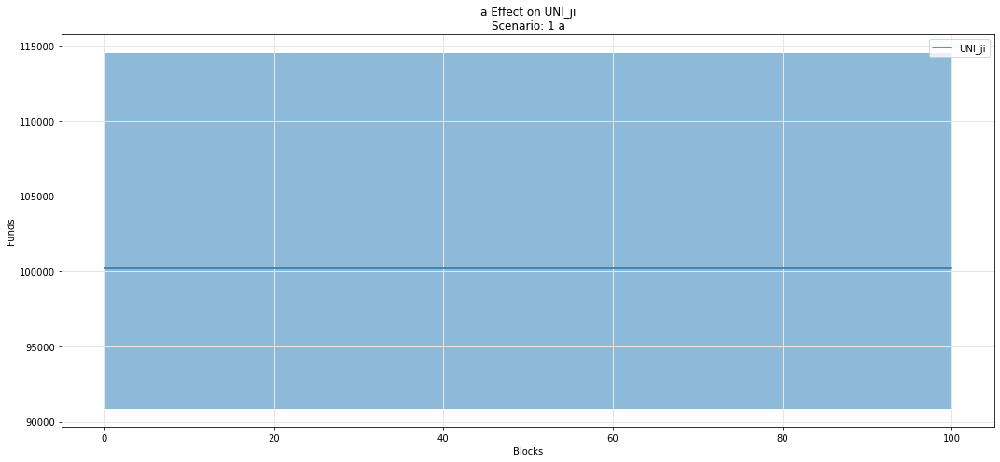

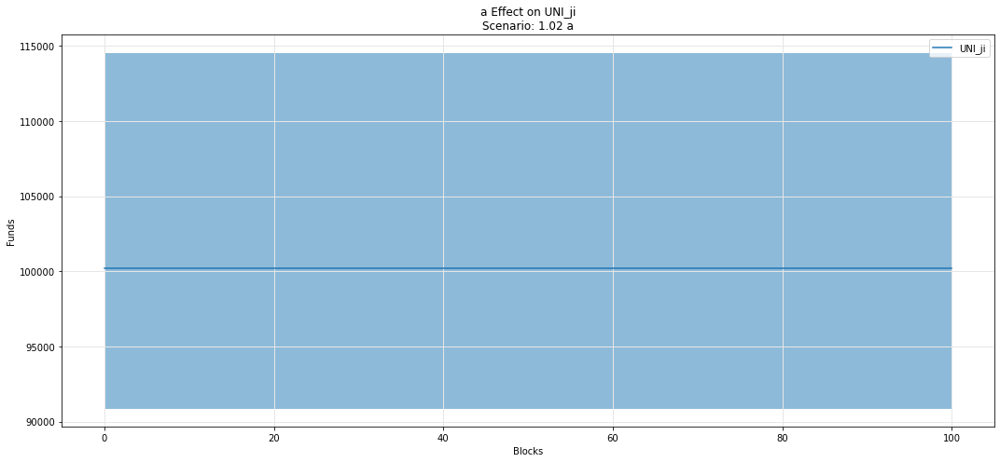

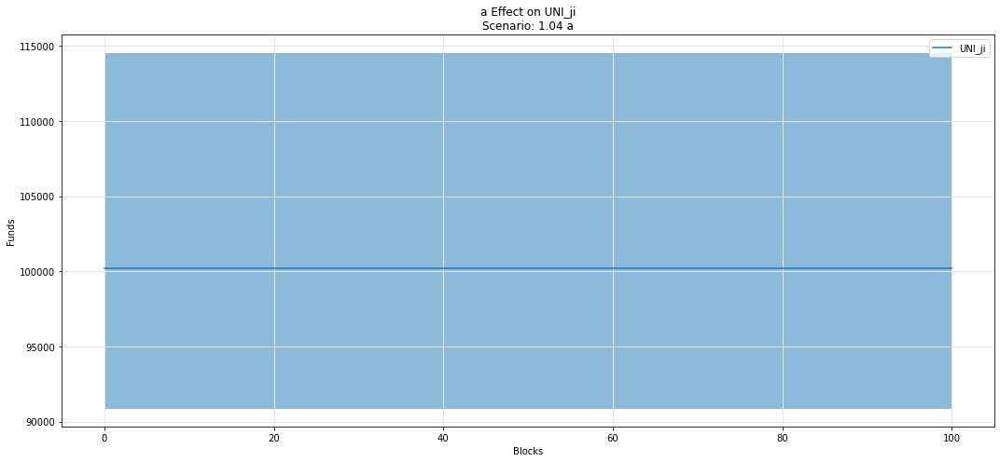

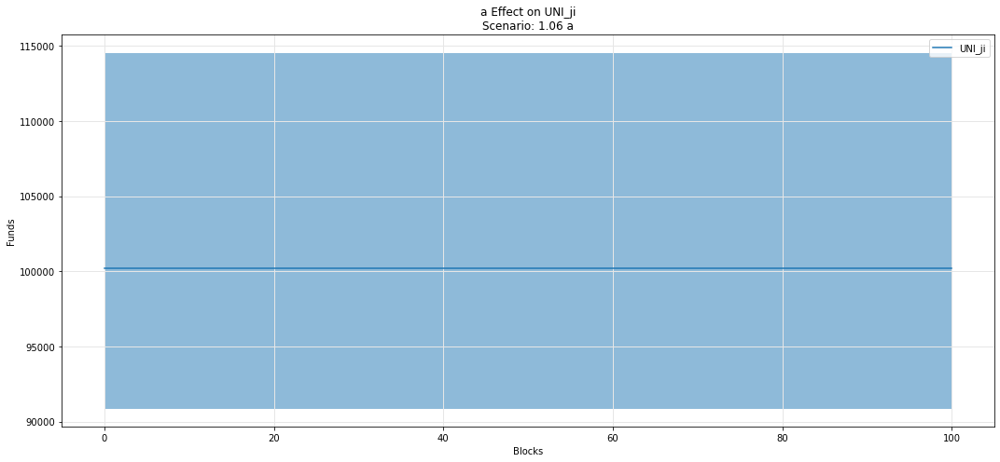

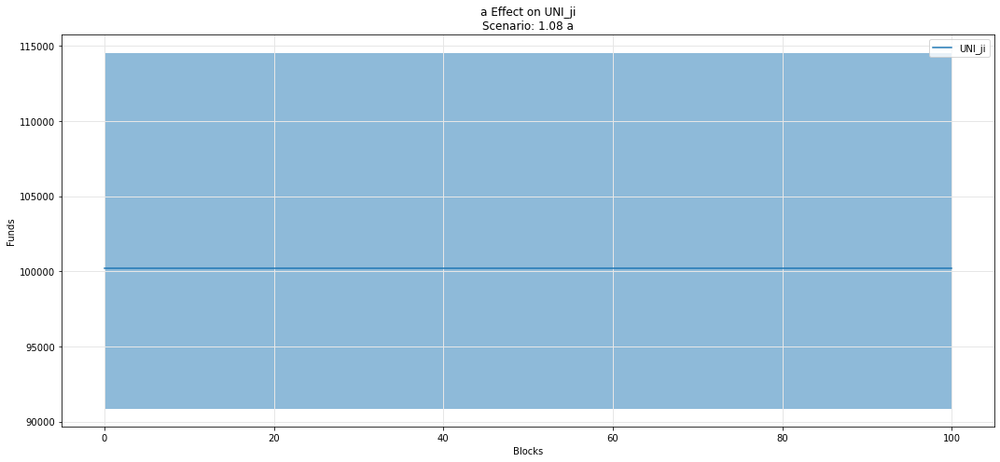

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

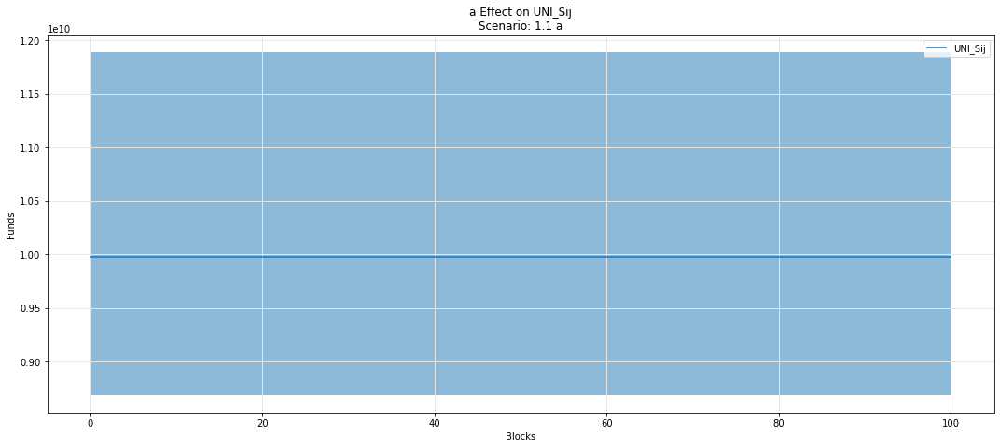

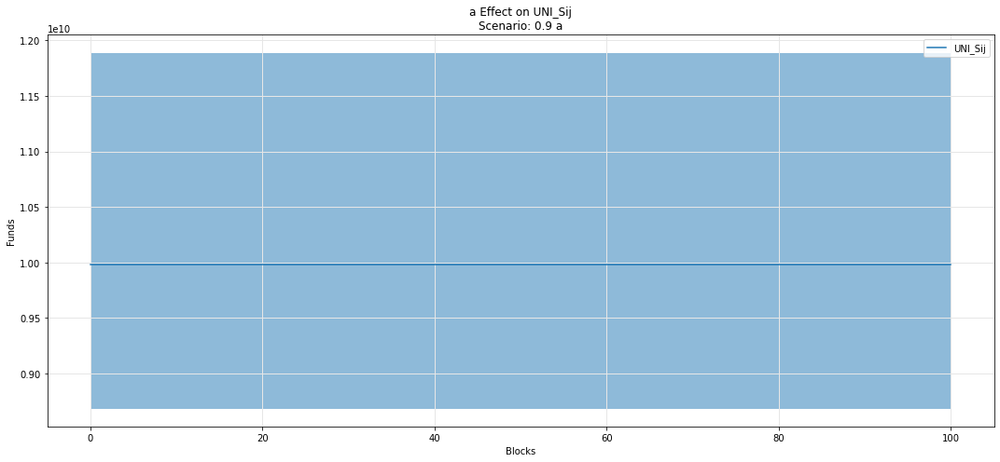

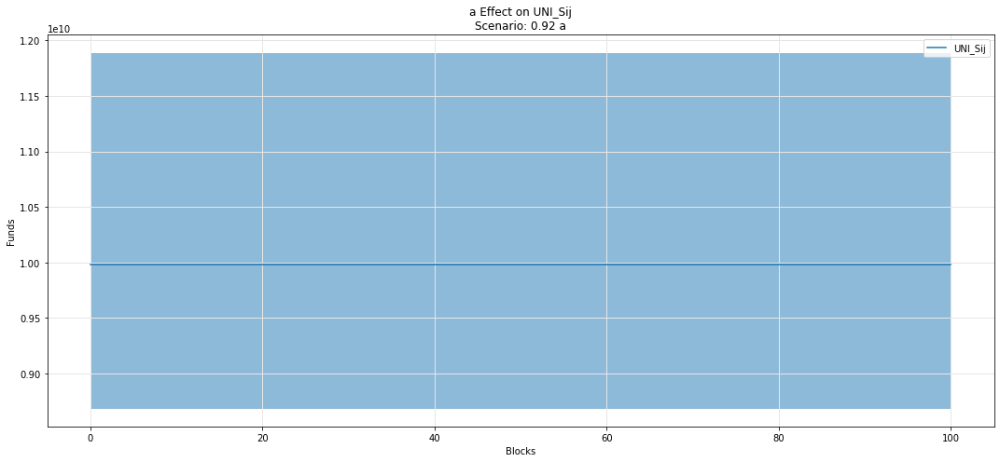

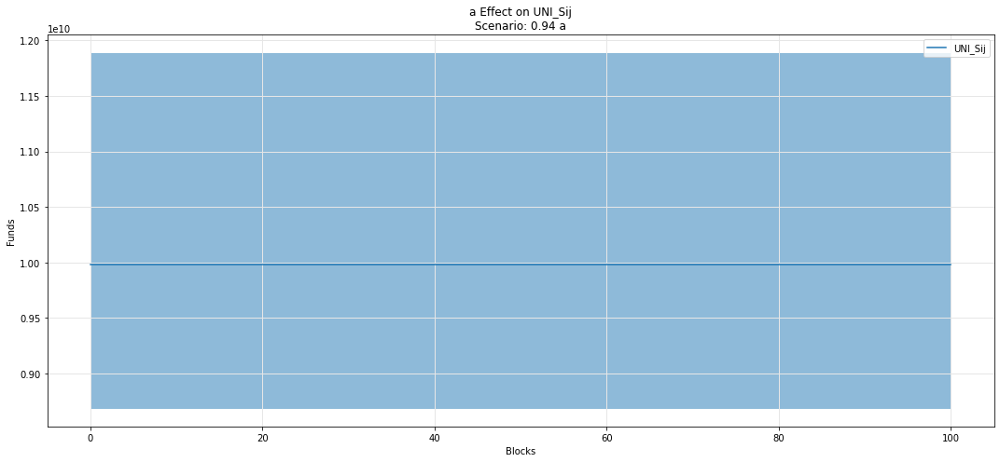

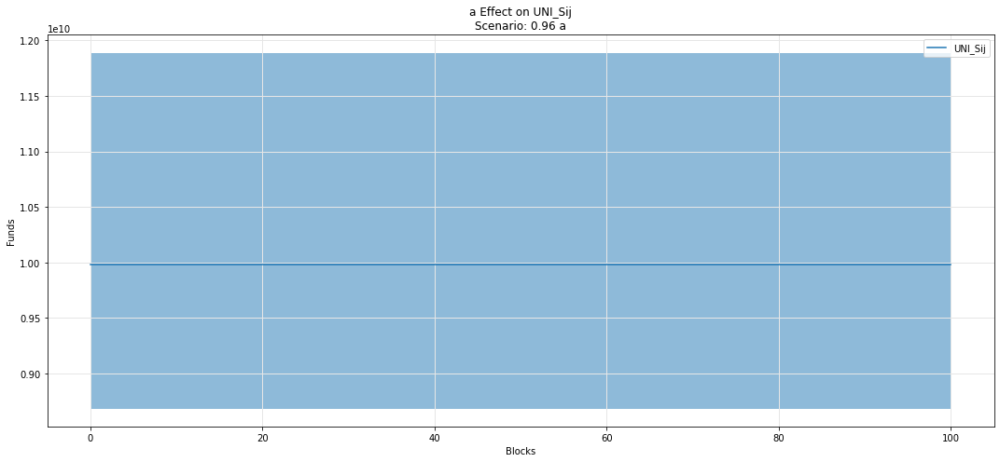

...

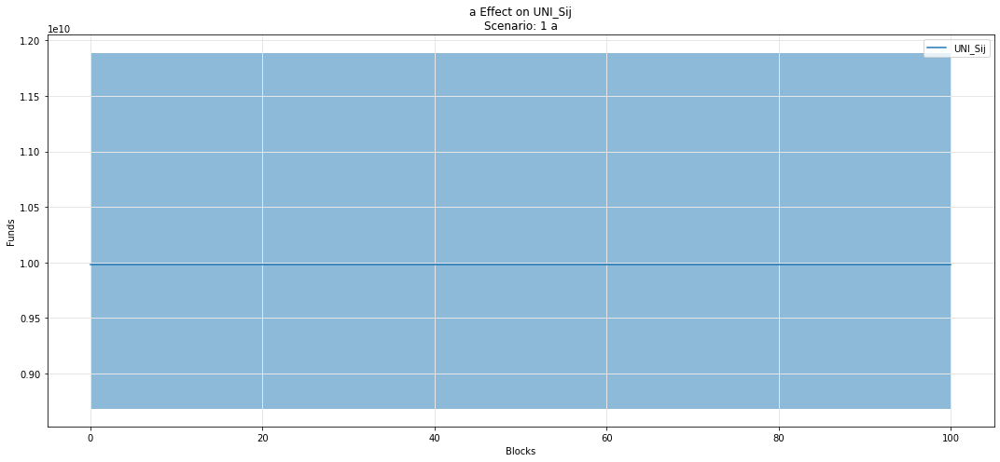

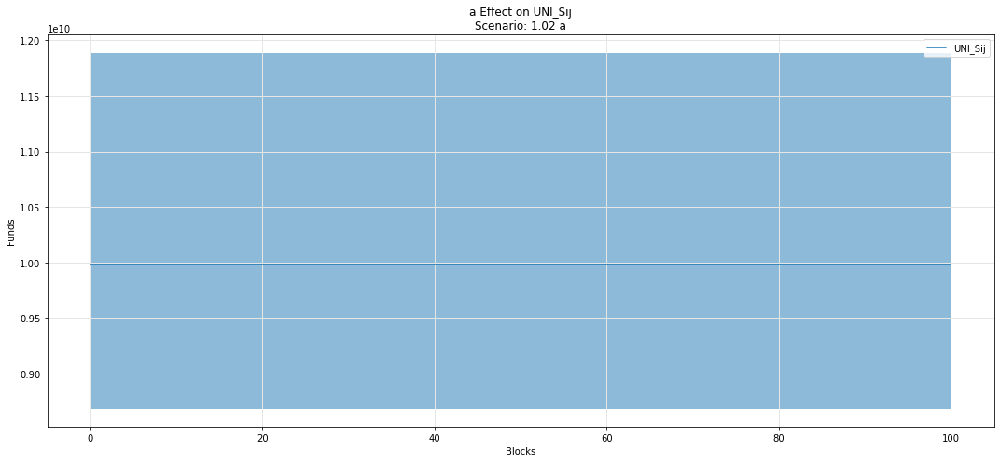

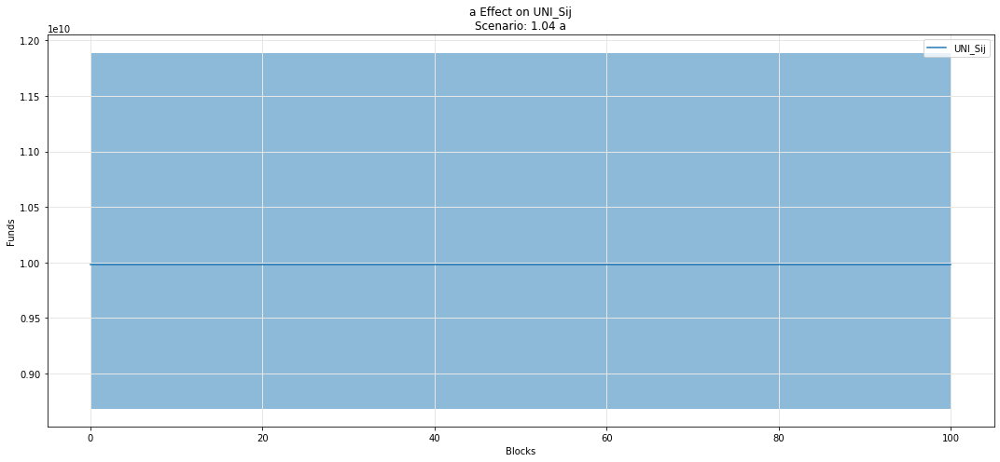

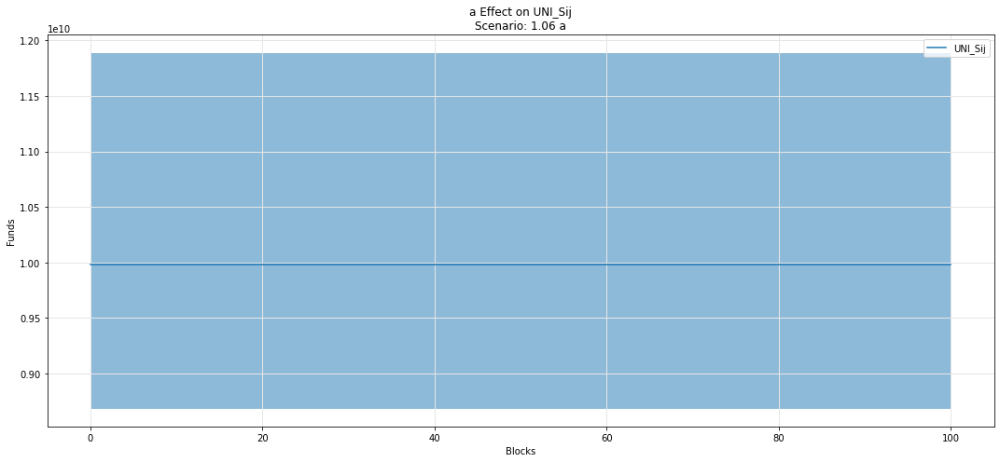

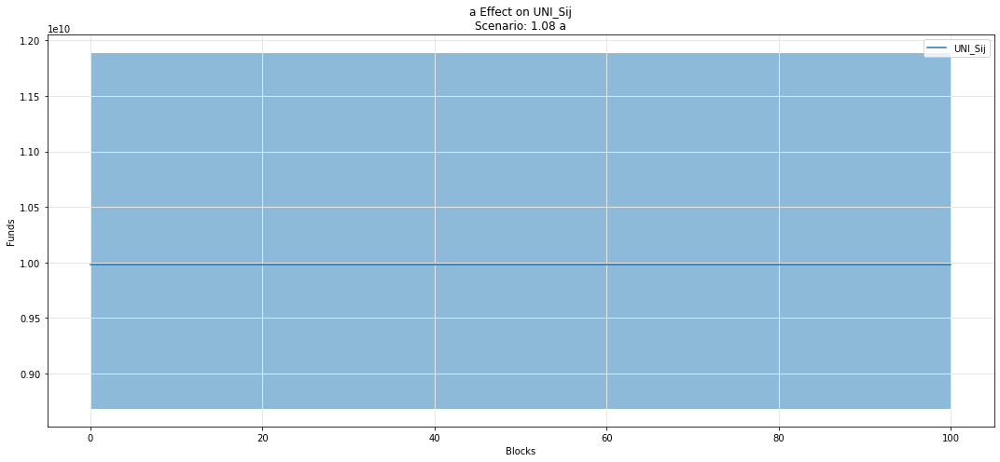

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

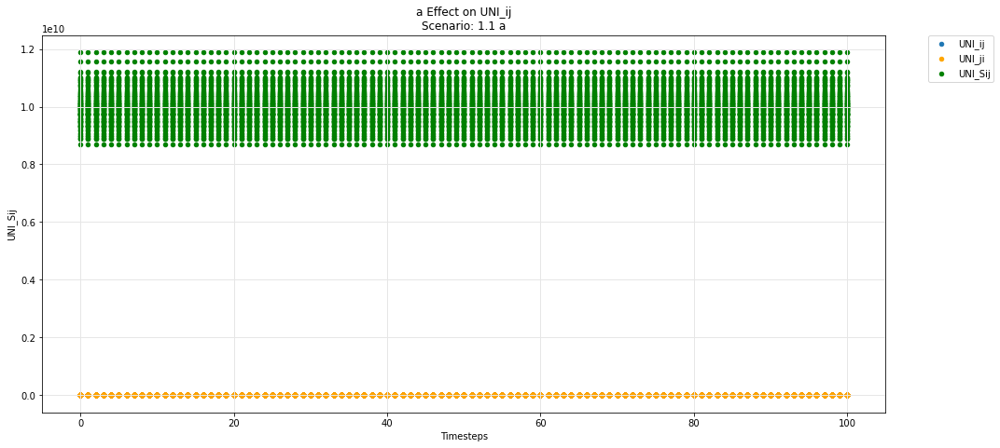

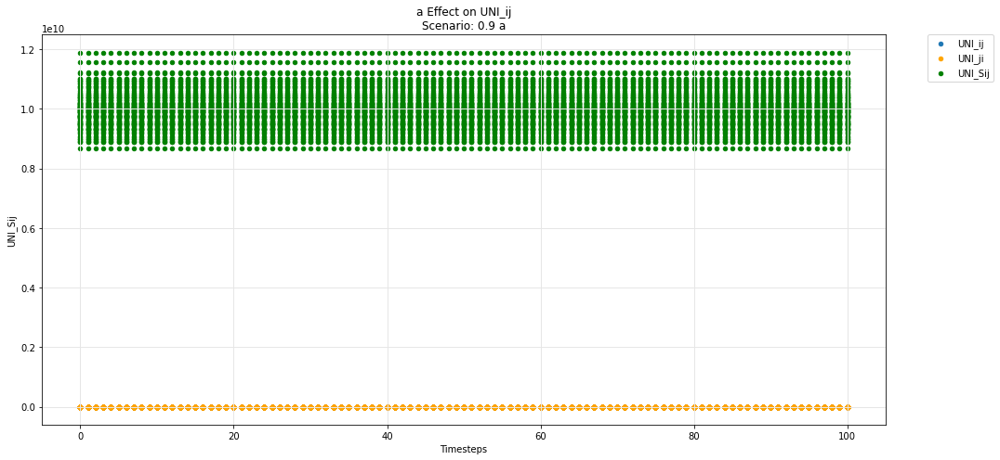

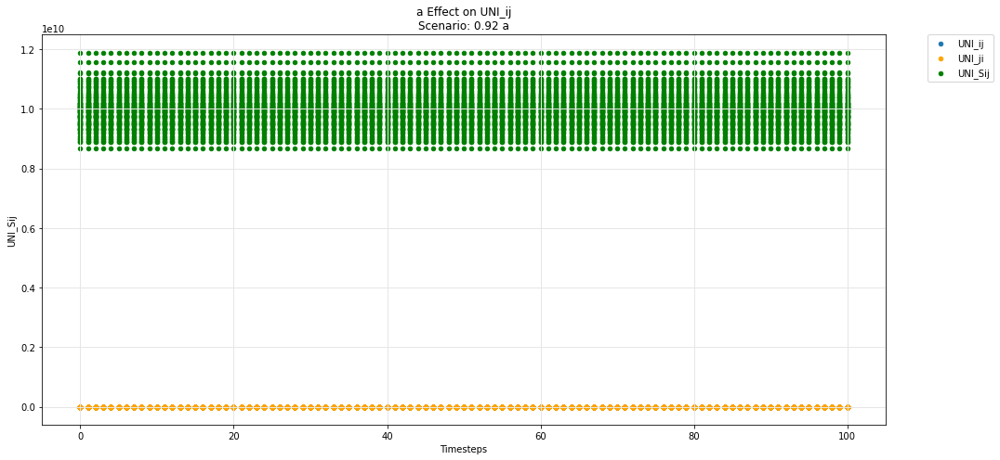

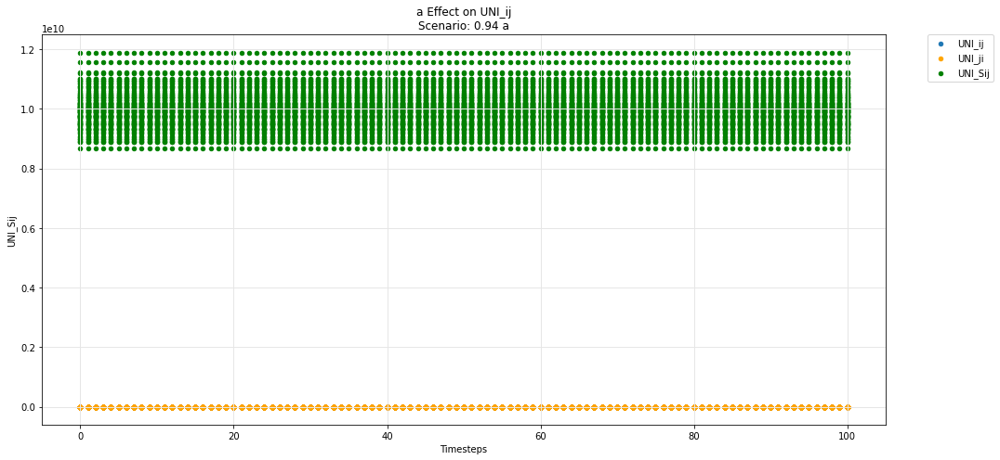

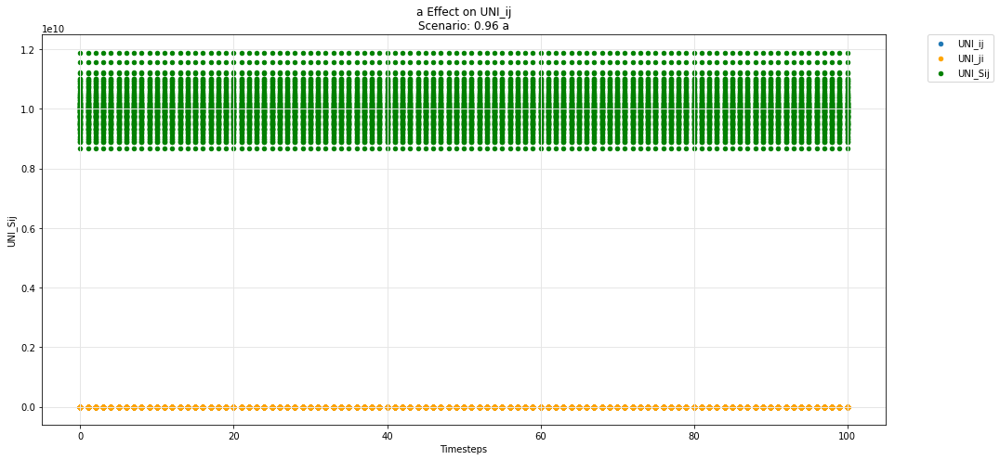

...

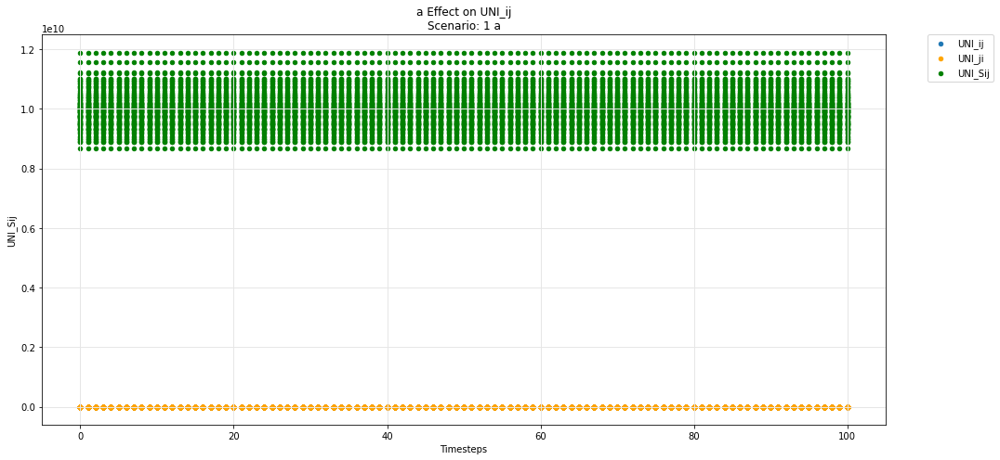

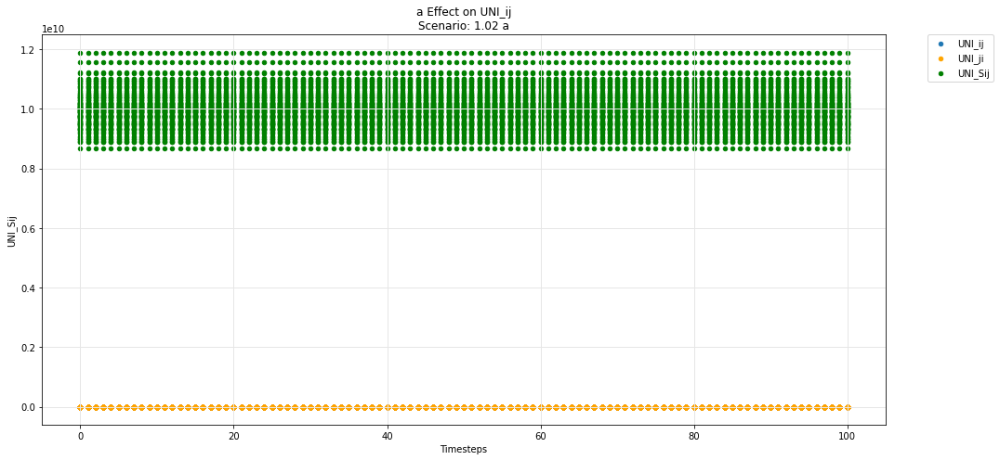

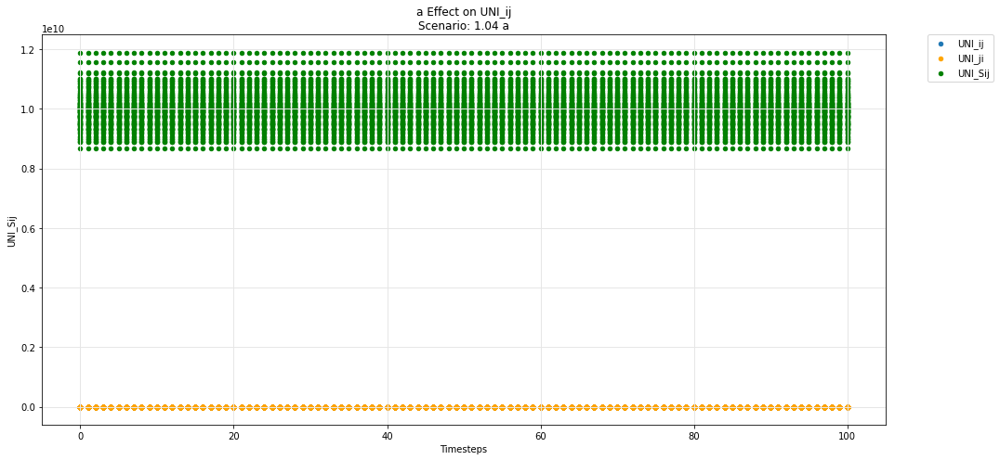

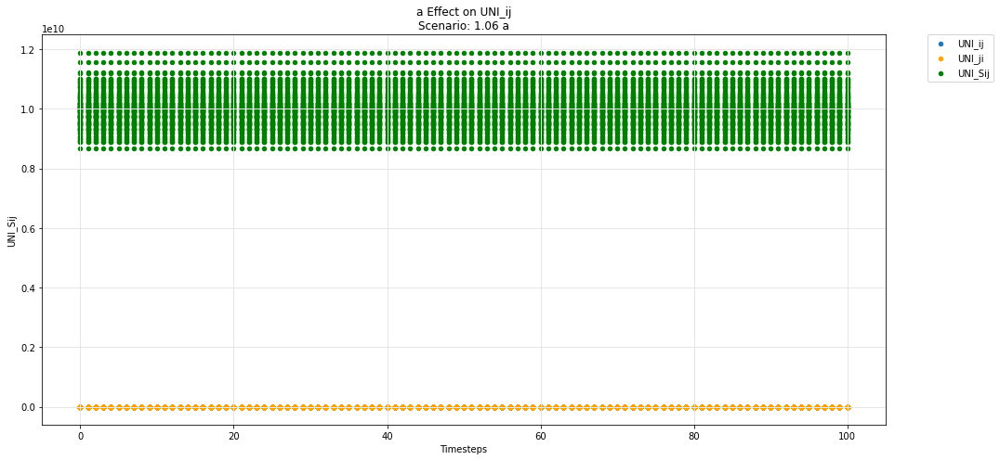

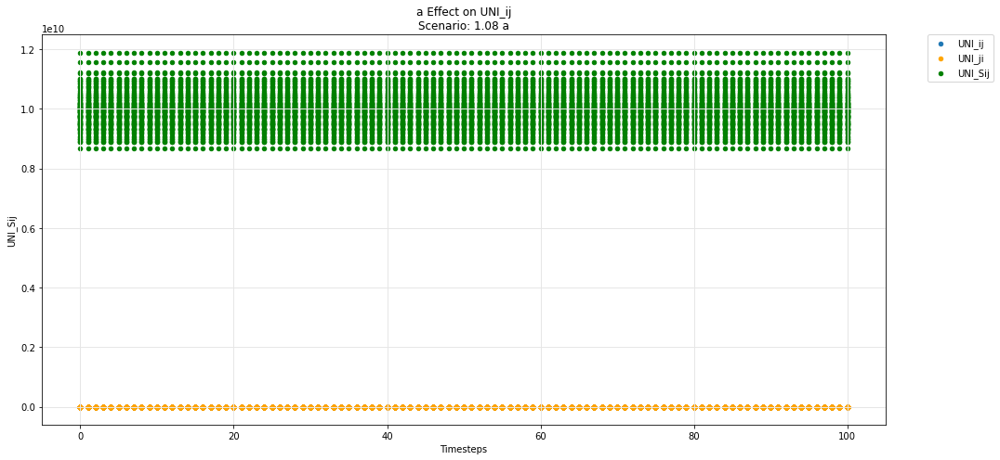

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

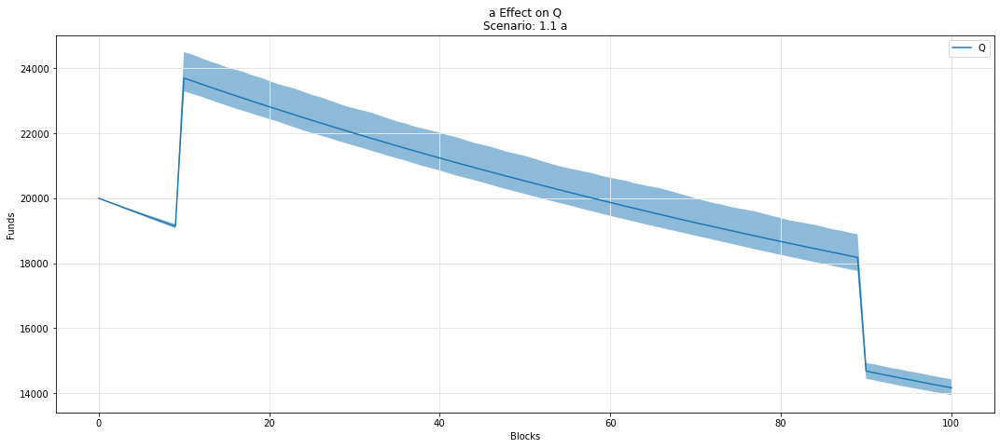

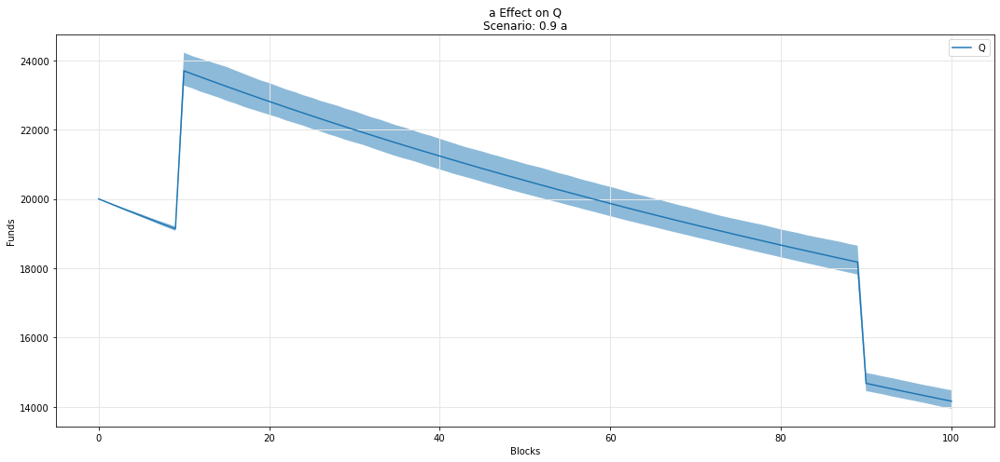

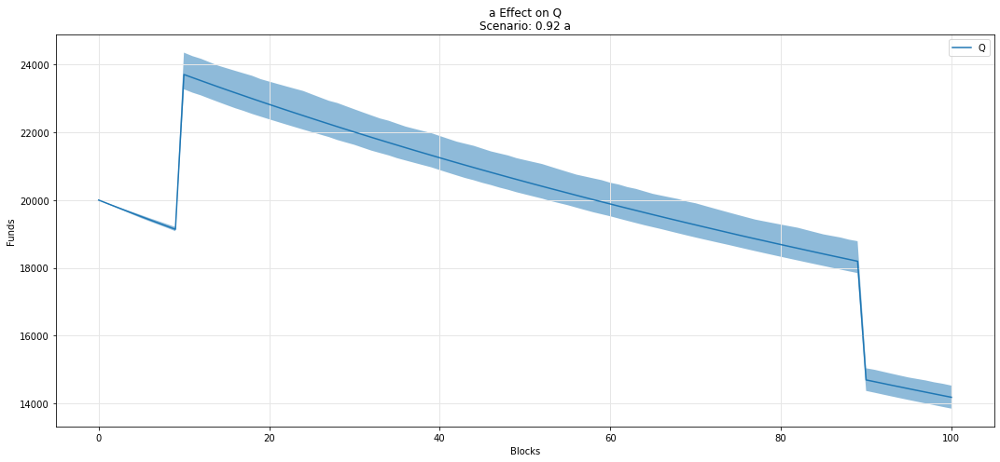

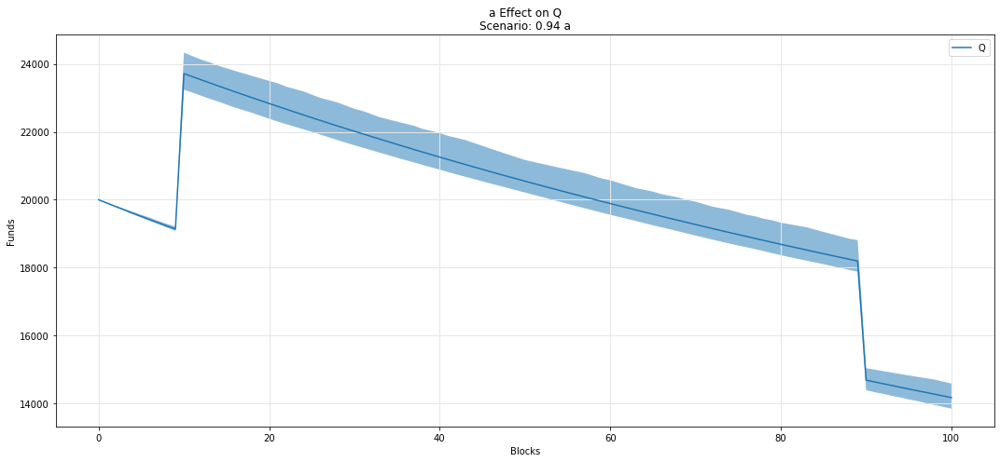

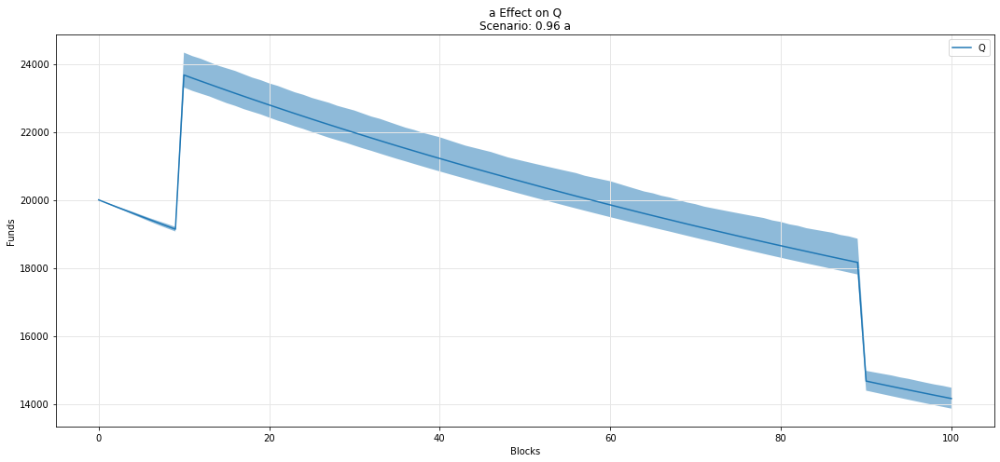

...

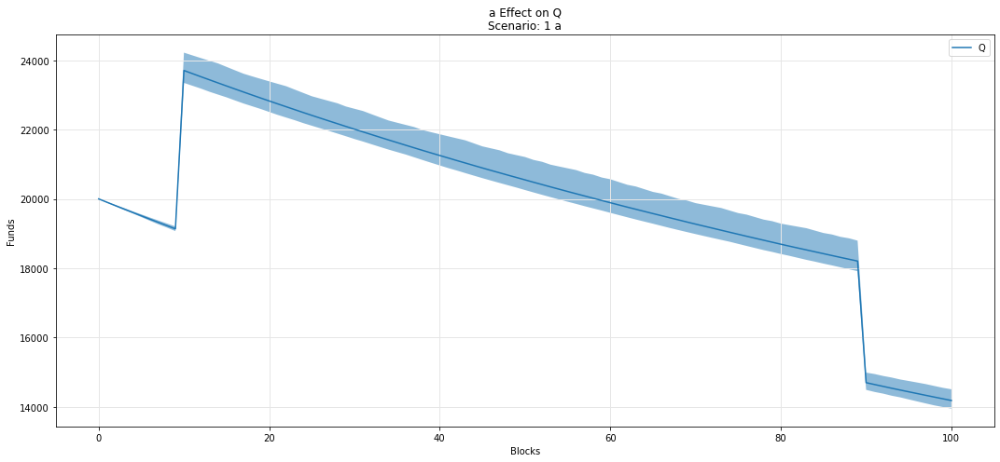

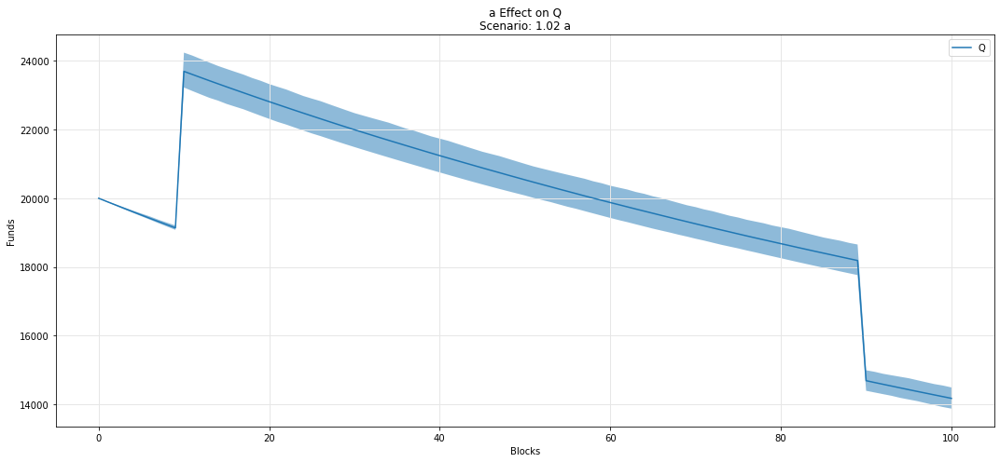

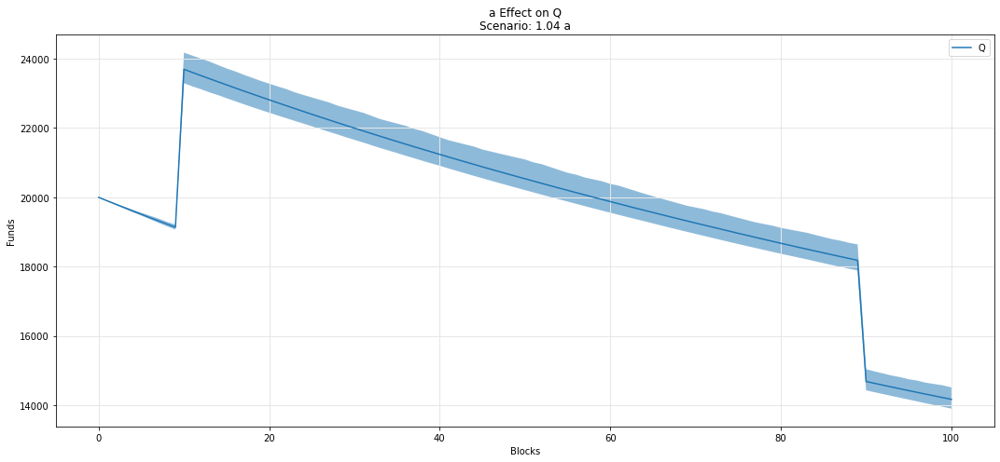

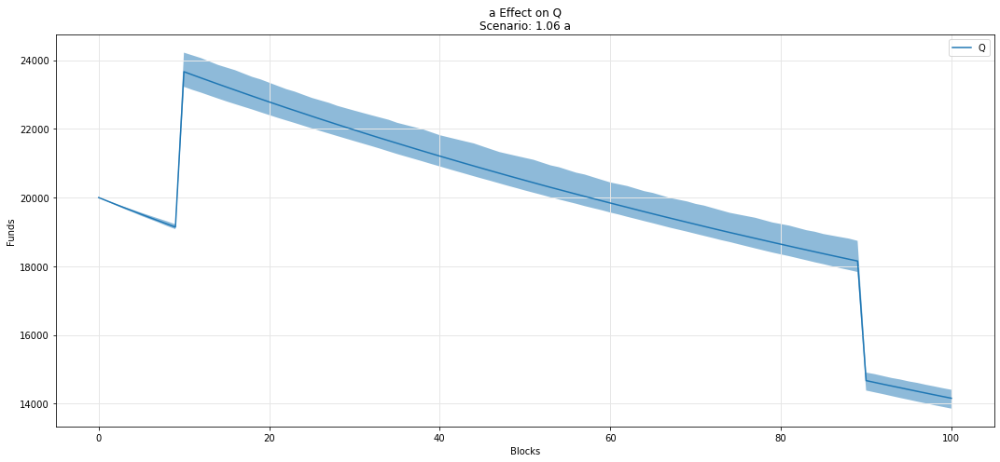

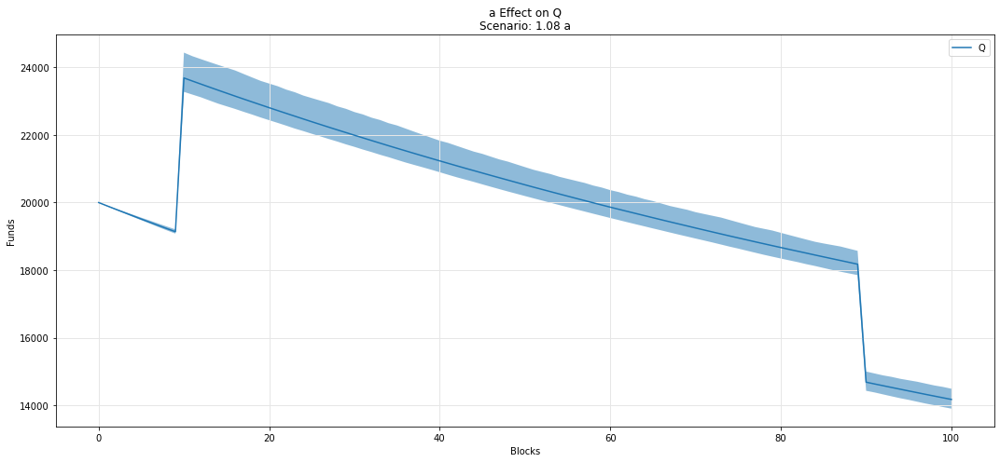

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

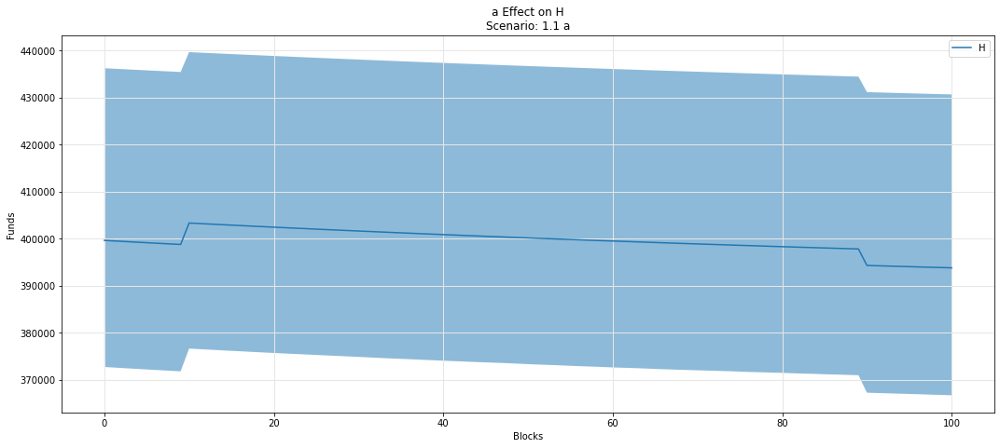

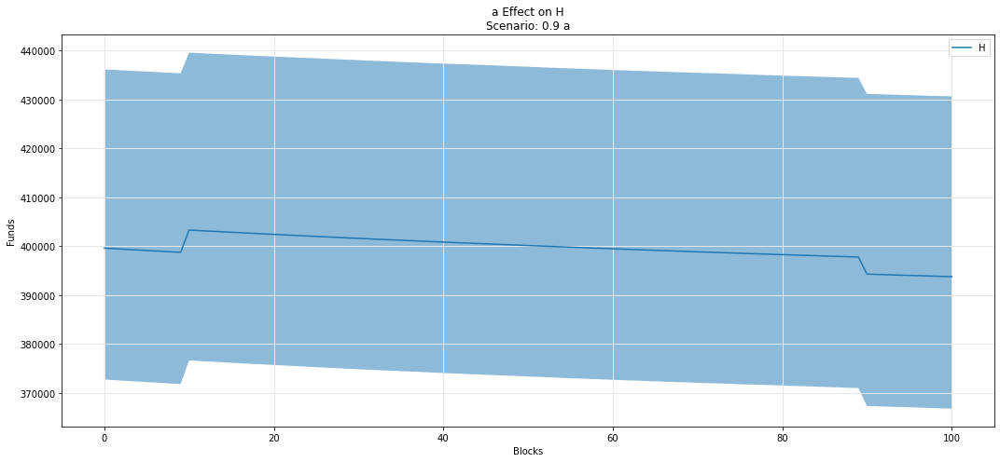

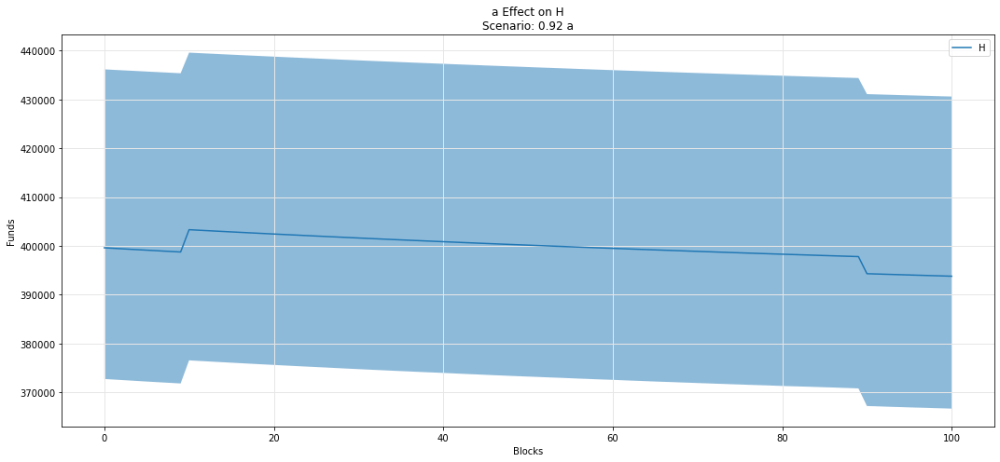

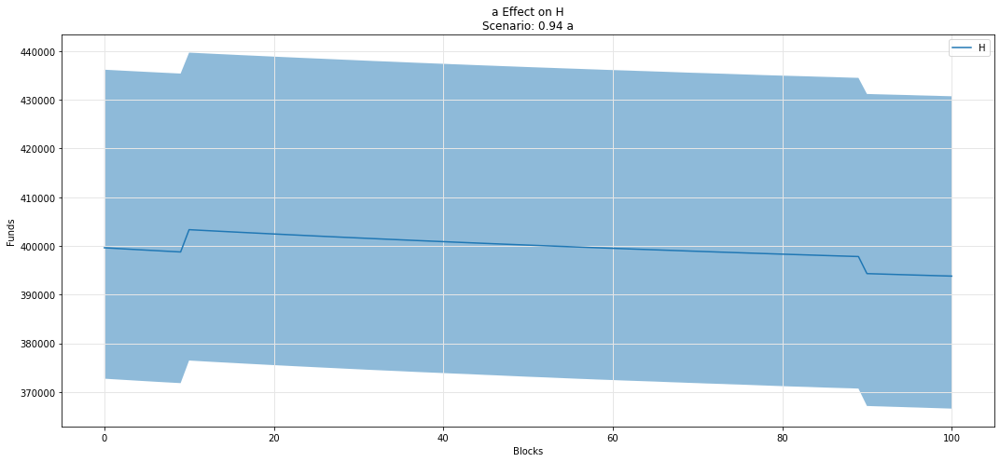

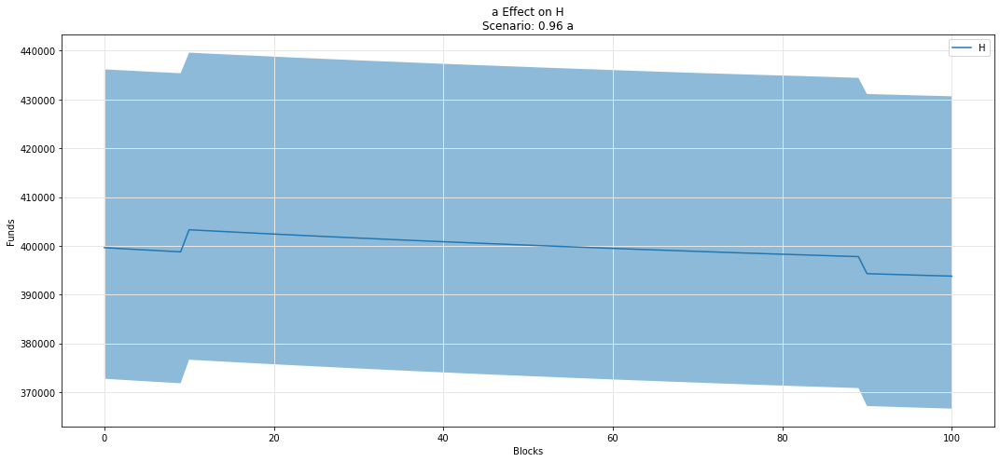

...

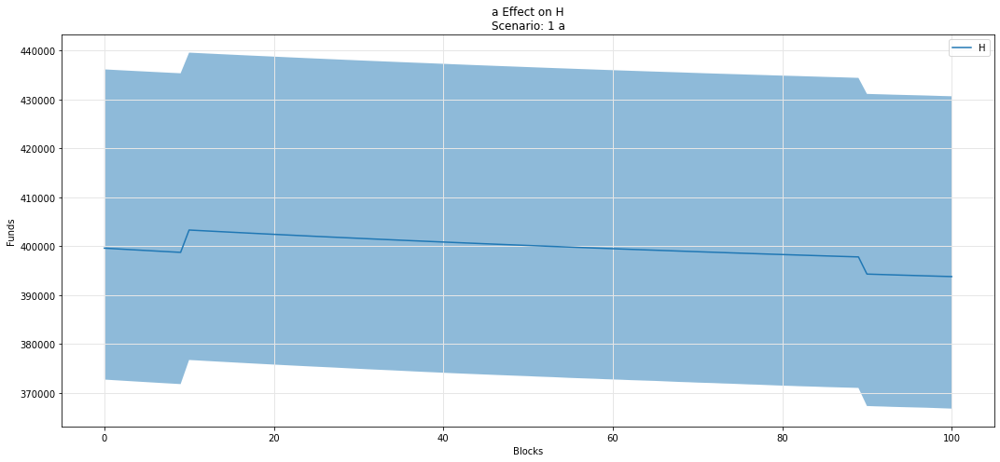

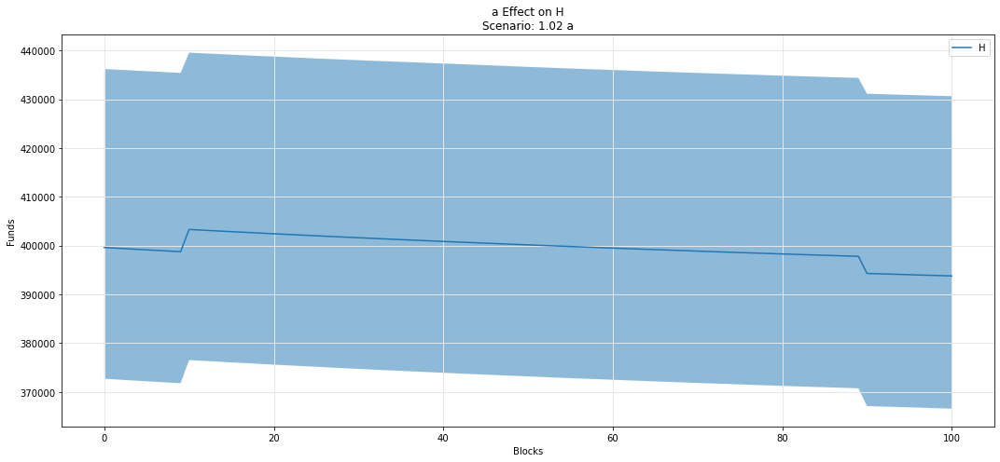

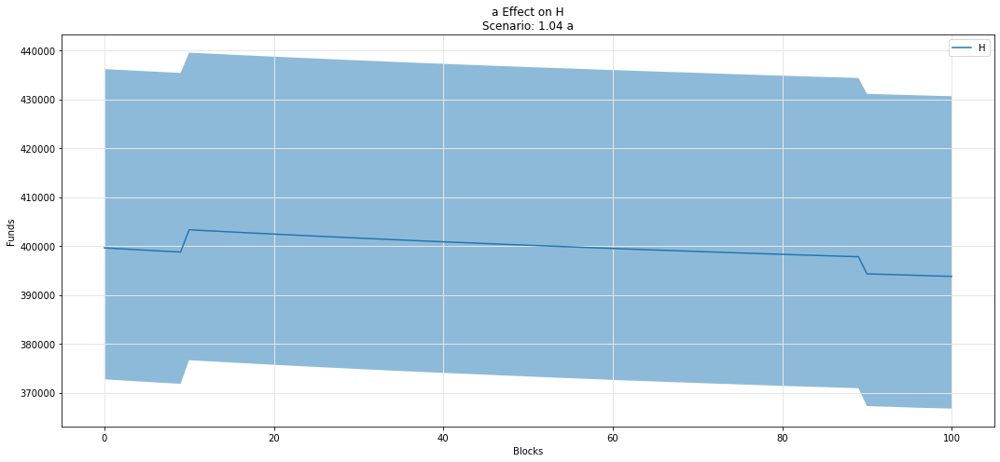

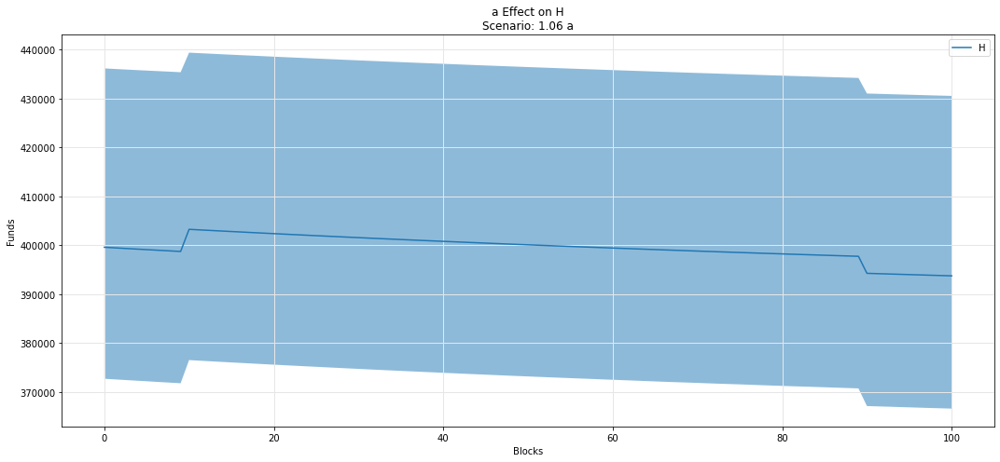

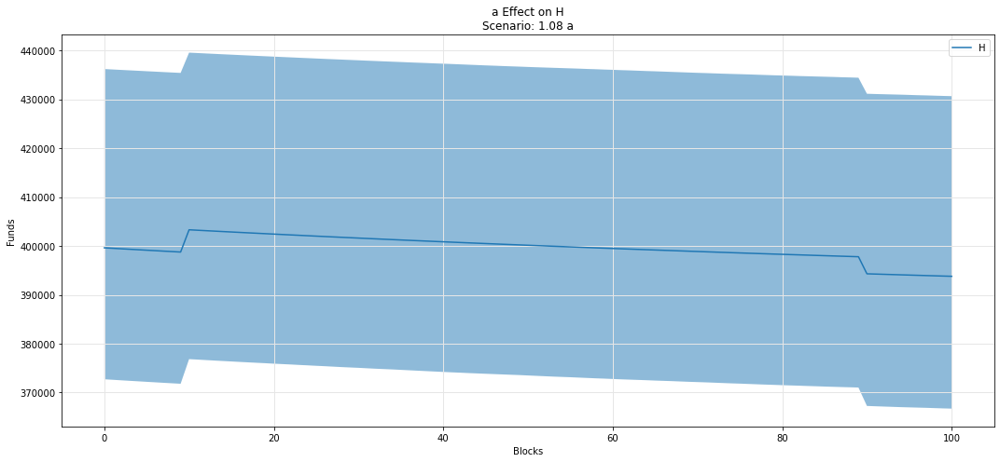

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

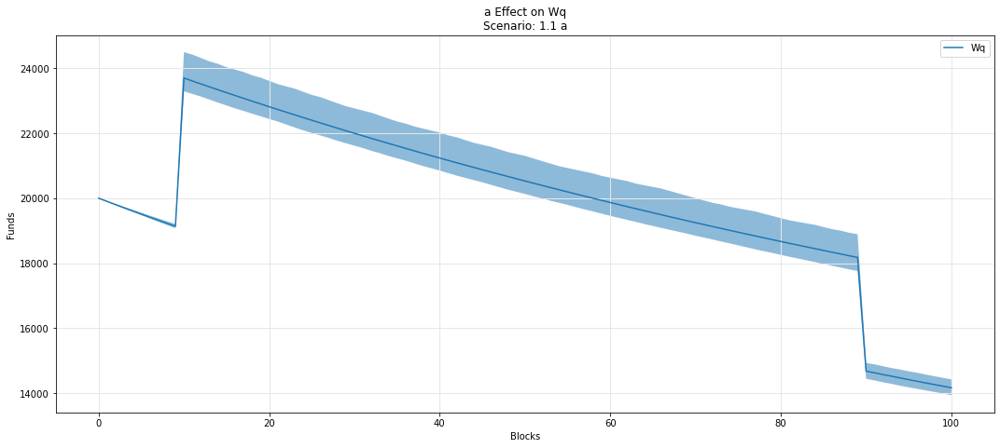

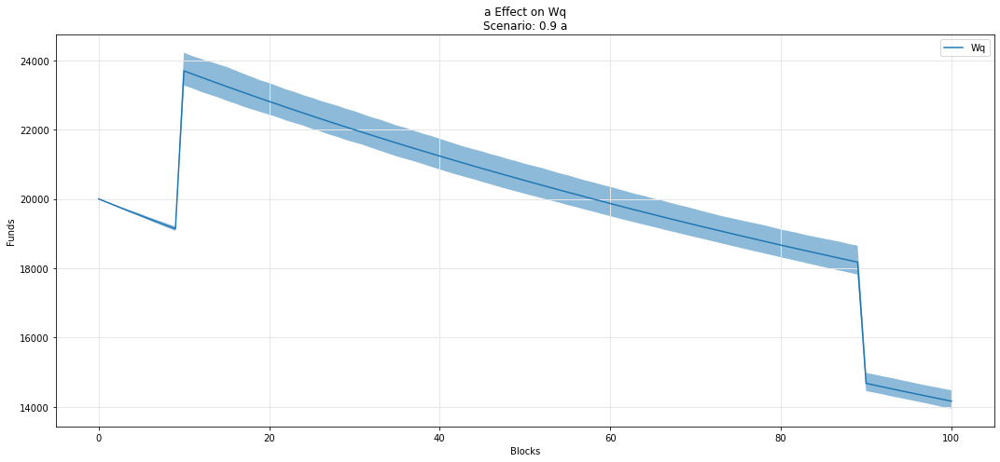

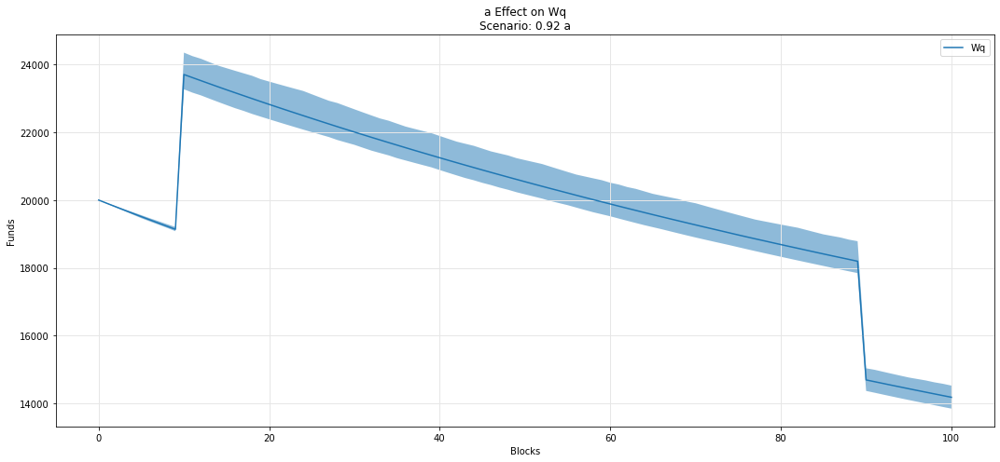

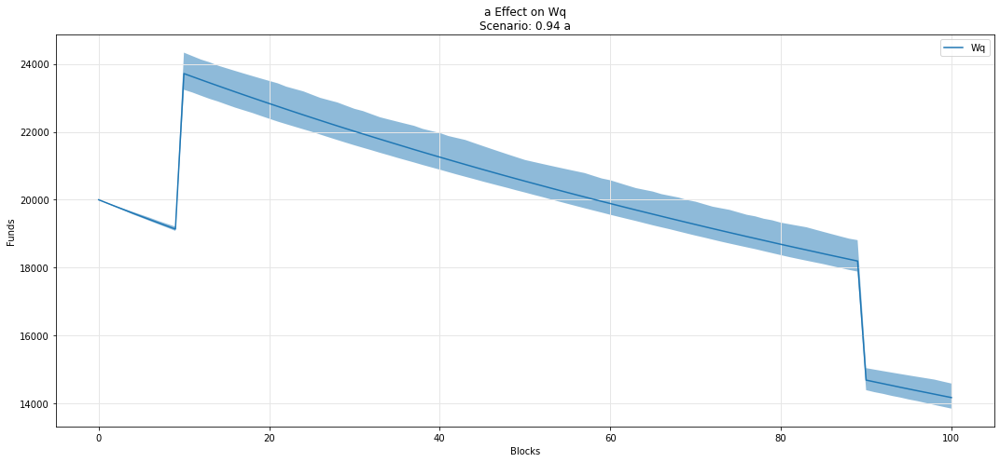

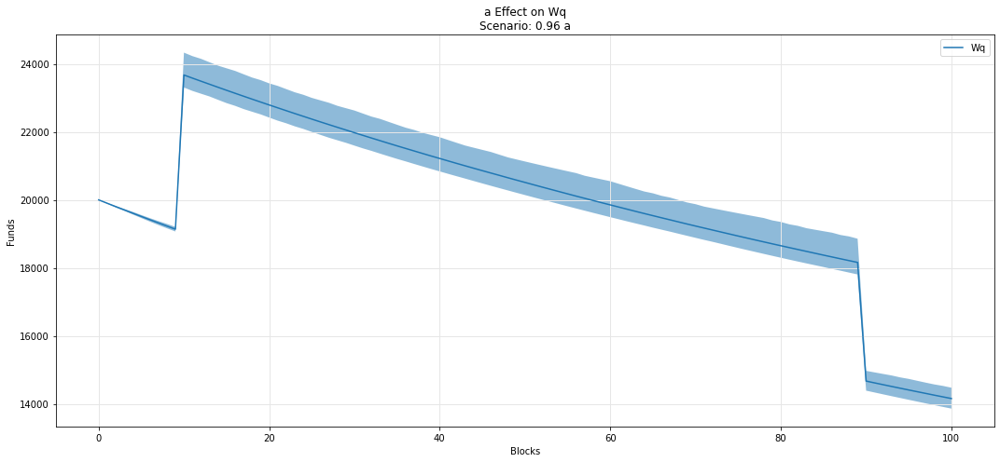

...

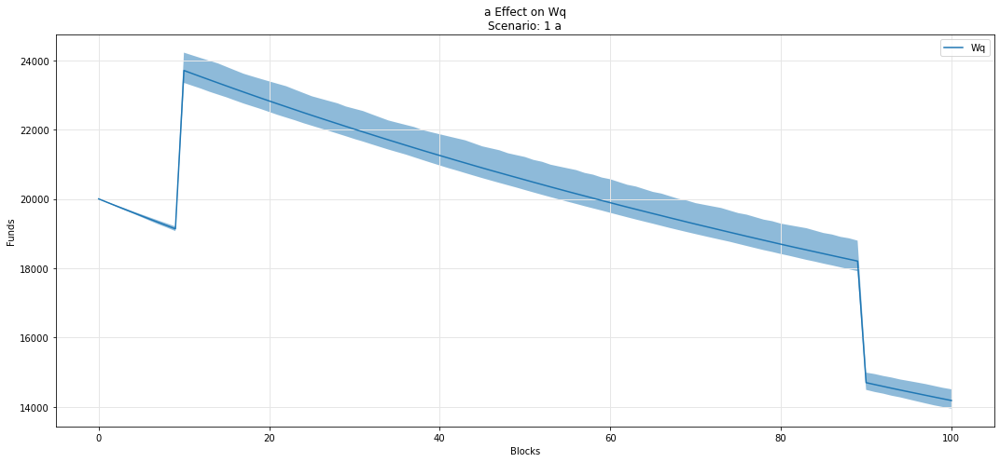

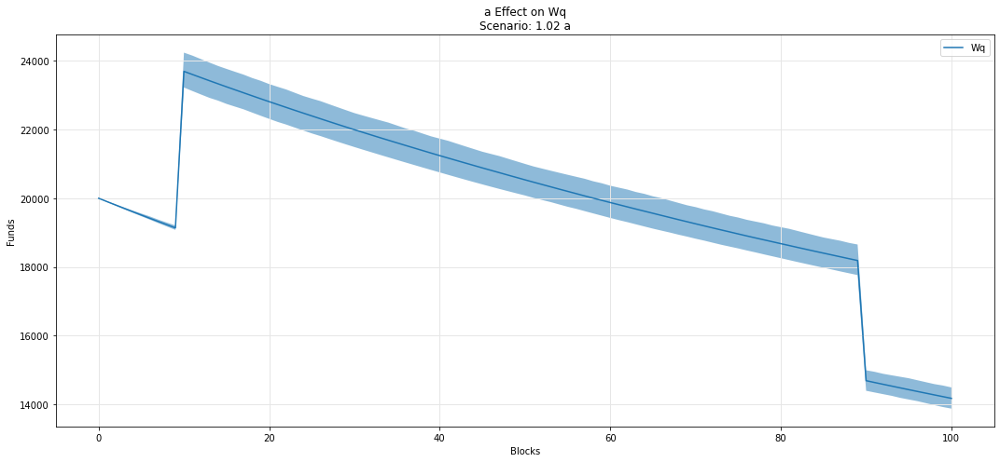

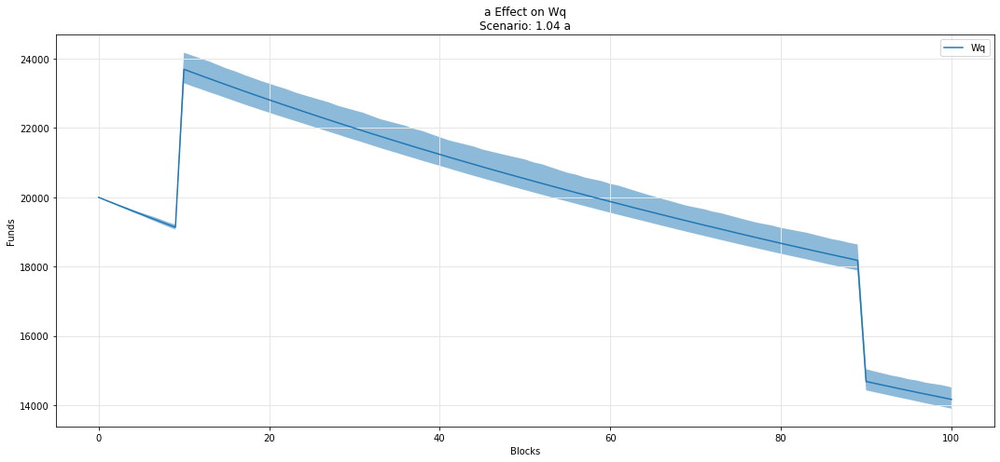

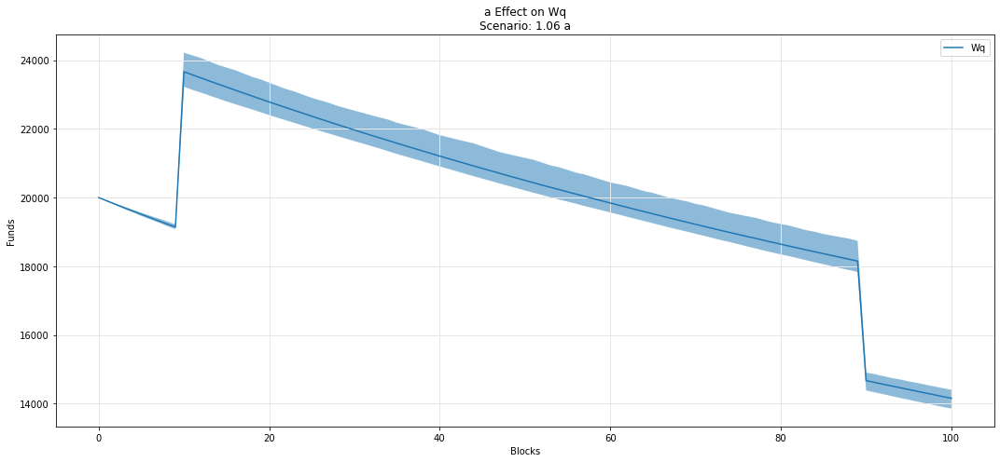

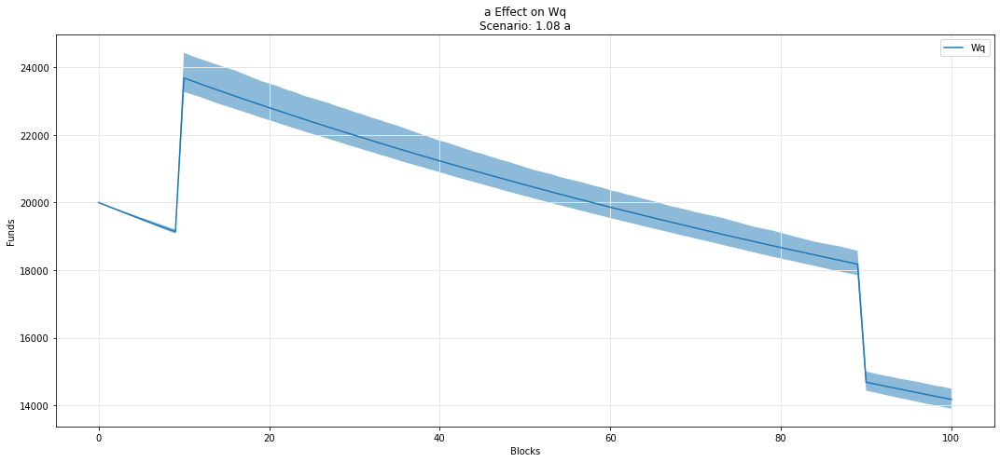

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

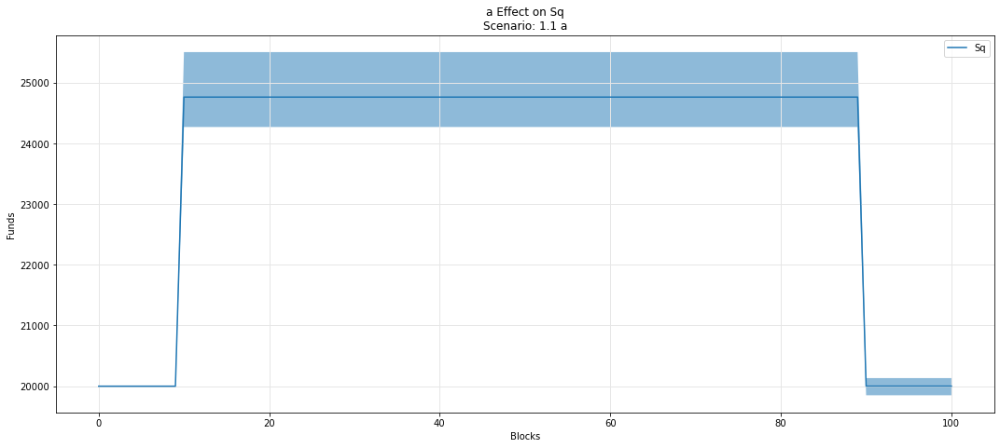

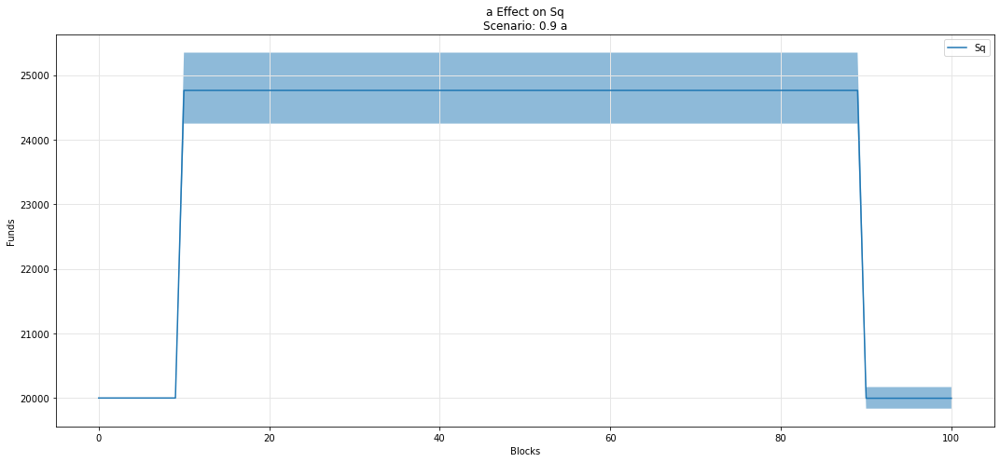

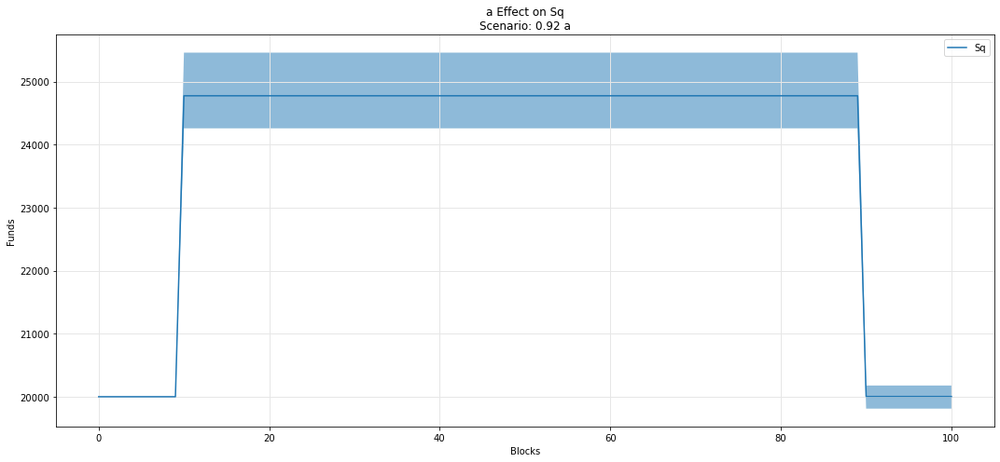

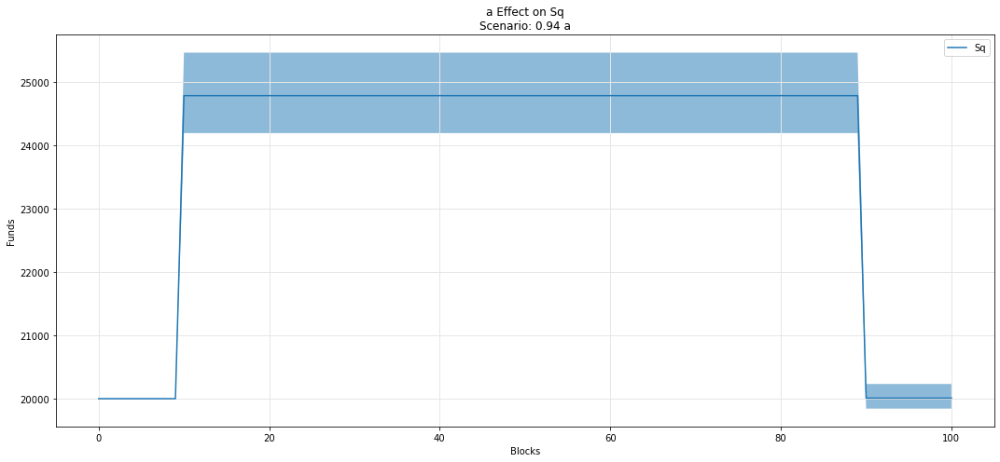

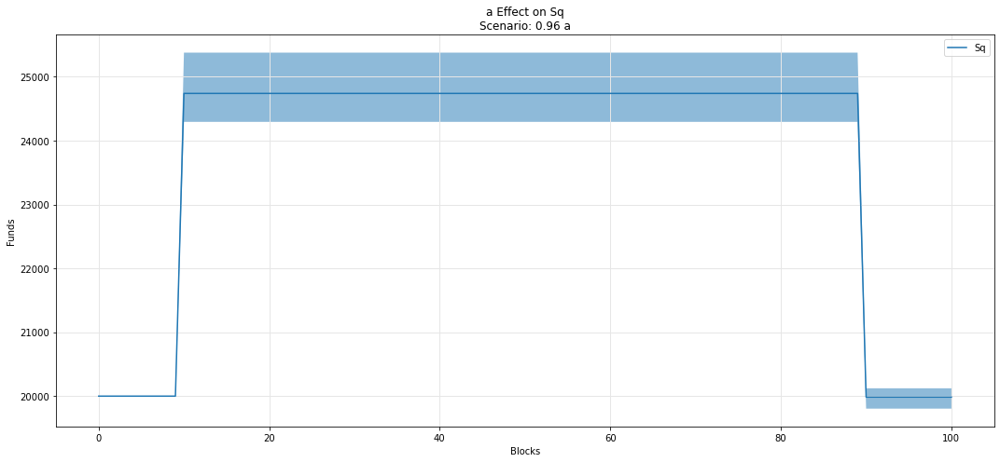

...

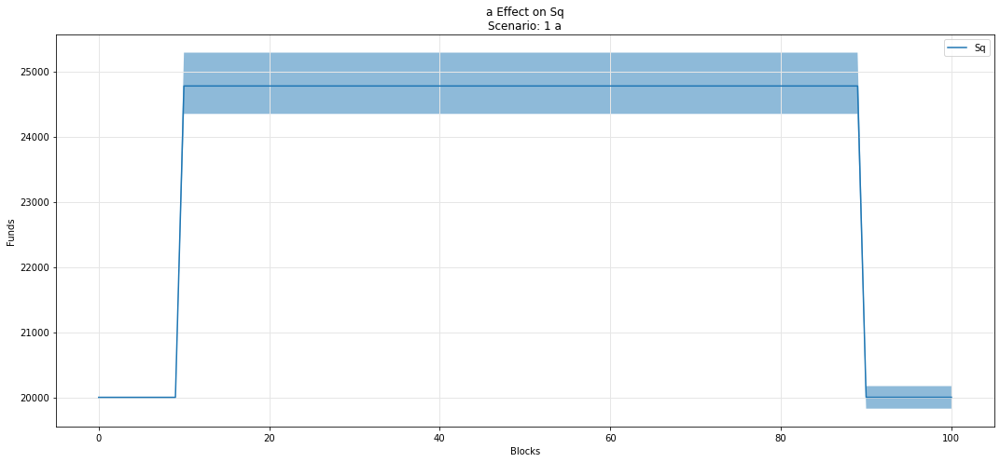

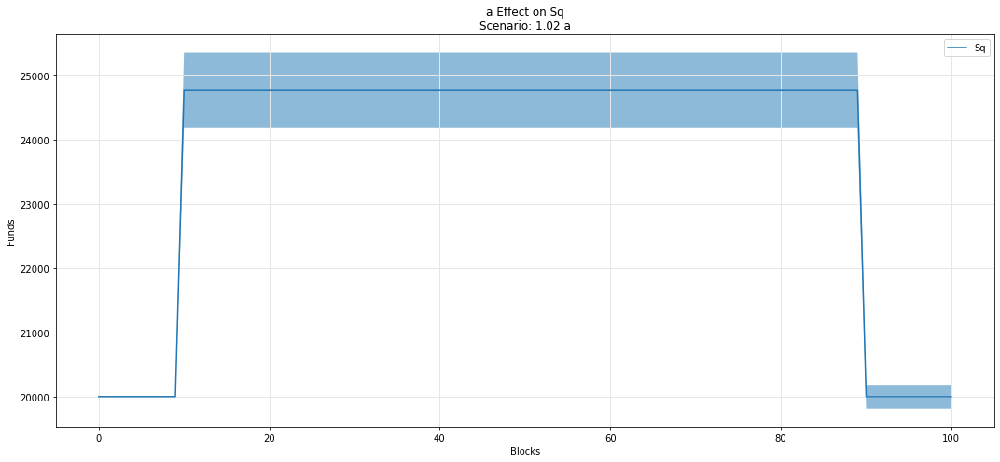

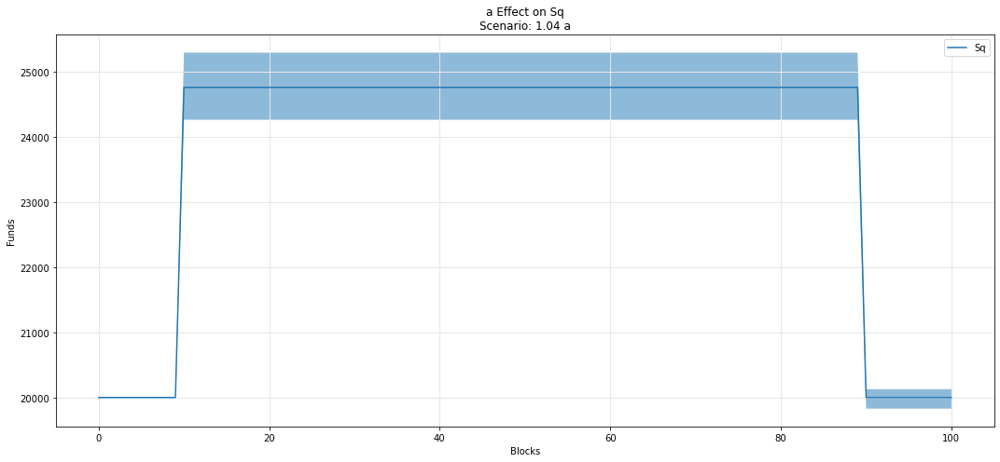

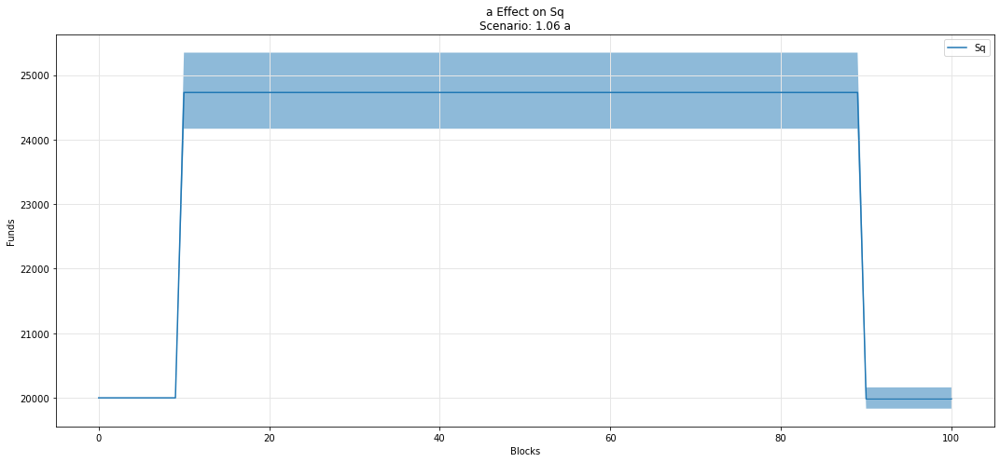

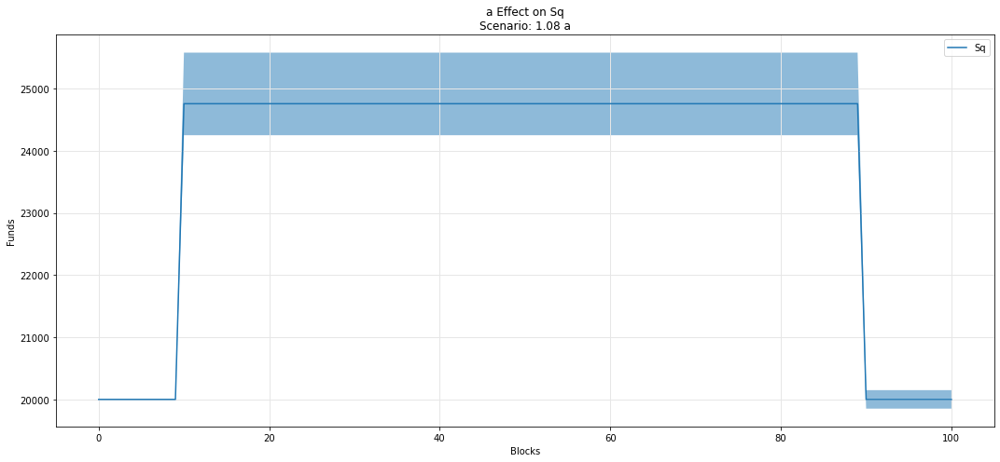

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

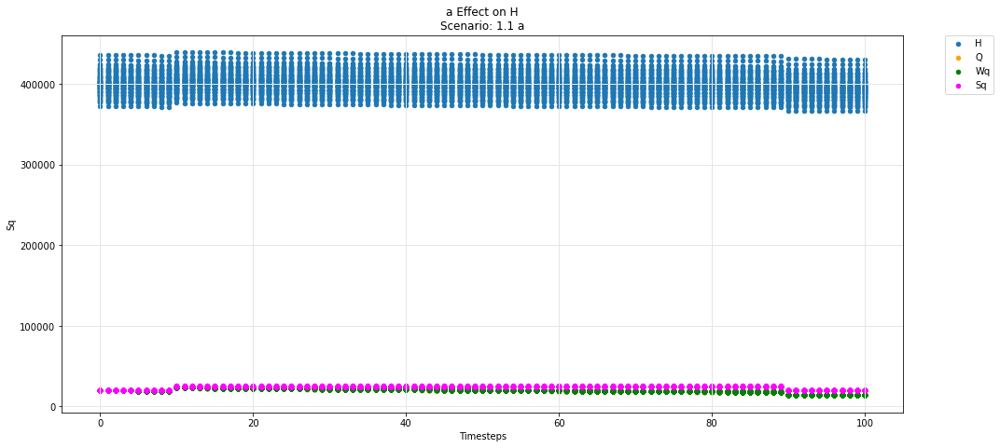

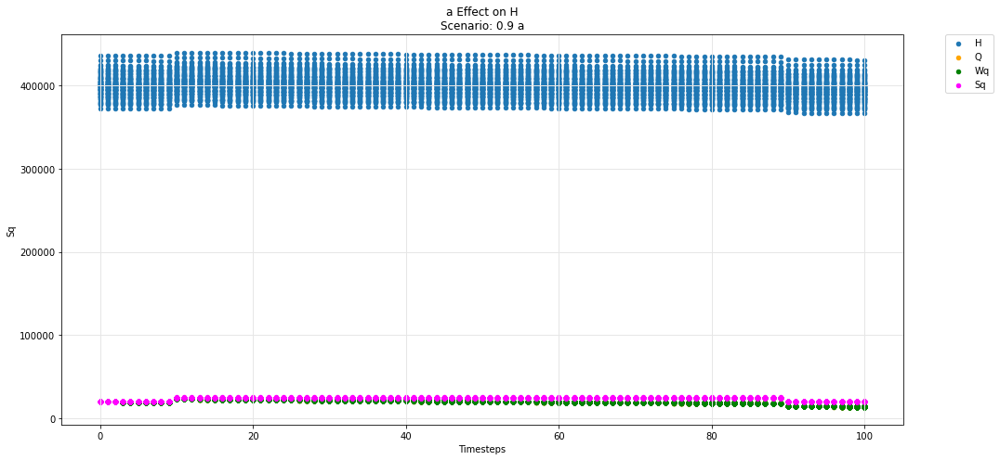

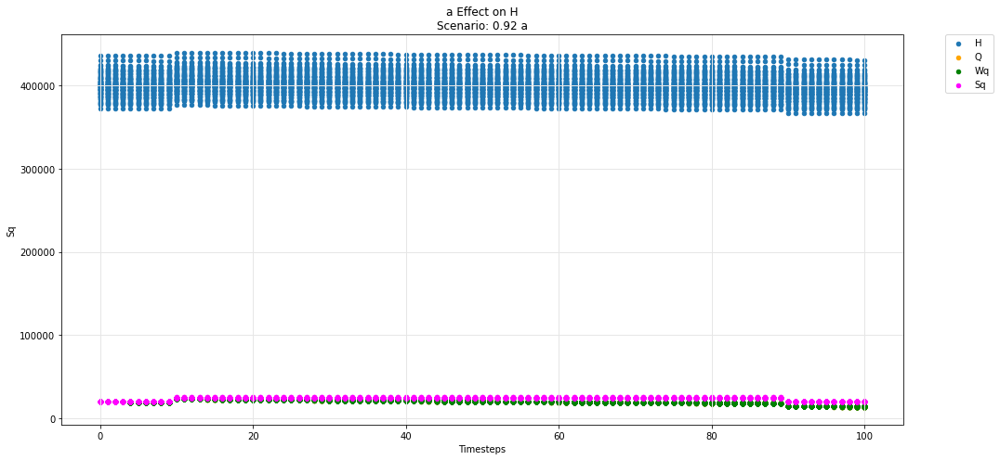

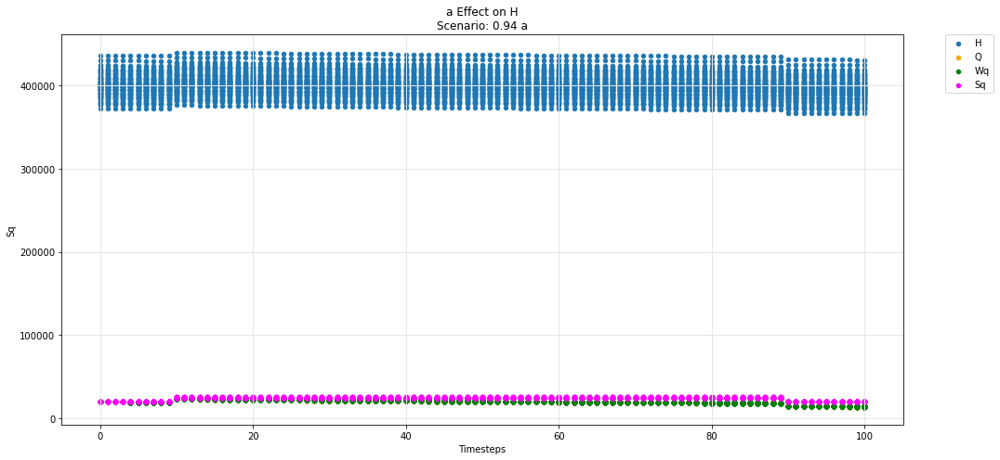

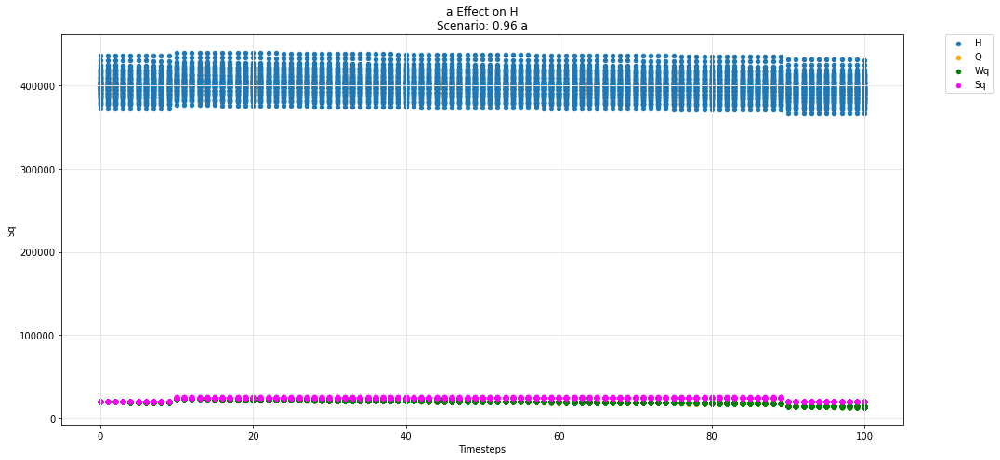

...

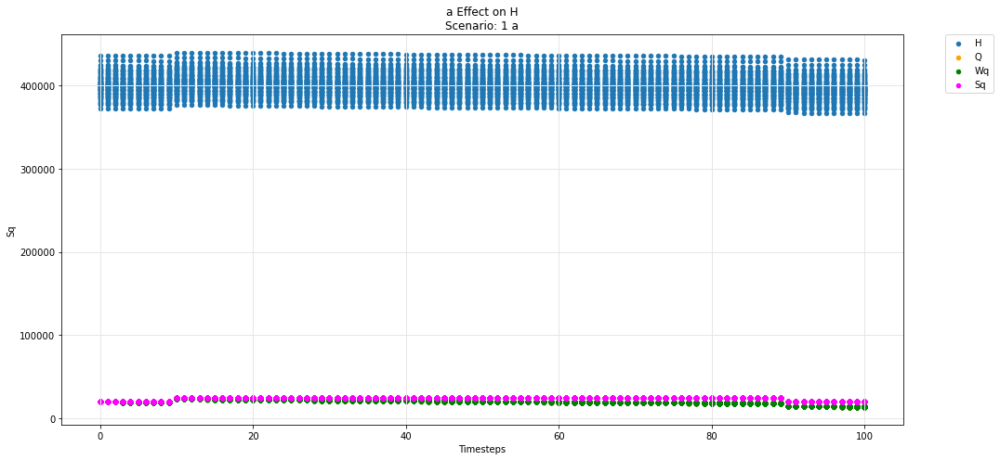

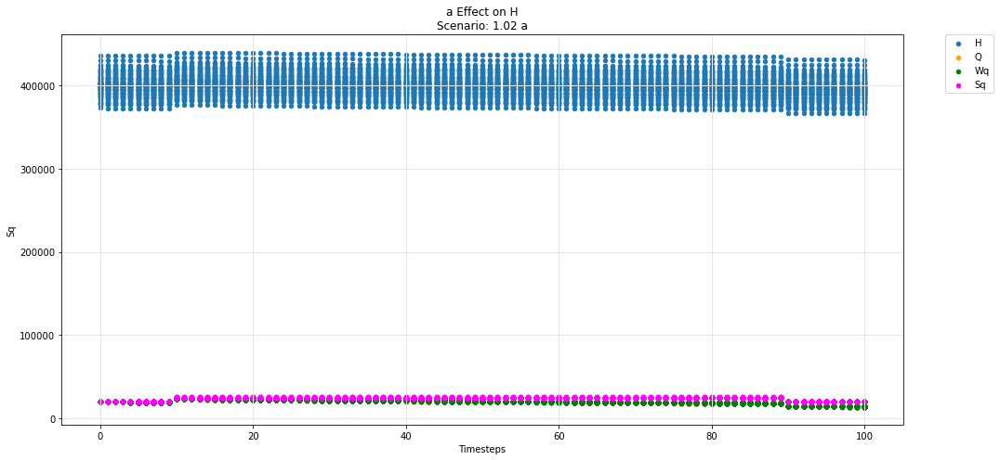

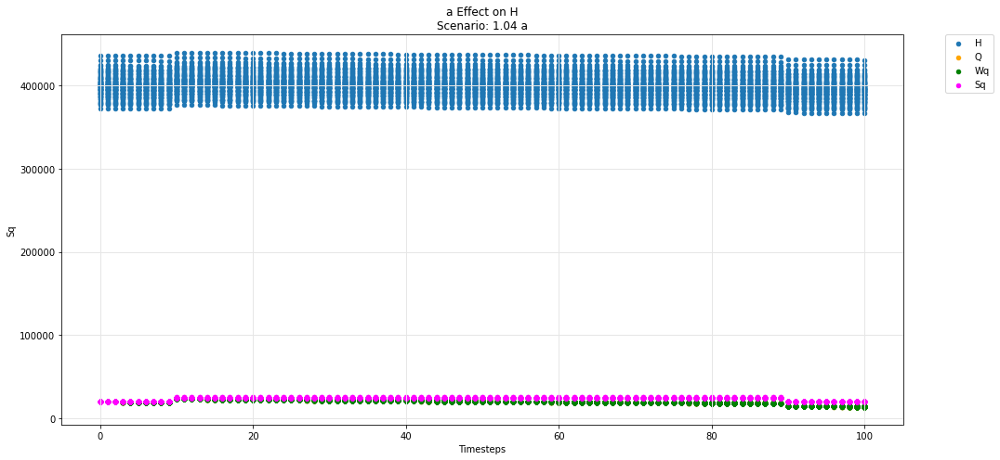

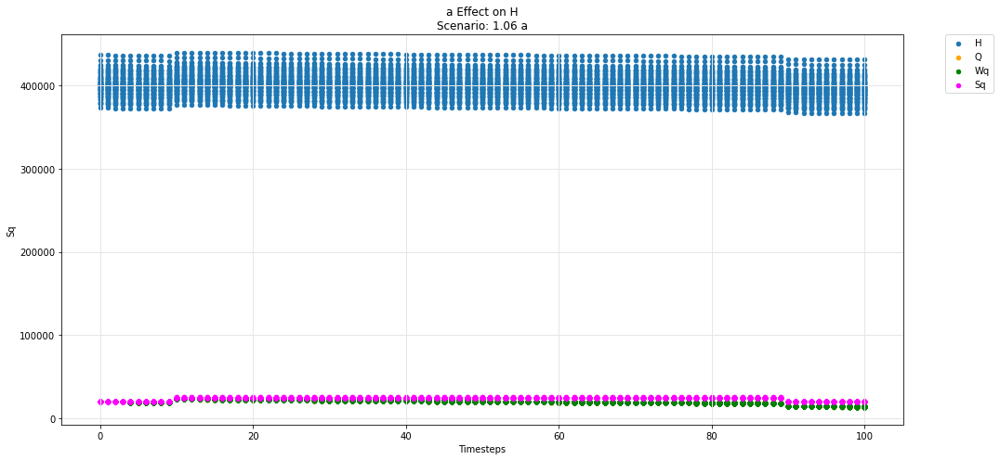

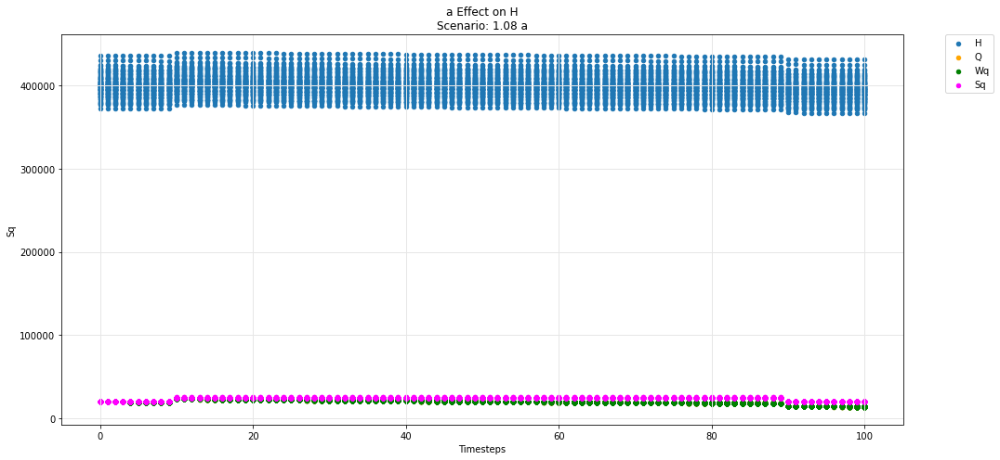

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

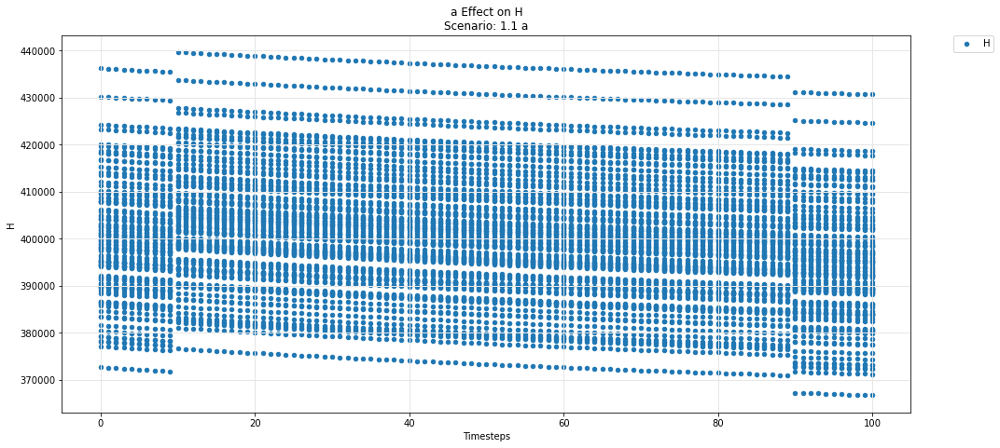

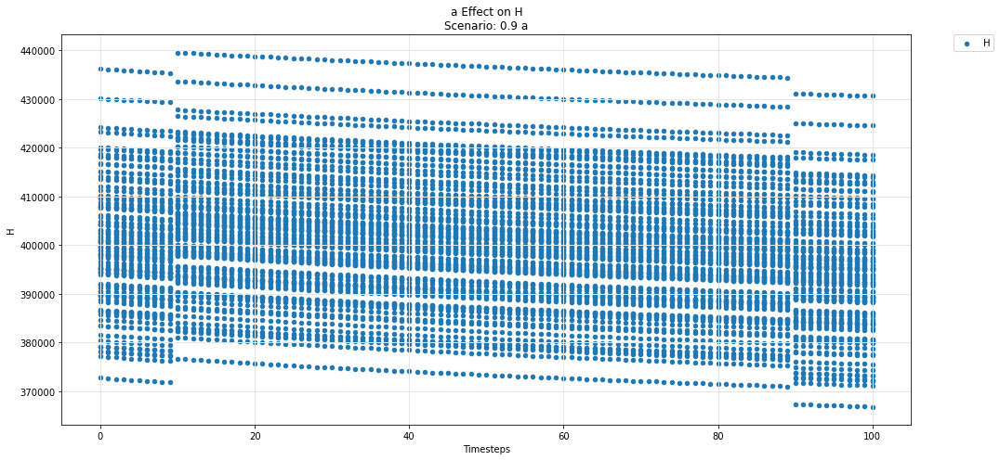

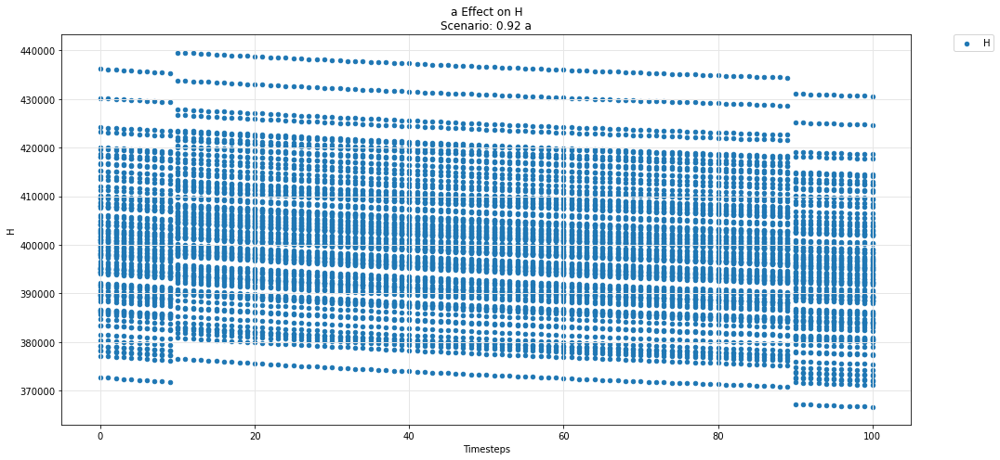

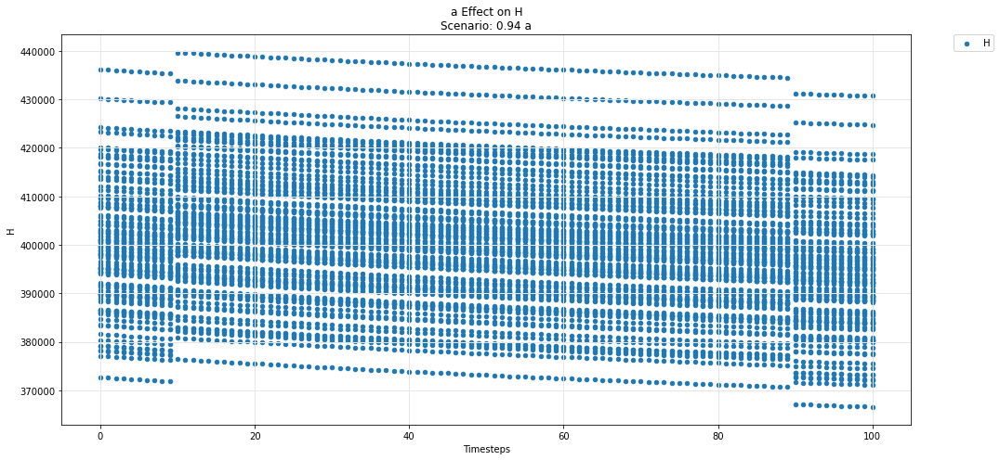

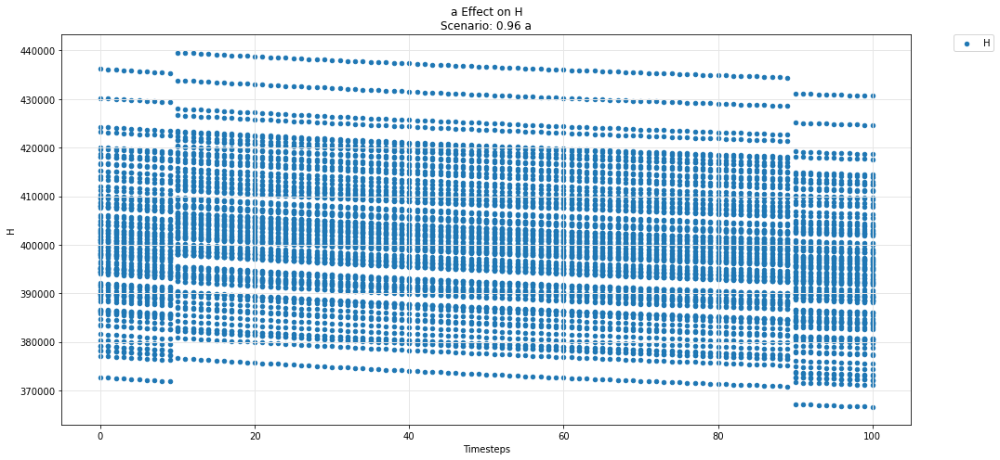

...

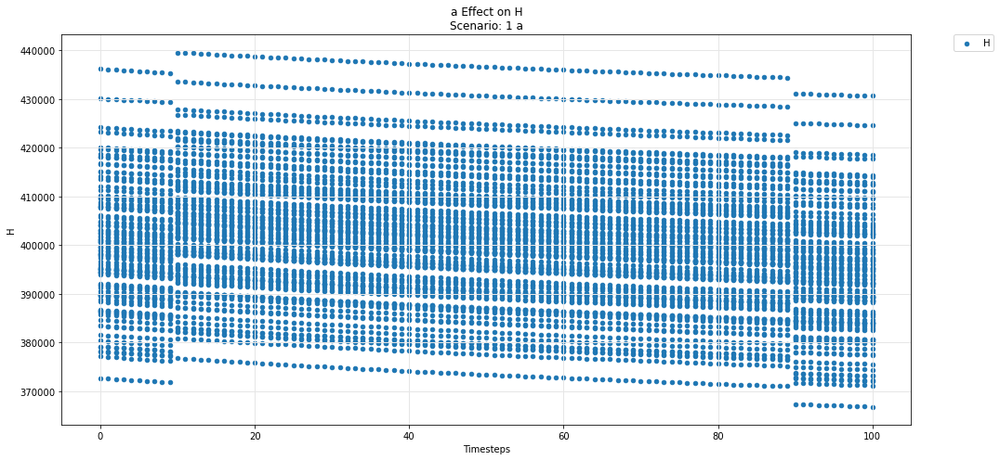

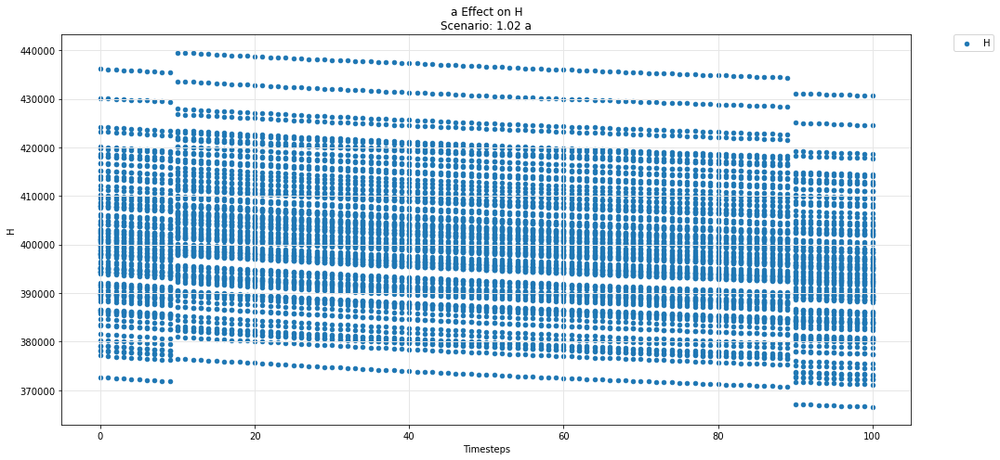

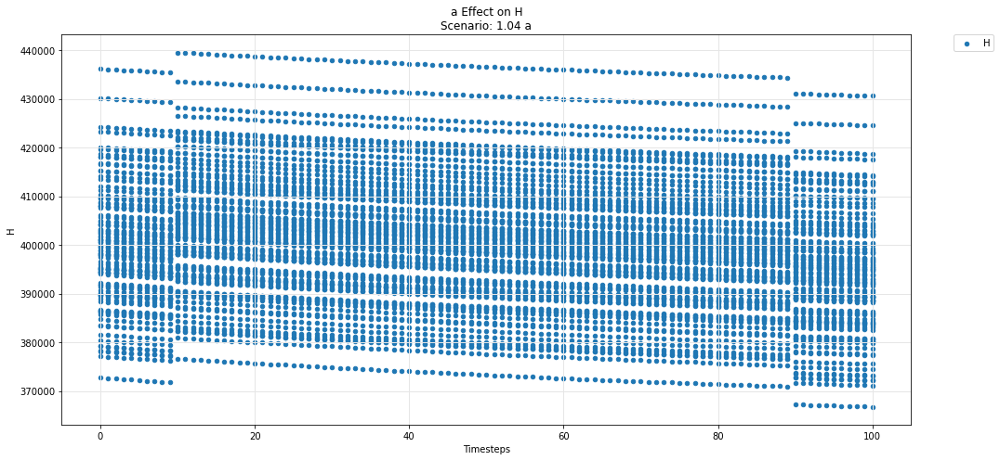

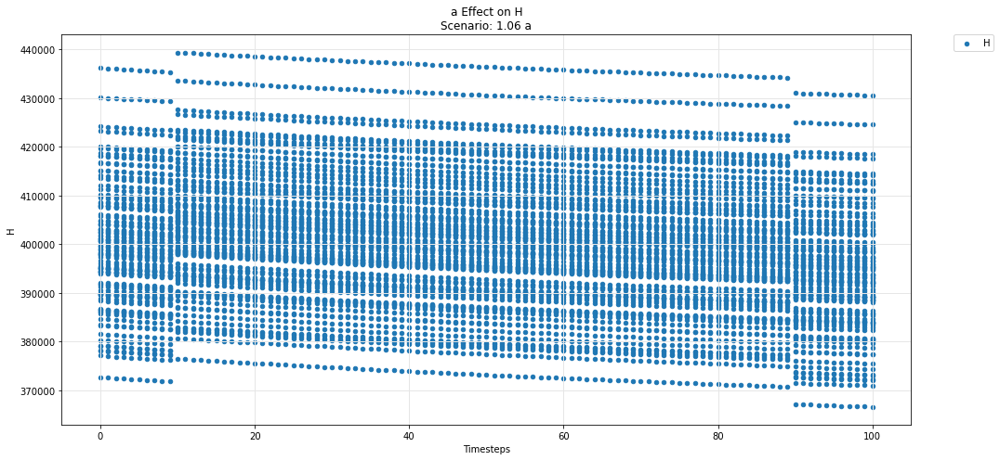

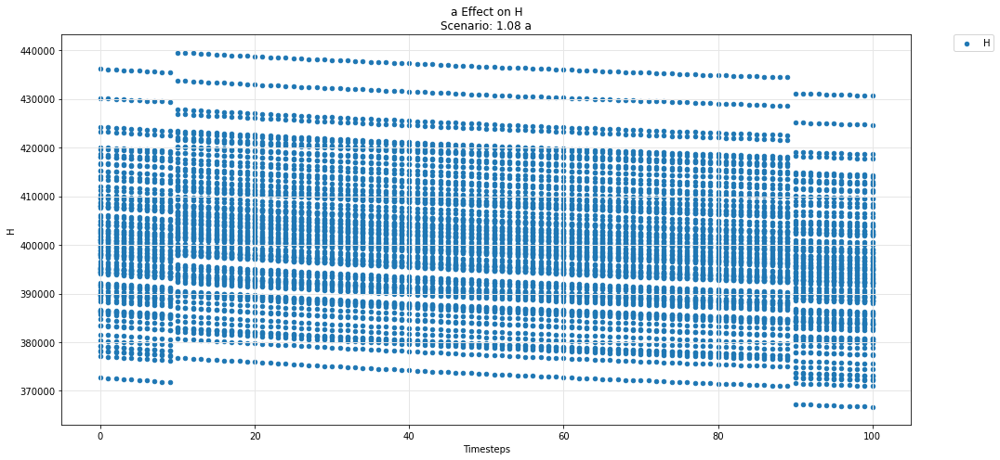

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

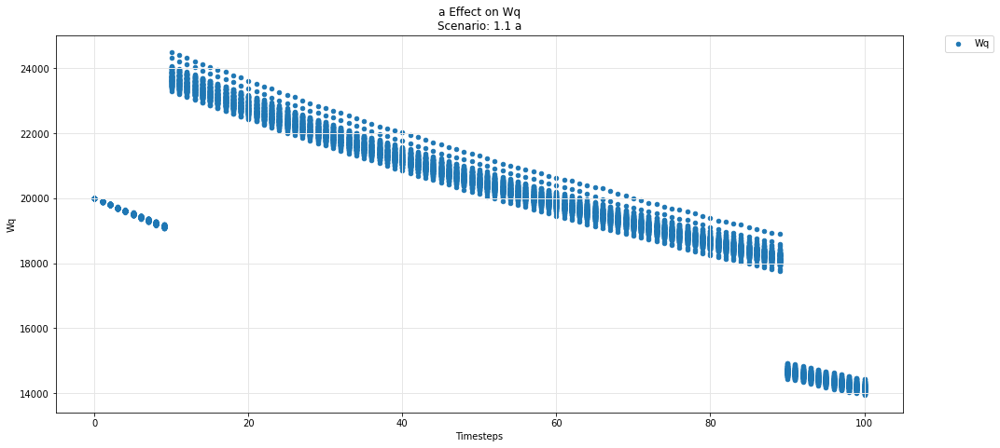

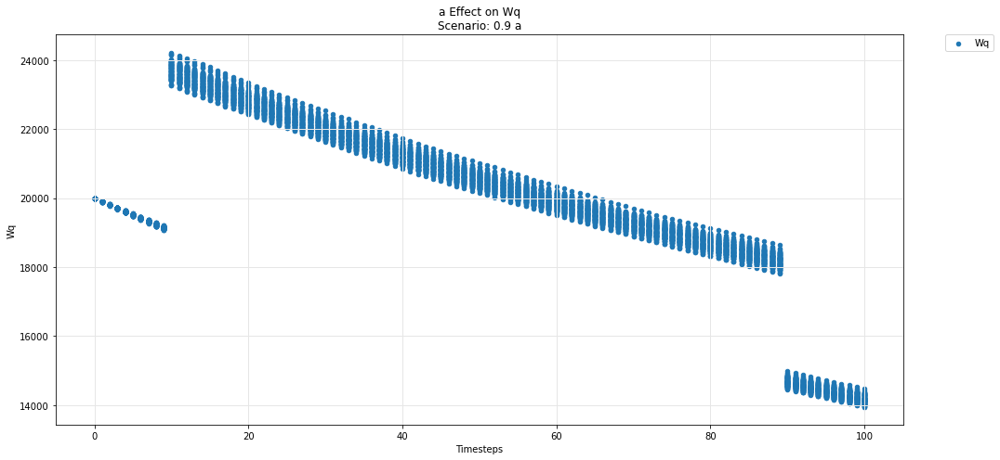

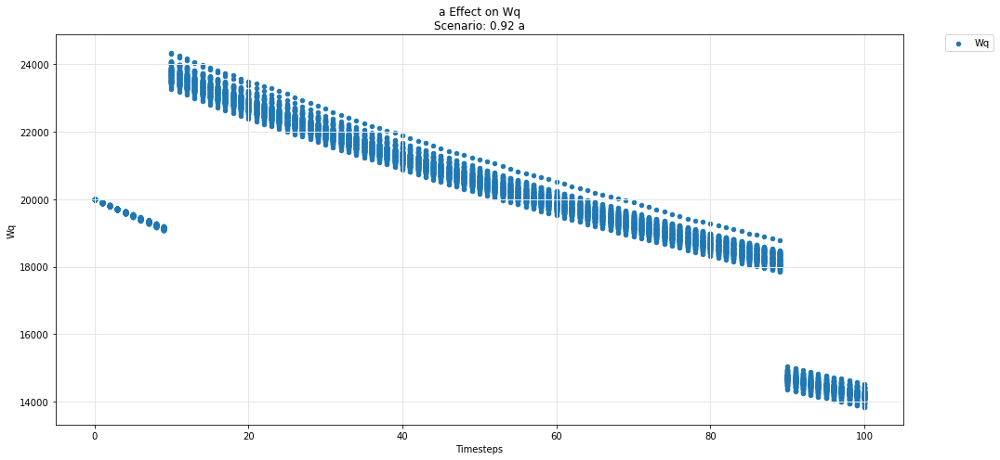

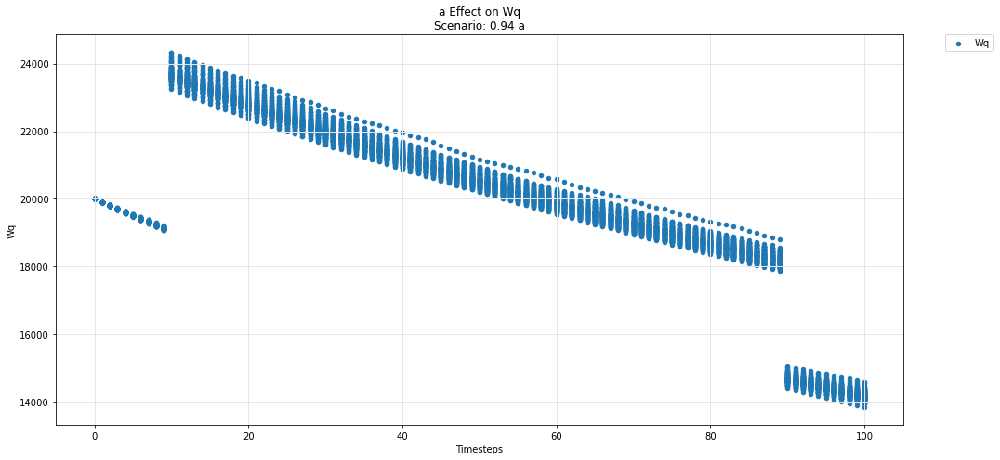

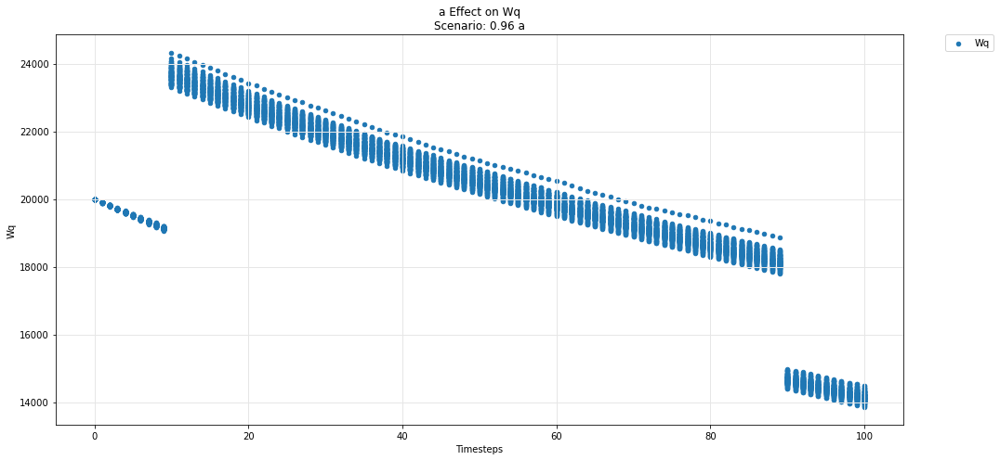

...

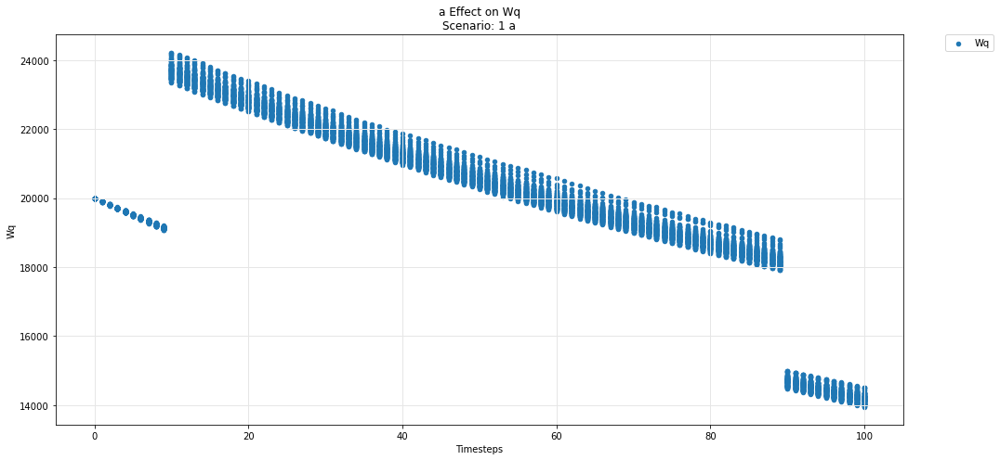

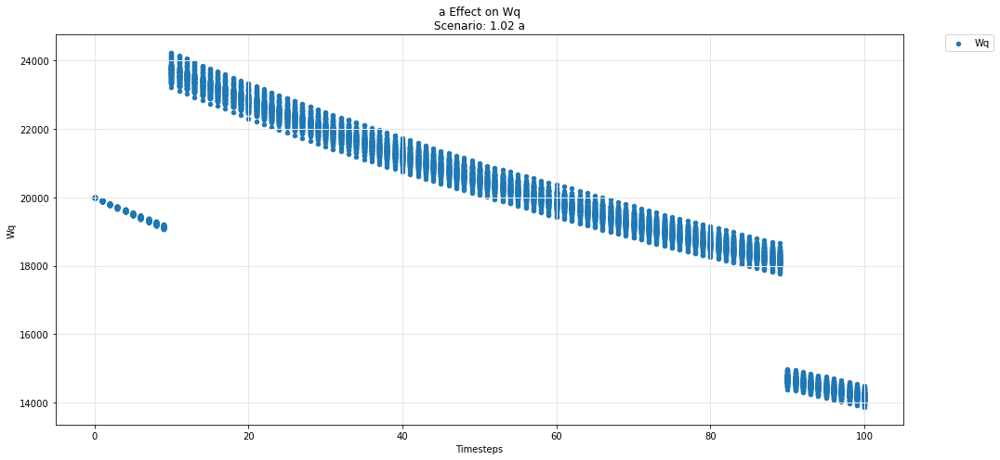

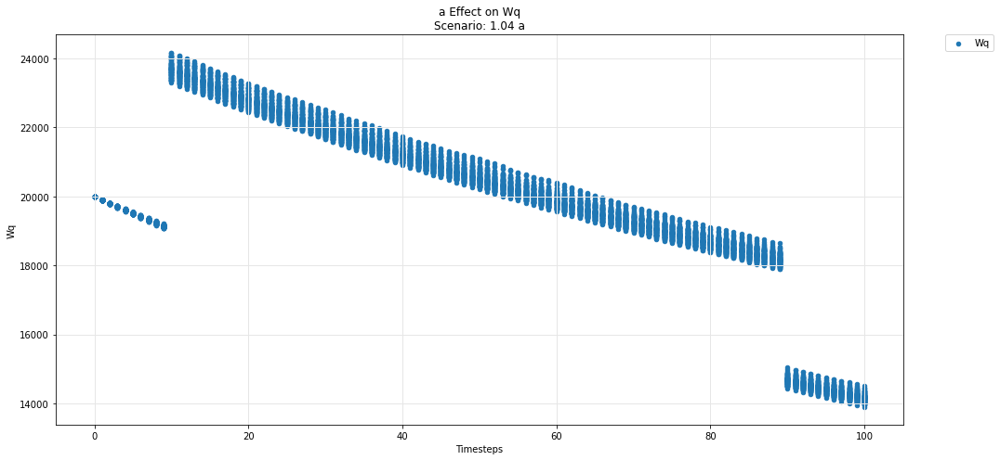

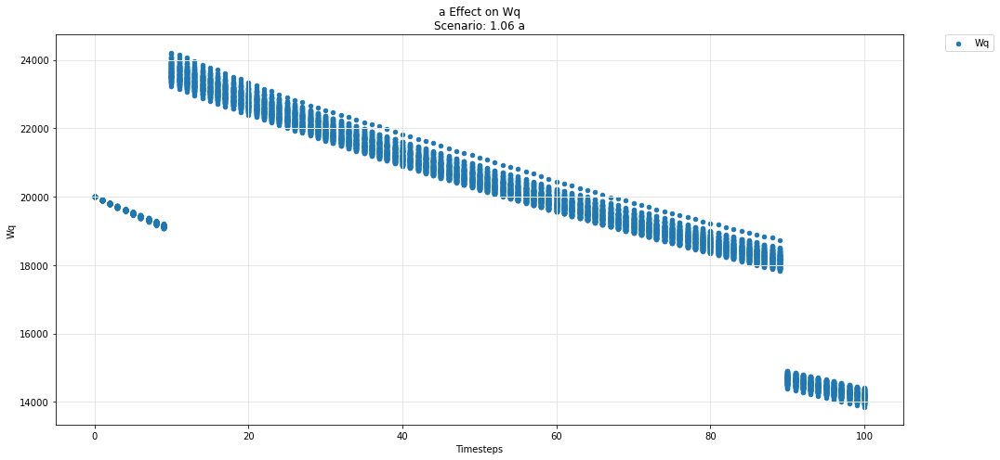

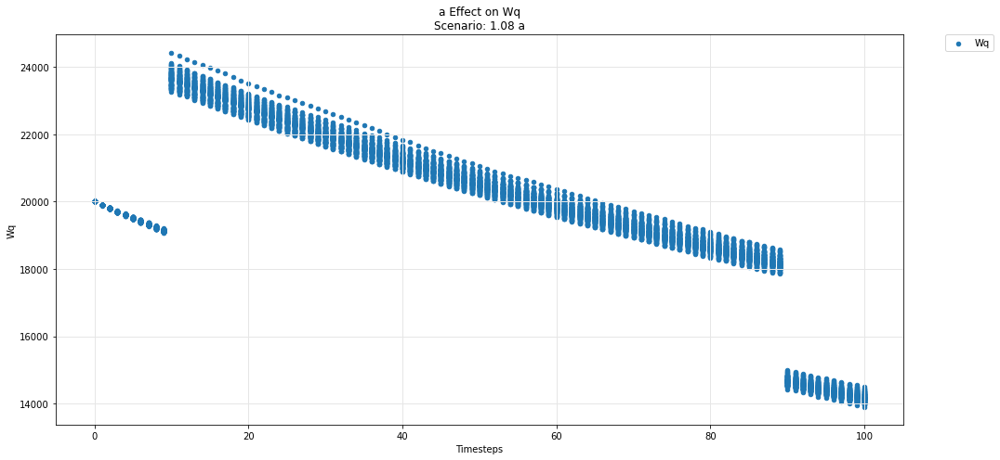

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

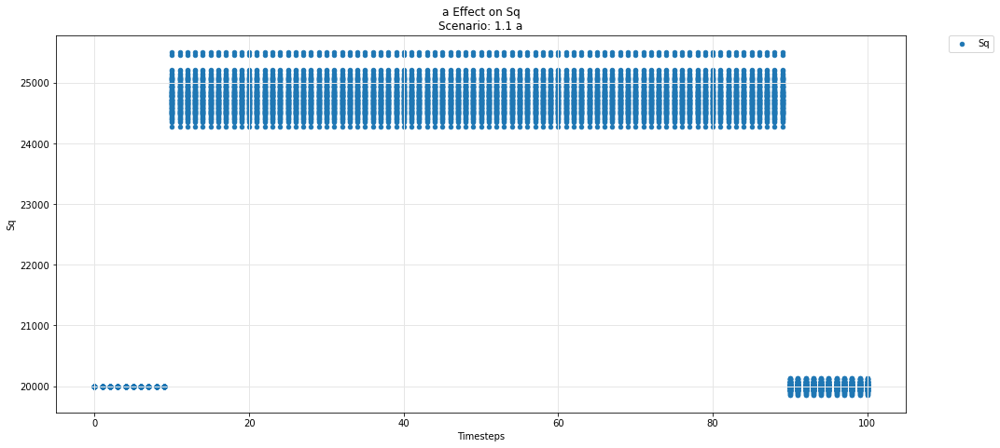

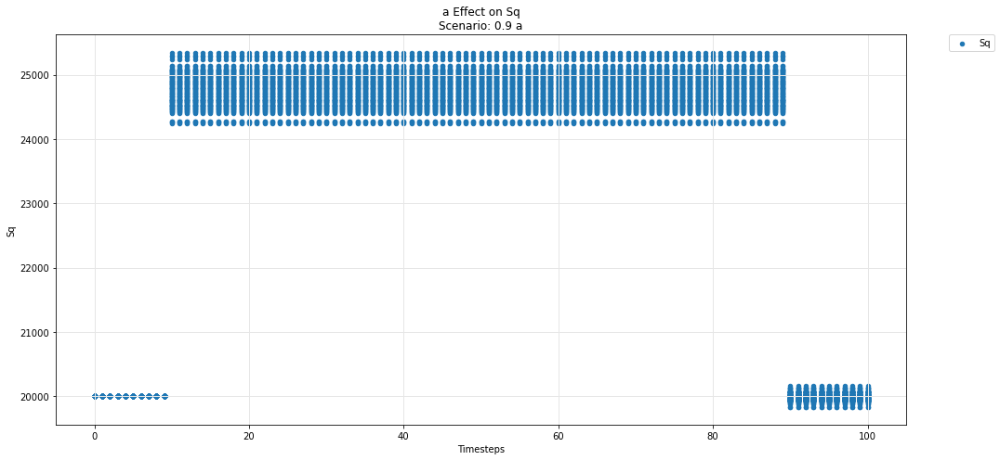

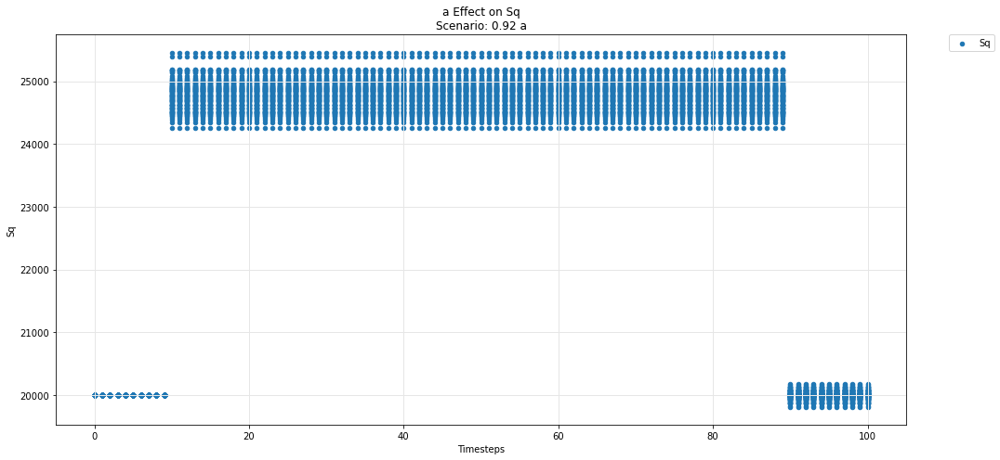

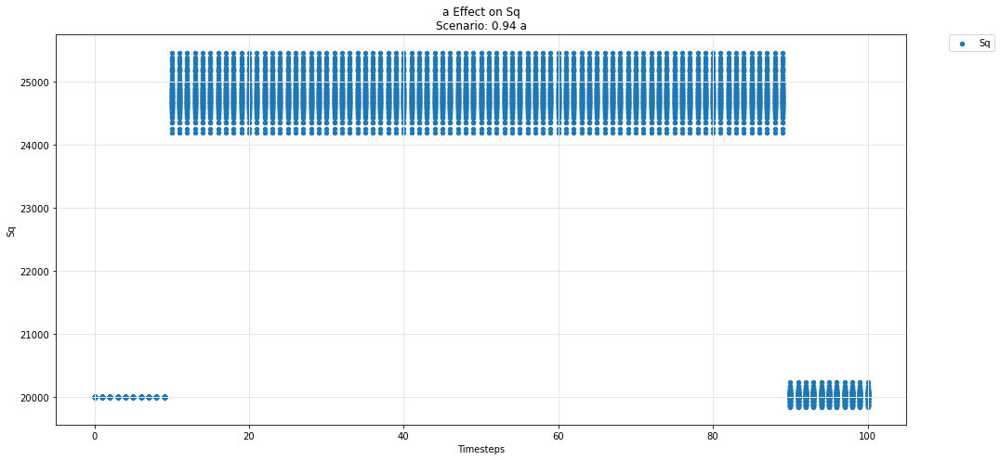

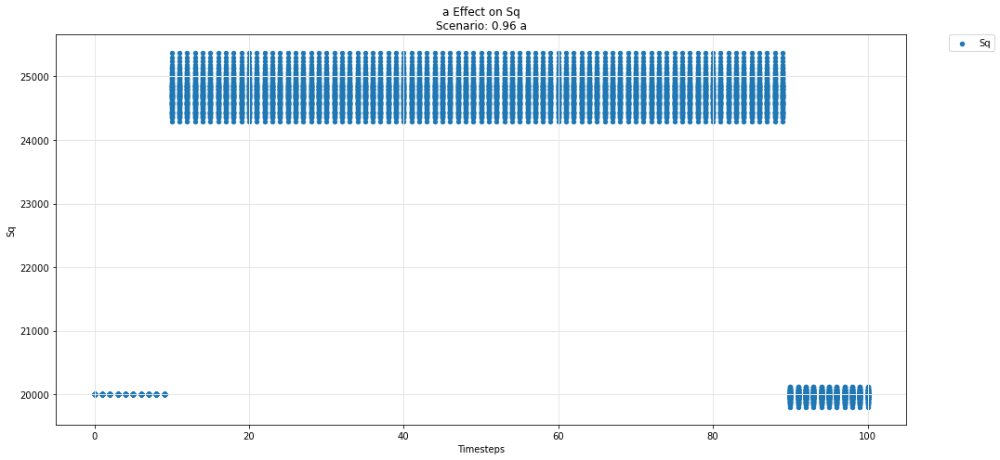

...

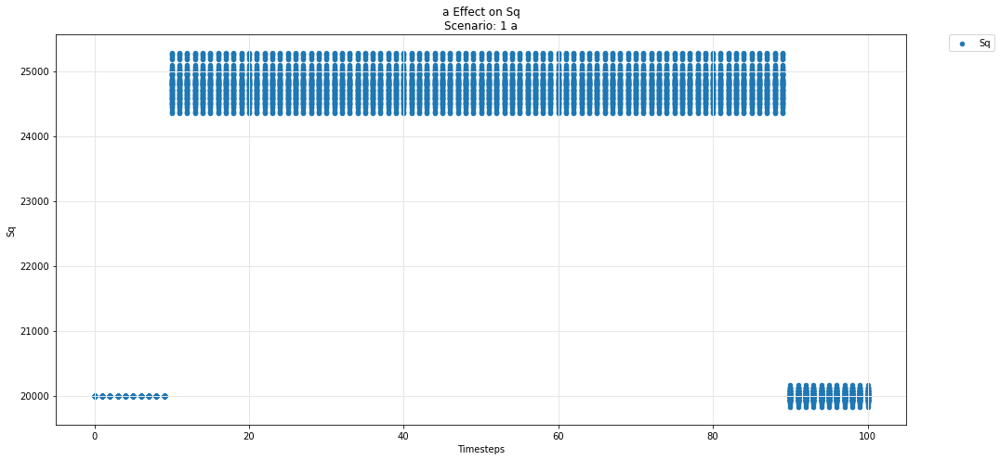

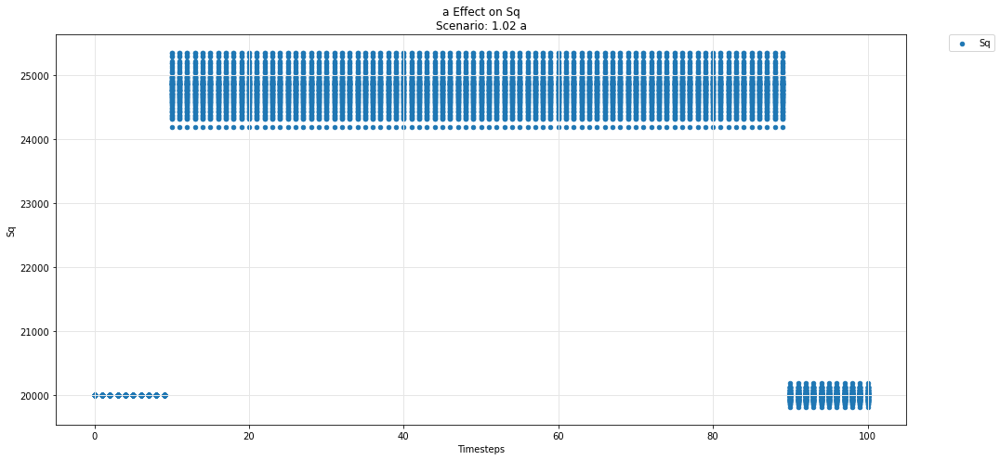

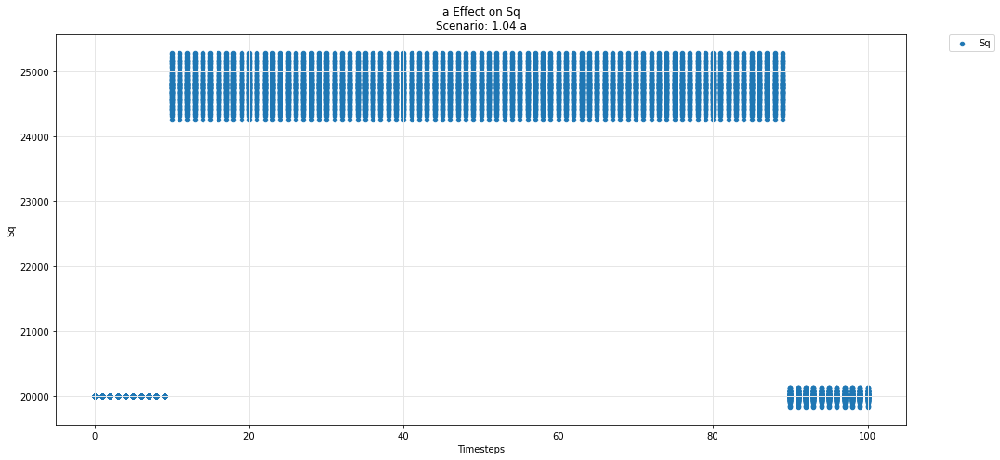

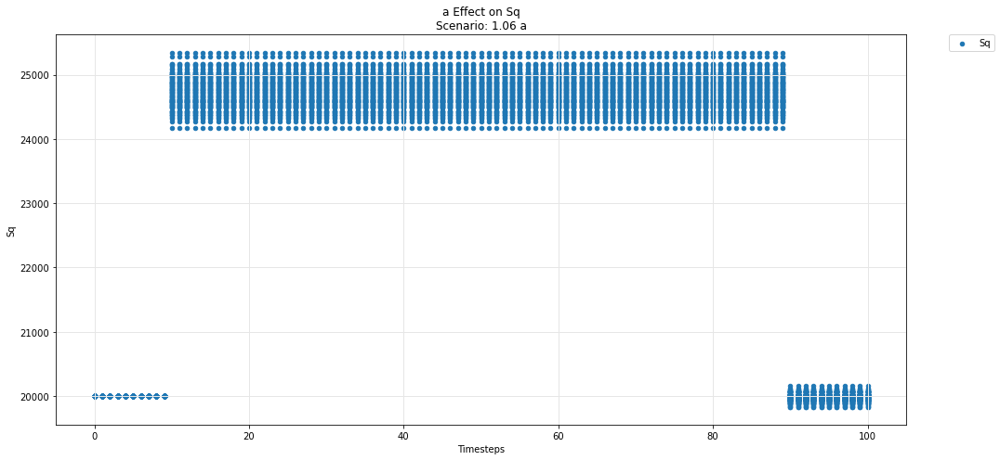

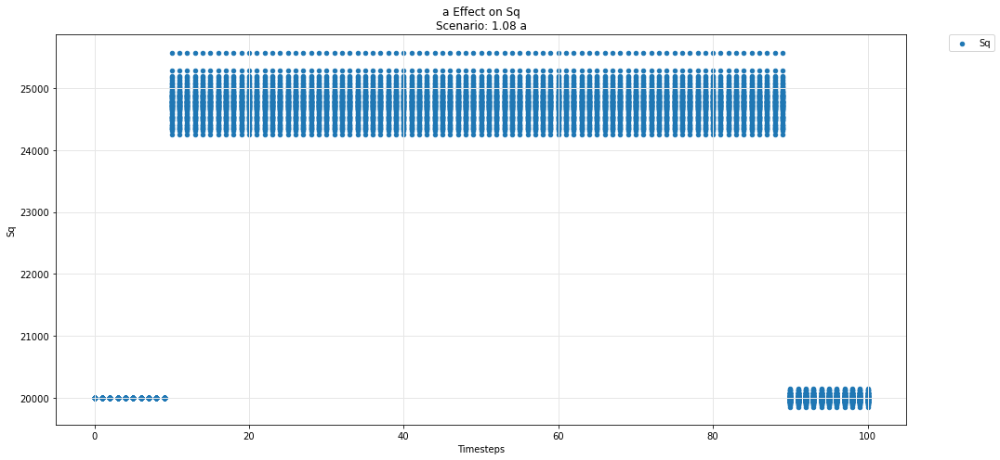

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

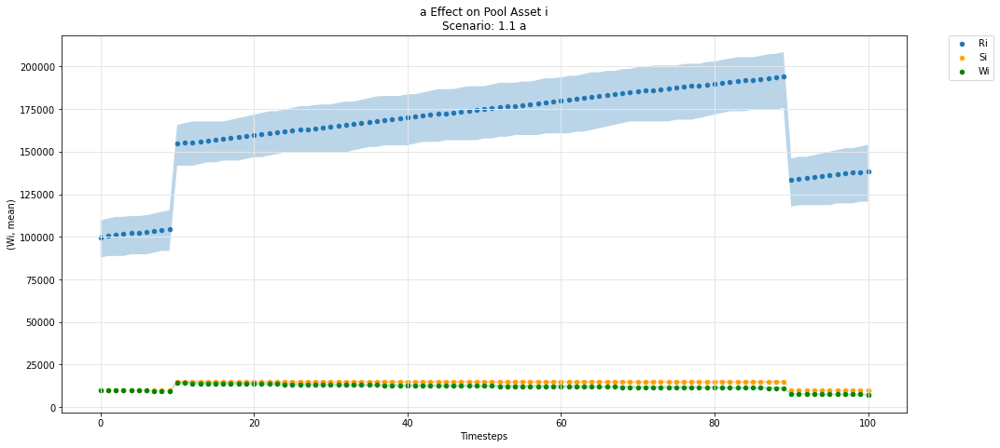

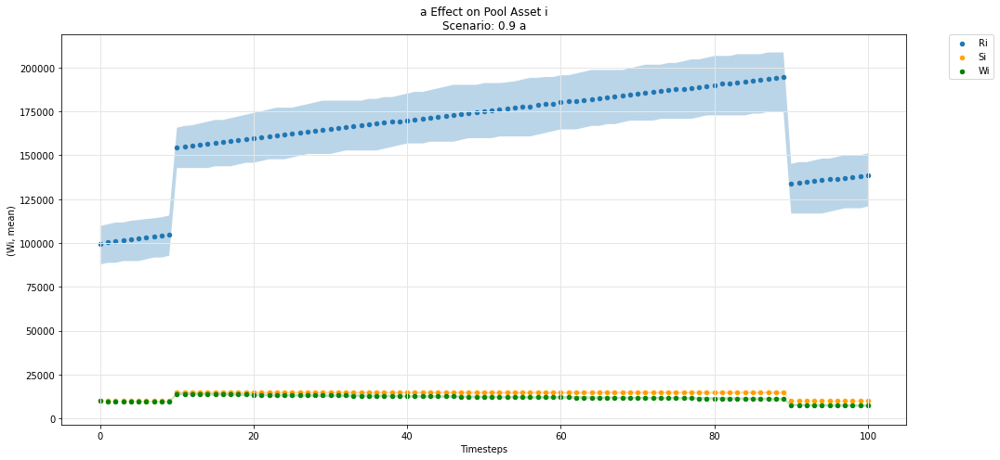

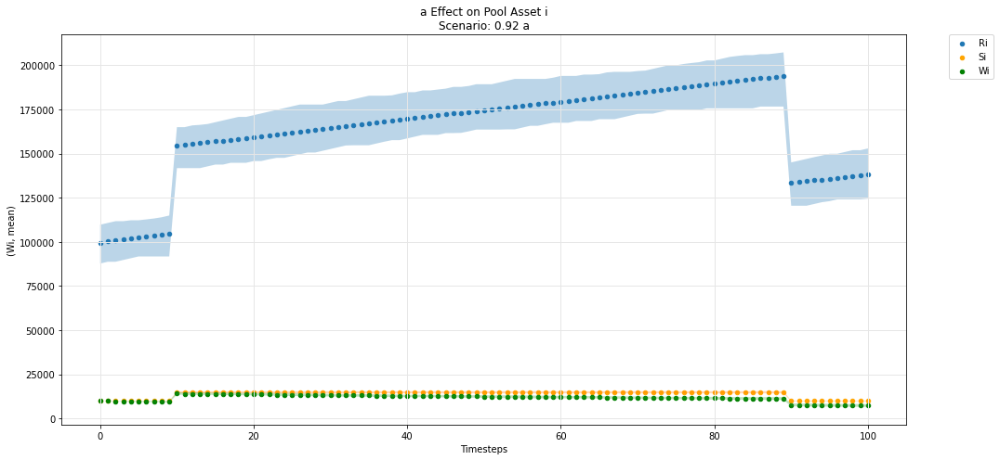

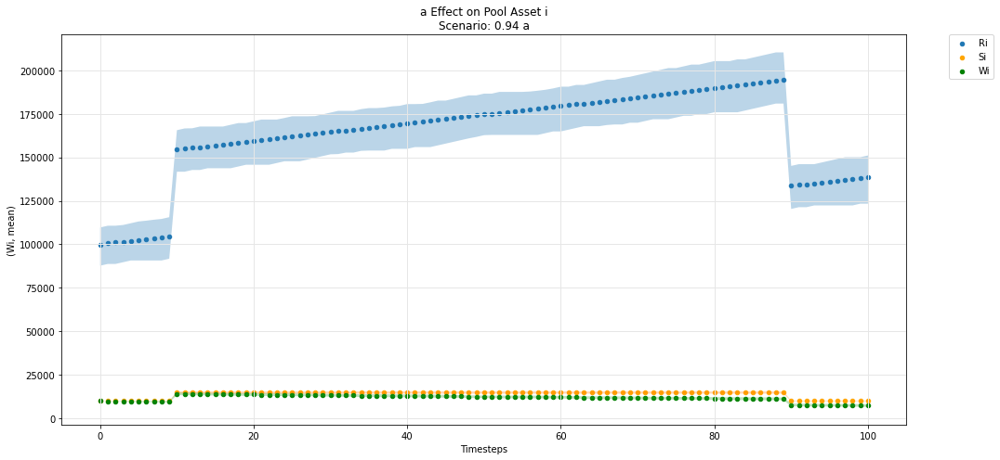

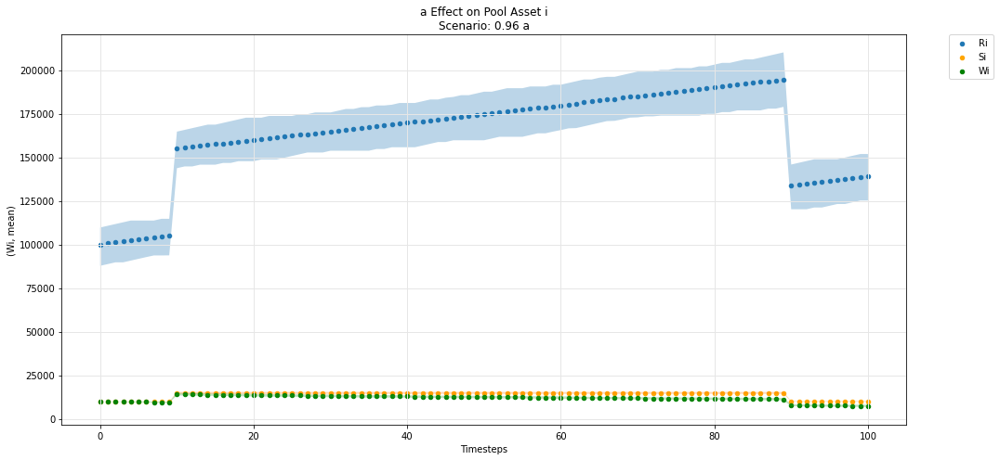

...

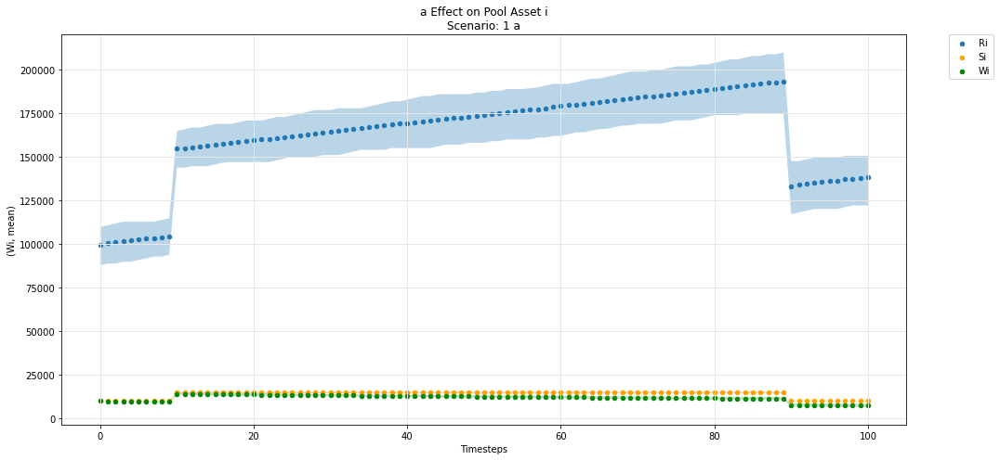

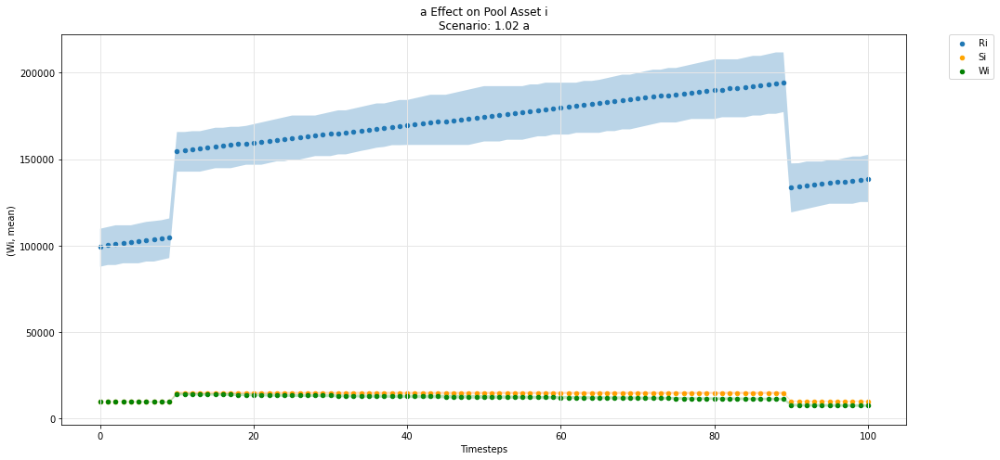

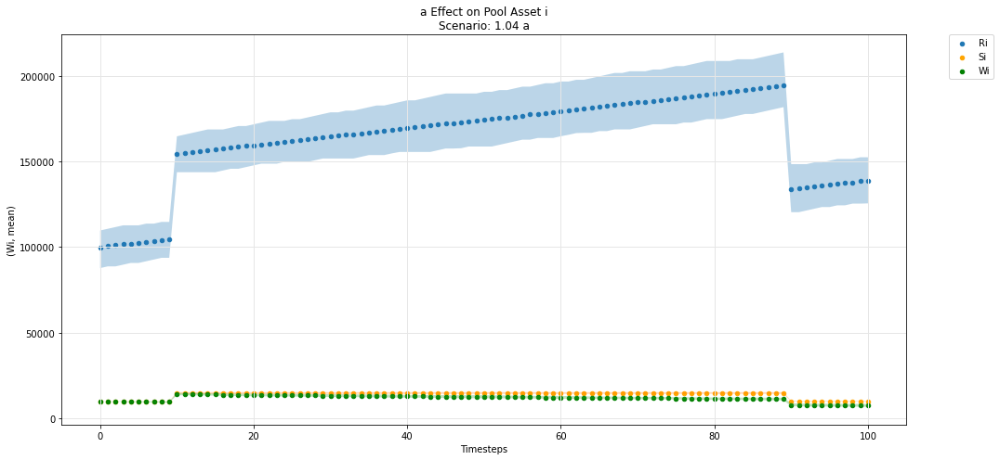

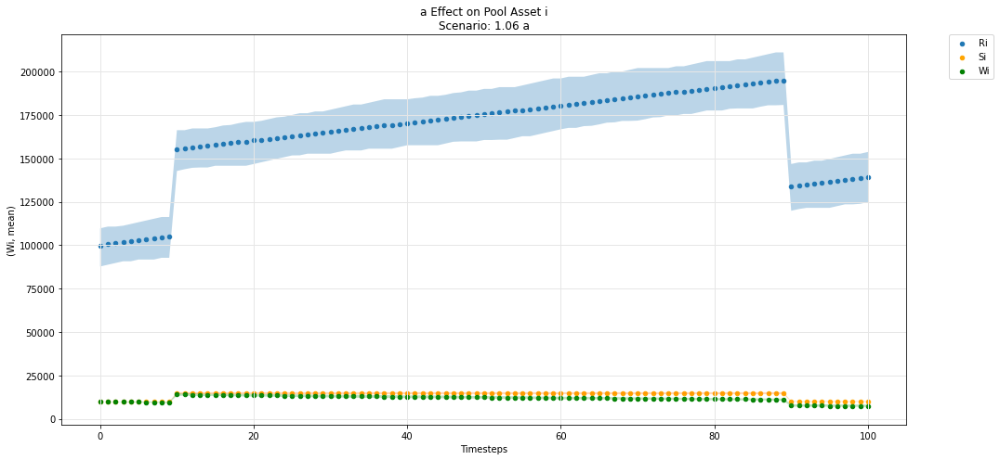

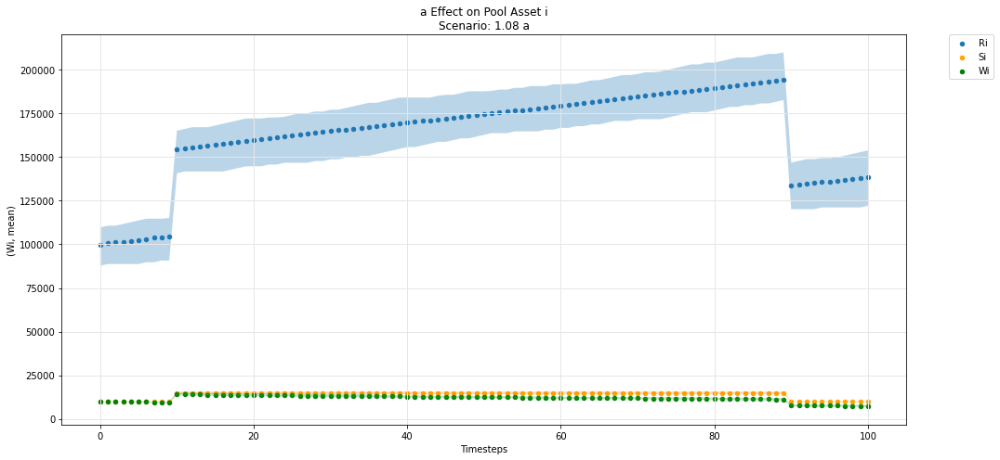

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

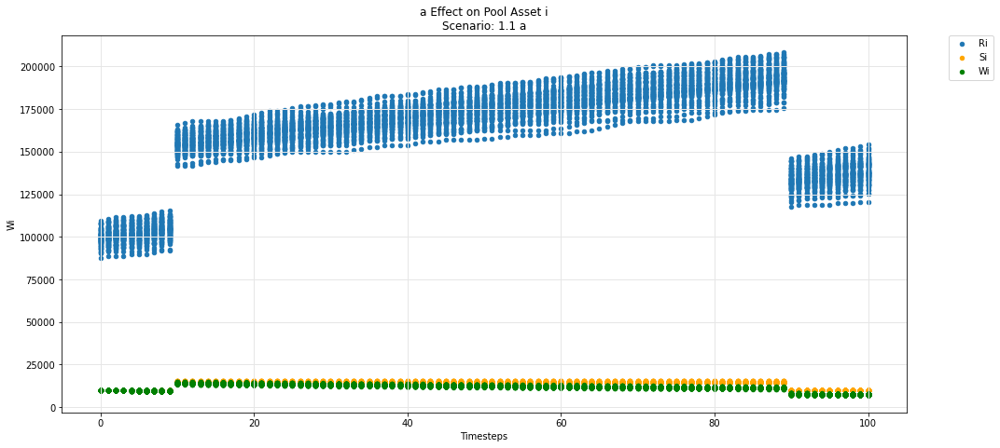

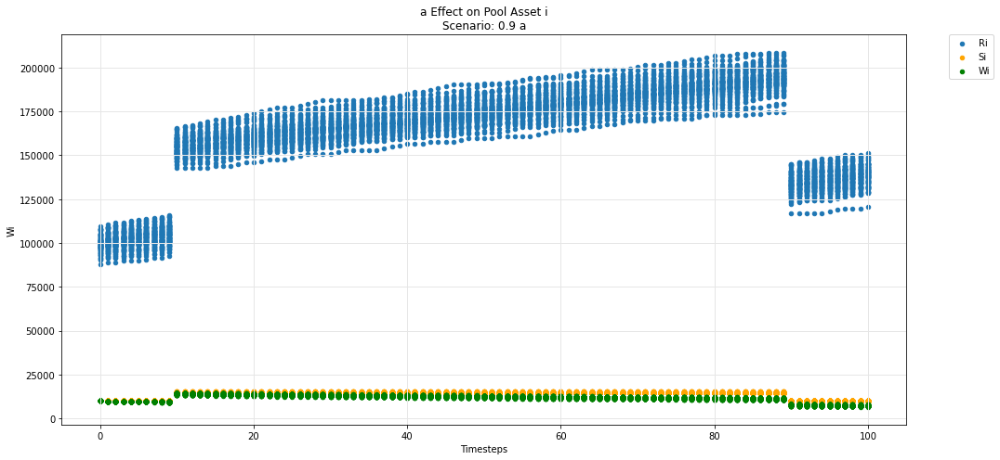

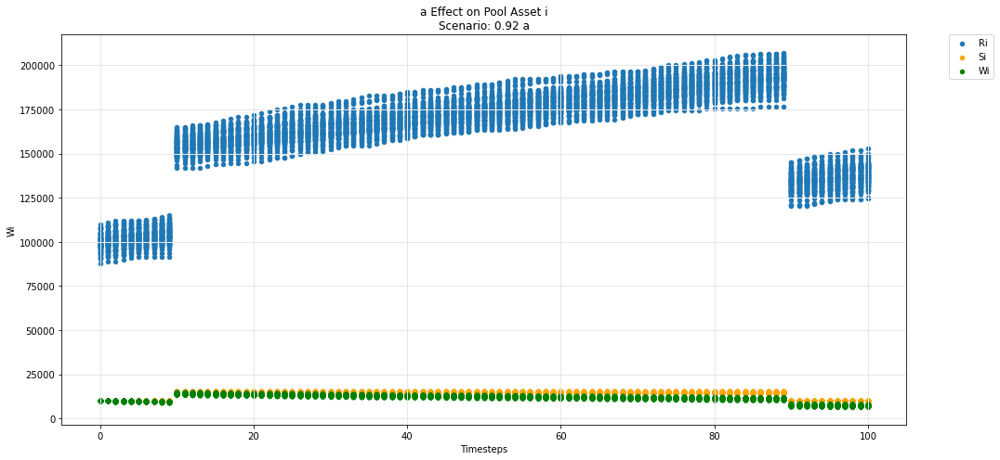

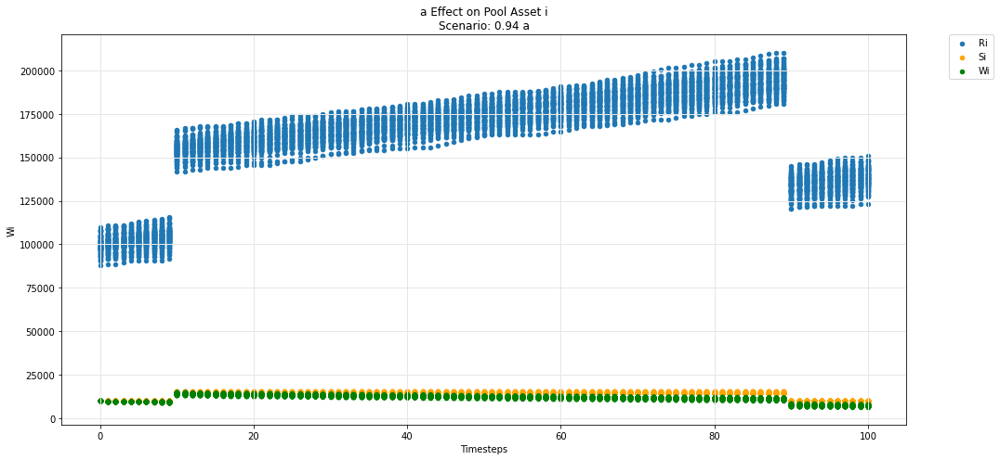

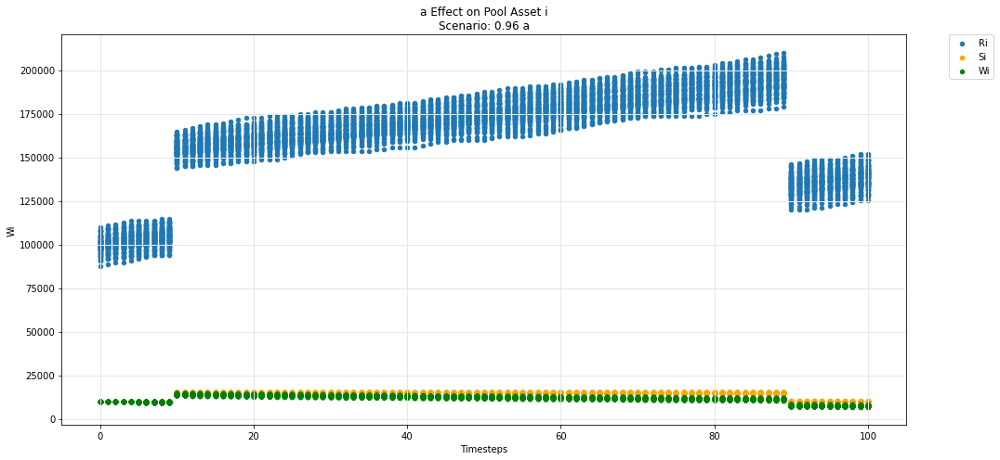

...

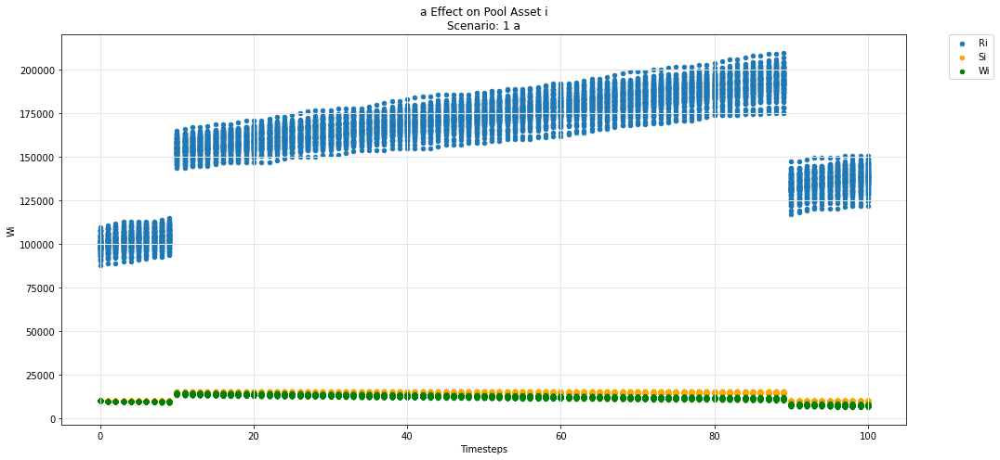

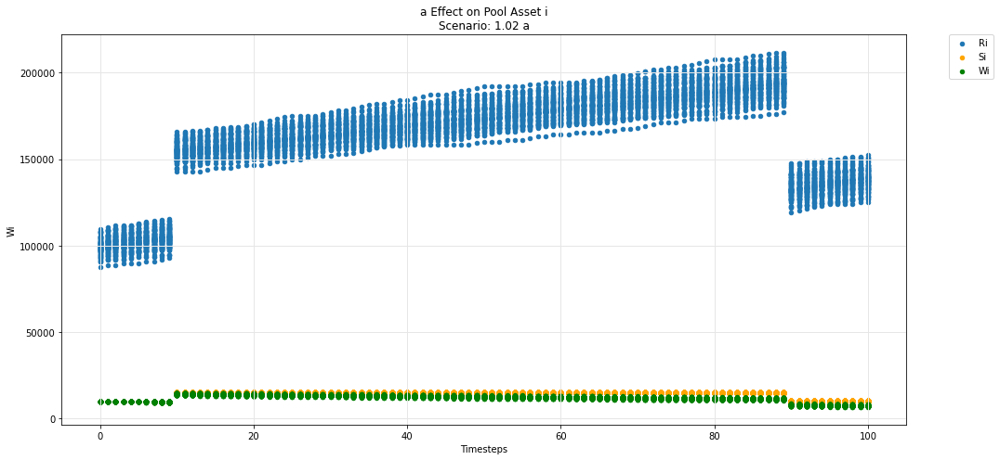

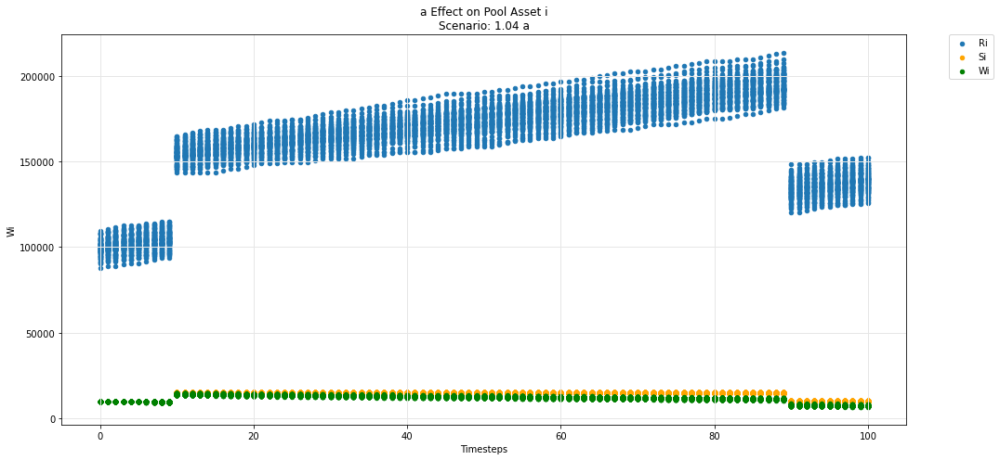

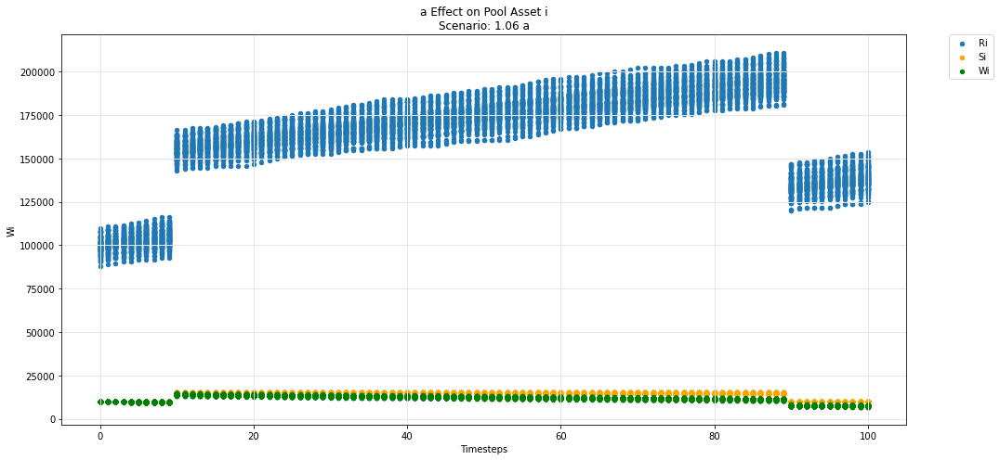

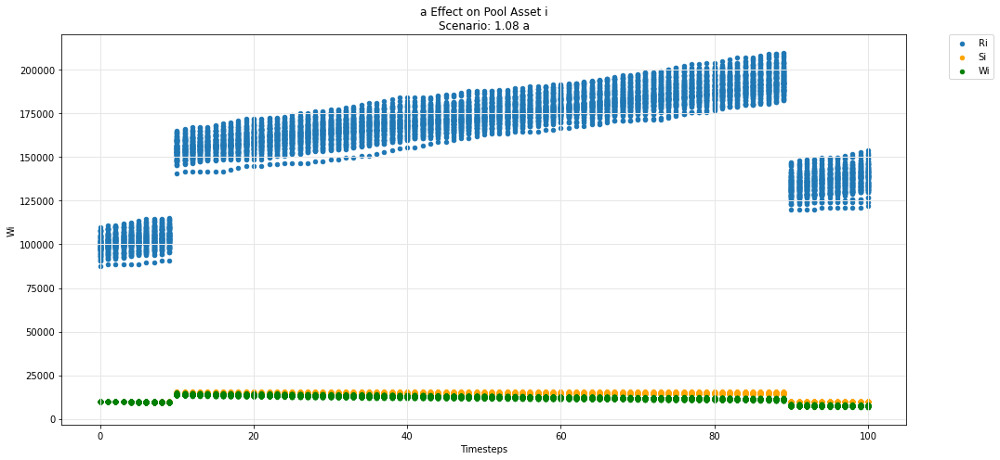

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

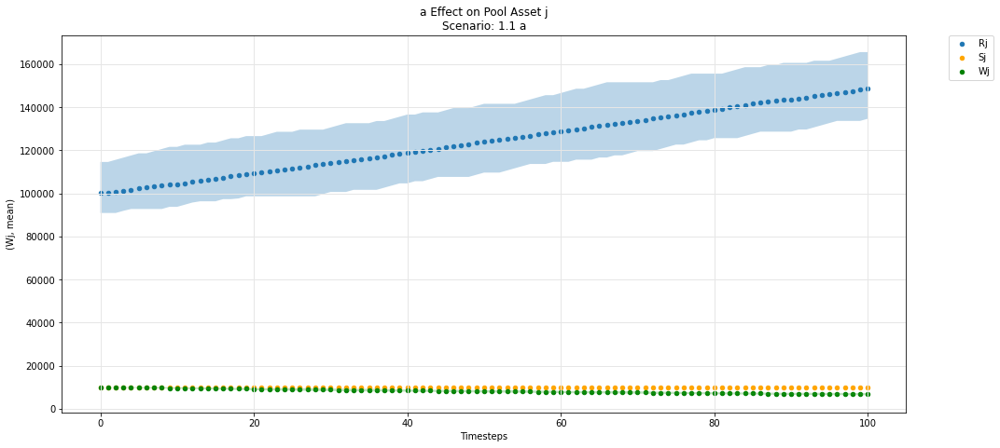

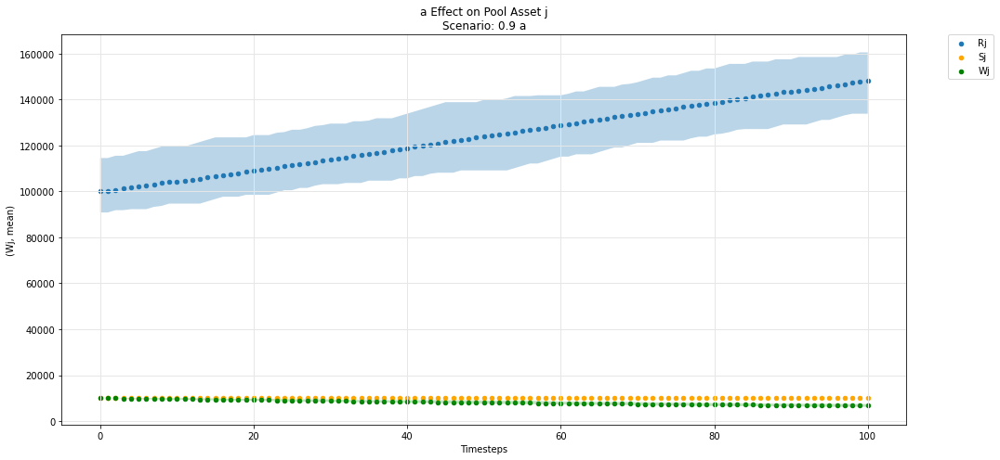

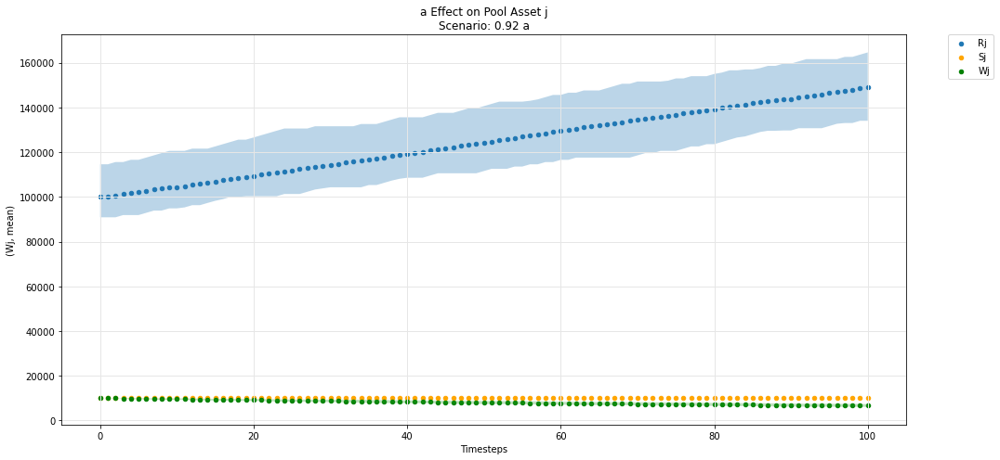

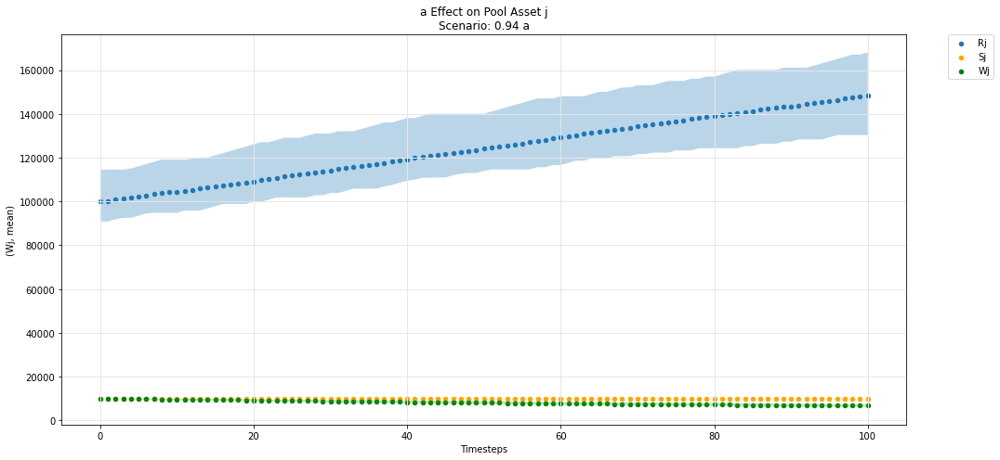

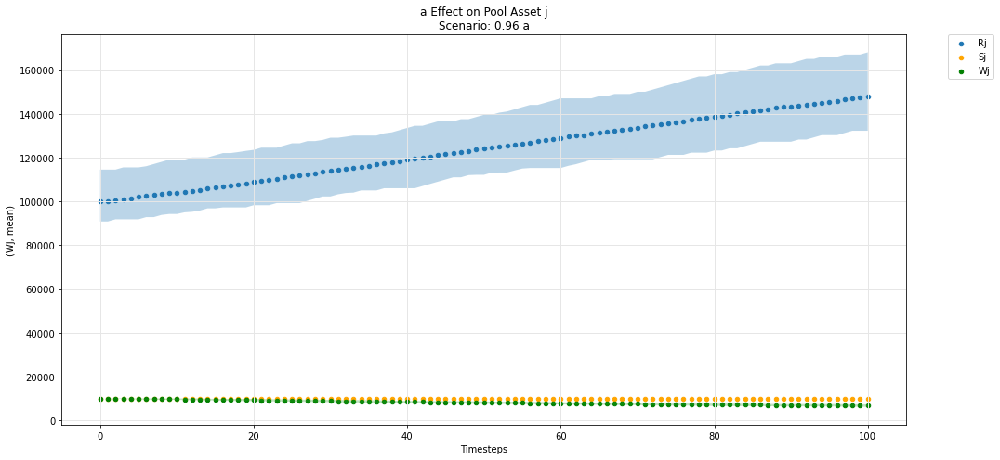

...

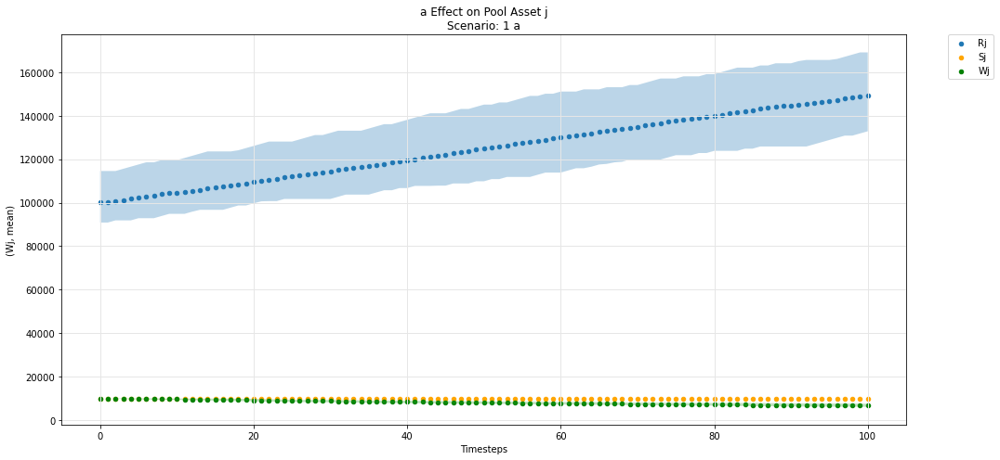

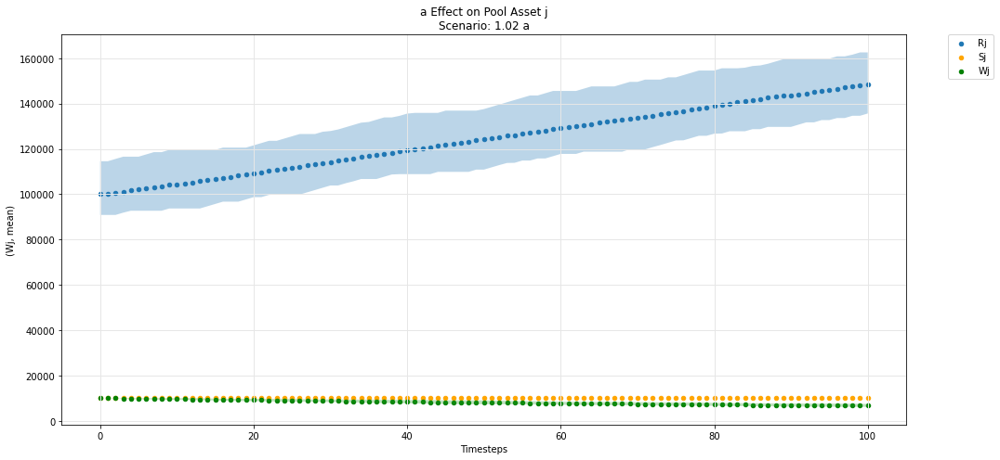

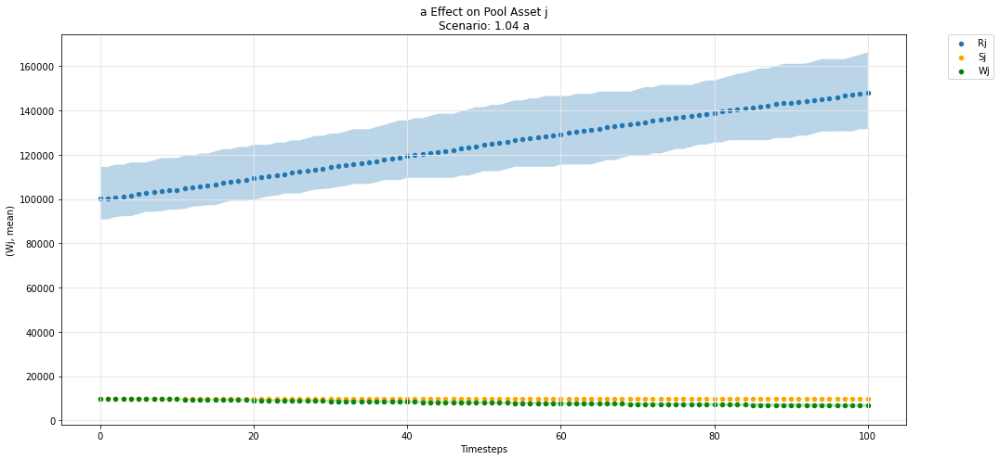

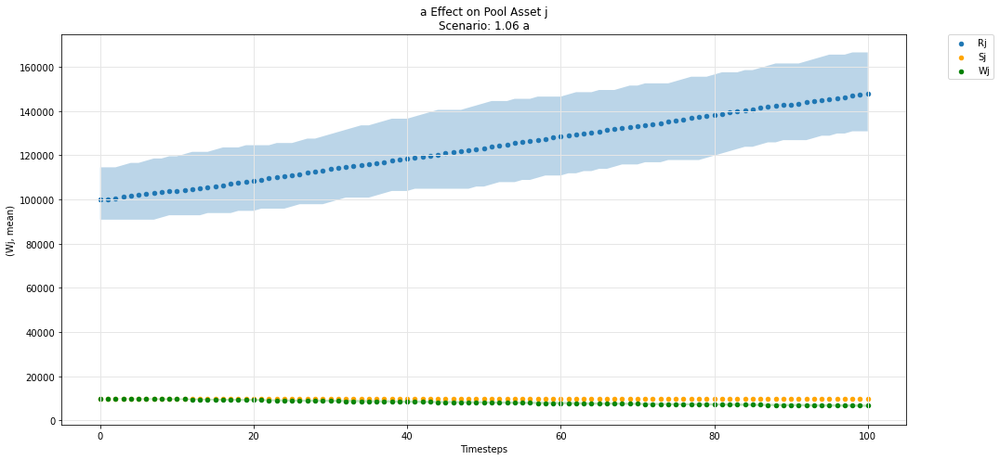

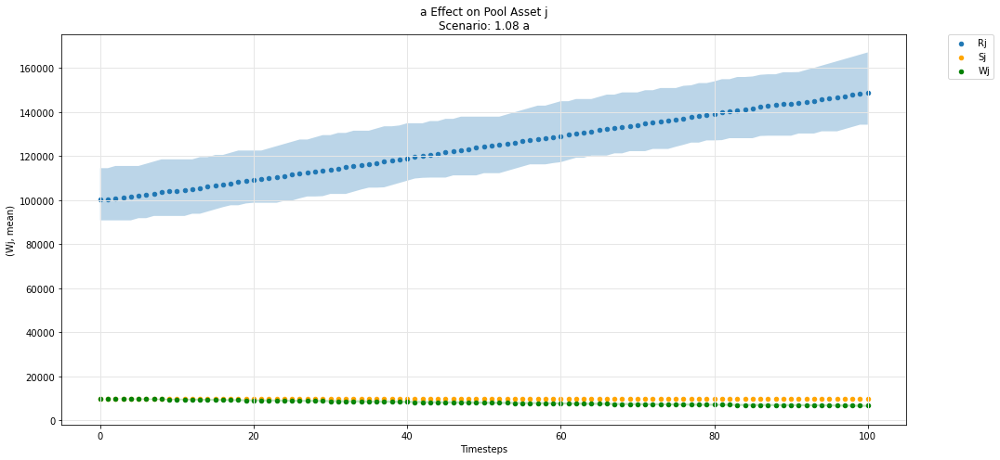

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

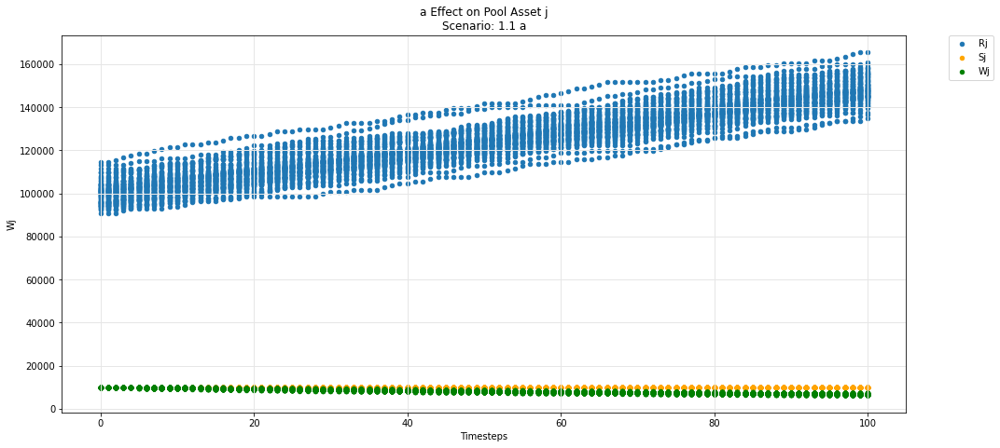

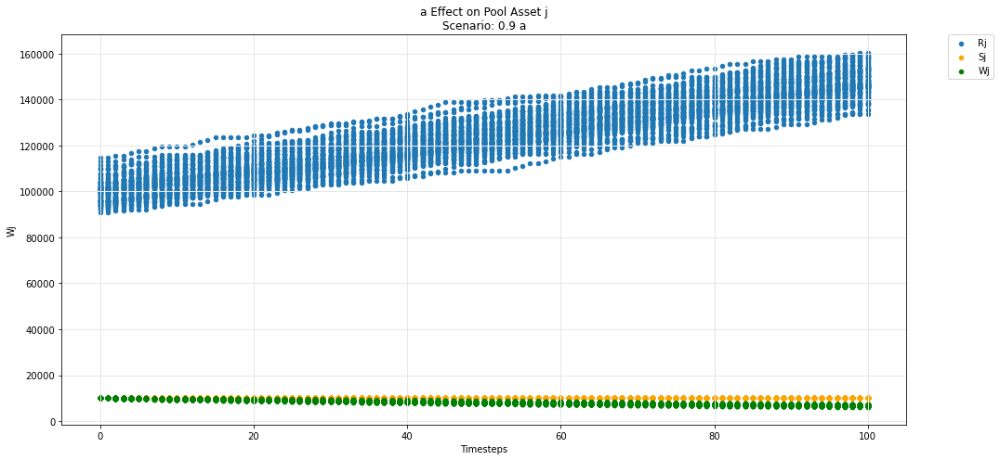

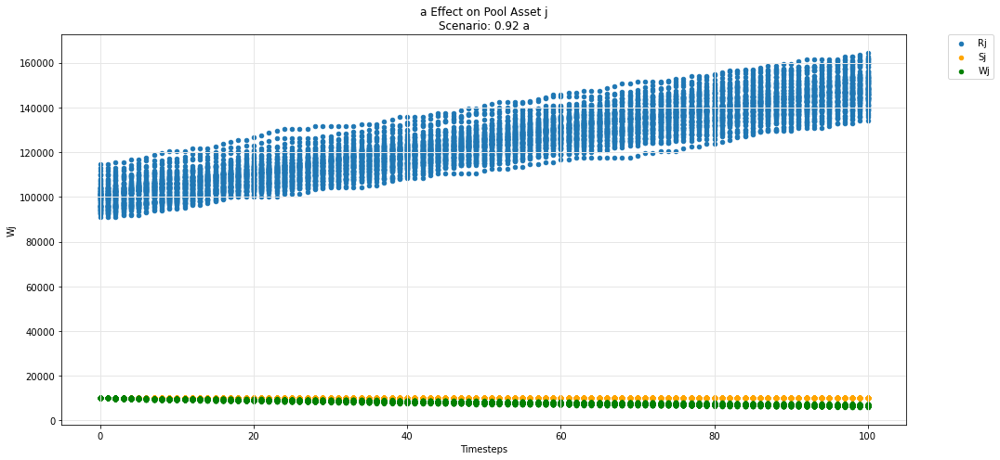

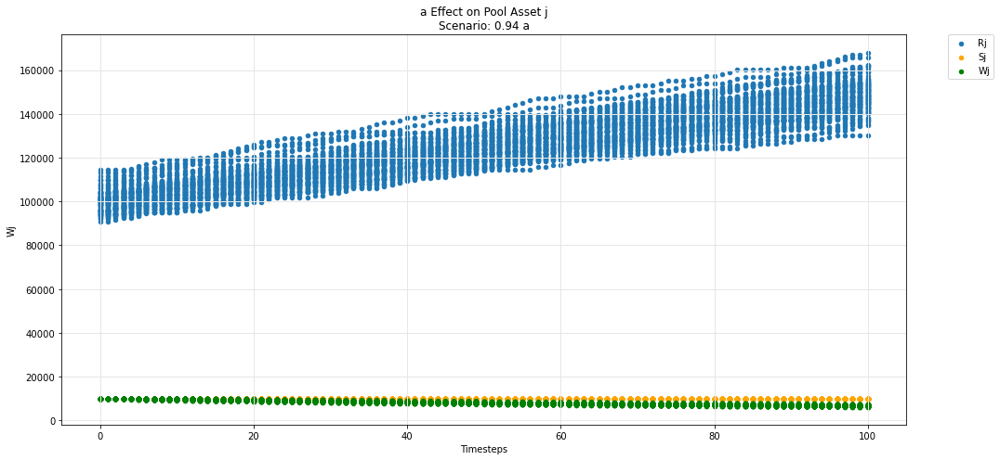

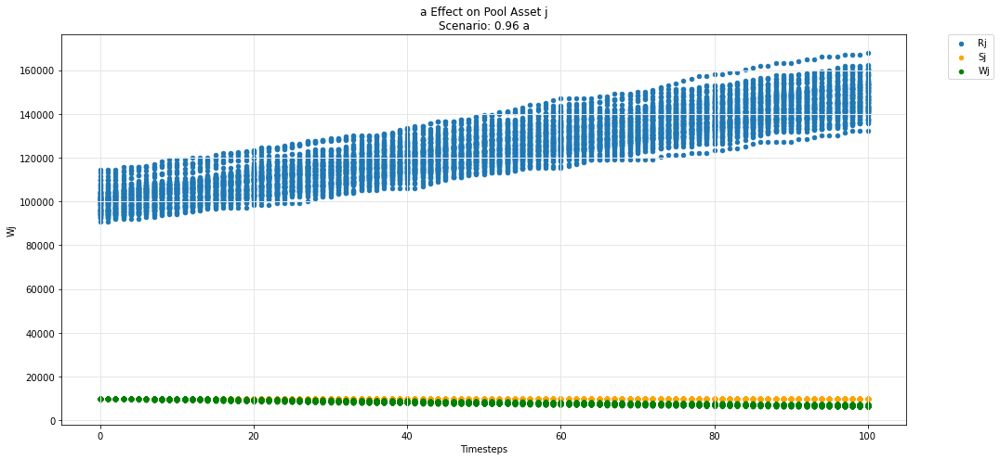

...

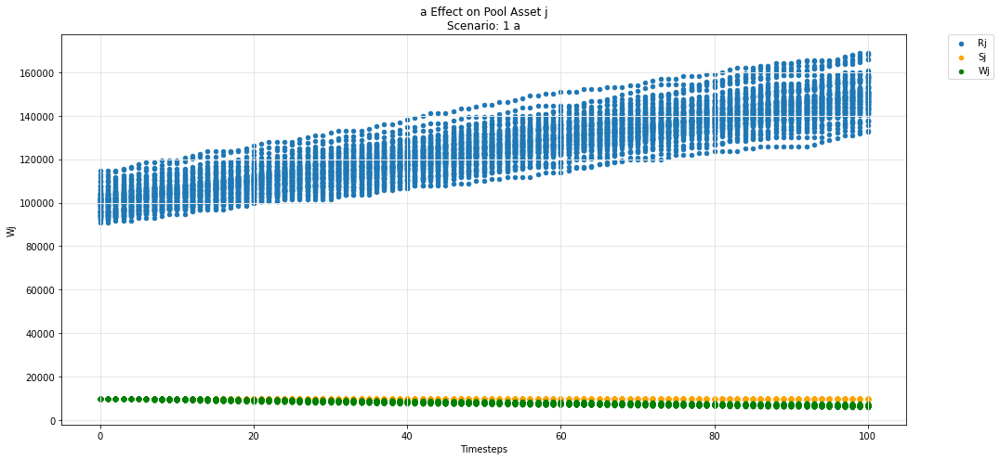

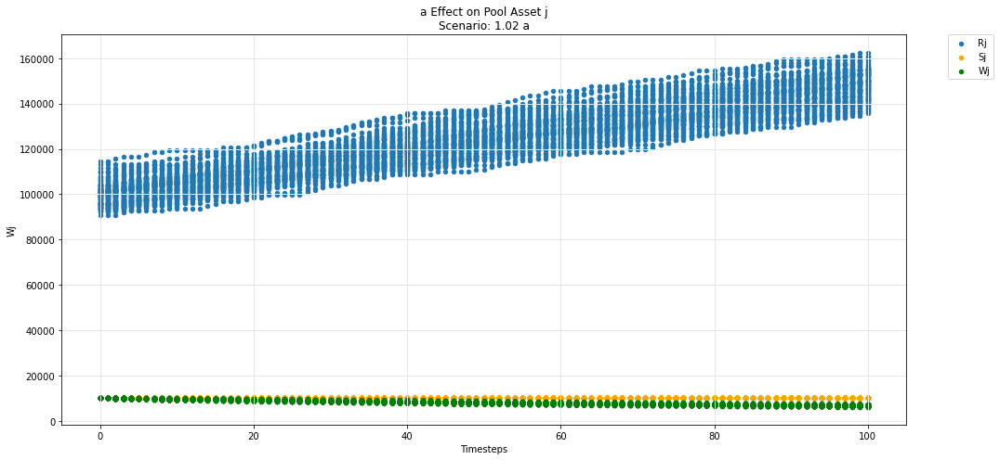

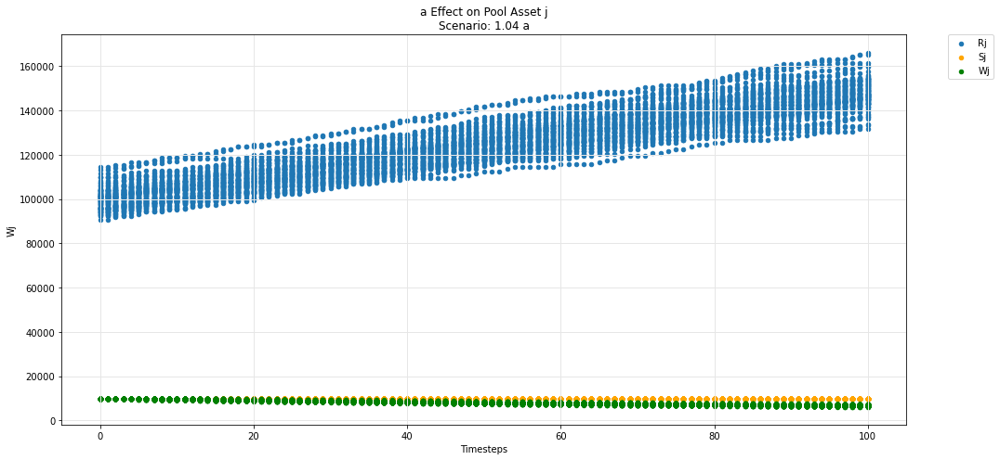

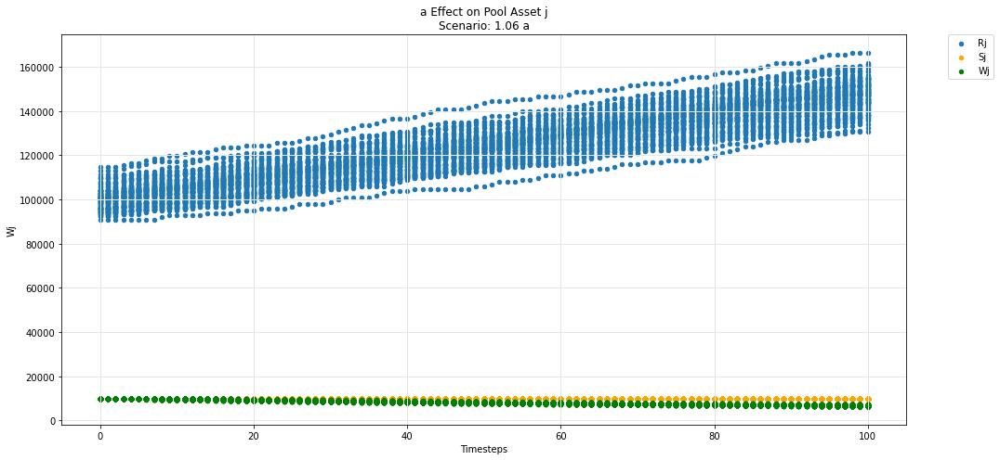

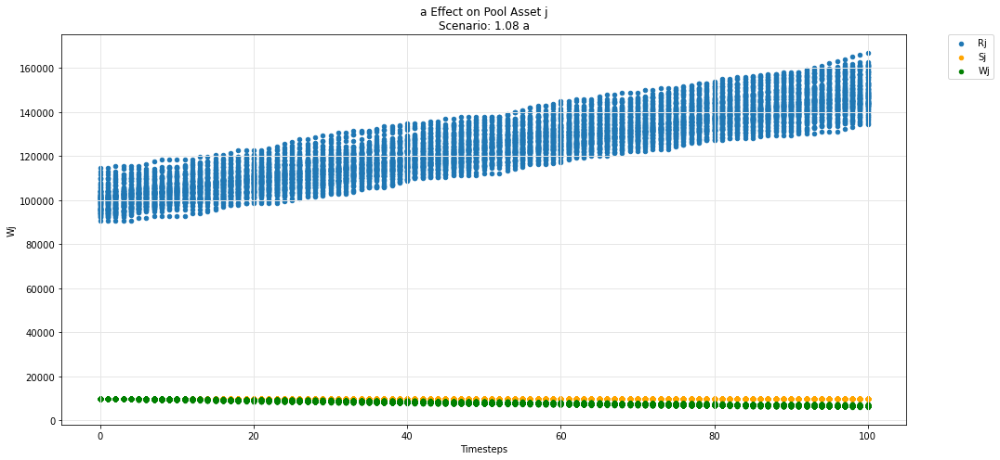

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

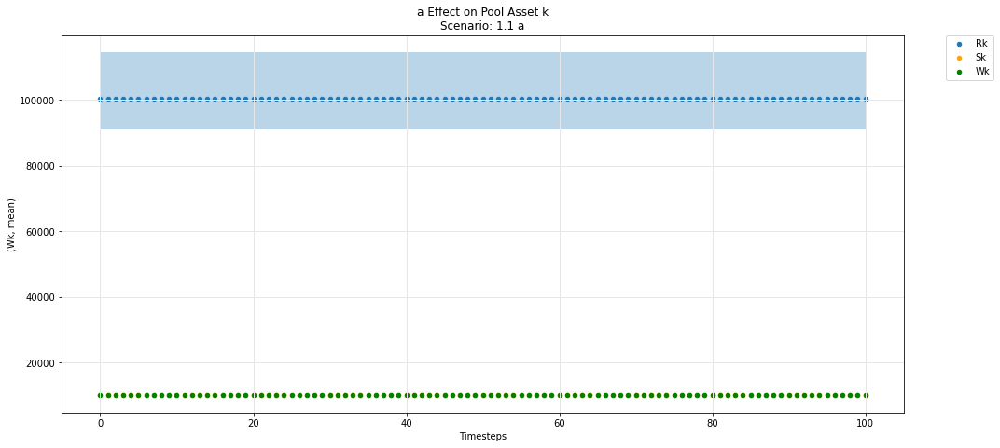

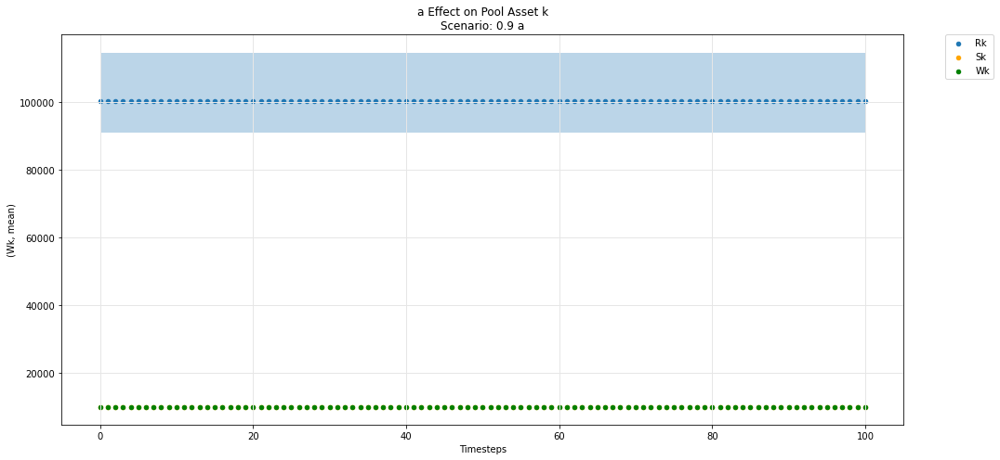

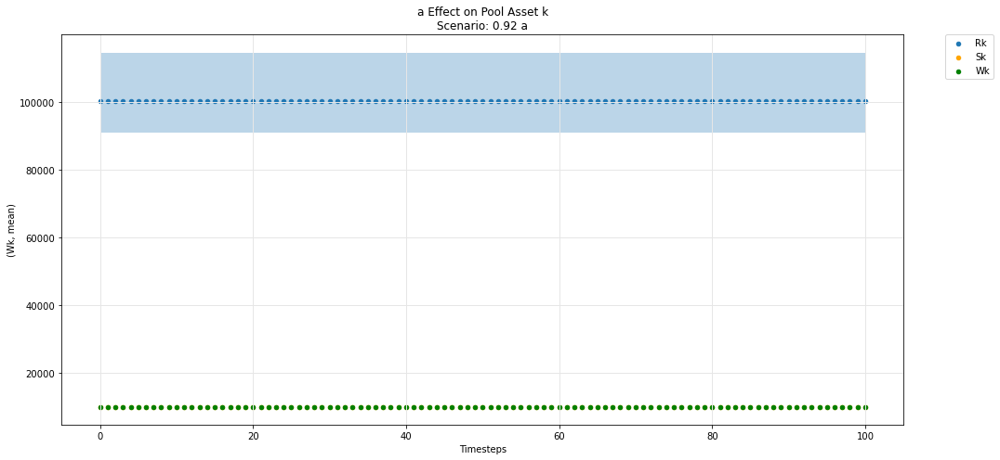

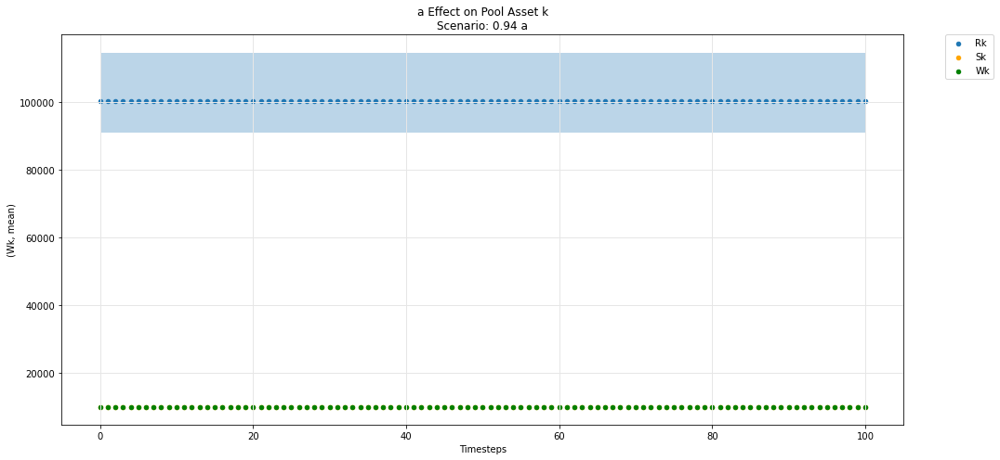

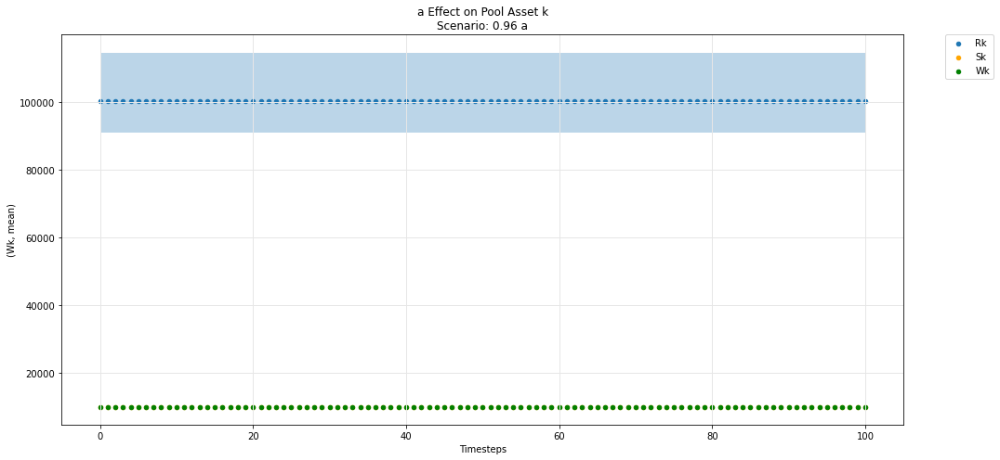

...

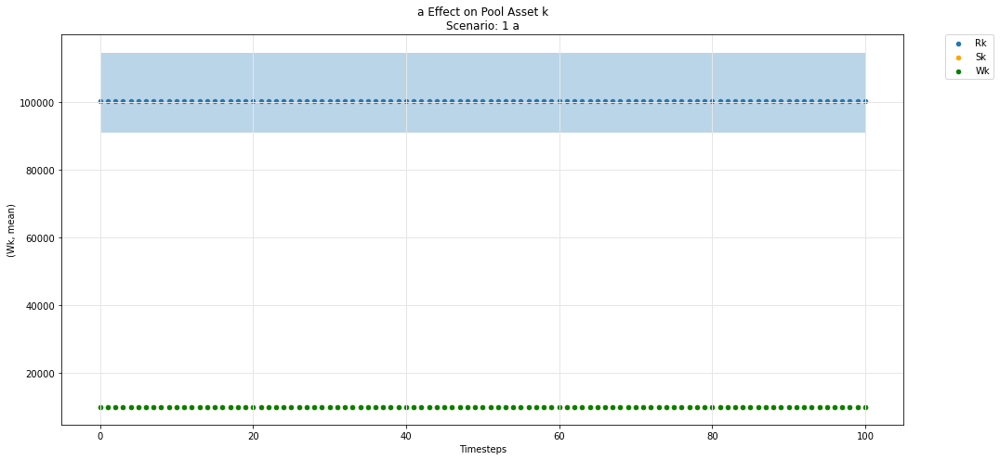

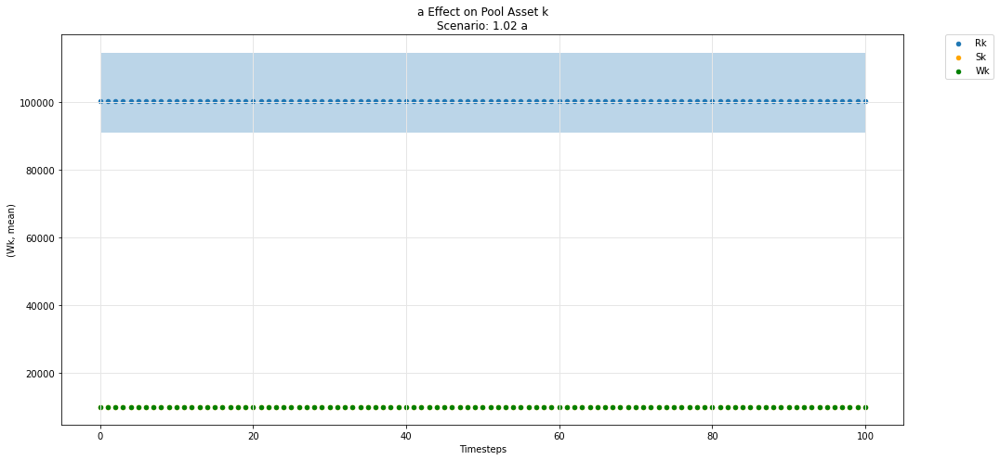

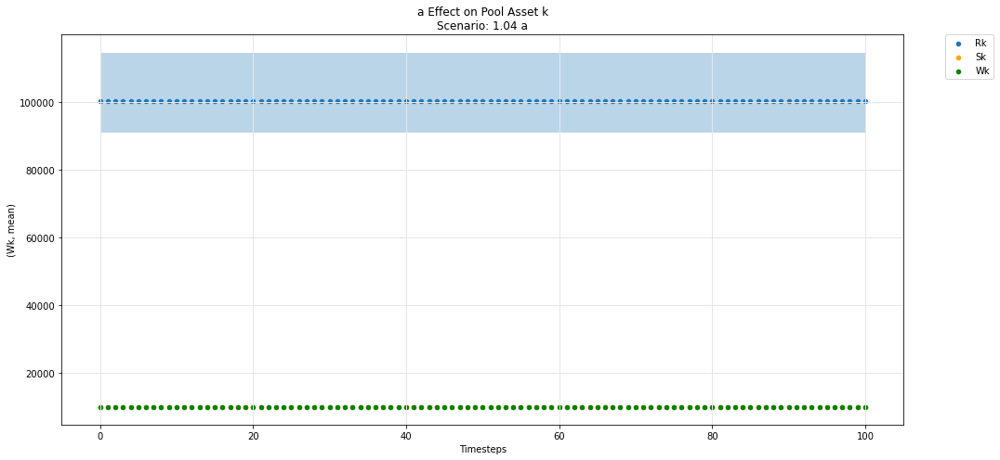

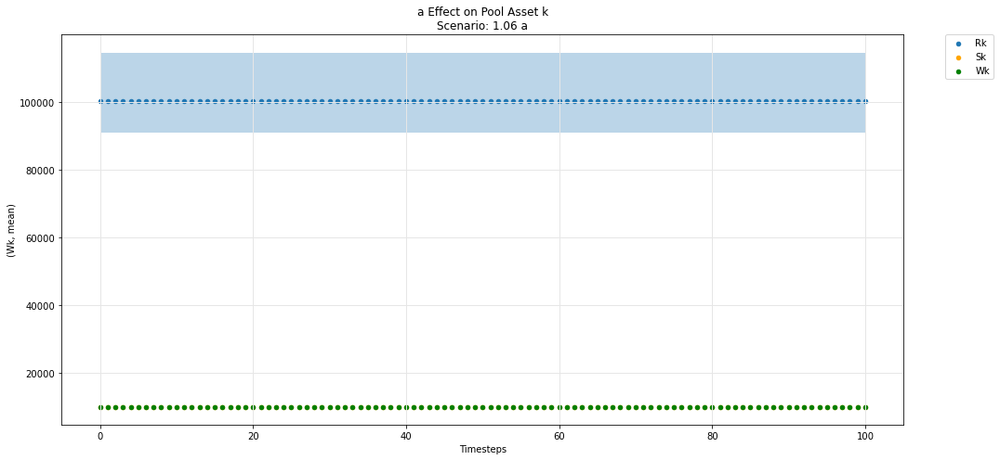

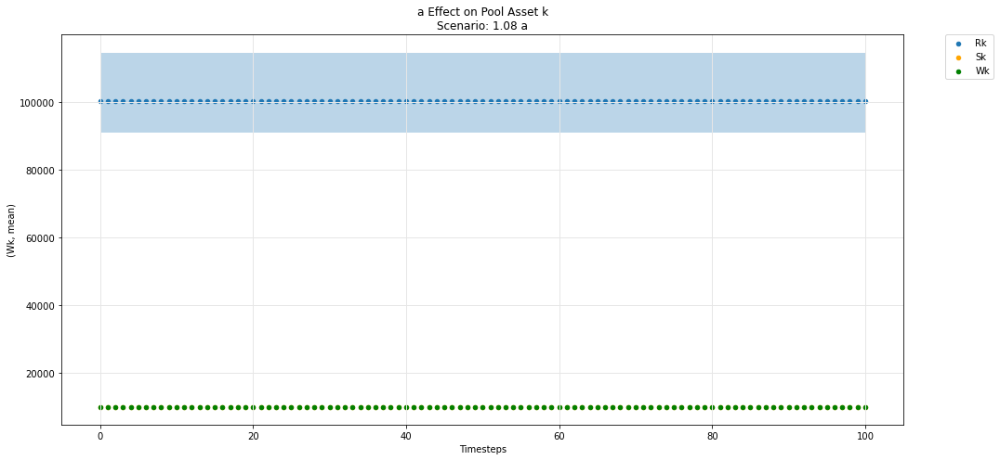

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

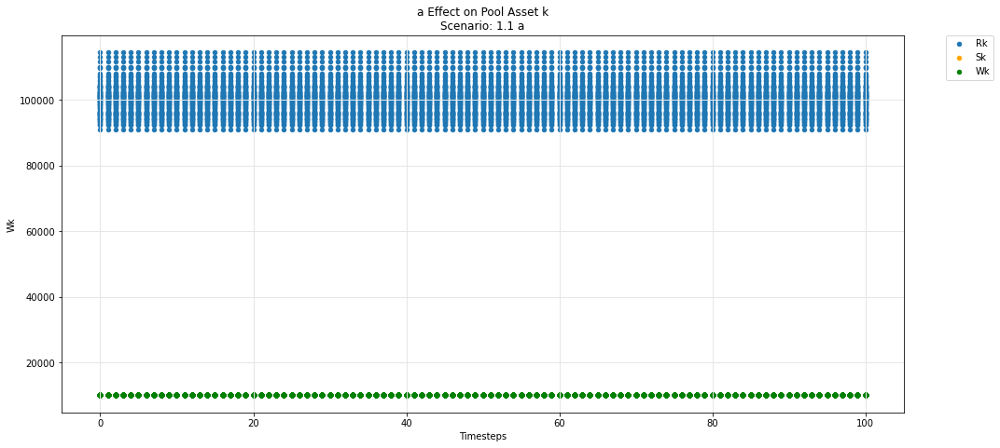

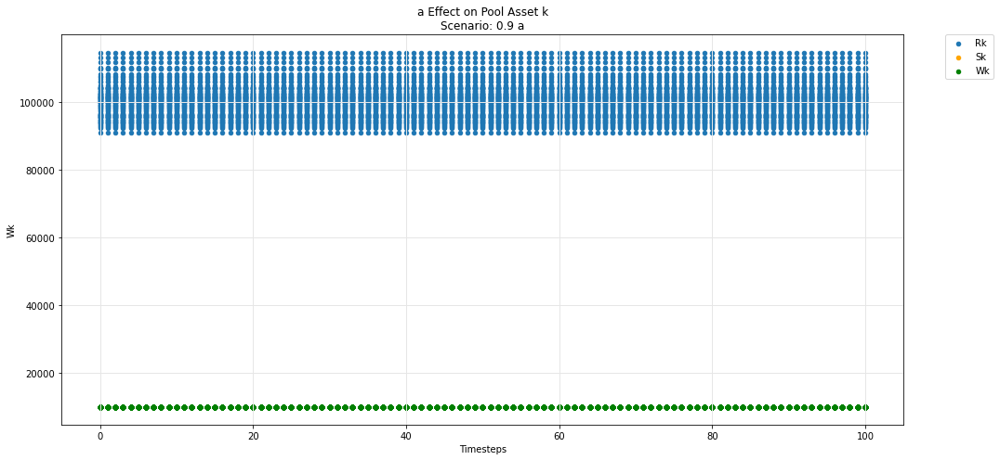

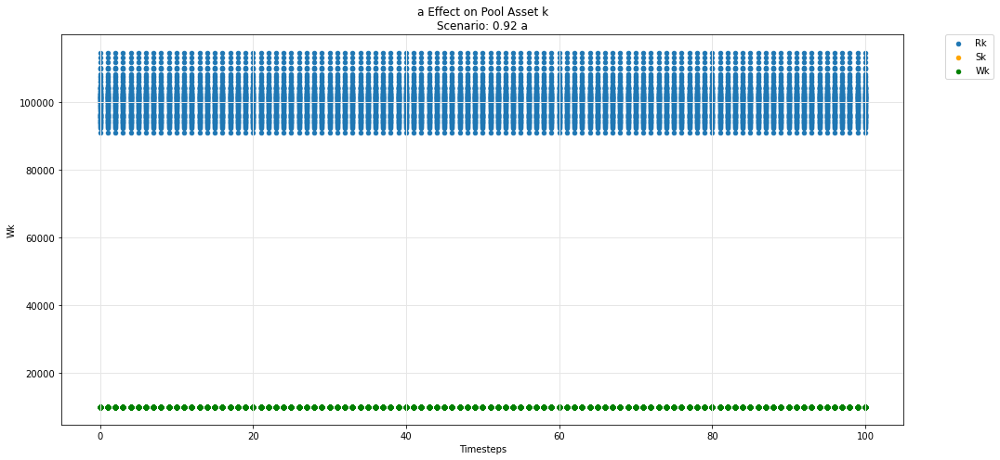

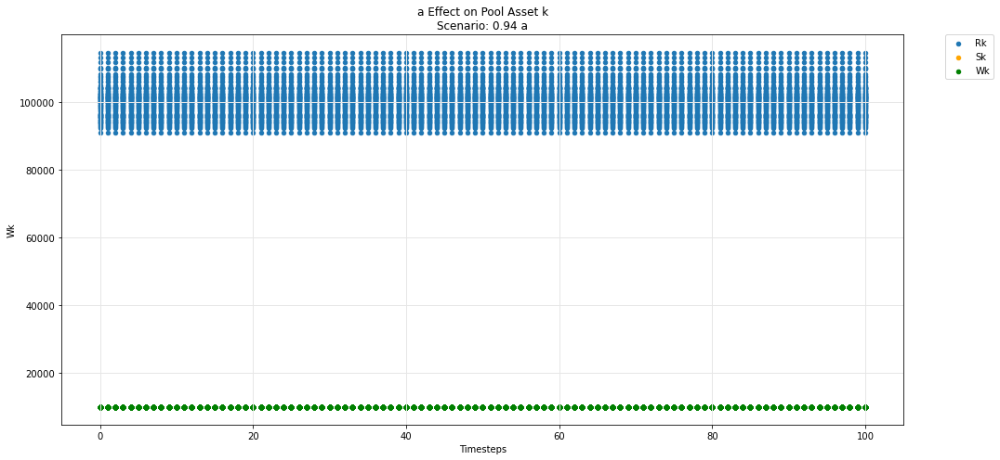

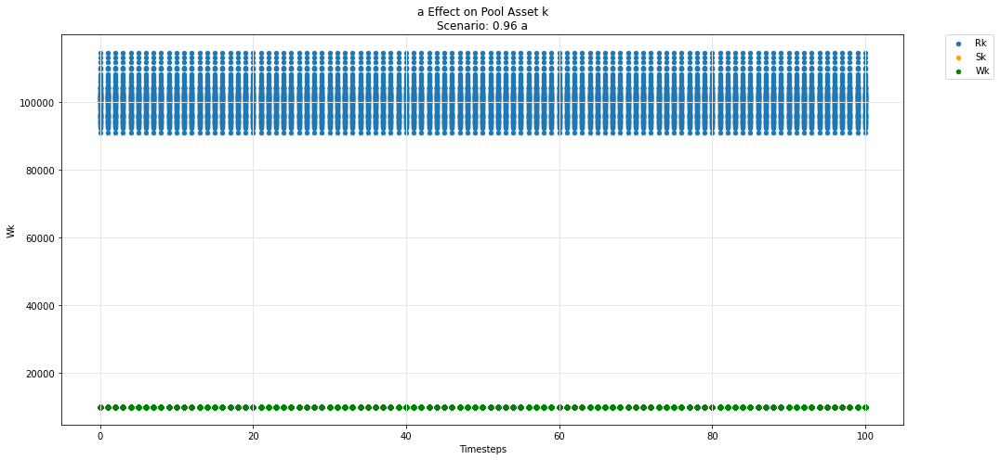

...

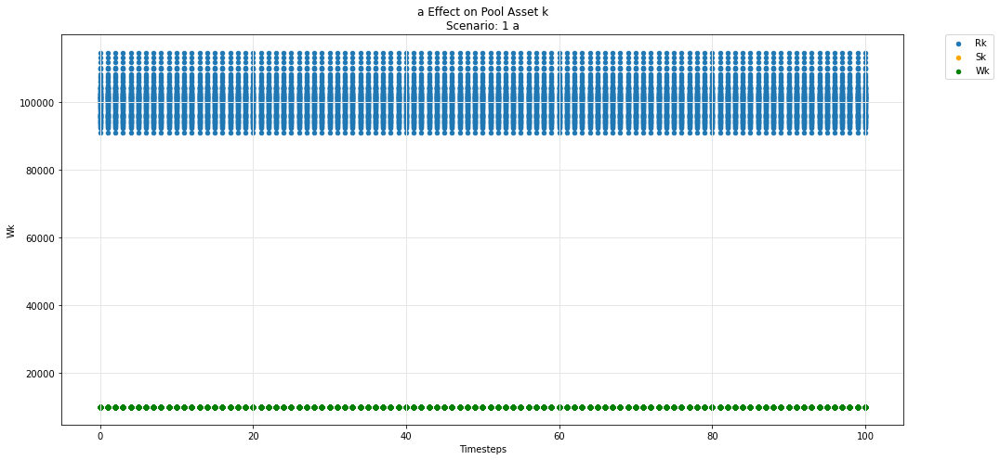

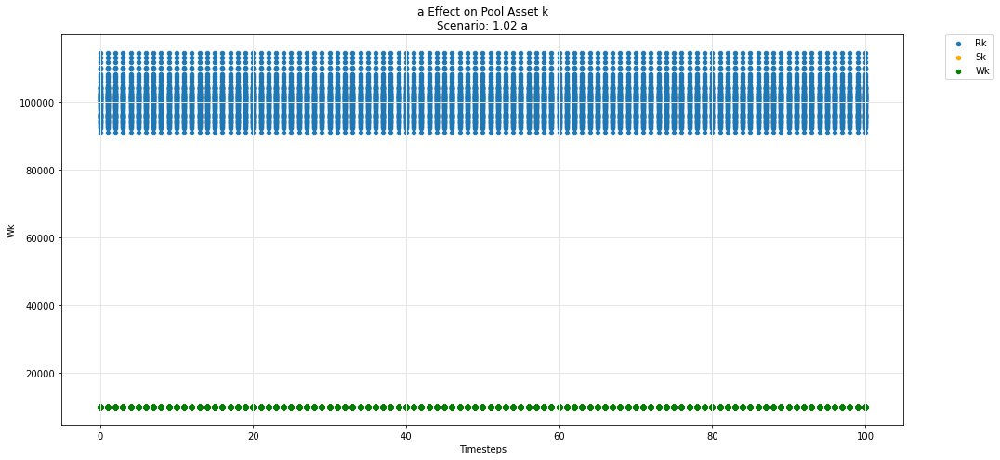

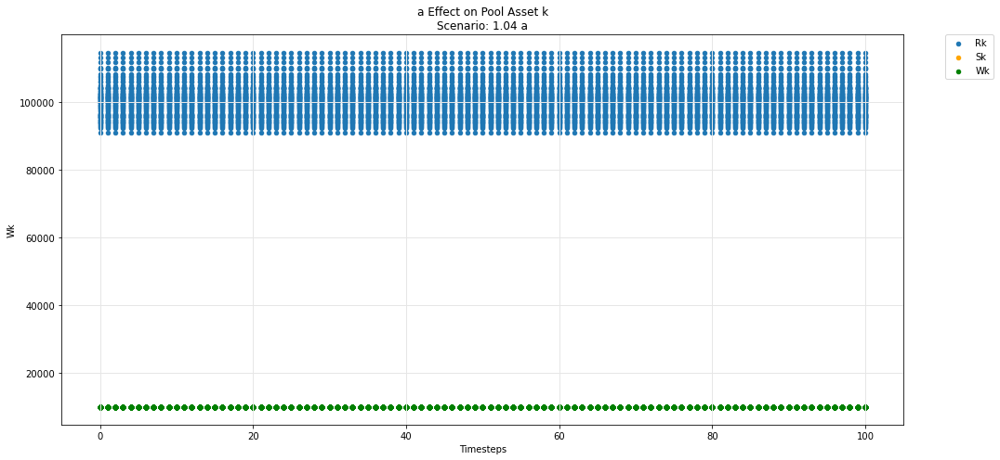

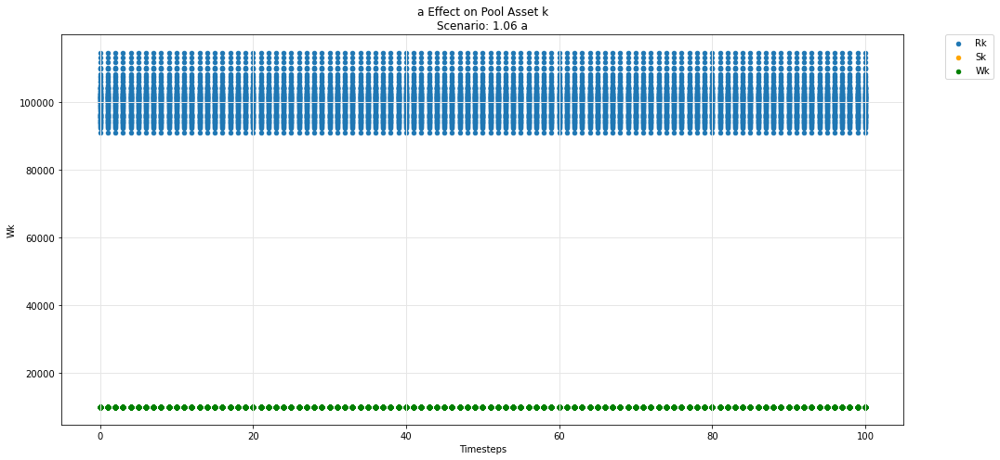

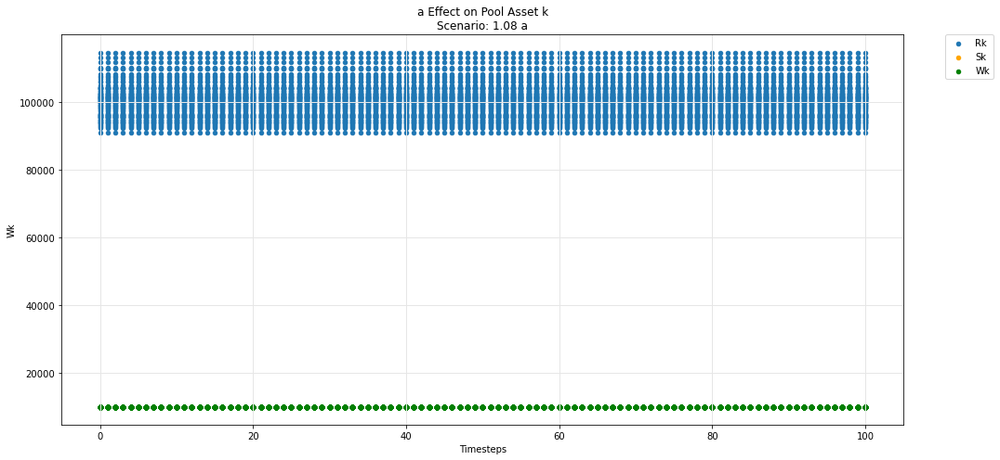

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

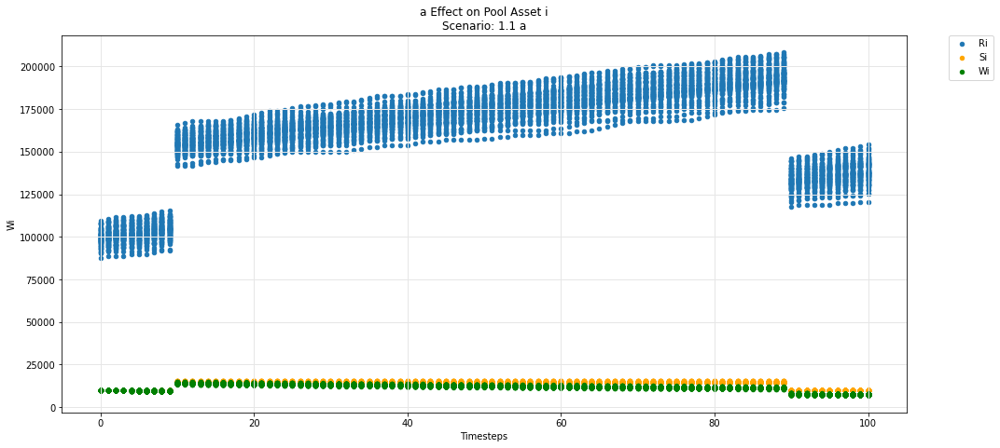

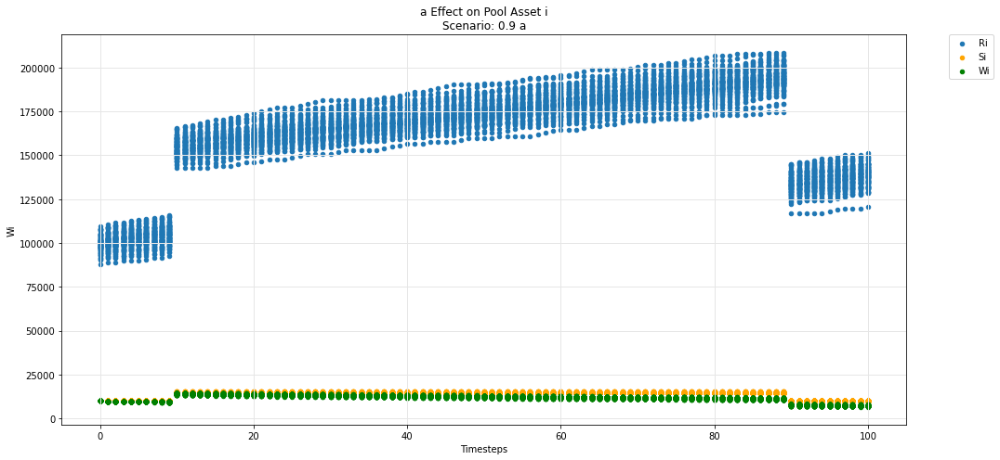

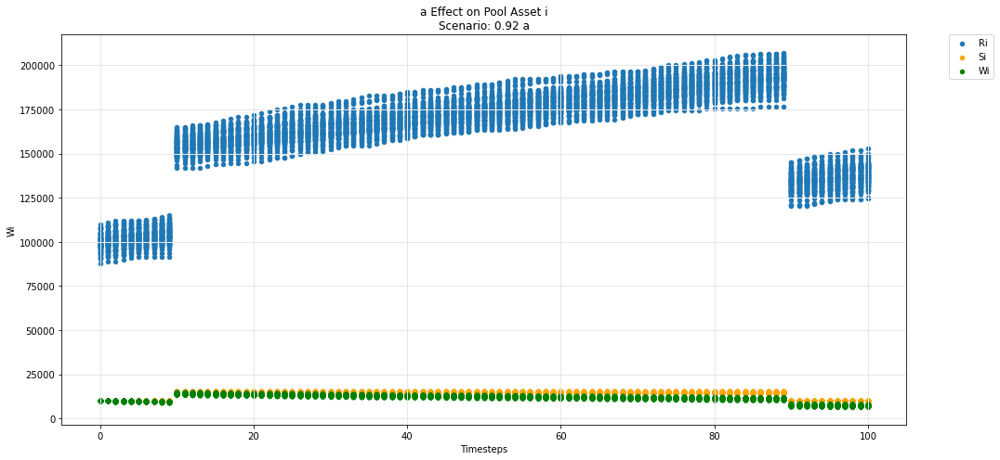

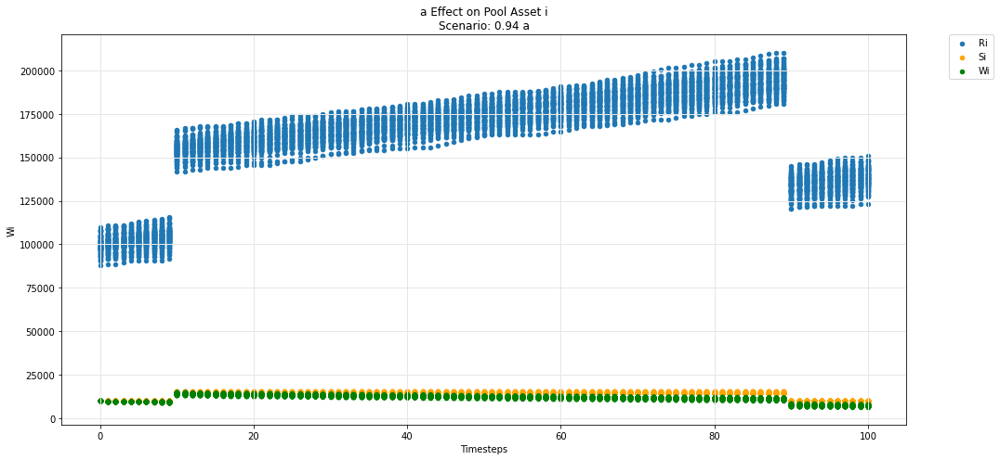

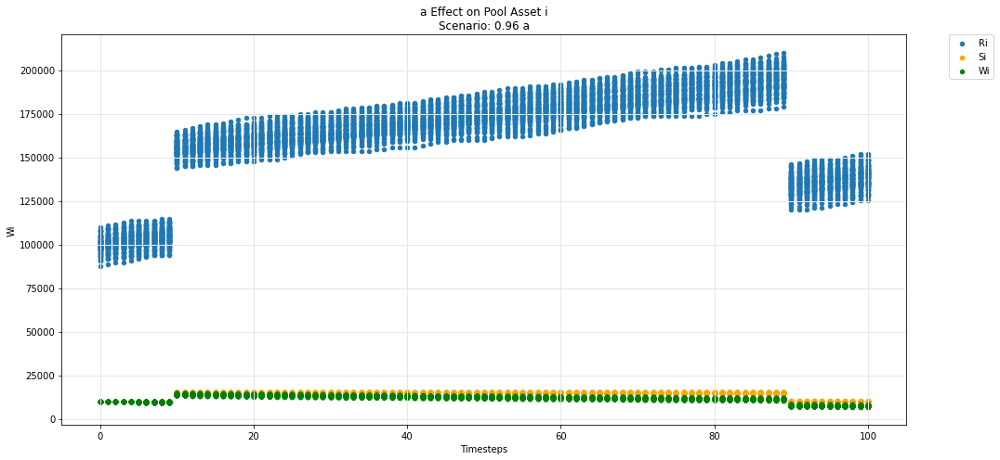

...

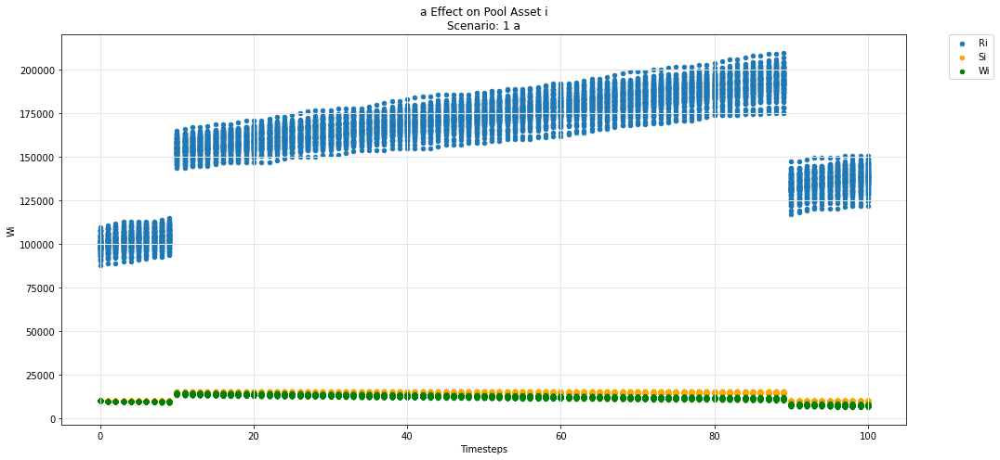

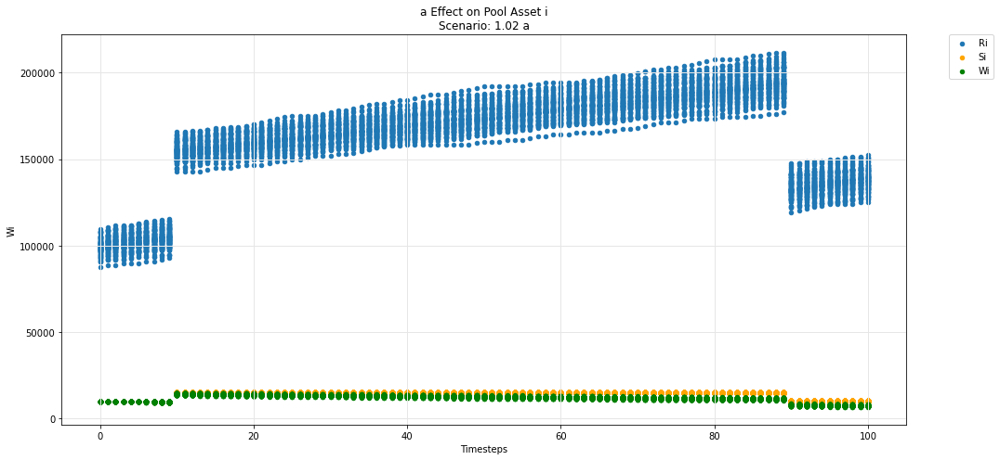

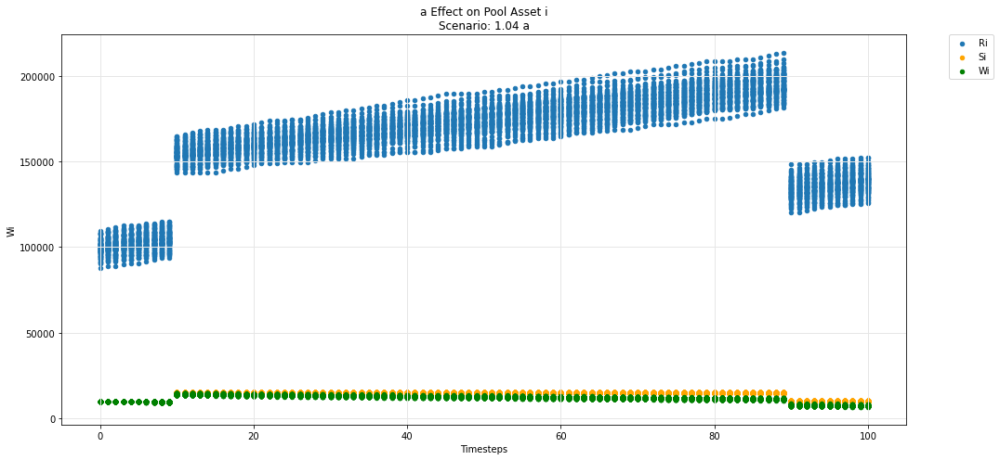

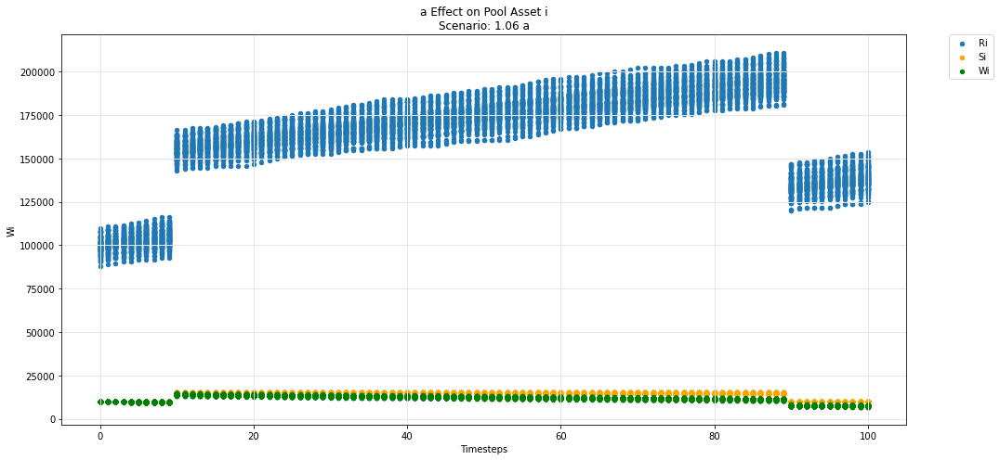

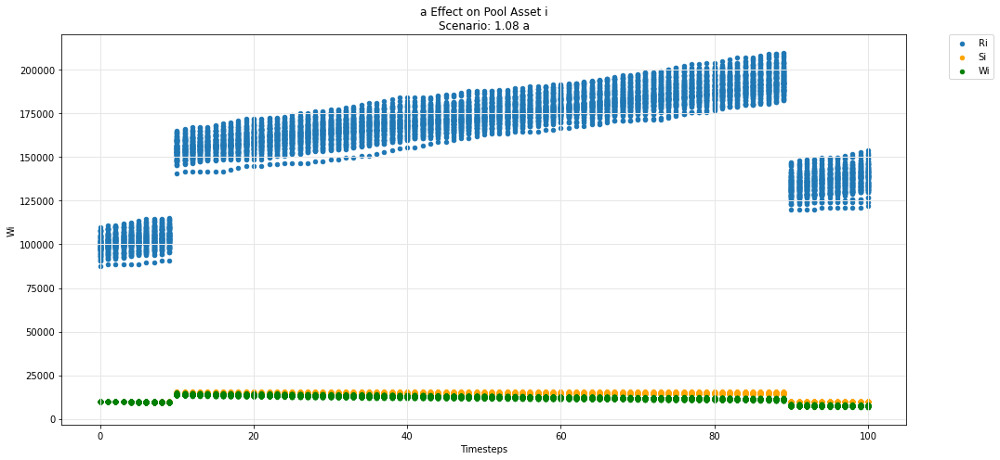

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

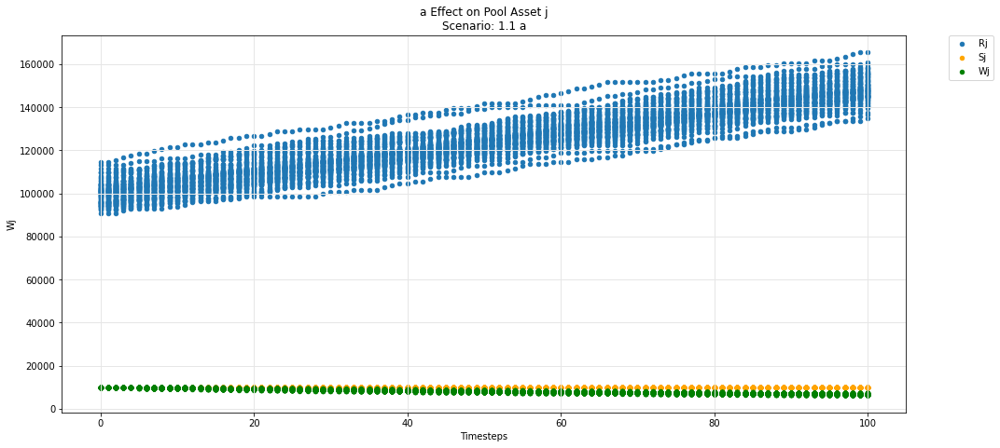

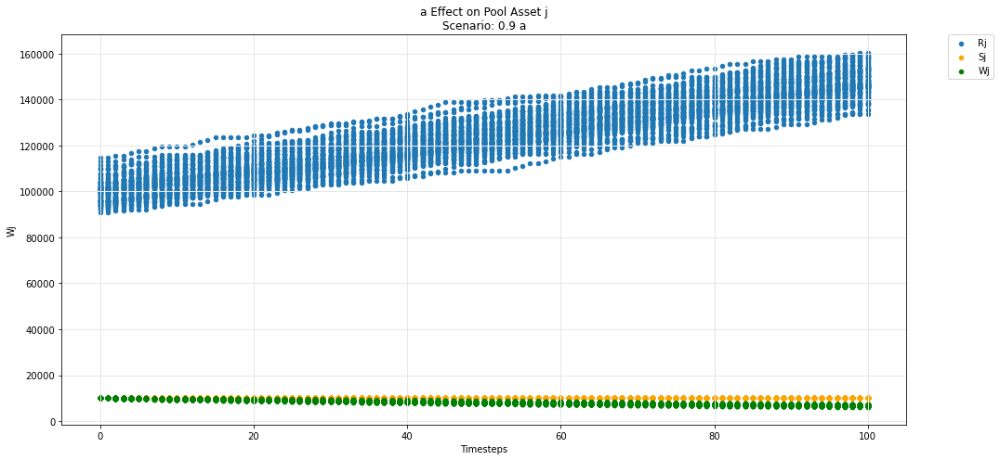

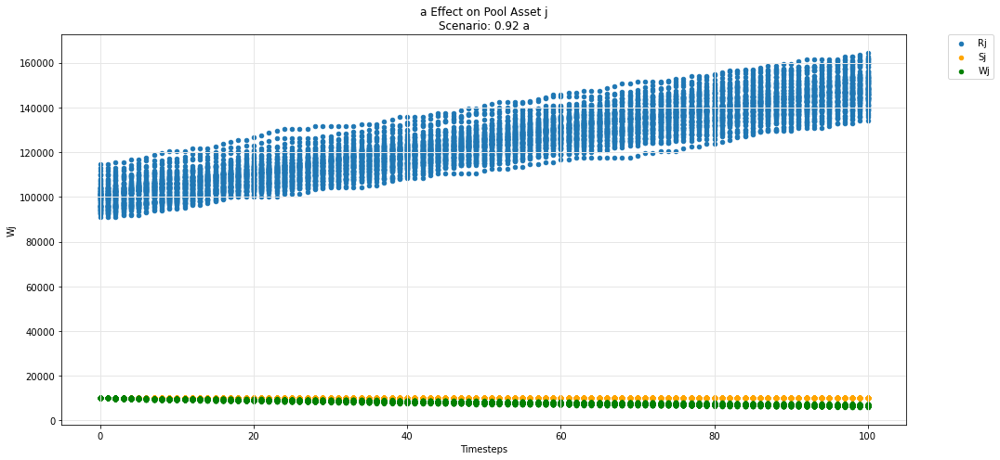

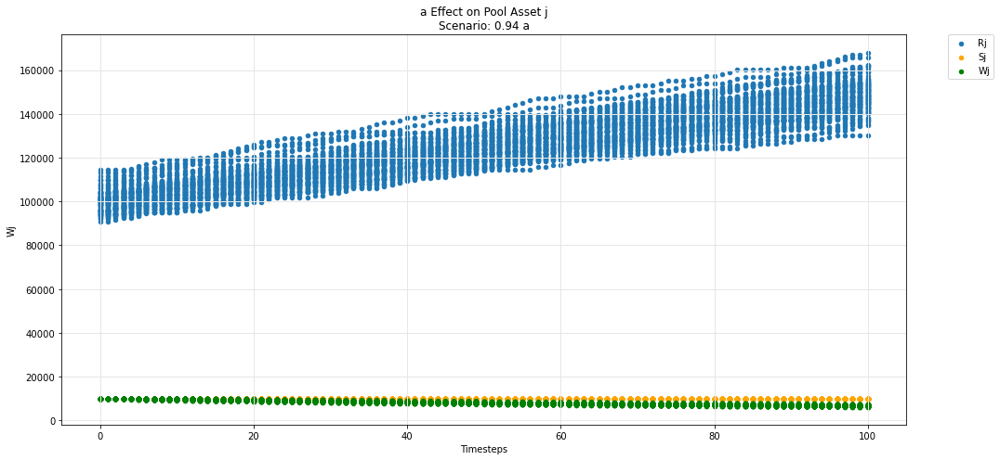

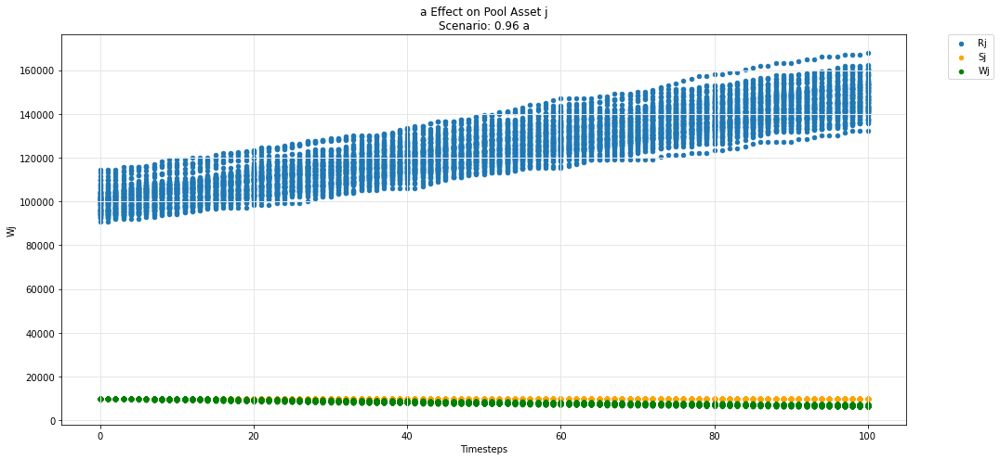

...

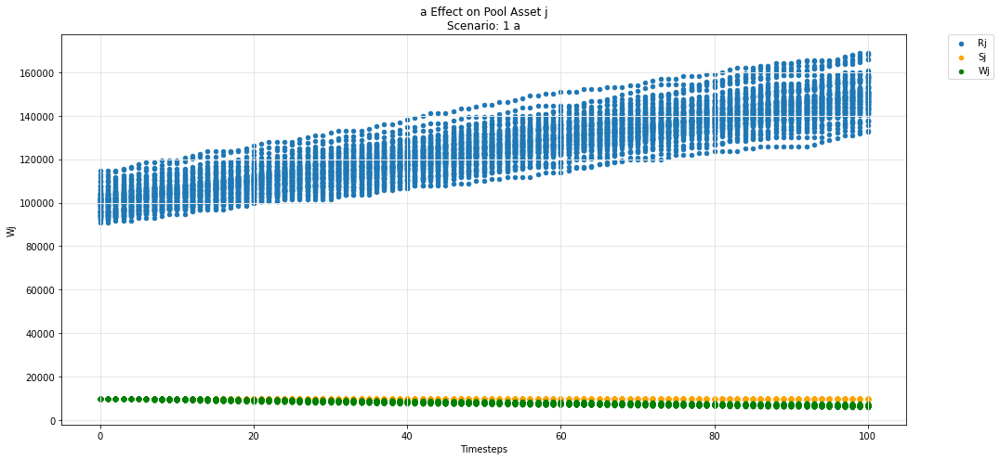

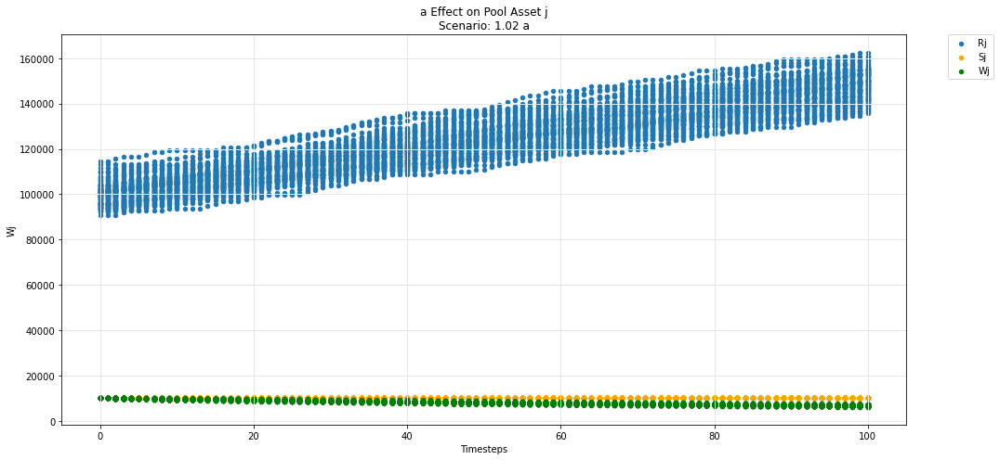

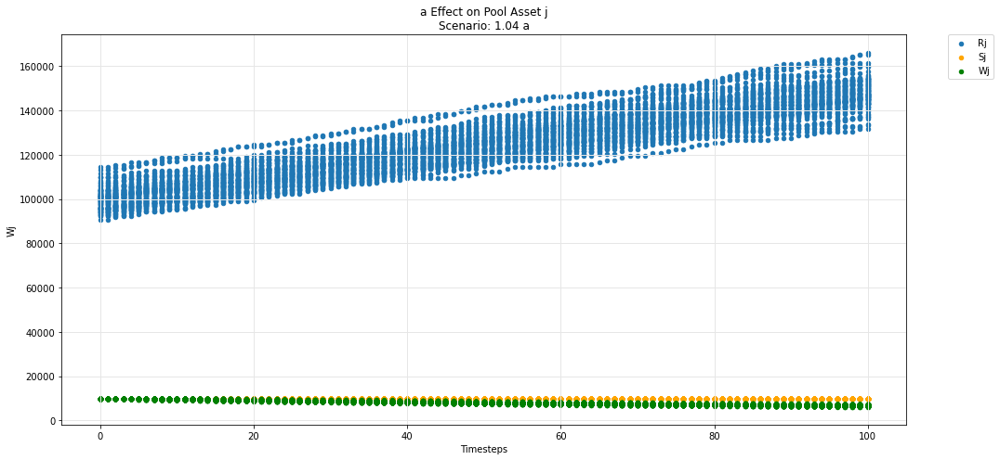

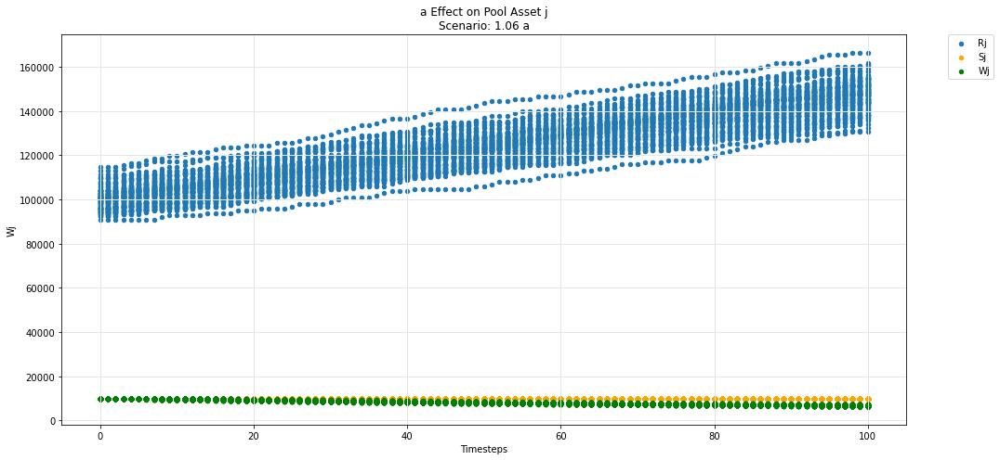

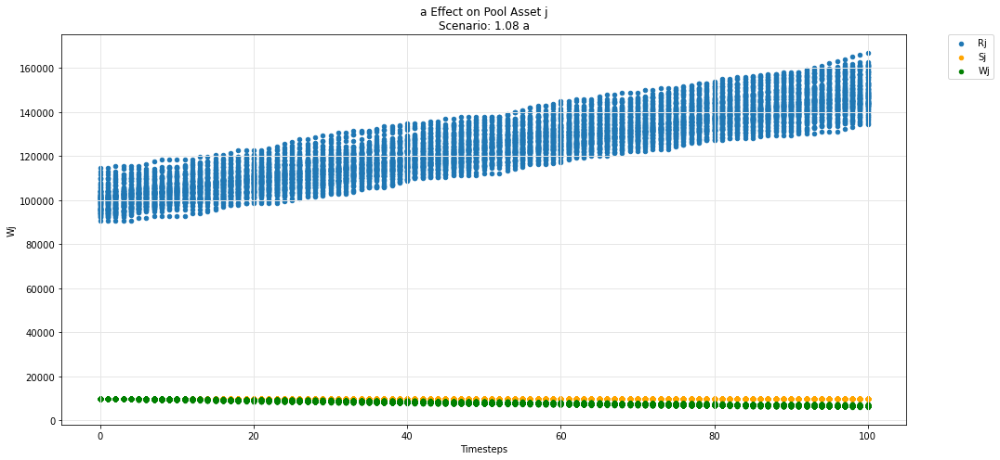

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

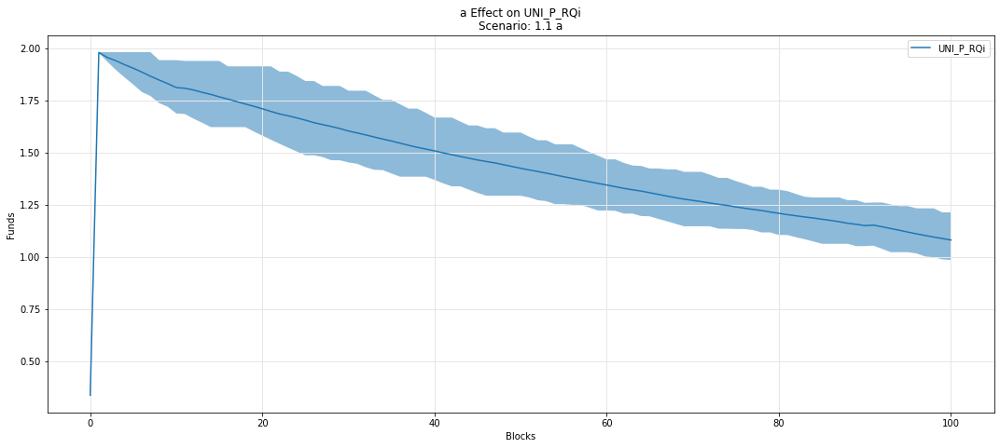

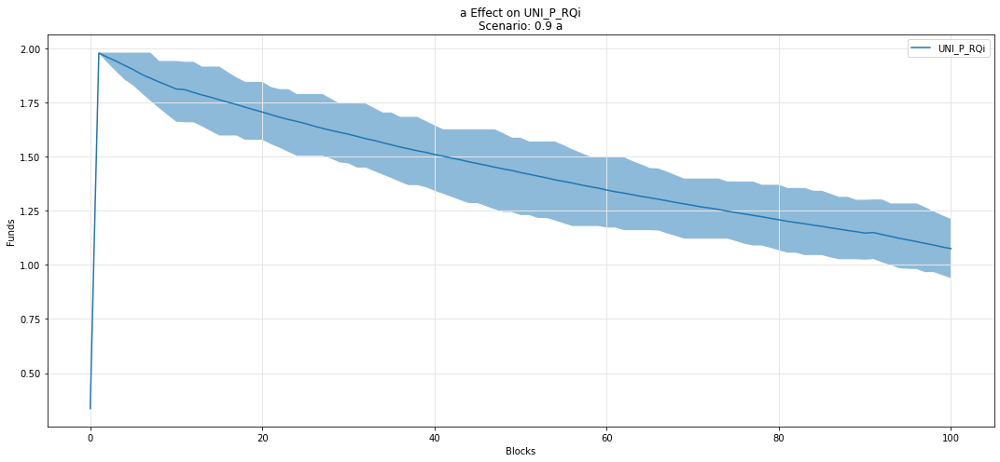

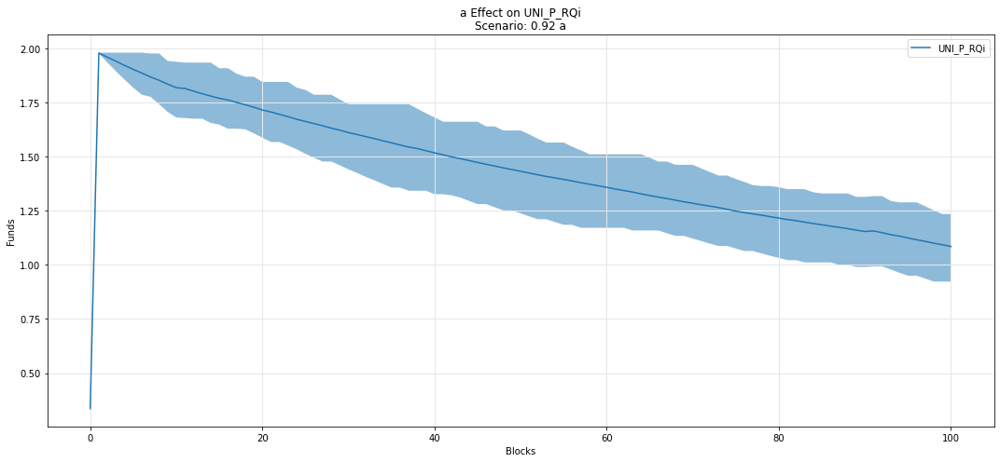

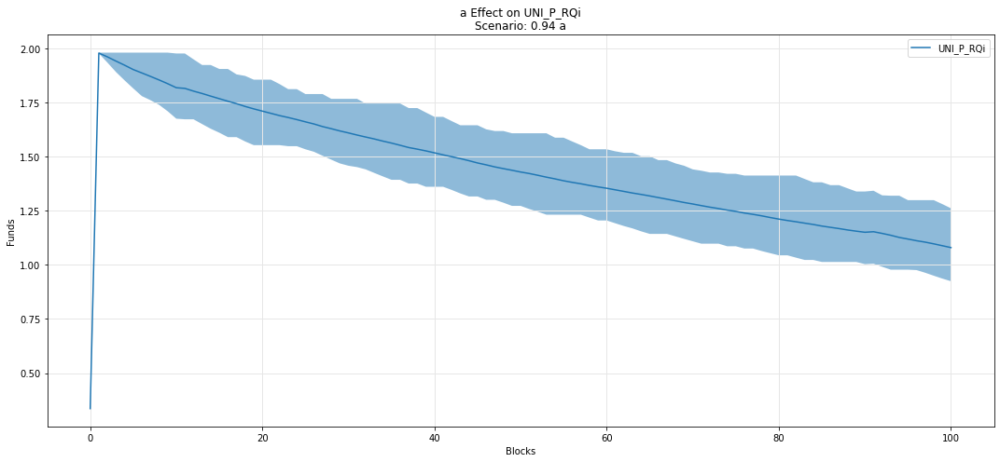

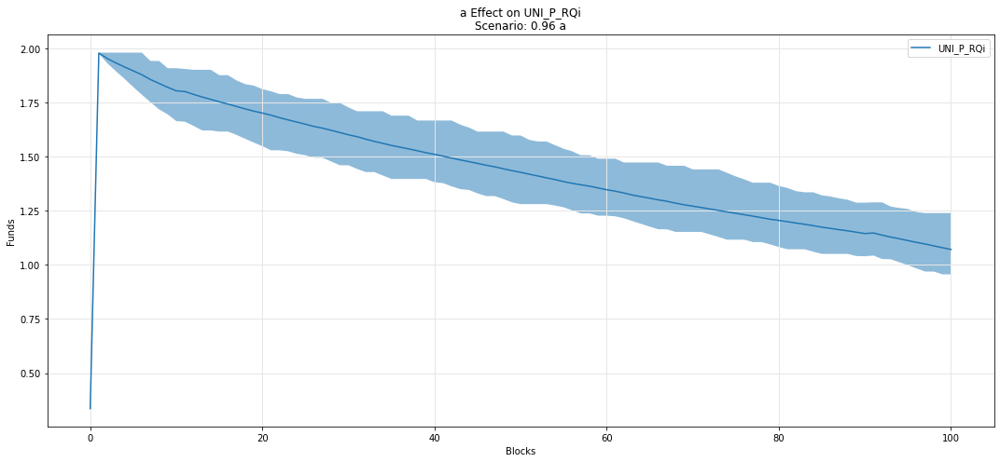

...

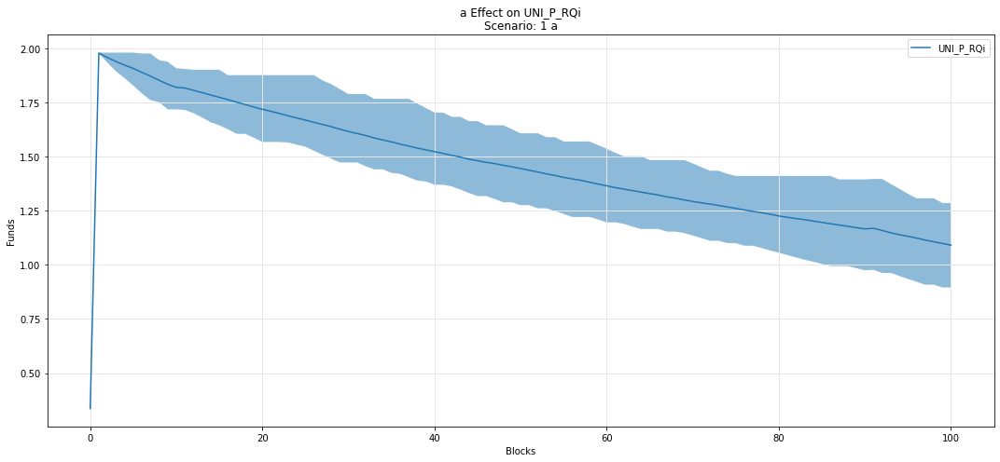

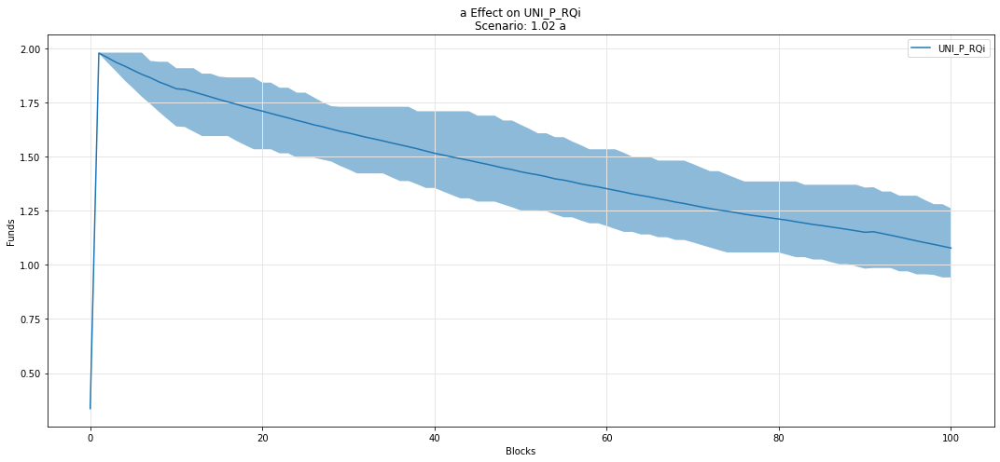

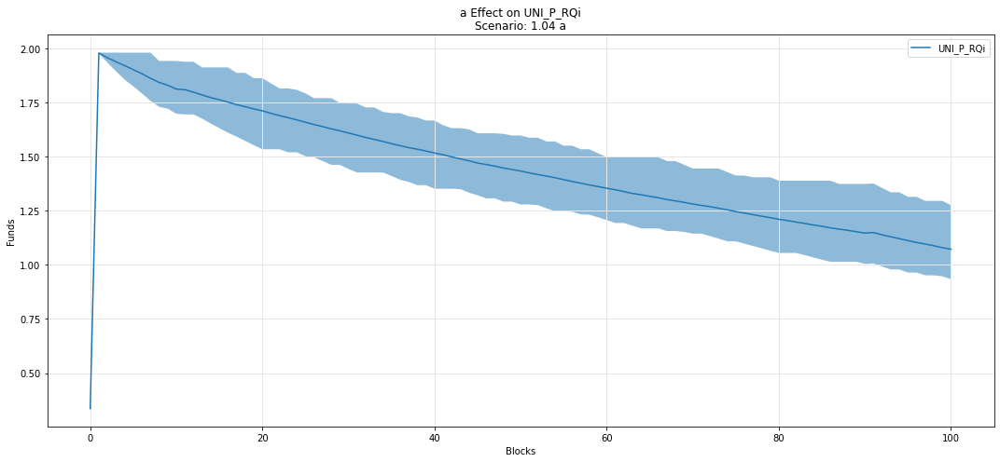

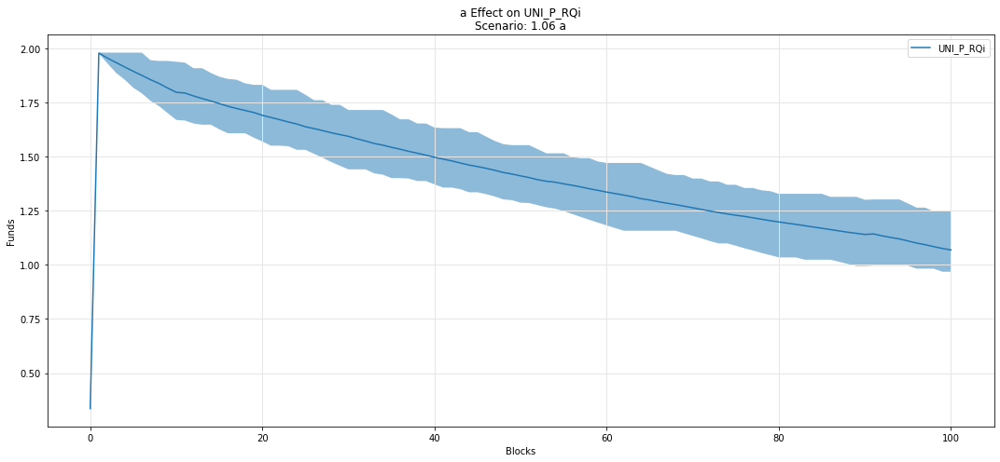

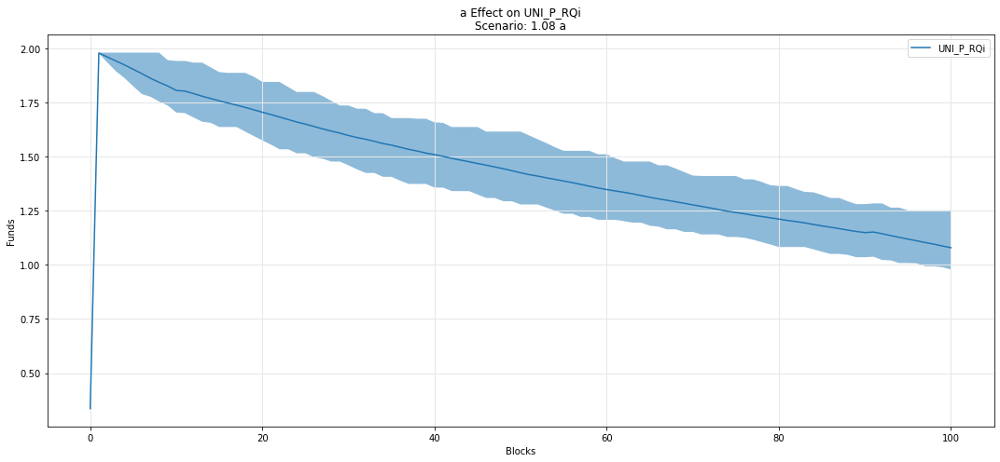

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

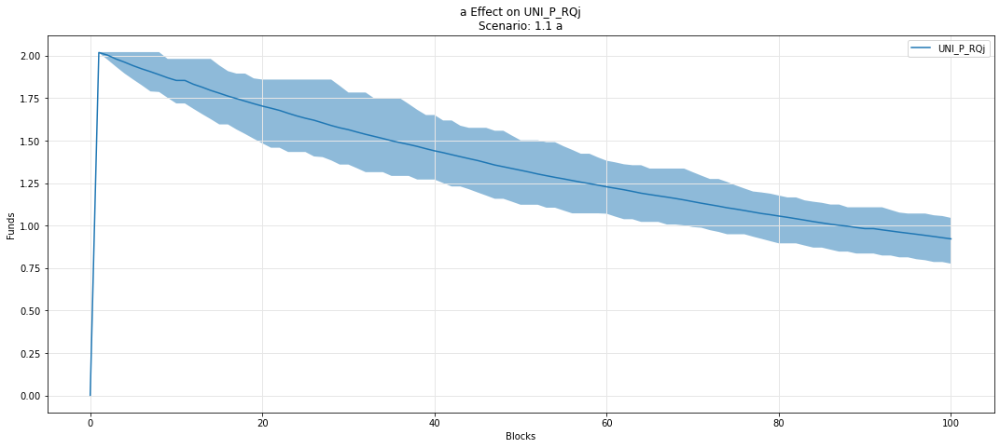

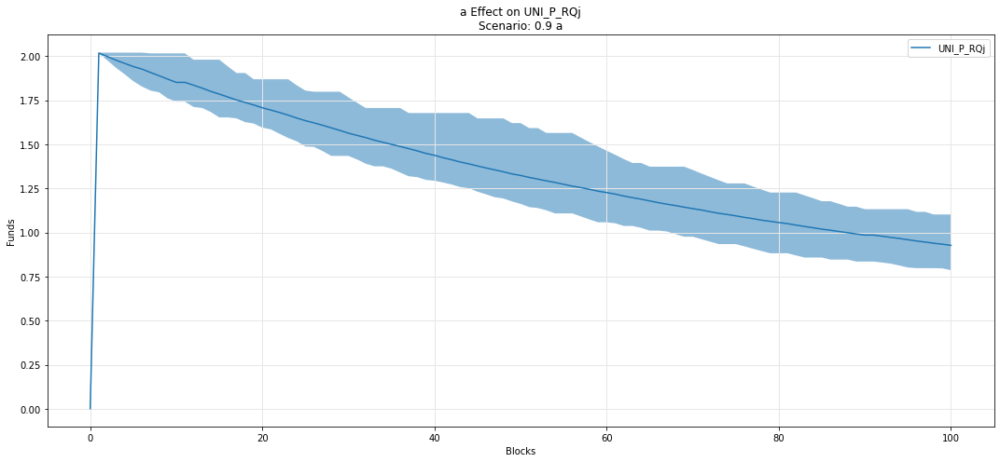

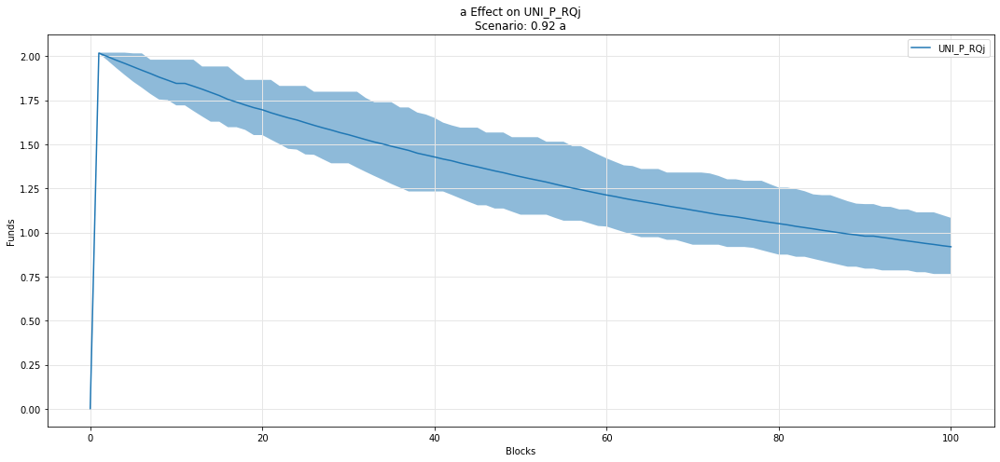

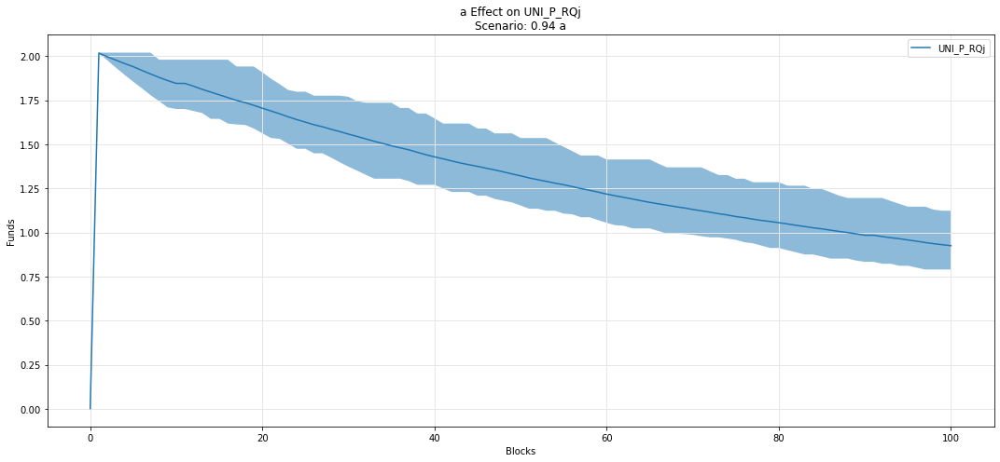

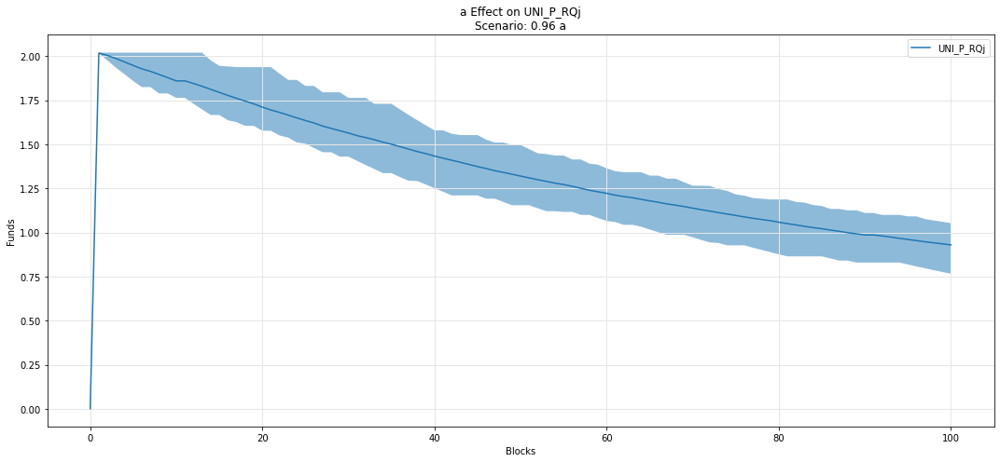

...

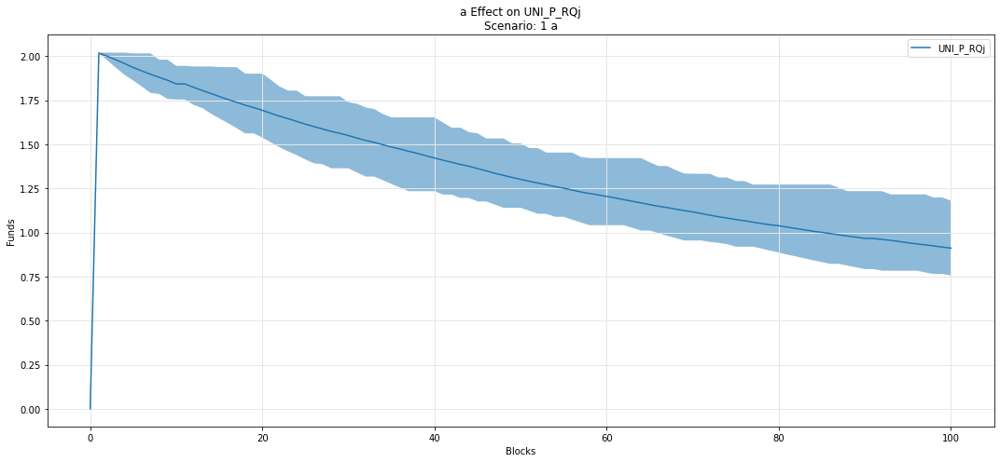

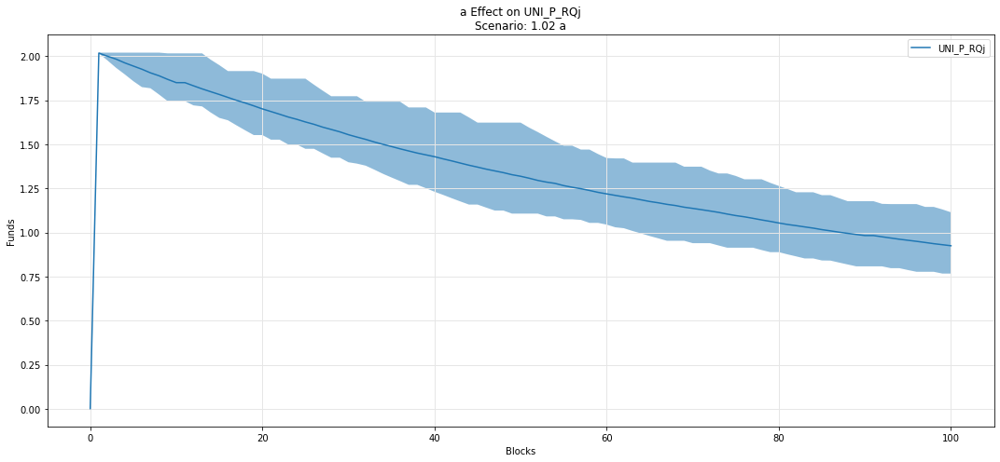

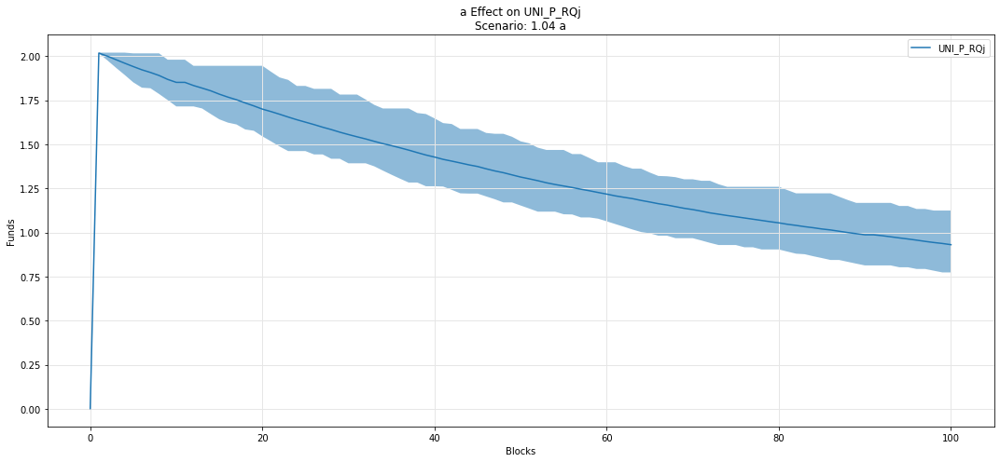

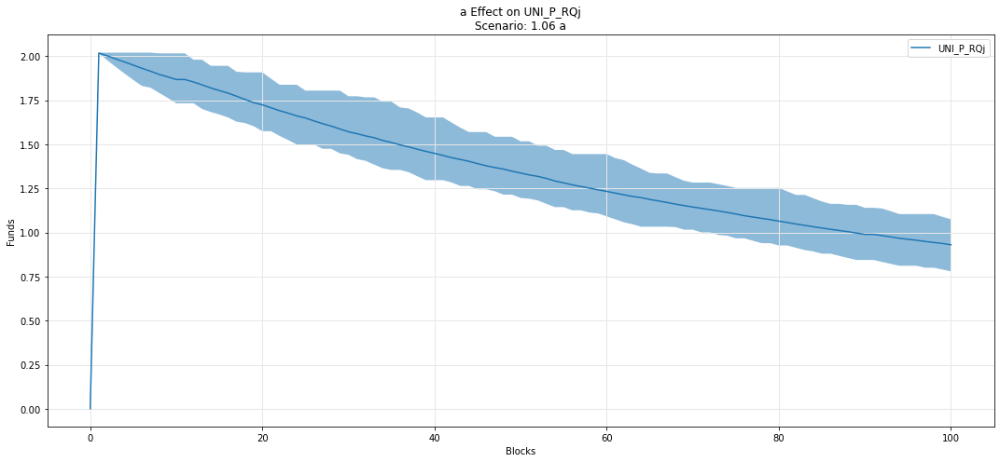

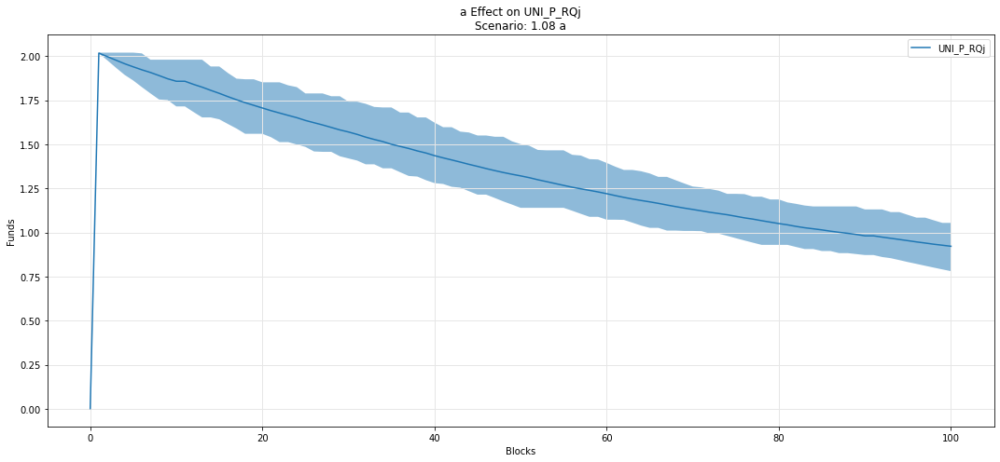

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

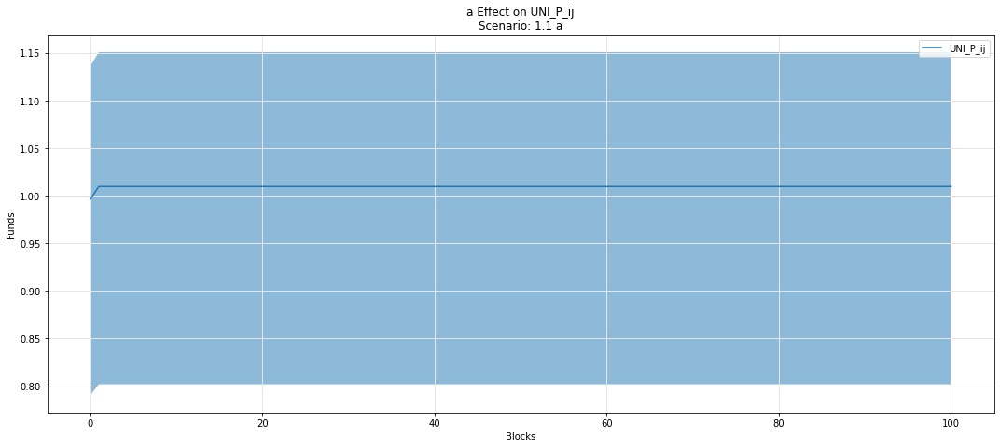

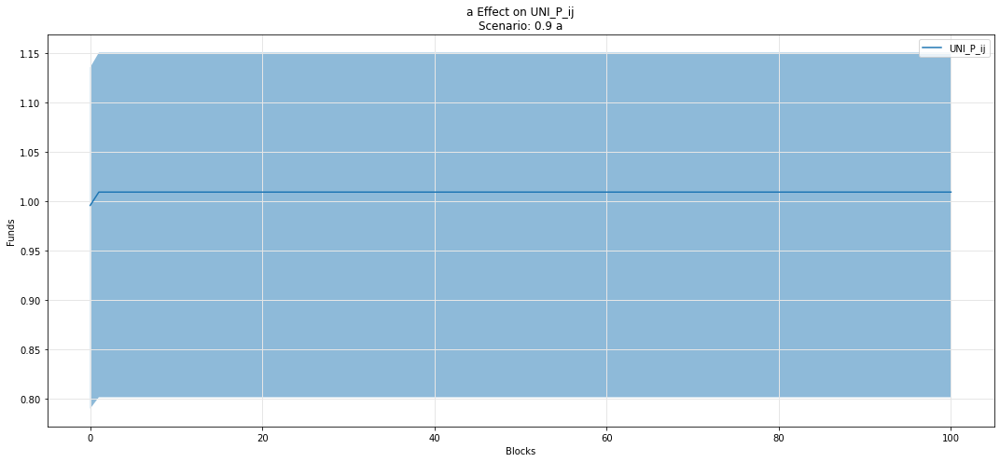

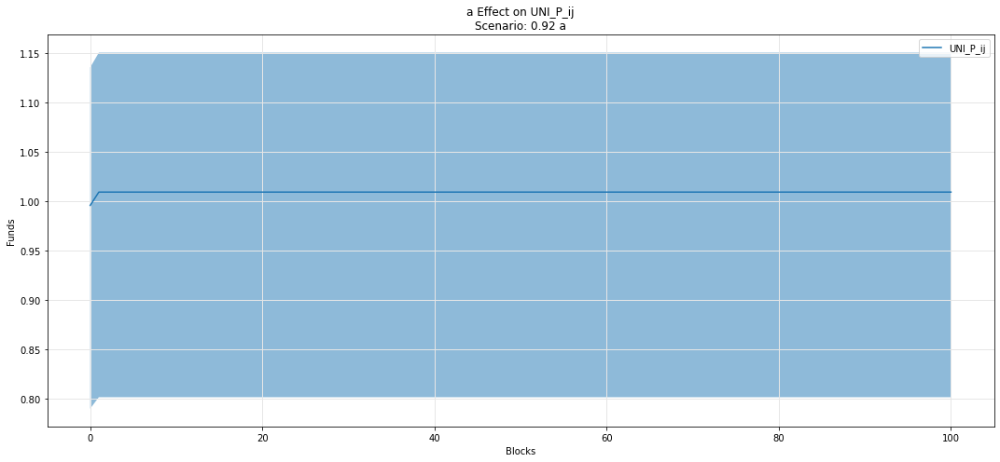

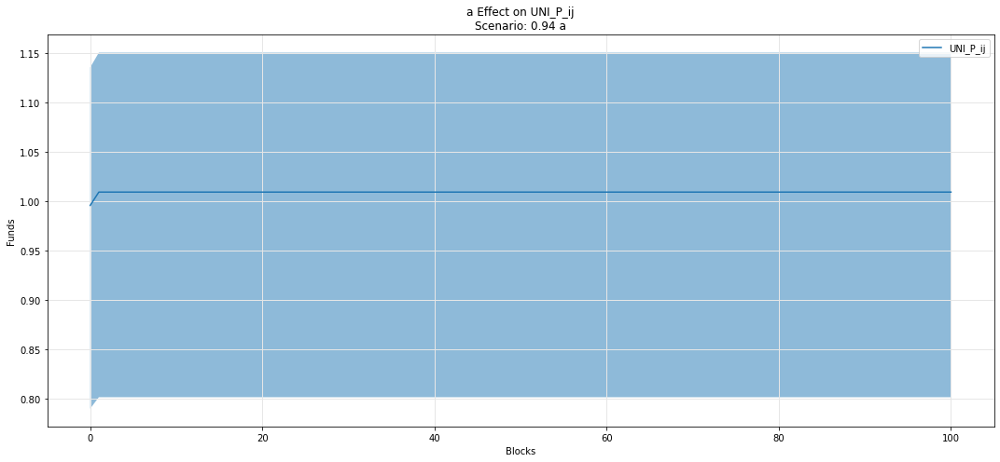

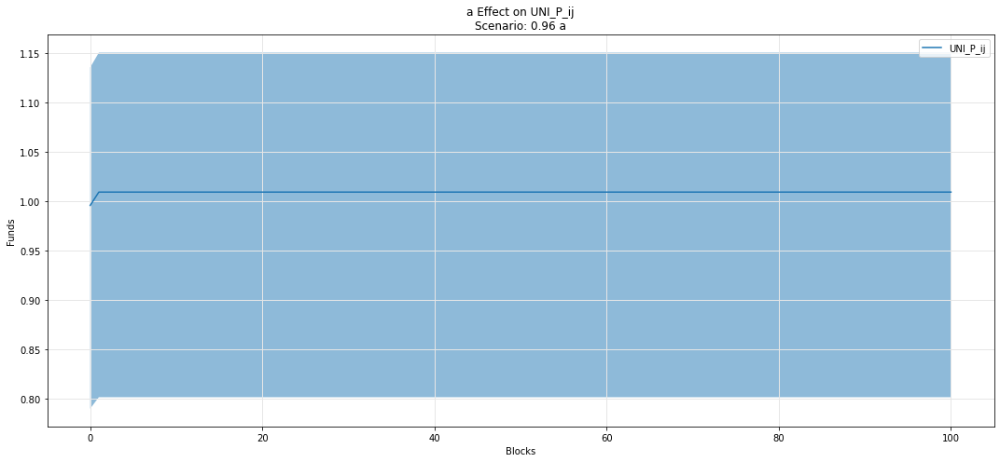

...

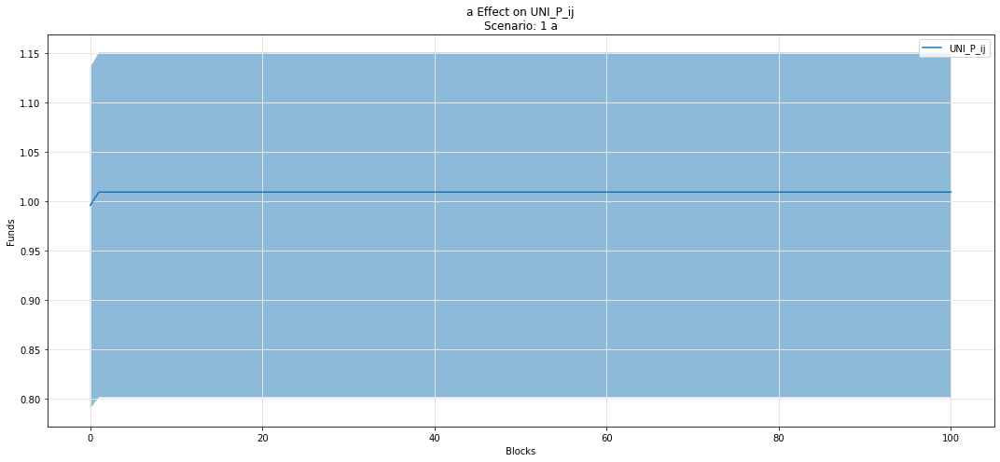

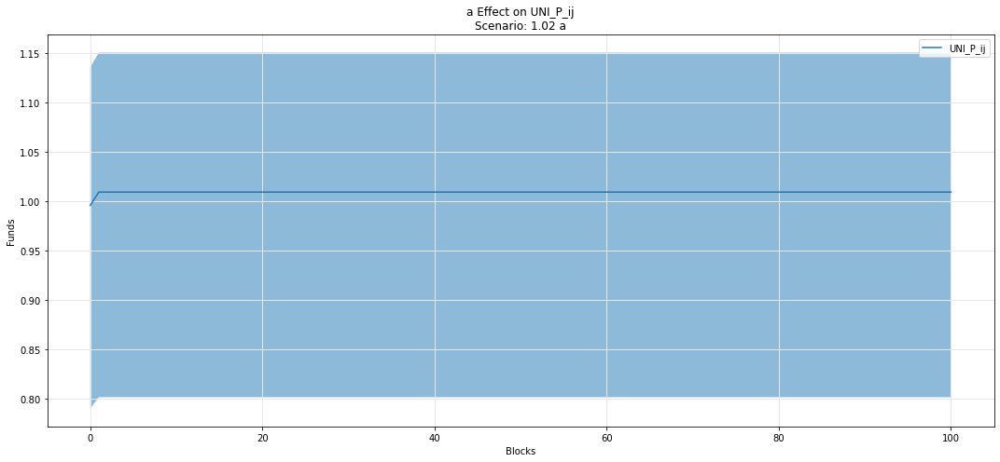

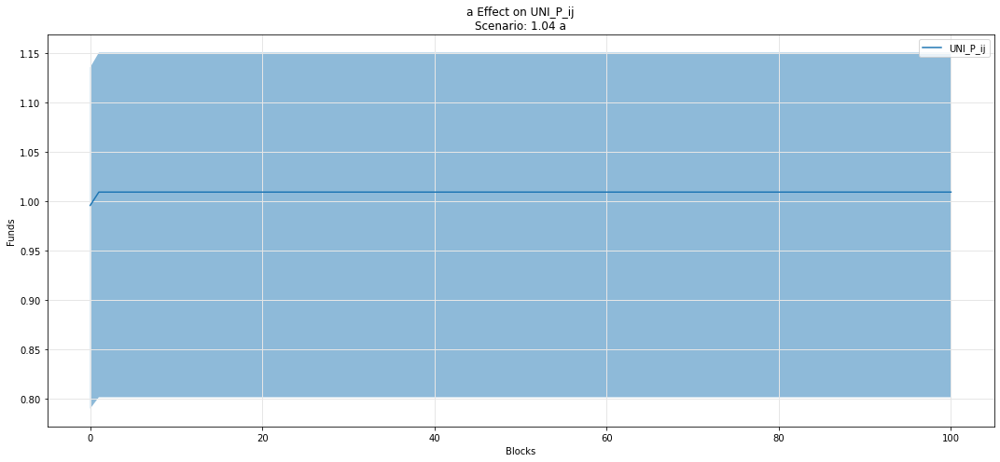

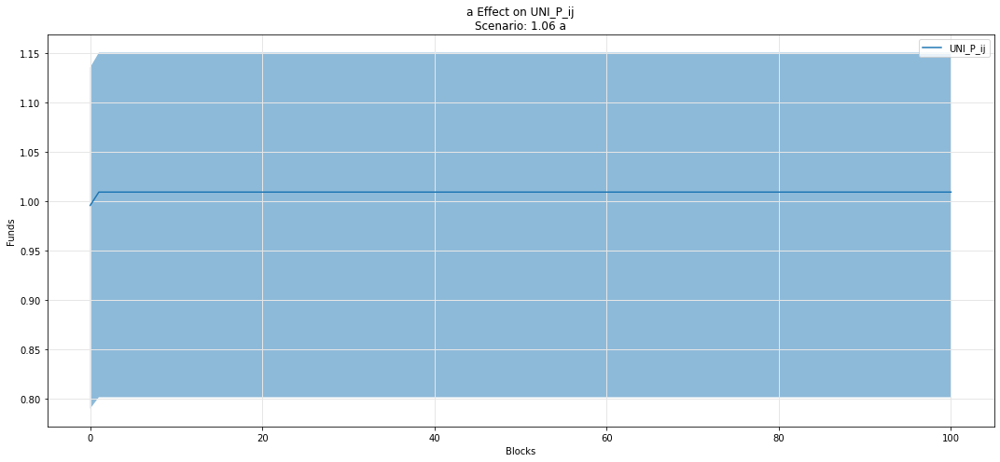

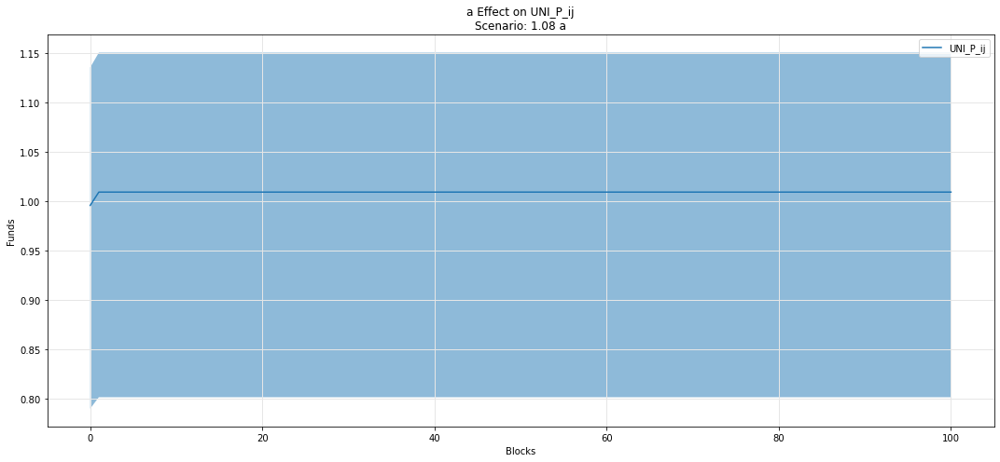

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

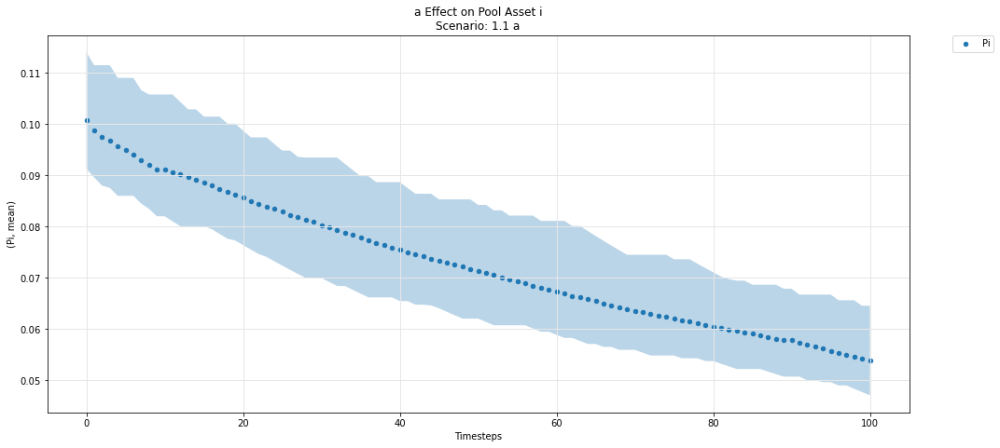

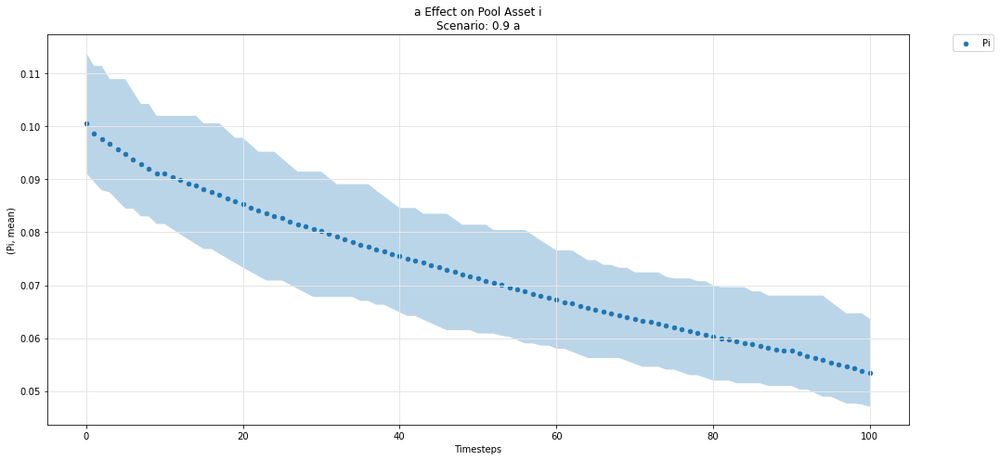

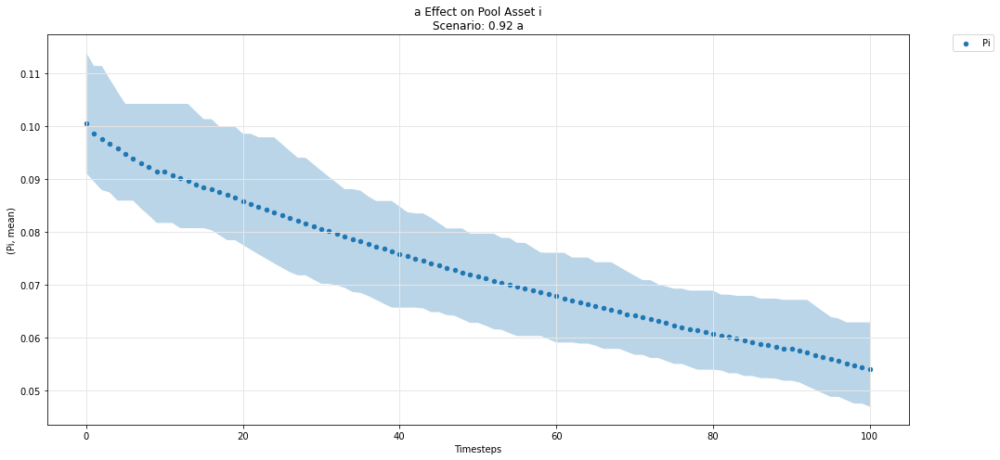

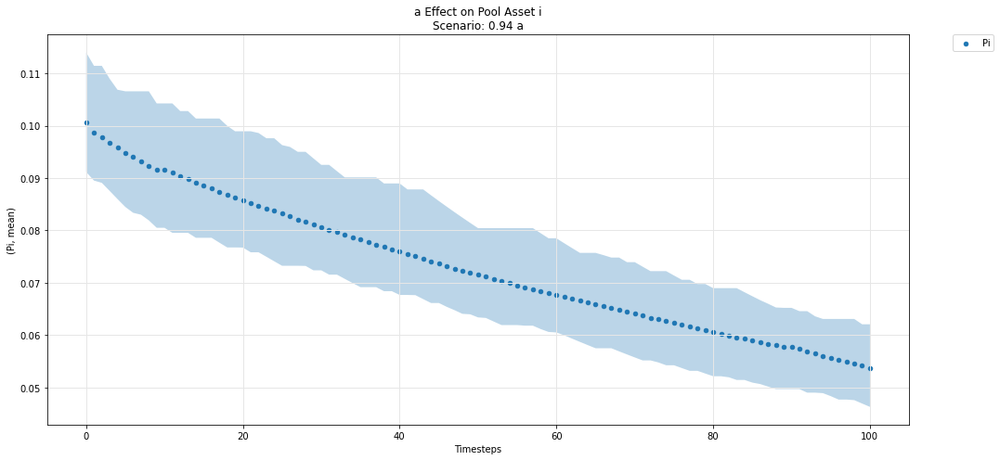

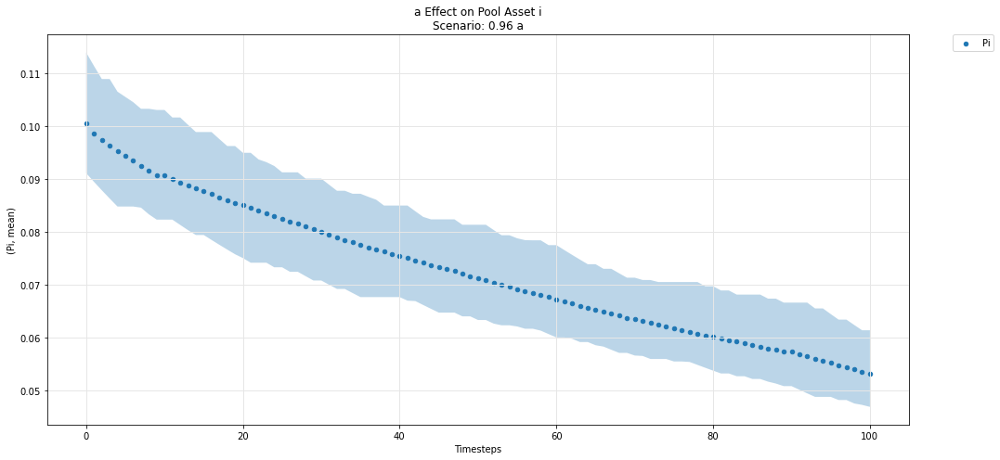

...

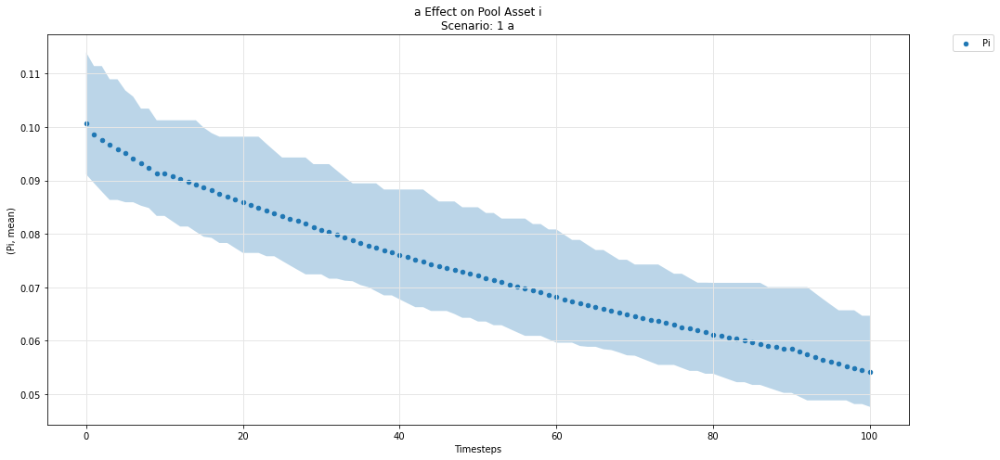

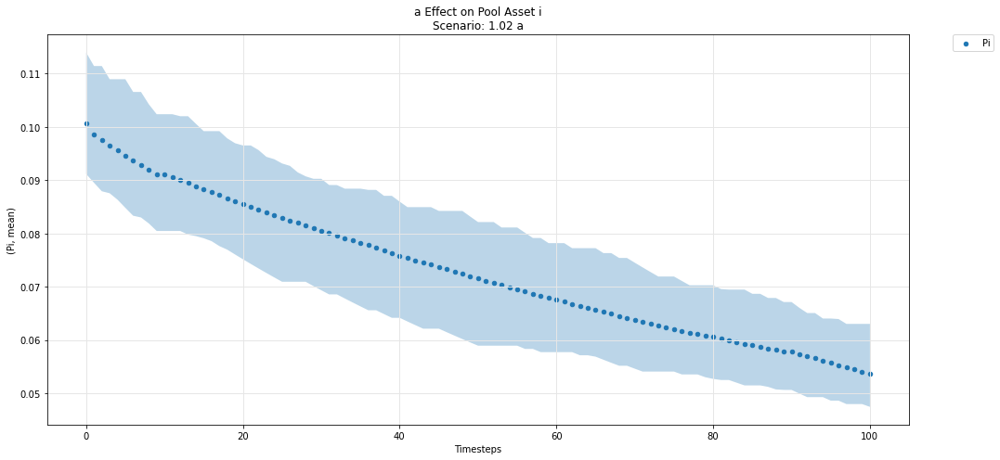

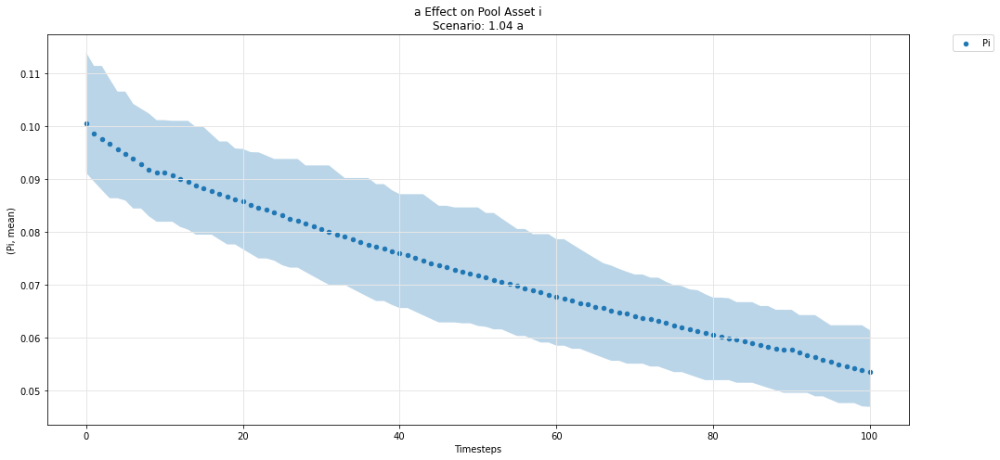

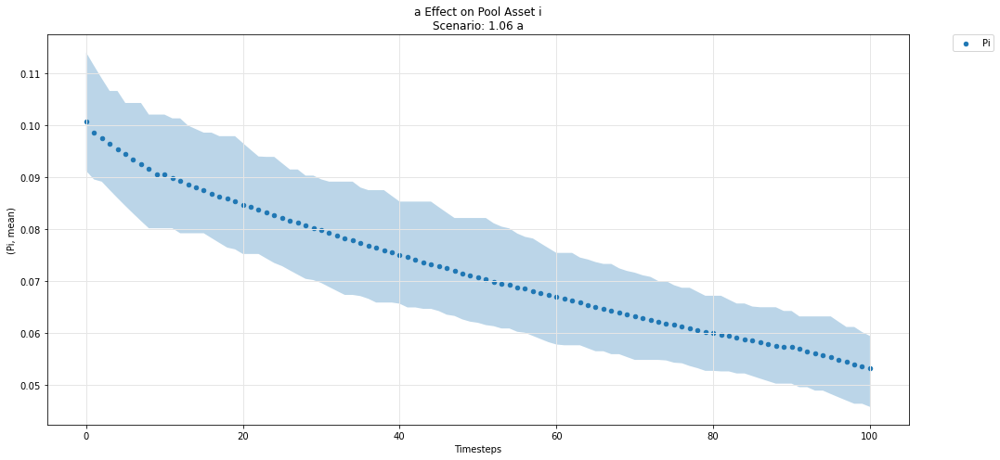

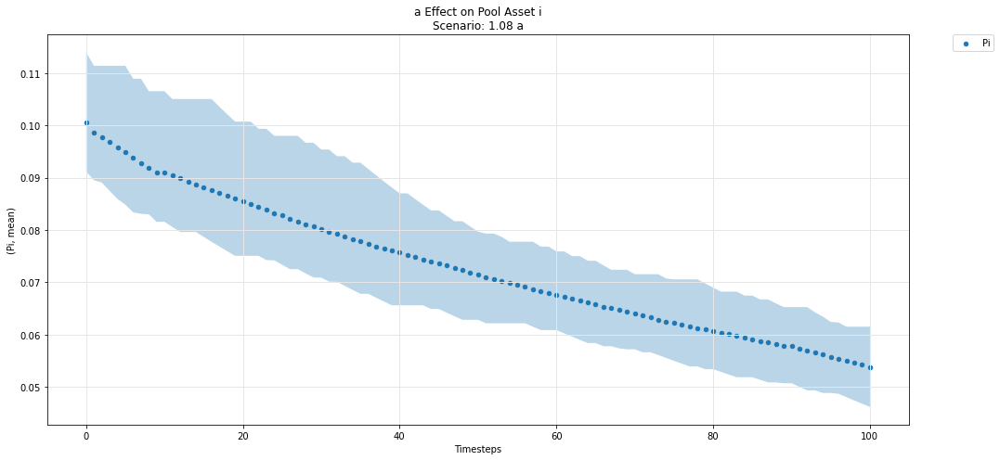

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

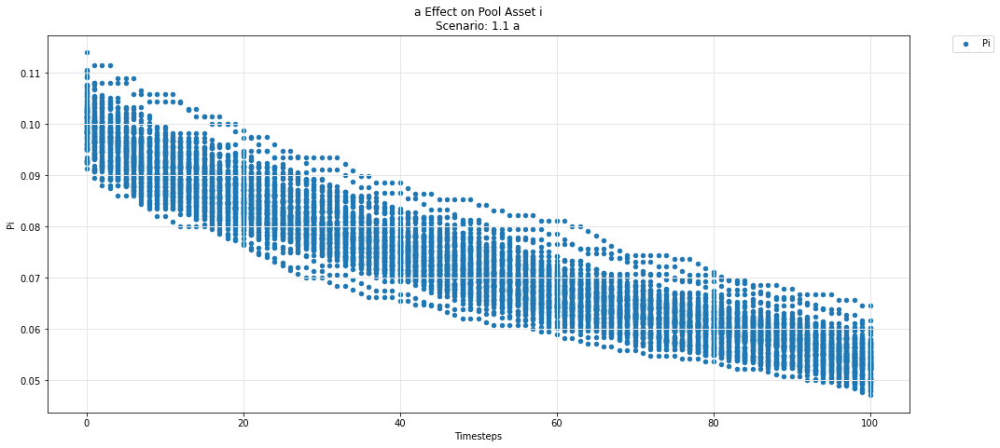

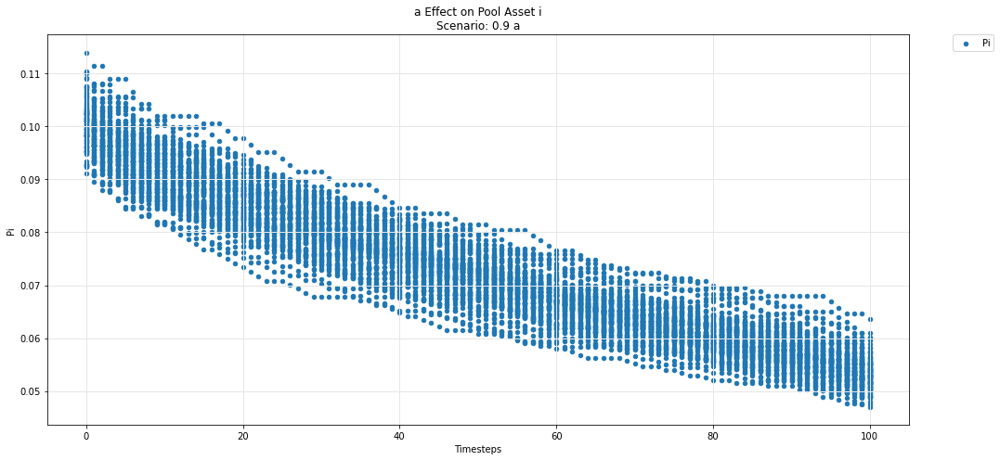

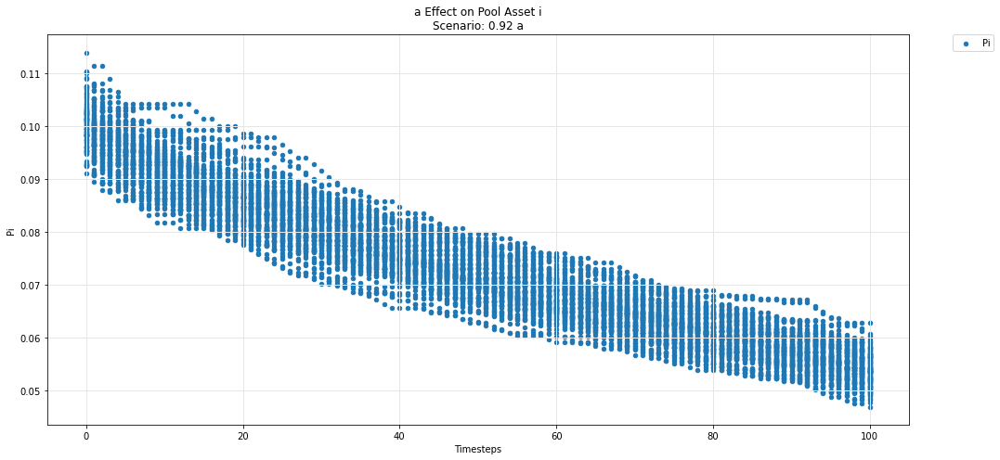

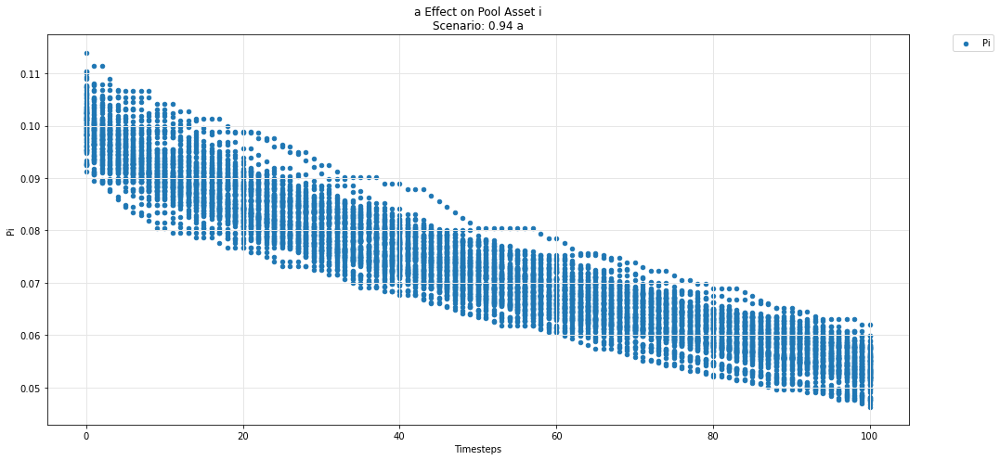

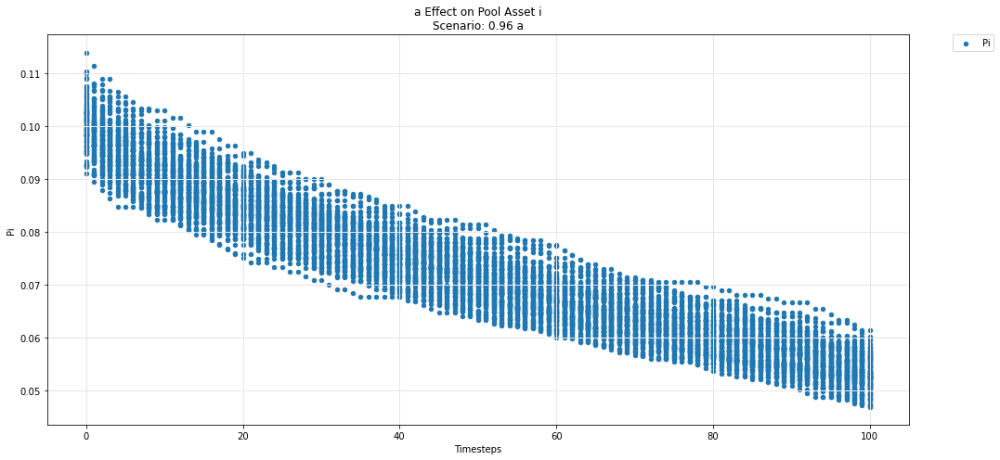

...

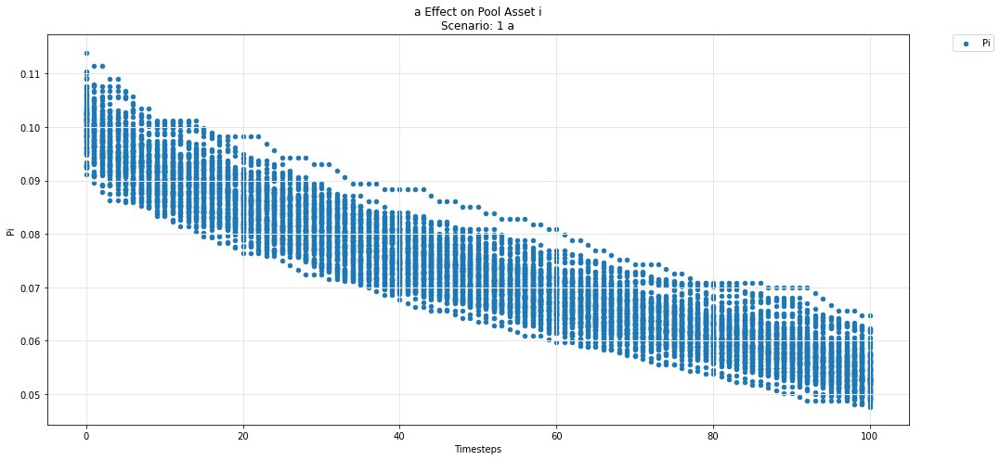

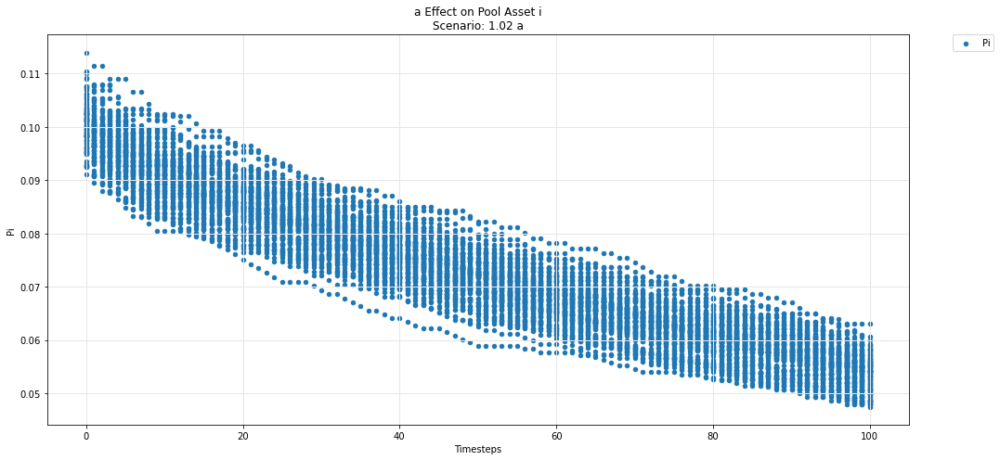

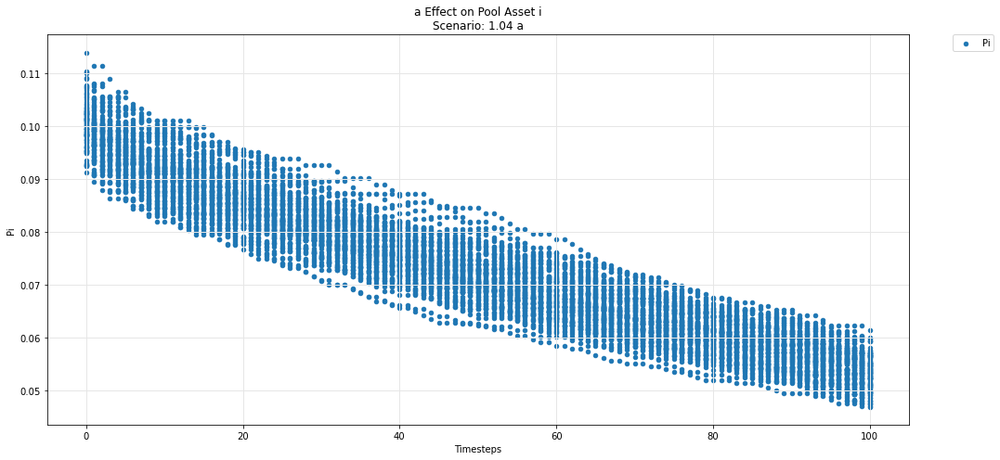

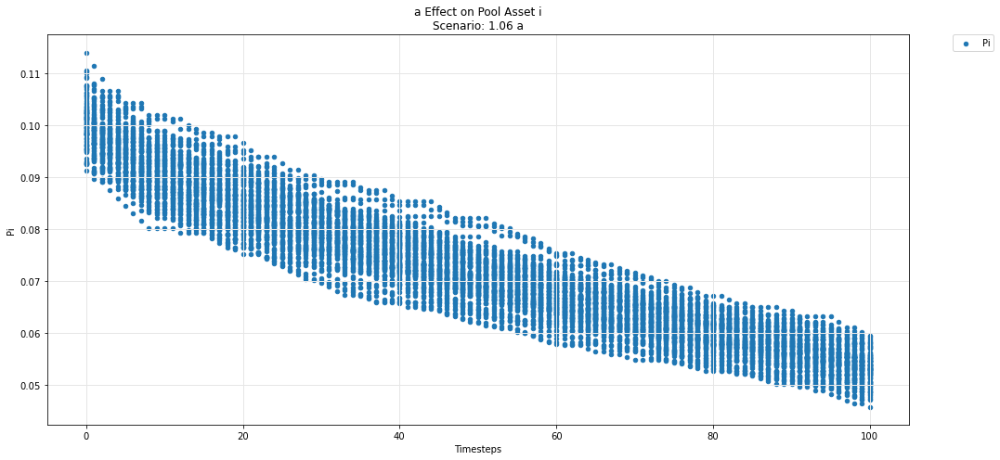

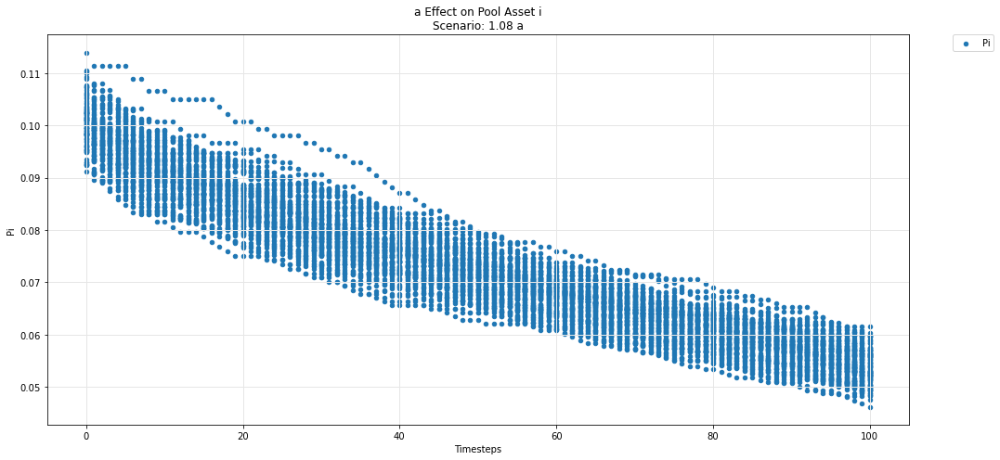

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

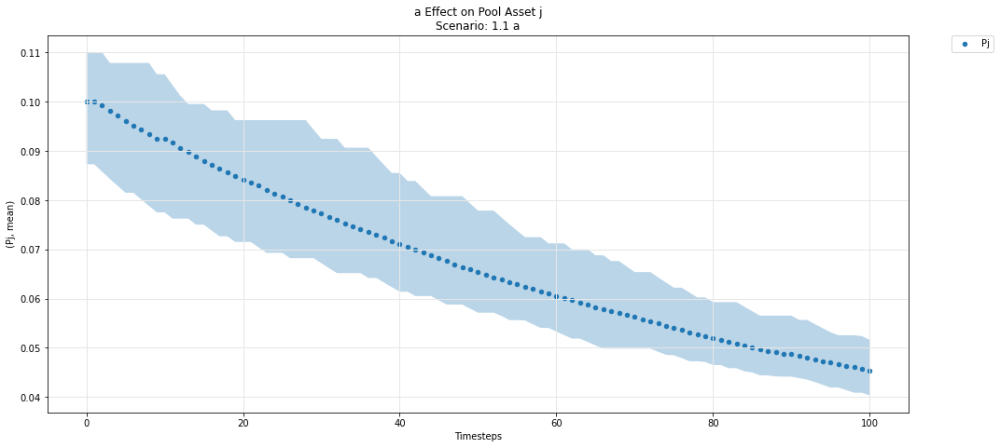

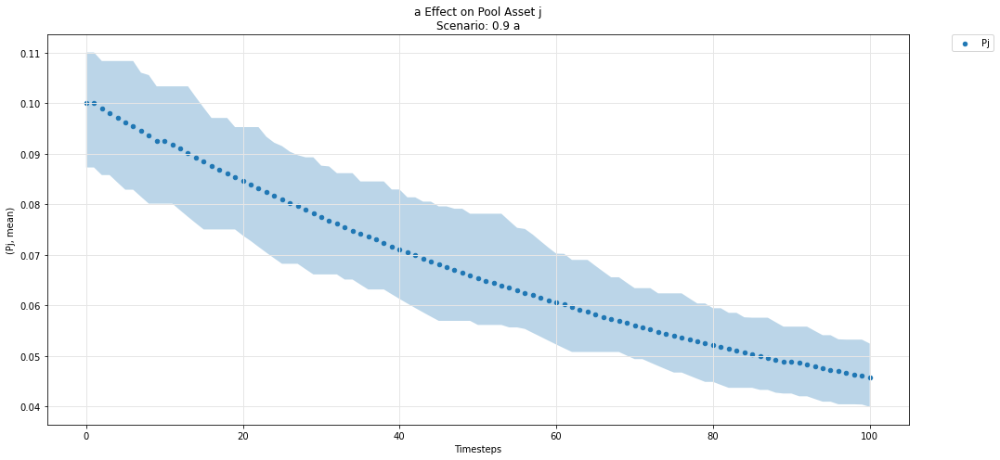

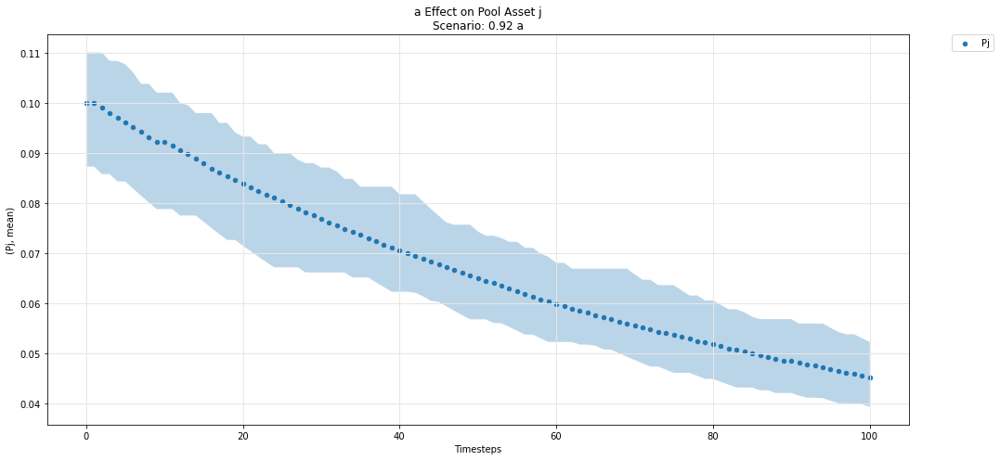

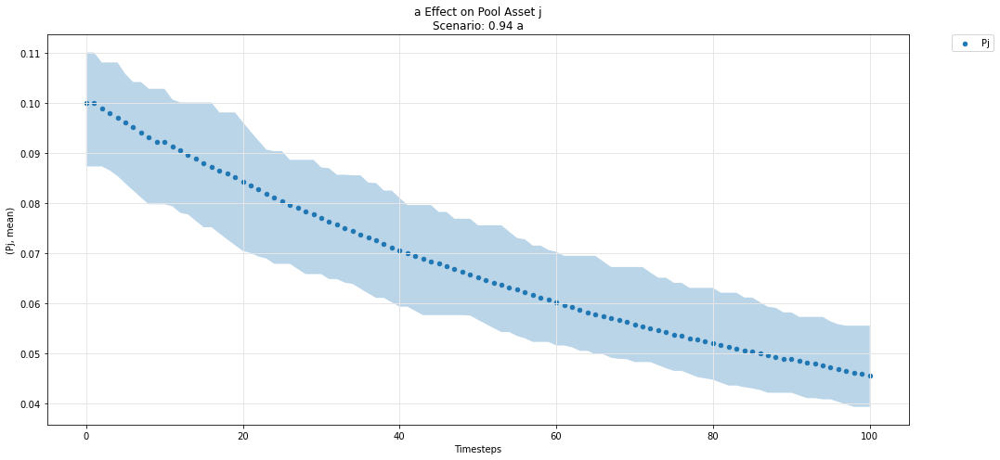

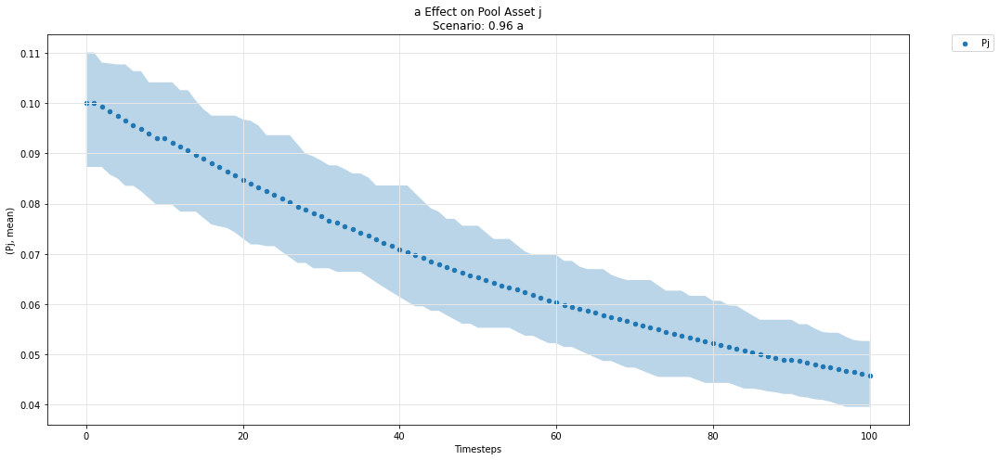

...

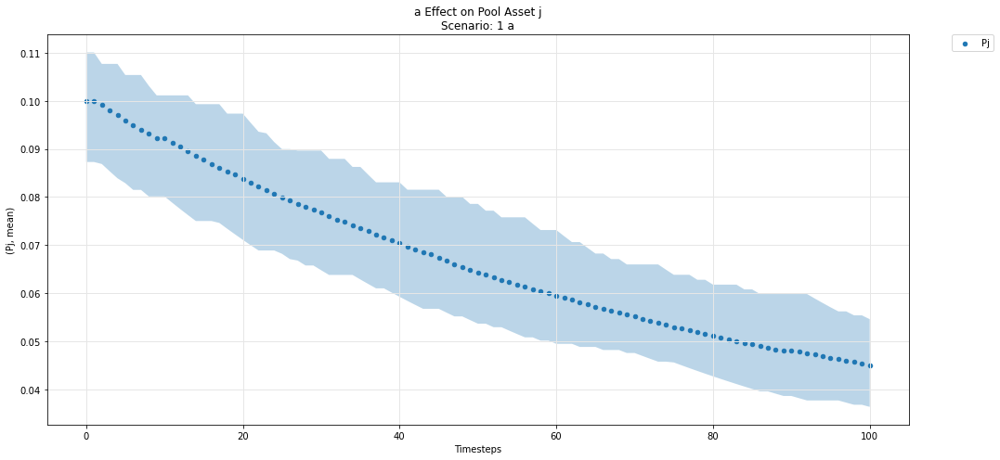

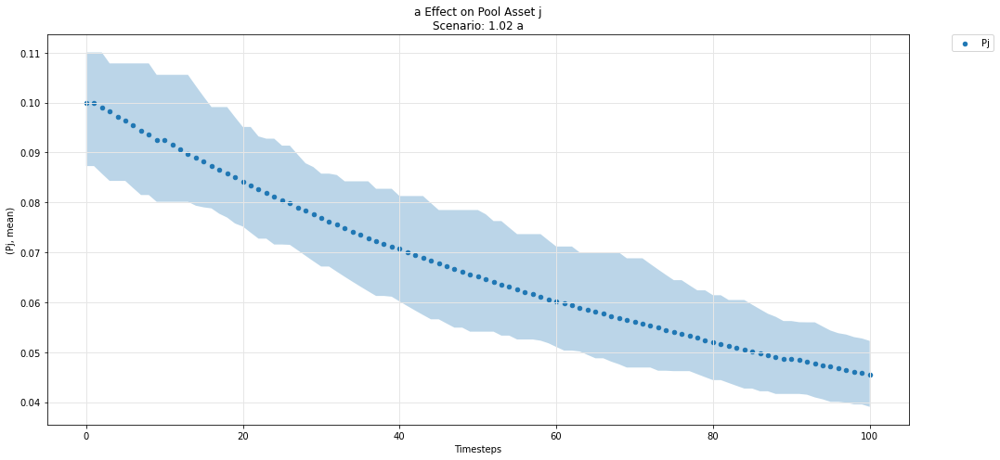

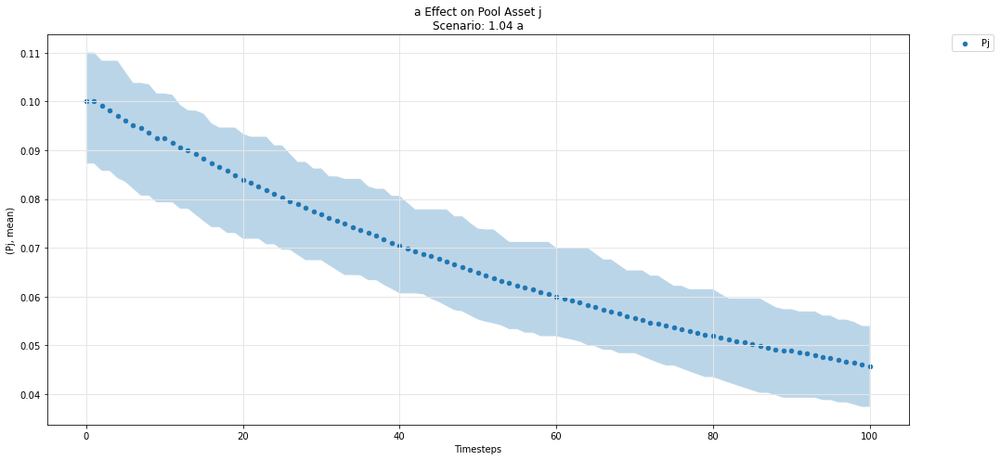

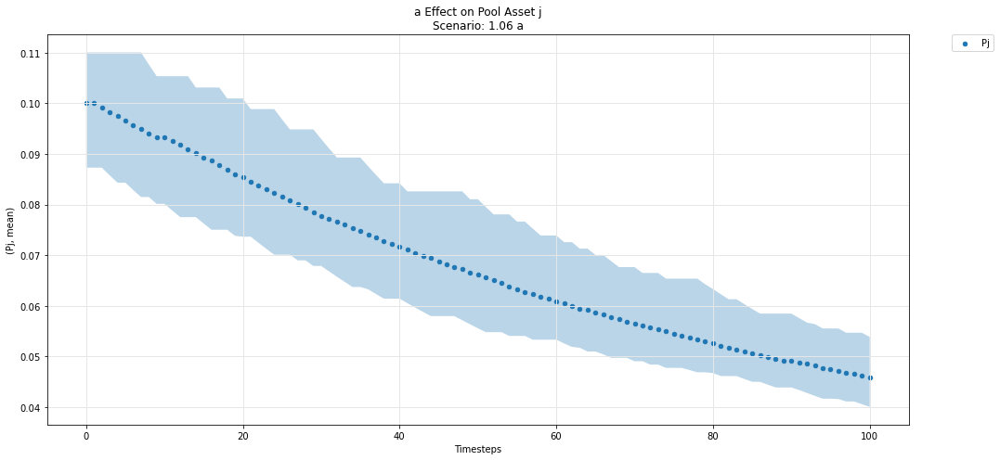

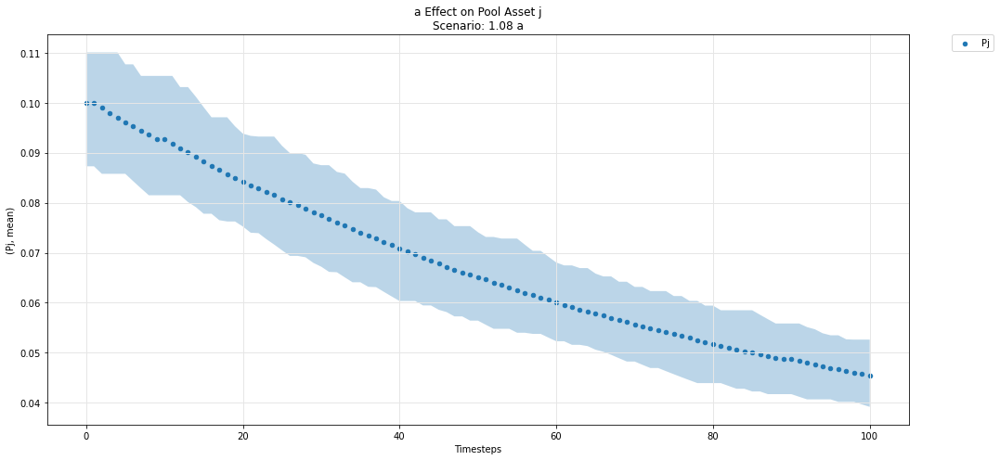

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

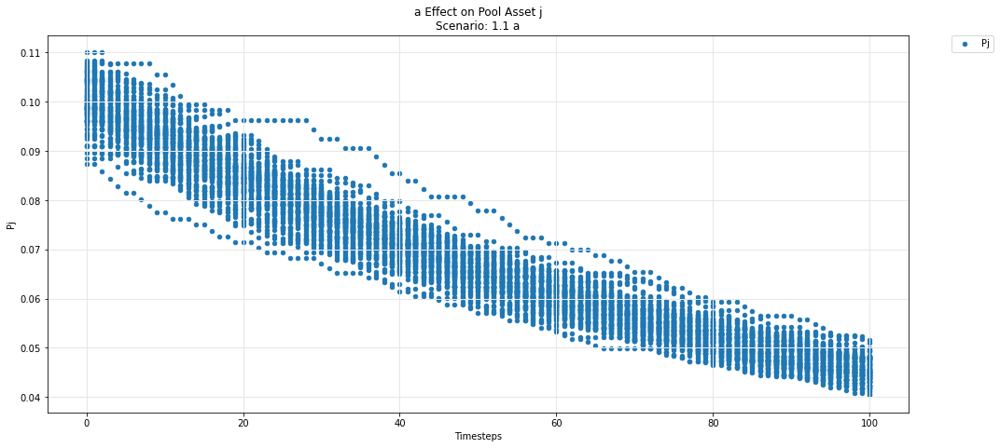

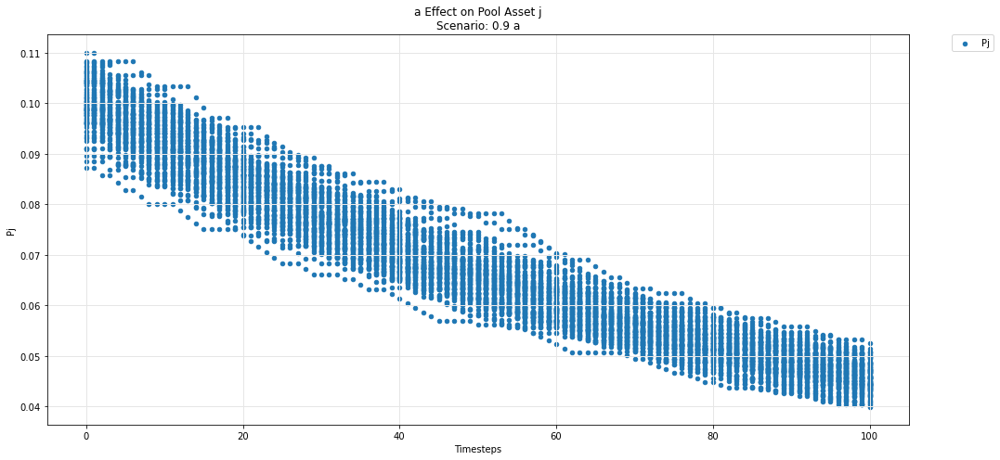

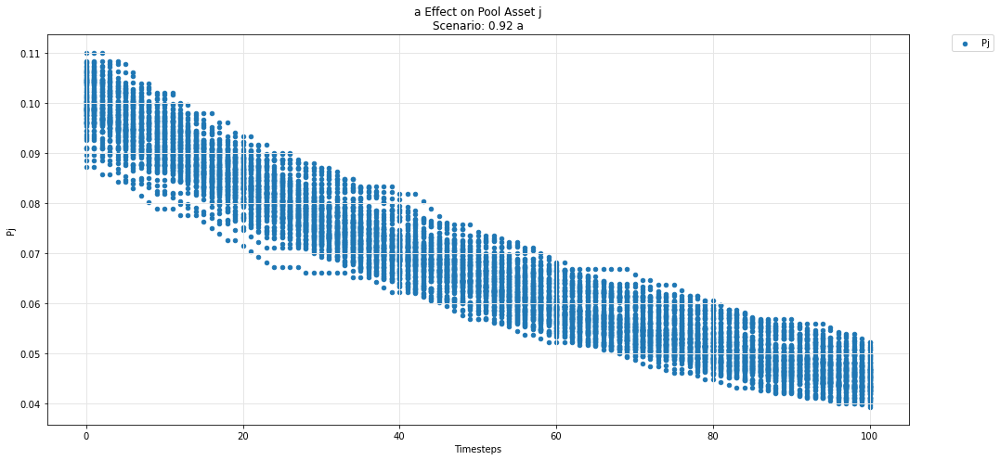

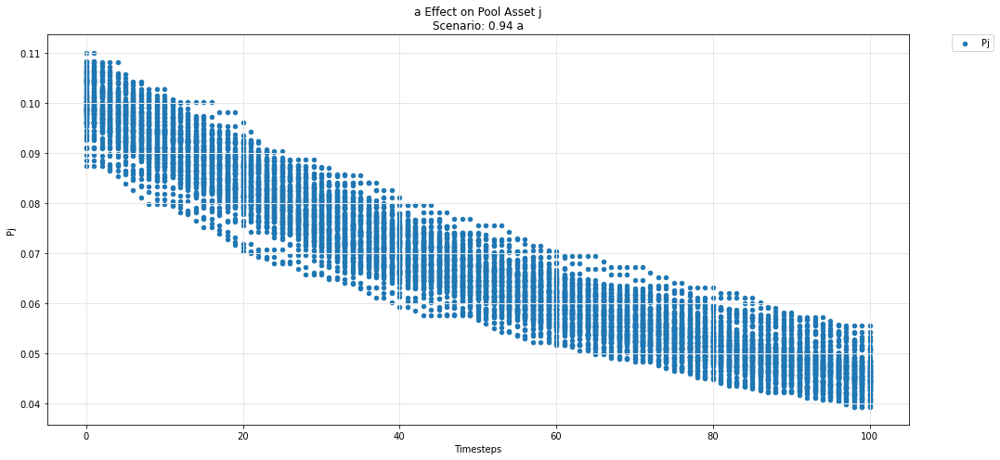

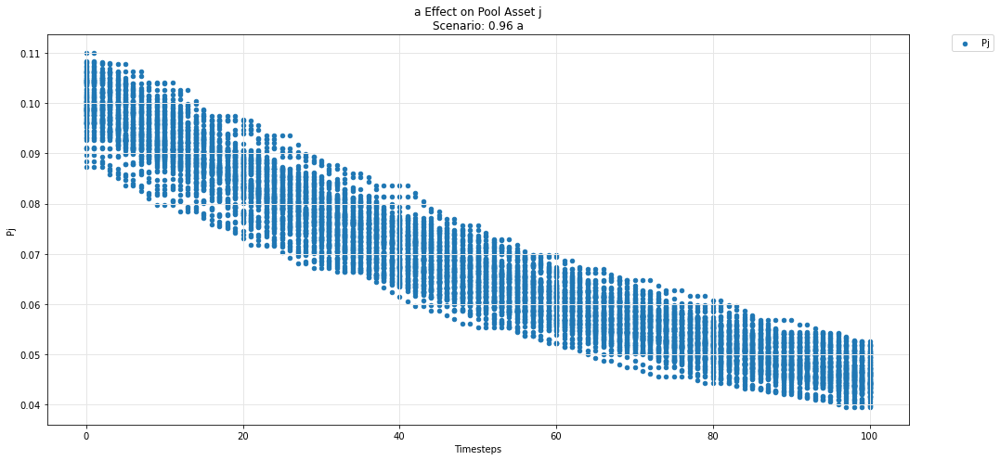

...

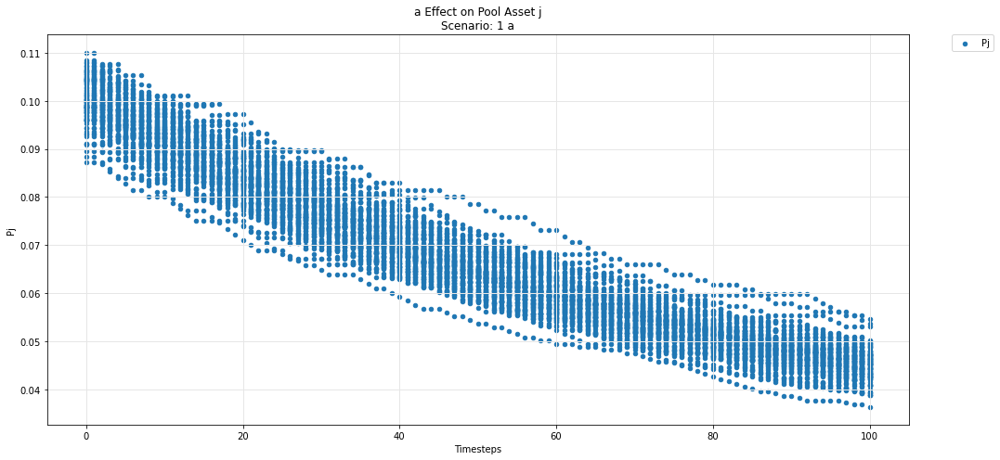

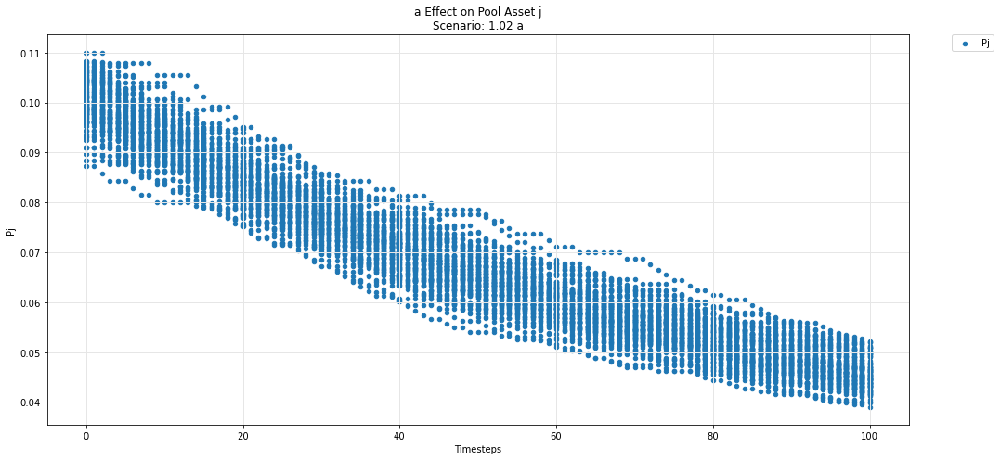

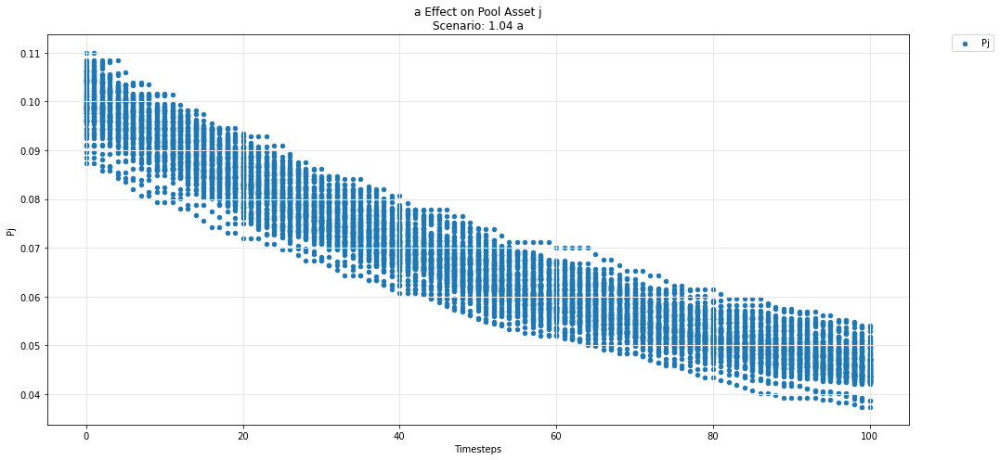

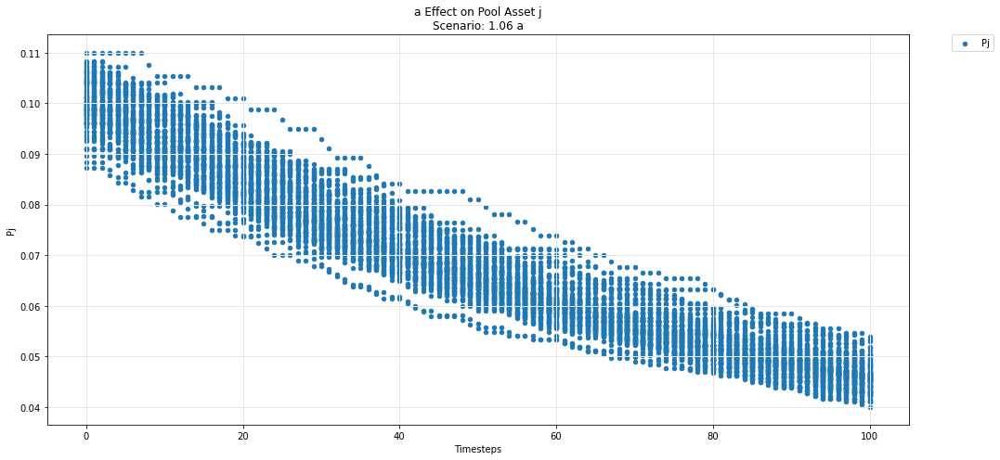

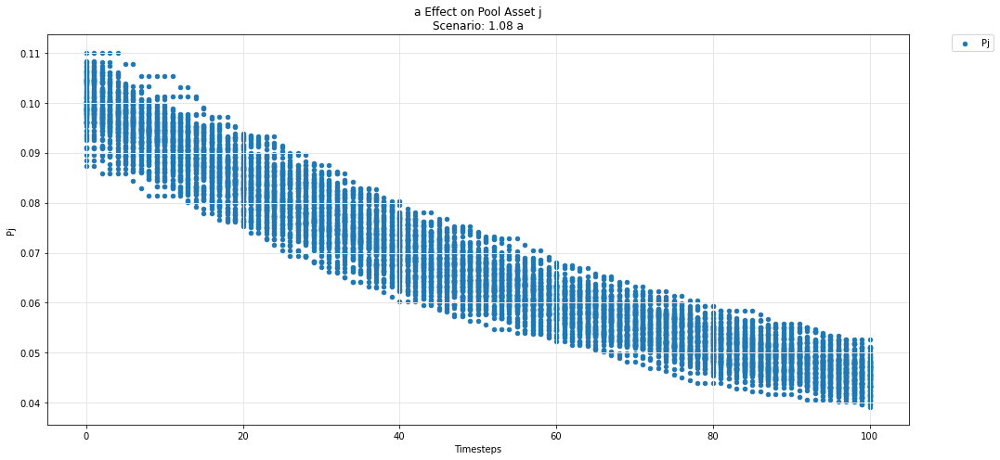

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

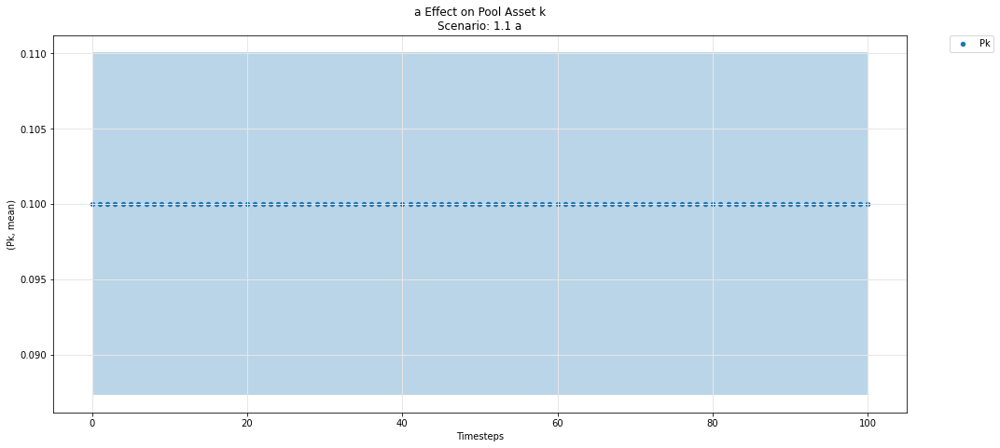

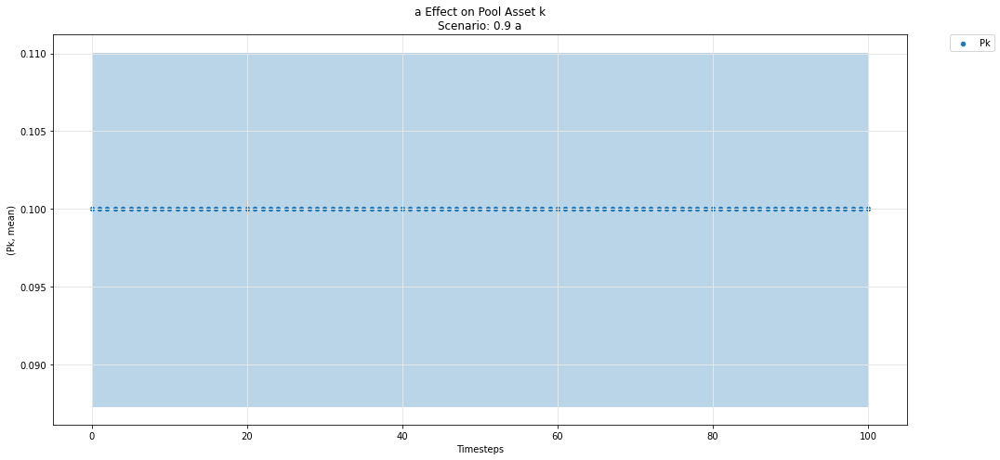

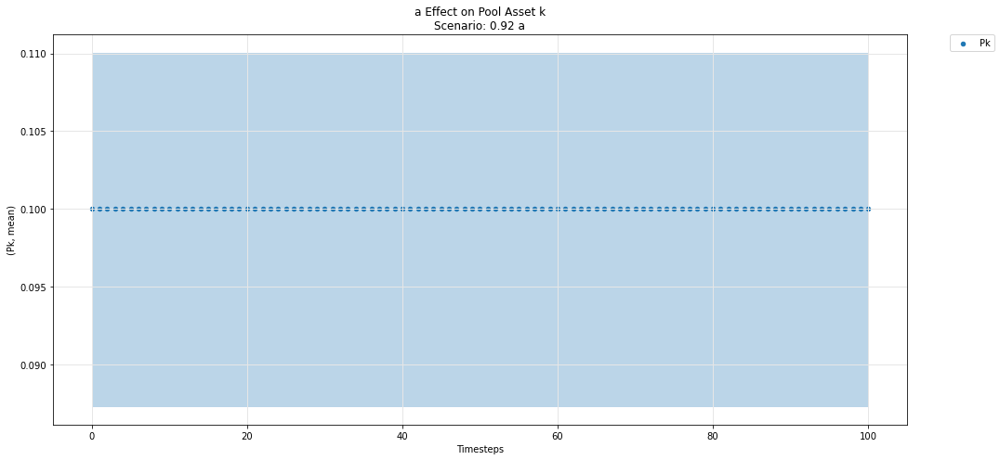

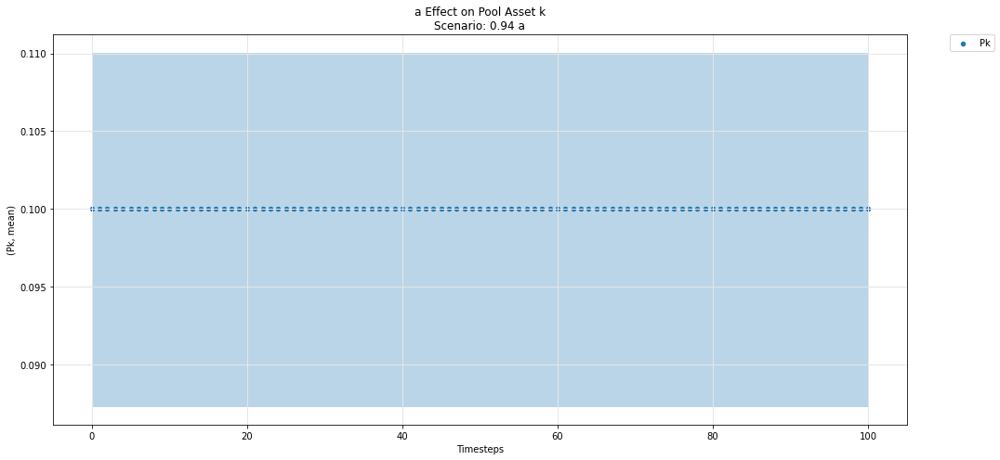

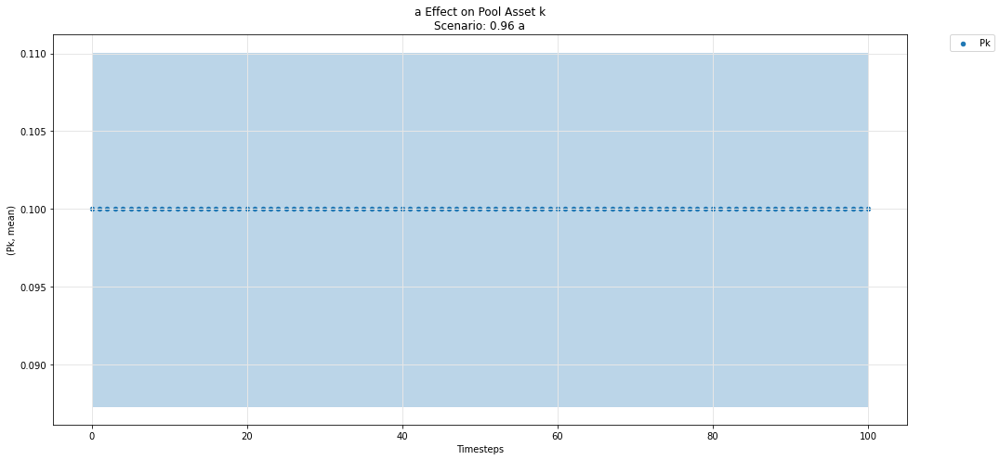

...

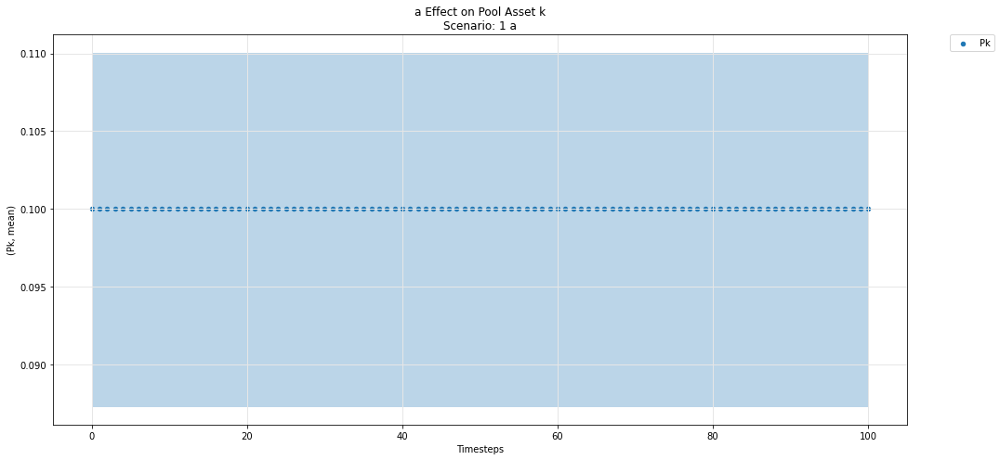

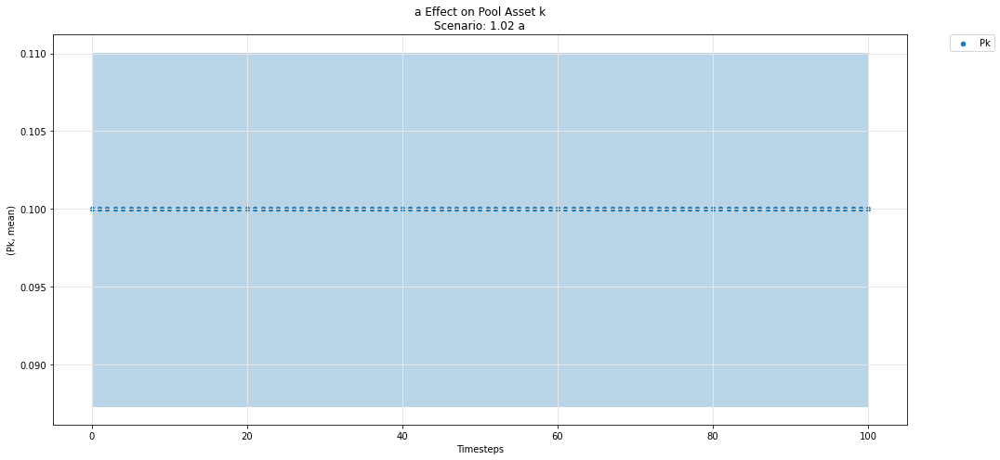

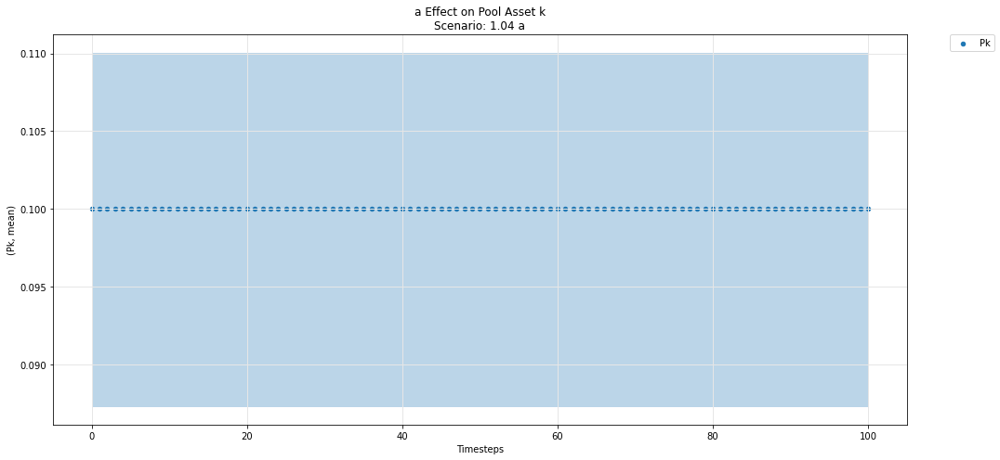

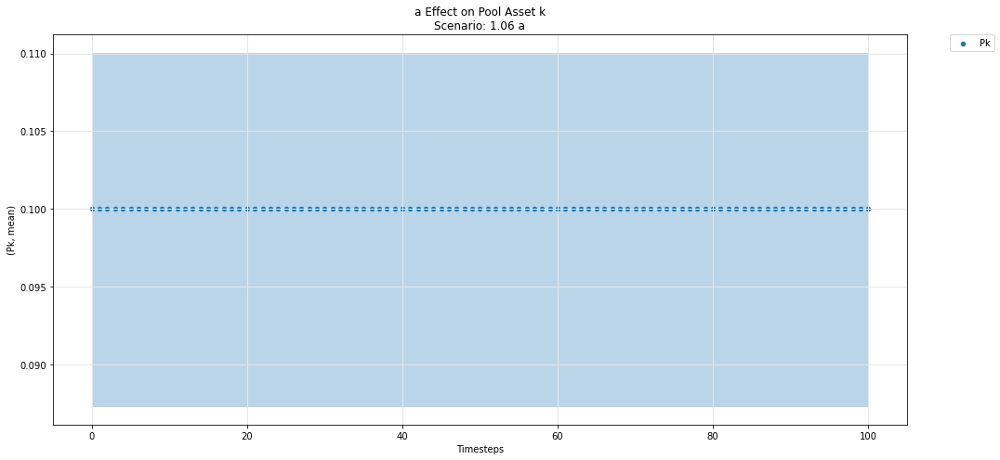

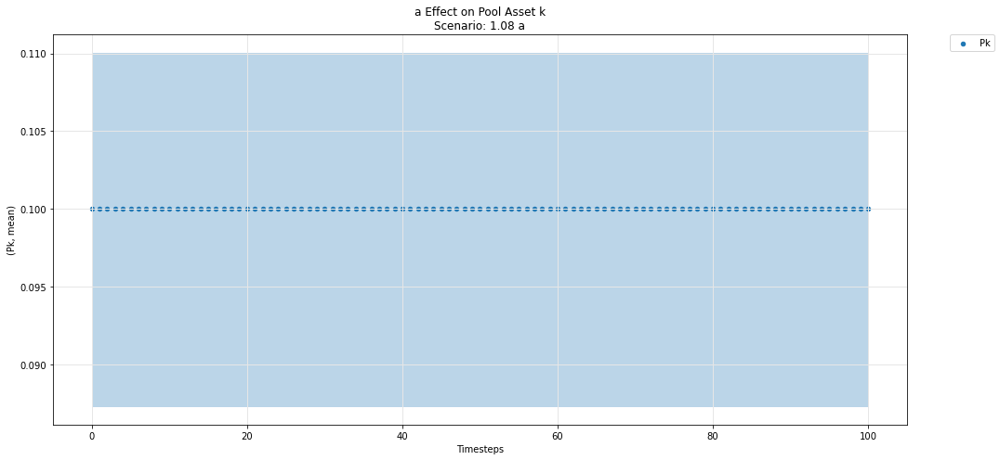

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

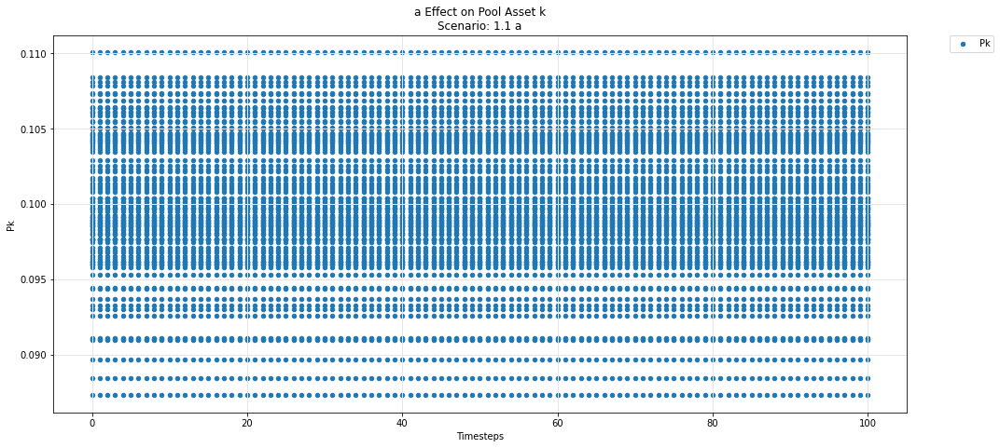

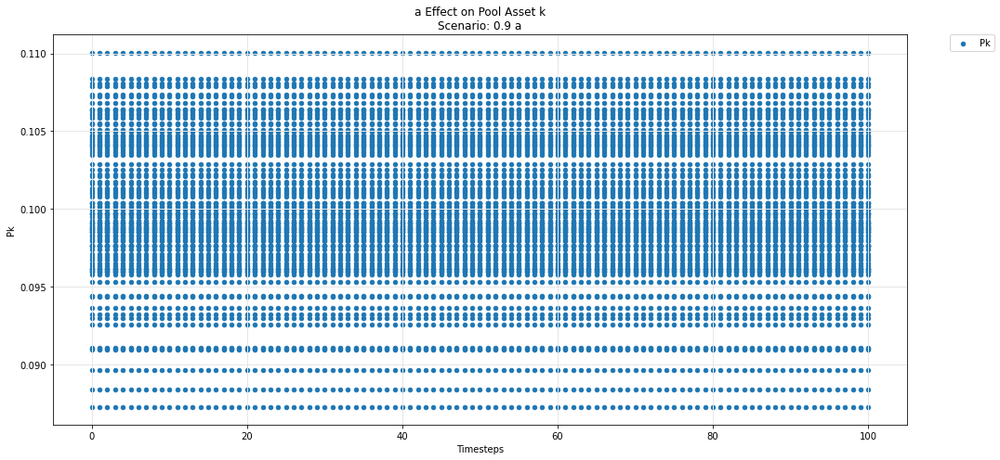

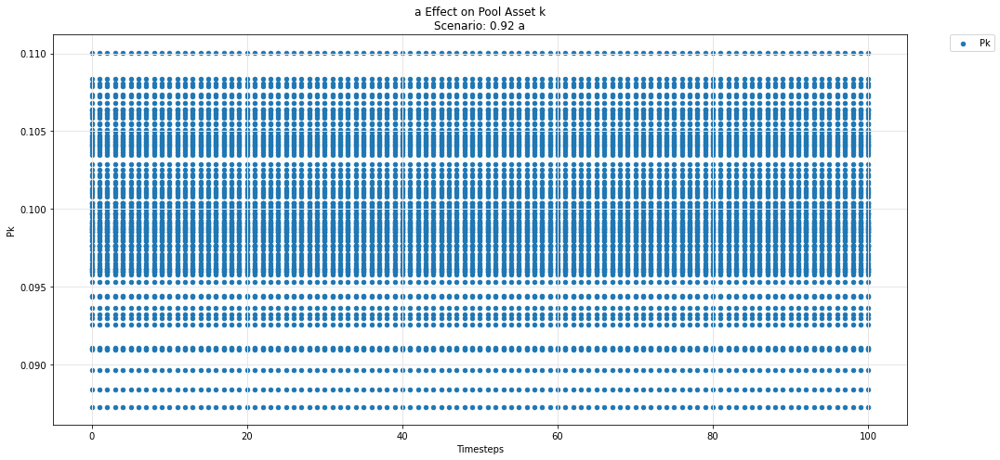

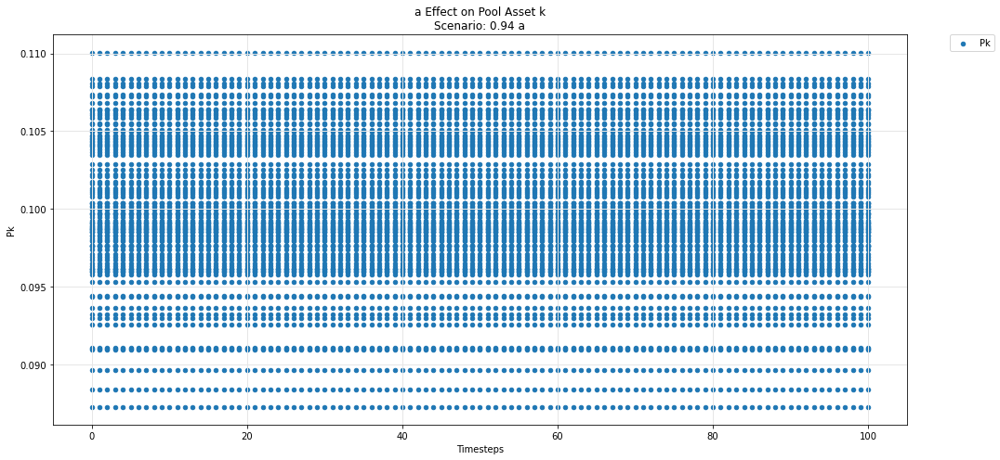

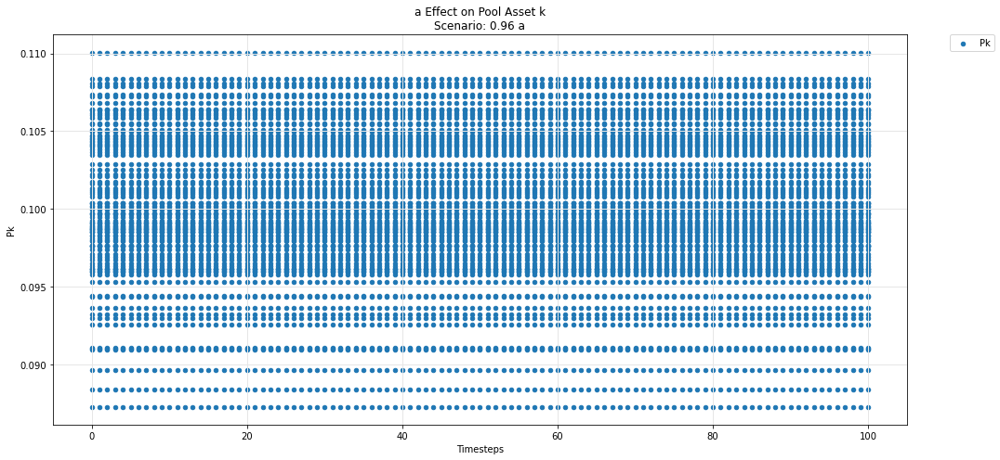

...

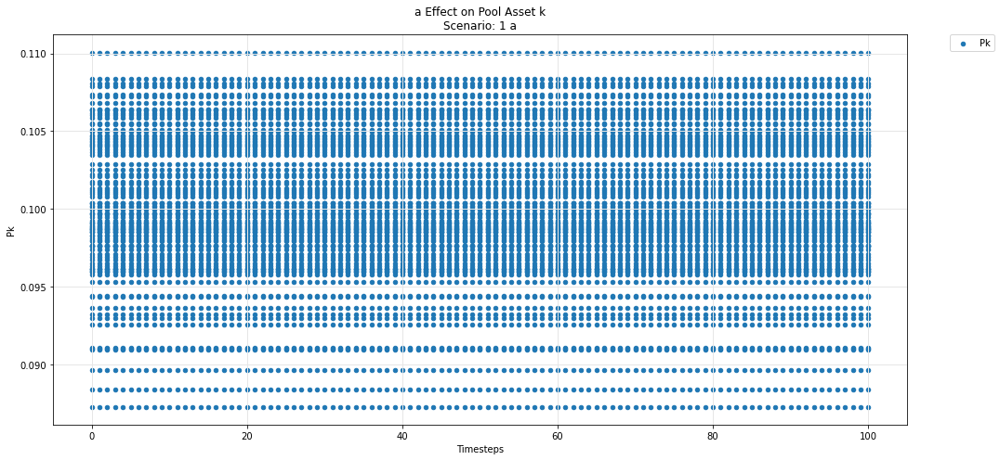

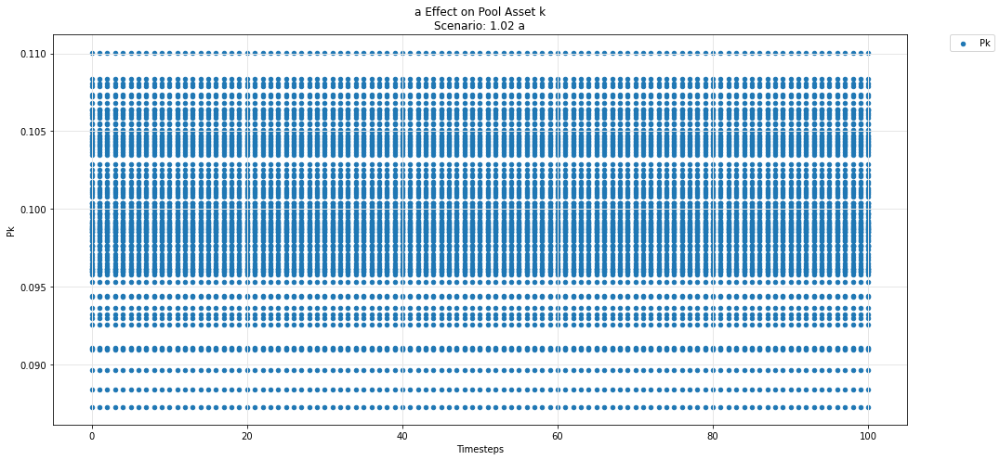

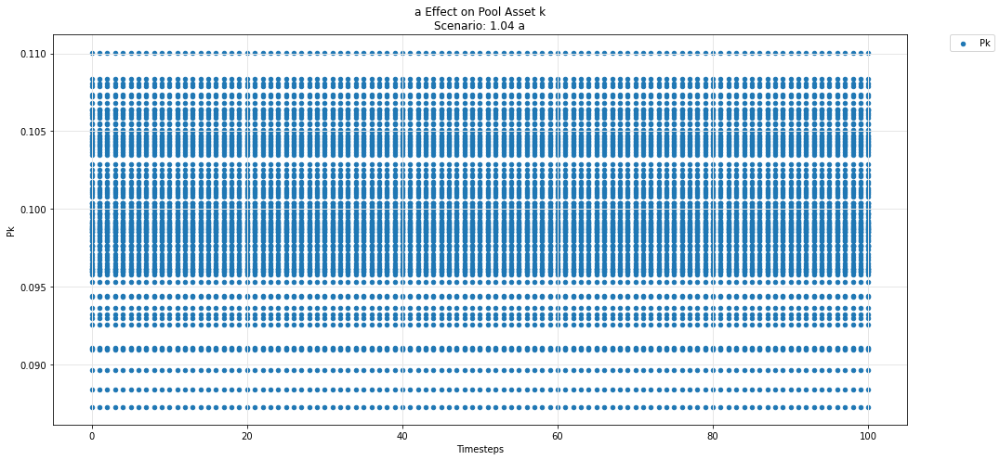

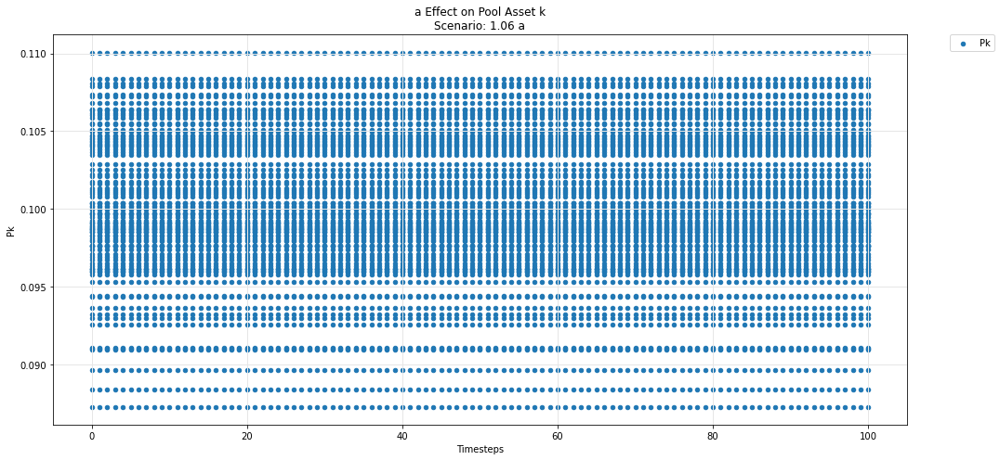

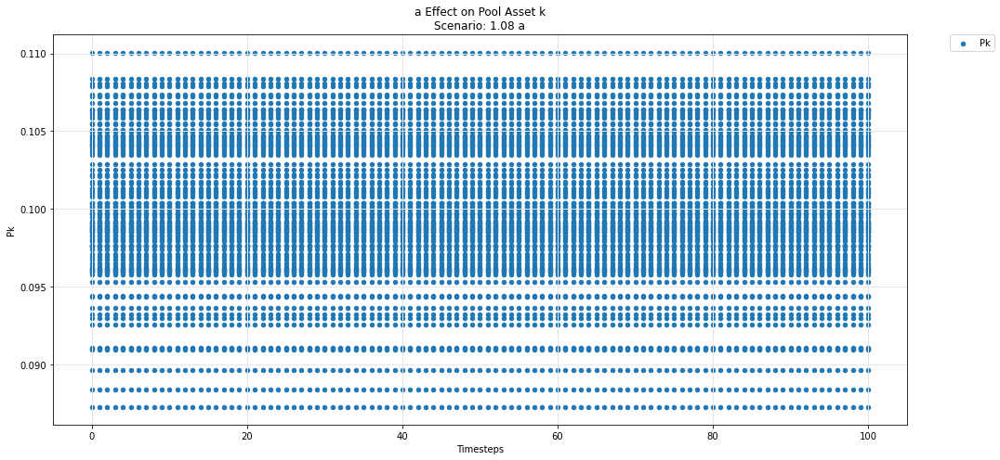

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')